In [29]:
import pandas as pd
from sklearn import preprocessing
import numpy as np
import git

import torch as t
from torch.utils.data import Dataset, DataLoader
import torch.nn as nn
from torch.utils.tensorboard import SummaryWriter
from torch.utils import tensorboard
from poutyne.framework import Model

from sklearn.metrics import confusion_matrix, recall_score, precision_score


import datetime
import time
from tqdm import tqdm

from pathlib import Path
import os.path

from itertools import product

t.manual_seed(5)
np.random.seed(12)

In [30]:
#Check cuda avilability
t.cuda.device_count()
t.cuda.get_device_name(0)
t.cuda.is_available()

True

In [31]:
#Setting the device

device = t.device("cuda" if t.cuda.is_available() else "cpu")#Uncomment this if you have a GPU that PyTorch supports
# device=t.device("cpu")#UNcomment this if you only have a CPU or a GPU not supported by PyTorch

## Data processing and loading

In [32]:
# #Setting default path
# cd "./home/rahulmoozhikkal/Desktop/ML1/"

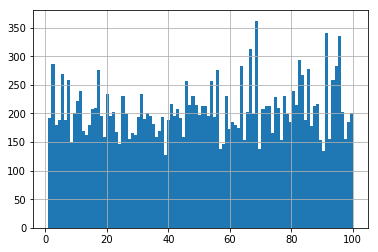

In [33]:
path="./data/pred_maintenance/Turbofan_ Engine_ Degradation/"

#Train data
train_data1=pd.read_csv(f'{path}PM_train.txt',sep=" ", header=None)
train_data1.drop(train_data1.columns[[26,27]],axis=1,inplace=True)

train_data1.columns = ['id', 'cycle', 'setting1', 'setting2', 'setting3', 's1', 's2', 's3',
                    's4', 's5', 's6', 's7', 's8', 's9', 's10', 's11', 's12', 's13', 's14',
                    's15', 's16', 's17', 's18', 's19', 's20', 's21']

#Create extra column for cycle_norm also for the train data
train_data1['cycle_norm'] = train_data1['cycle']

train_data1["id"].hist(bins=100)
# train_data1["id"].value_counts().sort_index()
RUL_train_data1=pd.DataFrame(train_data1.groupby("id")["cycle"].max()).reset_index()
RUL_train_data1.columns=["id","max_cycle"]
train_data1=train_data1.merge(RUL_train_data1,how="left",on=["id"])
train_data1["RUL"]=train_data1["max_cycle"]-train_data1["cycle"]
train_data1.drop(columns="max_cycle",inplace=True)

,0
0,112
1,98
2,69
3,82
4,91


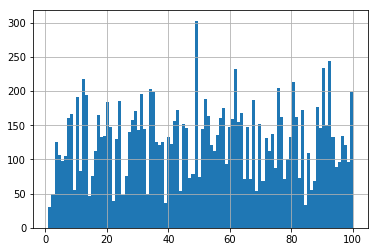

In [34]:

#Test data
test_data1=pd.read_csv(f'{path}PM_test.txt',sep=" ",header=None)
truth_df=pd.read_csv(f'{path}PM_truth.txt',sep=" ", header=None)

test_data1.drop(labels=[26,27],axis=1,inplace=True)
test_data1.columns = ['id', 'cycle', 'setting1', 'setting2', 'setting3', 's1', 's2', 's3',
                    's4', 's5', 's6', 's7', 's8', 's9', 's10', 's11', 's12', 's13', 's14',
                    's15', 's16', 's17', 's18', 's19', 's20', 's21']

test_data1["id"].hist(bins=100)

truth_df.drop(labels=1,axis=1,inplace=True)
truth_df.head()

In [35]:
#Labeling train data
w1=30
w0=15


train_data1["label1"]=np.where(train_data1["RUL"]<=w1,1,0)
train_data1["label2"]=train_data1["label1"]
train_data1.loc[train_data1["RUL"] <= w0,"label2"]=2

#Defining the data for easy reference for future callback
train_data_pre=train_data1.copy()
test_data_pre=test_data1.copy()
truth_pre_df=truth_df.copy()

In [36]:
#Define the training mode
# train_mod="class"

#Options
#1."Class"
#2."reg"


#Define the label (the column name in which you want to train)

#Options are 

#Classification        #Regression

#1-"label1"             "RUL"
#2-"label2"

# y_label="label1"

In [37]:
str1="RUL "


if str1=="RUL":
    print(True)

In [38]:
def data_process(train_data,test_data,truth_df,y_label):
    

    train_data1=train_data
    test_data1=test_data
    truth_df=truth_df

    #Data_processing
    seq_len=50;

    #Normalise the data
    # MinMax normalization
    norm_cols=train_data1.columns.difference(["id","cycle","label1","label2"])


    if y_label == "RUL":

        #RUL normalisation for regression
        RUL_scal=preprocessing.MinMaxScaler()
        RUL_scal.fit(train_data1[["RUL","RUL","RUL"]])
 
        
    else:
        
        RUL_scal=None
    
    #Min-max scaling
    min_max_scaler=preprocessing.MinMaxScaler()
    norm_train_data1=pd.DataFrame(min_max_scaler.fit_transform(train_data1[norm_cols]),columns=norm_cols,index=train_data1.index)
    temp_df=norm_train_data1.join(train_data1[train_data1.columns.difference(norm_cols)])
    train_data1=temp_df.reindex(columns=train_data1.columns)
    train_data1.head(5)

    test_data1['cycle_norm'] = test_data1['cycle']

    # Generate column max for test data
    rul = pd.DataFrame(test_data1.groupby('id')['cycle'].max()).reset_index()
    rul.columns = ['id', 'max']

    truth_df.columns = ['more']
    truth_df['id'] = truth_df.index + 1
    truth_df['max'] = rul['max'] + truth_df['more']
    truth_df.drop('more', axis=1, inplace=True)

    #Calculate RUL for test data
    test_data1=test_data1.merge(truth_df,how="left",on="id")
    test_data1["RUL"]=test_data1["max"]-test_data1["cycle"]
    test_data1.drop("max",axis=1,inplace=True)

    #Labeling for test data
    test_data1["label1"]=np.where(test_data1["RUL"]<=w1,1,0)
    test_data1["label2"]=test_data1["label1"]
    test_data1.loc[test_data1["RUL"]<=w0,"label2"]=2

    norm_test_data1=pd.DataFrame(min_max_scaler.transform(test_data1[norm_cols]),columns=norm_cols,index=test_data1.index)
    temp_df=norm_test_data1.join(test_data1[test_data1.columns.difference(norm_cols)])
    test_data1=temp_df.reindex(columns=test_data1.columns)


    return train_data1,test_data1,RUL_scal

In [39]:
#Define inputs needed for generating the sequence
#This is needed to make the input in the form of (sequence_length,batch, input_size)


def gen_sequence(train_data,test_data,y_label,seq_len):
    
    train_data1=train_data
    test_data1=test_data
    
    #Defining the columns to be used for training
    sen_cols=["s"+str(i) for i in range(1,22)]
    seq_cols=['setting1', 'setting2', 'setting3', 'cycle_norm']
    seq_cols.extend(sen_cols)

    #Generate sequences
    def gen_seq(id_df,seq_len,seq_cols):
        data_arr=id_df[seq_cols].values
        num_elem=data_arr.shape[0]

        for start,stop in zip(range(0,num_elem-seq_len),range(seq_len,num_elem)):
            yield data_arr[start:stop,:]
            
    #Generate labels
    def gen_labels(id_df,seq_len,seq_lab):

        data_arr=id_df[seq_lab].values
        num_elem=data_arr.shape[0]

        return data_arr[seq_len:num_elem,:]

    #Sequence generator for better memory handling
    train_seq_gen=(list(gen_seq(train_data1[train_data1["id"]==id],seq_len,seq_cols)) for id in train_data1["id"].unique())
    # test_seq_gen=(list(gen_seq(test_data1[test_data1["id"]==id],seq_len,seq_cols)) for id in test_id_in)

    #Convert sequence to numpy array for use in PyTorch
    train_seq_arr=np.concatenate(list(train_seq_gen)).astype(np.float32)
    
    
    seq_lab=[y_label]
    train_lab_gen=[gen_labels(train_data1[train_data1["id"]==id],seq_len,seq_lab) for id in train_data1["id"].unique()]
    train_lab_arr=np.concatenate(list(train_lab_gen)).astype(np.float32)
    
    
    #Test data sequence preparation
    
    #Remove IDs from test data which have less than 50 in a particular id

    test_id=pd.pivot_table(test_data1,index=["id"],aggfunc={"id":np.count_nonzero})
    test_id.columns=["count"]
    test_id=test_id[test_id["count"]>=seq_len]
    test_id_in=test_id.index
       
    #Make input array
    seq_array_test_last=[test_data1[test_data1["id"]==id][seq_cols].values[-seq_len:] for id in test_id_in]
    seq_array_test_last = np.asarray(seq_array_test_last).astype(np.float32)


    #Make test array labels
    test_last_lab_gen=[test_data1[test_data1["id"]==id][seq_lab].values[-1] for id in test_id_in]
    test_last_lab_arr=np.asarray(test_last_lab_gen).astype(np.float32)
    
    return train_seq_arr,train_lab_arr,seq_array_test_last,test_last_lab_arr

In [40]:
#Define dataloader
class PredMaintDataset(Dataset):
    
    def __init__(self,data_arr,lab_arr,seq_len):
        
        self.len=len(lab_arr)
        self.iter=0
        
        #Conversion to tensors from numpy arrays
        self.x_data=t.from_numpy(data_arr).to(device)
        
        self.label=t.from_numpy(lab_arr).to(device)
        
    def __len__(self):
        return self.len
    
    def __getitem__(self,index):
        return self.x_data[index,:,:],self.label[index]

In [41]:
#Defining test,valid and training data for dataloader

def dataloader(train_data_pre,test_data_pre,truth_df,ylabel,seq_len,train_batch_size,val_split):
    
    def train_valid_split(inp_data,val_split,axis=0): 
        train_len=np.int(np.floor(inp_data.shape[axis]-np.floor(val_split*inp_data.shape[axis])))
        train_data,valid_data=inp_data[0:train_len],inp_data[train_len:]
        return train_data,valid_data
    
    train_data, test_data,RUL_scal=data_process(train_data_pre,test_data_pre,truth_df,ylabel)
    train_seq_arr,train_lab_arr,seq_array_test_last,test_last_lab_arr=gen_sequence(train_data, test_data,ylabel,seq_len)
    
    x_train,x_valid=train_valid_split(train_seq_arr,val_split)
    y_train,y_valid=train_valid_split(train_lab_arr,val_split)
#     print(f"x_train_shape={x_train.shape[0]}")

    train_pred_dataset=PredMaintDataset(x_train,y_train,seq_len=seq_len)
    train_loader=DataLoader(dataset=train_pred_dataset,batch_size=train_batch_size)

    valid_pred_dataset=PredMaintDataset(x_valid,y_valid,seq_len=seq_len)
    valid_loader=DataLoader(dataset=valid_pred_dataset,batch_size=y_valid.shape[0])

    test_pred_dataset=PredMaintDataset(seq_array_test_last,test_last_lab_arr,seq_len=seq_len)
    test_loader=DataLoader(dataset=test_pred_dataset,batch_size=test_last_lab_arr.shape[0])  
    
    return train_loader,valid_loader, test_loader,RUL_scal

In [42]:
# train_batch_size=200

#Uncomment below code section if you want to use full data for training ()

train_batch_size=200
# train_batch_size=14850 #if you want to use all the data (for 0.05 valid split)

val_split=0.05
seq_len=50

train_class_loader,valid_class_loader,test_class_loader,RUL_scal=dataloader(train_data_pre,test_data_pre,truth_df.copy(),"label1",seq_len,train_batch_size,val_split)

train_reg_loader,valid_reg_loader,test_reg_loader,RUL_scal=dataloader(train_data_pre,test_data_pre,truth_df.copy(),"RUL",seq_len,train_batch_size,val_split)

/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/data.py:334: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)
/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/data.py:334: DataConversionWarning: Data with input dtype int64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)
/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/data.py:334: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


## Modelling

### LSTM module Implementation

In [43]:
model_set=False

if model_set:
    
    #Modelling an LSTM

    input_size_l1=25#seq_arr.shape[2]
    hidden_size_l1=100

    input_size_l2=100#hidden_size_l1
    hidden_size_l2=50

    #Hidden size list
    hid_siz_list=[hidden_size_l1,hidden_size_l2]

    output_size=test_last_lab_arr.shape[1]

    num_layers=3
    

    class PredLSTM(nn.Module):
        def __init__(self,inp_size,hid_siz_list,out_siz,num_layers,seq_len):
            super().__init__()     

            self.inp_size=inp_size
            self.hid_siz_list=hid_siz_list
            self.out_siz=out_siz
            self.num_layers=num_layers
            self.seq_len=seq_len


            self.lstm1=nn.LSTM(self.inp_size,self.hid_siz_list[0])
    #                 self.NN_layers.append(nn.Dropout(p=0.2))

            self.lstm2=nn.LSTM(self.hid_siz_list[0],self.hid_siz_list[1])
    #                 self.NN_layers.append(nn.Dropout(p=0.2))

            self.lin=nn.Linear(self.hid_siz_list[1],self.out_siz)

            self.drp=nn.Dropout(0.2)

            self.sigm=nn.Sigmoid()



        def forward(self,x):

            hn1,(h1,_)=self.lstm1(x.view(self.seq_len,-1,self.inp_size))
    #         h1.detach_()
    #         c1.detach_()

            hn1=self.drp(hn1)

            _,(h2,_)=self.lstm2(hn1)
    #         h2.detach_()
    #         c2.detach_()  

            h2=self.drp(h2)

            out=self.lin(h2)

            out=self.sigm(out)

            return out

In [44]:
train_set=False
if train_set:

    model_LSTMmod=PredLSTM(inp_size=input_size_l1,hid_siz_list=hid_siz_list,out_siz=1,num_layers=3,seq_len=seq_len)

### LSTM Cell implementation

In [45]:
#Modelling an LSTM using LSTMCell

class PredLSTMCell(nn.Module):
    
    def __init__(self,inp_size,hid_siz_list,out_siz,num_layers,seq_len,drp_lay, type_out):
        super().__init__()     
        
        #Model parameters
        self.inp_size=inp_size
        self.hid_siz_list=hid_siz_list
        self.out_siz=out_siz
        self.num_layers=num_layers
        self.seq_len=seq_len
        self.typ_out=type_out
        
        #Model architecture
        self.lstm1=nn.LSTMCell(self.inp_size,self.hid_siz_list[0])

        self.lstm2=nn.LSTMCell(self.hid_siz_list[0],self.hid_siz_list[1])
        
        self.lin=nn.Linear(self.hid_siz_list[1],self.out_siz)
        
        self.drp1=nn.Dropout(drp_lay[0])
        self.drp2=nn.Dropout(drp_lay[1])
        
        self.class_act=nn.Sigmoid()
        
        self.reg_act=nn.ReLU()
        
        self.init_model()
    
    def init_model(self):
        
        for name, param in self.named_parameters():
    #         print(f"Name of layer={name},parameter={param}")
            if "bias" in name:
                nn.init.constant_(param,0)
#                 print(f"Name of layer={name},Bias (constant init),Weight of layer={param}")
            
            elif any (x in name for x in ["weight_ih","lin"]):
                nn.init.xavier_uniform_(param)
#                 print(f"Name of layer={name},Weight_ih(Xavier init),Weight of layer={param}")
                    
            elif f"weight_hh" in f"{name}":
                nn.init.orthogonal_(param)
#                 print(f"Name of layer={name},Weight_hh(Orthogonal init,Weight of layer={param}")
        
        print(f"Input Weights initialised as per Xavier uniform and Hidden weights as per orthogonal")  
        print(f"Biases initialised to zero")
        
    def forward(self,x):
        
        h1 = t.zeros(x.size(0), self.hid_siz_list[0]).to(device)
        c1 = t.zeros(x.size(0), self.hid_siz_list[0]).to(device)
        h2 = t.zeros(x.size(0), self.hid_siz_list[1]).to(device)
        c2 = t.zeros(x.size(0), self.hid_siz_list[1]).to(device)
    
        for i,inp_t in enumerate(x.chunk(x.size(1),dim=1)):
            h1,c1=self.lstm1(inp_t.view(-1,self.inp_size),(h1,c1))
            
            if i!=x.size(1)-1:
                h2,c2=self.lstm2(h1,(h2,c2))
            else:
                h2,c2=self.lstm2(self.drp1(h1),(h2,c2))
            
        h2=self.drp2(h2)
        
        out=self.lin(h2)
        
        if self.typ_out=="class":
            out=self.class_act(out)
        elif self.typ_out=="reg":
            out=self.reg_act(out)
            
        return out

## Training

#### General function and basic log settings

In [46]:
#Metric

def class_metric_calc(data_loader,model,print_out):
    
    model.eval()
    
    x_inputs,y=next(iter(data_loader))
    y_pred=model.forward(x_inputs)
    
    #Compute and print loss
    
    loss_calc=criterion(y_pred.view(-1,1),y)
    

    TP=t.mul(y_pred.round().reshape(-1)==1,y.reshape(-1)==1).sum()
    TN=t.mul(y_pred.round().reshape(-1)==0,y.reshape(-1)==0).sum()
    
    NP=y[y==1].shape[0]
    NN=y[y==0].shape[0]
                
        
    acc=100*t.eq(y_pred.round(),y).sum()/y.shape[0]
    
    if (TP+NN-TN)!=0:
        prec=100*TP/(TP+NN-TN)
    else:
        prec=0
    
    if NP!=0:
        rec=100*TP/NP
    else:
        rec=0
        
    if NN!=0:
        spec=100*TN/NN
    else:
        spec=0
        
    if print_out:
        
        print(f"\nNumber of positives in the label={NP}, Predicted as positive and is actually positive={TP}\
            \nNumber of negatives in the label={NN}, Predicted as negative and is actually negative={TN}")
        
        
        
        print(f"loss={loss_calc.item()}\
                \n\nAccuracy(fraction of pos and neg predicted correctly)={acc:.2f}%\
                \nRecall(fraction of pos predicted correctly)={rec:.2f}% \
                \nPrecision(fraction of TP in all predicted as positives)={prec:.2f}%\
                \nSpecificity(fraction of neg predicted correctly)={spec:.2f}%")

    return acc,rec,prec,spec,loss_calc

In [47]:
# class_metric_calc(valid_class_loader,model_LSTMcell_class,True)

In [48]:
#Metric

def reg_metric_calc(data_loader,model,RUL_scal):
    
    model.eval()
    
    x_inputs,y=next(iter(data_loader))
#     print(f"x={x_inputs}")
    y_pred=model.forward(x_inputs)
    loss_calc=criterion(y_pred.view(-1,1),y)
                        
    #Outputs
    np_y_pred=y_pred.reshape(-1).data.numpy()
    np_y=y.reshape(-1).data.numpy()

    abs_val_diff=np.abs(np_y_pred-np_y)
    per_val_diff=100*abs_val_diff/np_y
    
    print(f"loss={loss_calc.item()}\n")
    
    reg_df=pd.DataFrame({"Predicted_RUL":np_y_pred,"True_RUL":np_y,\
                         "Absolute_val_diff":abs_val_diff,"Percentage_val_diff":per_val_diff},index=np.arange(len(y)))
    
    scal_df_data=RUL_scal.inverse_transform(reg_df[["Predicted_RUL","True_RUL","Absolute_val_diff"]])
    scal_df=pd.DataFrame(scal_df_data,columns=["Predicted_RUL","True_RUL","Absolute_val_diff"])
    
    
    reg_df.drop(labels=["Predicted_RUL","True_RUL","Absolute_val_diff"],axis=1,inplace=True)
    out=scal_df.join(reg_df,how="left")
    
    return out

### Train-LSTM Module 

In [49]:
def mod_train_func(model,train_loader,valid_loader,num_epochs,stop_train):
    glob_iter=0
    for epoch in range(num_epochs):
        

        for i,data in enumerate(train_loader):

            x_inputs,y=data

            glob_iter+=1
            
            y_pred=model.forward(x_inputs.view(seq_len,-1,input_size_l1))

            loss=criterion(y_pred.view(-1,1),y)
            
            optimizer.zero_grad()       
            loss.backward()
            optimizer.step() 
            
            if i%50==0 or i==len(train_loader)-2:
                print("\n*****************Train data metrics************************\n")
                print(f"Epoch={epoch},Iteration={i}")
                metric_calc(train_loader,model)
                print("\n*****************Valid data metrics************************\n")
                print(f"Epoch={epoch},Iteration={i}")
                val_acc,val_rec,val_prec,val_spec,_,_= metric_calc(valid_loader,model)

In [50]:
#Training
train_set=0

if train_set:
   
    num_epochs=50
    criterion=nn.BCELoss()
    optimizer = t.optim.Adam(params=model_LSTMmod.parameters())
    stop_train=[95, 95, 95]
    
    mod_train_func(model_LSTMmod,train_loader,valid_loader,num_epochs,stop_train)

### Train-LSTM Cell 

#### Classification

In [51]:
#Add cuda support for tensors

def class_cell_train_func(model,loss_fun,optimizer,lear_rate,num_epochs,train_loader,valid_loader,stop_train,log_set):
    glob_iter=0
    
    #Defining the logging 
    
    if log_set:
    
        log_dir_base=f"./Logs/Tensorboard/"
        act_fin=str(model.class_act).replace("()","")
        t_pre=datetime.datetime.now().strftime("%d-%b-%y_%H:%M:%S")
        inst_name=f'{t_pre}_class_{model.__class__.__name__}_LSTM1_{model.hid_siz_list[0]}_DRP1_{model.drp1.__dict__["p"]}_LSTM2_{model.hid_siz_list[1]}_DRP2_{str(model.drp2.__dict__["p"])}_LIN_ACT_{str(model.class_act).replace("()","")}_lr_{lear_rate}_seq_ln_{model.seq_len}_stp_acc_rec_{stop_train[0]}_{stop_train[1]}'
        
        log_dir_class=f"{log_dir_base}{inst_name}"
        
        writer=SummaryWriter(log_dir_class)
    
    for epoch in range(num_epochs):
        
        t_start=datetime.datetime.now()
        print(f'\nStarting Epoch={epoch}/{num_epochs} @ {t_start.strftime("%d-%b-%y_%H:%M:%S")}')
        
        
#         train_loss=0
#         train_acc=0
#         train_rec=0
#         train_prec=0
#         train_spec=0
        
        
        
#         met_bunch=t.Tensor([train_acc,train_rec,train_prec,train_spec],dtype=t.float32).to(device)
        train_loss=t.tensor(0,dtype=t.float32).to(device)
        met_bunch=t.tensor([0,0,0,0],dtype=t.float32).to(device)
        
        glob_cnt=0
        
        for i,data in enumerate(train_loader):
            
            model.train()
            
            optimizer.zero_grad()
            x_inputs,y=data

            y_pred_train=model.forward(x_inputs)
            loss=loss_fun(y_pred_train.view(-1,1),y)

            loss.backward()
            optimizer.step()            

            
            train_it_acc,train_it_rec,train_it_prec,train_it_spec,_=class_metric_calc(train_loader,model,False)
            met_it_bunch=t.tensor([train_it_acc,train_it_rec,train_it_prec,train_it_spec],dtype=t.float32).to(device)
            
            num_items=y.shape[0]
            
            train_loss+=loss.data

            met_bunch=((glob_cnt*met_bunch)+ met_it_bunch*num_items)/(glob_cnt+num_items)
                       
            glob_cnt+=num_items
                    
        t_fin=datetime.datetime.now()
        t_diff=(t_fin-t_start)
        print(f'Finished epoch={epoch}/{num_epochs}@ {t_fin.strftime("%d-%b-%y_%H:%M:%S")}')
        print(f'Epoch run time = {t_diff.seconds}s')
        
        print("\n*****************Train data metrics************************\n")

        print(f"Epoch loss={train_loss:.6f}\
            \n\nAccuracy(fraction of pos and neg predicted correctly)={met_bunch[0]:.2f}%\
            \nRecall(fraction of pos predicted correctly)={met_bunch[1]:.2f}% \
            \nPrecision(fraction of TP in all predicted as positives)={met_bunch[2]:.2f}%\
            \nSpecificity(fraction of neg predicted correctly)={met_bunch[3]:.2f}%")
        
        
        print("\n*****************Valid data metrics************************\n")
        val_acc,val_rec,val_prec,val_spec,val_loss=class_metric_calc(valid_loader,model,True)

        #Logging for Tensorboard
        if log_set:
            
            writer.add_scalar(tag="Train Loss",scalar_value=train_loss,global_step=epoch)
            writer.add_scalar(tag="Train Accuracy",scalar_value=met_bunch[0],global_step=epoch)
            writer.add_scalar(tag="Train Recall",scalar_value=met_bunch[1],global_step=epoch)
            writer.add_scalar(tag="Train Precision",scalar_value=met_bunch[2],global_step=epoch)
            writer.add_scalar(tag="Train Specificity",scalar_value=met_bunch[3],global_step=epoch)

            writer.add_scalar(tag="Valid Loss",scalar_value=val_loss.item(),global_step=epoch)
            writer.add_scalar(tag="Valid Accuracy",scalar_value=val_acc,global_step=epoch)
            writer.add_scalar(tag="Valid Recall",scalar_value=val_rec,global_step=epoch)
            writer.add_scalar(tag="Valid Precision",scalar_value=val_prec,global_step=epoch)
            writer.add_scalar(tag="Valid Specificity",scalar_value=val_spec,global_step=epoch)      

        if val_acc> stop_train[0] and val_rec > stop_train[1]:
            return 

In [52]:
#Defining model space for experimentation

parameters_class=dict(
    seq_len_class=[50,25, 100, 200],
    
    lear_rate=[1e-3,1e-2,1e-1],
    num_epochs=[15,25],
    
    input_size_l1=[25],
    hidden_size_l1=[25,50,100],
    hidden_size_l2=[25,50,100],
    output_size=[1],
    drop_lay0=[0.1,0.2],
    drop_lay1=[0.1,0.2],
    )

param_class_val=[v for v in parameters_class.values()]

In [53]:
#Defining list of models to be created
ref_fil_df=pd.DataFrame(columns=["File_ID","Parameter_tuple"])
cnt=1

for (seq_len_class,lear_rate,num_epochs,input_size_l1,hidden_size_l1,hidden_size_l2,output_size,drop_lay0,drop_lay1) in product(*param_class_val):
    ref_fil_df=ref_fil_df.append({"File_ID":cnt,"Parameter_tuple":(seq_len_class,lear_rate,num_epochs,input_size_l1,hidden_size_l1,hidden_size_l2,output_size,drop_lay0,drop_lay1)},ignore_index=True)
    cnt+=1
    
ref_fil_df

,File_ID,Parameter_tuple
0,1,"(50, 0.001, 15, 25, 25, 25, 1, 0.1, 0.1)"
1,2,"(50, 0.001, 15, 25, 25, 25, 1, 0.1, 0.2)"
2,3,"(50, 0.001, 15, 25, 25, 25, 1, 0.2, 0.1)"
3,4,"(50, 0.001, 15, 25, 25, 25, 1, 0.2, 0.2)"
4,5,"(50, 0.001, 15, 25, 25, 50, 1, 0.1, 0.1)"
5,6,"(50, 0.001, 15, 25, 25, 50, 1, 0.1, 0.2)"
6,7,"(50, 0.001, 15, 25, 25, 50, 1, 0.2, 0.1)"
7,8,"(50, 0.001, 15, 25, 25, 50, 1, 0.2, 0.2)"
8,9,"(50, 0.001, 15, 25, 25, 100, 1, 0.1, 0.1)"
9,10,"(50, 0.001, 15, 25, 25, 100, 1, 0.1, 0.2)"


In [ ]:
#Classification training and logging

train_set=True
log_set=True


if train_set:

    start_in=True #Indicator for checking if this code is being run again
    cnt=1#For File ID numbers

    #Checking if log file list exists 
    path_class_mod_filname_df="./Logs/runs_filename/class_mod_filenames"

    #Initialisation for log file list
    total_list_df=ref_fil_df.copy()


    #File names to be added only if logging is True
    if log_set:

        if not os.path.isfile(path_class_mod_filname_df):

            class_mod_filname_df=pd.DataFrame(columns=["File_ID","Parameter_tuple","Completion Status"])
            total_list_df=ref_fil_df.copy()

        else:
            class_mod_filname_df=pd.read_pickle("./Logs/runs_filename/class_mod_filenames")
            cnt=len(class_mod_filname_df)+1
            total_list_df=ref_fil_df[ref_fil_df["File_ID"]>=cnt].copy()

    for (seq_len_class,lear_rate,num_epochs,input_size_l1,hidden_size_l1,hidden_size_l2,output_size,drop_lay0,drop_lay1) in total_list_df["Parameter_tuple"]:

        #Model parameters
        drp_lay=[drop_lay0,drop_lay1]
        hid_siz_list=[hidden_size_l1,hidden_size_l2]

        #Defining model and setting to correct device
        model_LSTMcell_class=PredLSTMCell(inp_size=input_size_l1,hid_siz_list=hid_siz_list,out_siz=output_size,num_layers=3,seq_len=seq_len_class,drp_lay=drp_lay,type_out="class")
        model_LSTMcell_class.to(device)

        #Parameters used for training
        optim_class = t.optim.Adam(params=model_LSTMcell_class.parameters(),lr=lear_rate)
        criterion=nn.BCELoss(reduction="mean")

    #     print(f"               (seq_len_class,lear_rate,num_epochs,input_size_l1,hidden_size_l1,hidden_size_l2,output_size,drop_lay0,drop_lay1) ")
        print(f"Training model={(seq_len_class,lear_rate,num_epochs,input_size_l1,hidden_size_l1,hidden_size_l2,output_size,drop_lay0,drop_lay1)}")
    #     print(seq_len_class,lear_rate,num_epochs,input_size_l1,hidden_size_l1,hidden_size_l2,output_size,drop_lay0,drop_lay1)

        stop_train=[95, 95, 95]

        #Calling training
        class_cell_train_func(model_LSTMcell_class,criterion,optim_class,lear_rate,num_epochs,train_class_loader,valid_class_loader,stop_train,log_set)

        if log_set:

            if start_in:
                print(f"Appending log file names from file ID ={cnt}\n")
                start_in=False  

            class_mod_filname_df=class_mod_filname_df.append({"File_ID":cnt,"Parameter_tuple":(seq_len_class,lear_rate,num_epochs,input_size_l1,hidden_size_l1,hidden_size_l2,output_size,drop_lay0,drop_lay1),"Completion Status":True},ignore_index=True)
            class_mod_filname_df.to_pickle("./Logs/runs_filename/class_mod_filenames")
            cnt+=1



Input Weights initialised as per Xavier uniform and Hidden weights as per orthogonal
Biases initialised to zero
Training model=(50, 0.1, 15, 25, 100, 50, 1, 0.2, 0.2)

Starting Epoch=0/15 @ 05-Aug-19_23:23:36
Finished epoch=0/15@ 05-Aug-19_23:23:40
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=39.866051            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.4987059235572815                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                

Finished epoch=8/15@ 05-Aug-19_23:24:27
Epoch run time = 6s

*****************Train data metrics************************

Epoch loss=38.707287            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.49980801343917847                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Star

Finished epoch=1/15@ 05-Aug-19_23:25:17
Epoch run time = 6s

*****************Train data metrics************************

Epoch loss=38.550716            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.5998072028160095                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Start

Finished epoch=9/15@ 05-Aug-19_23:26:09
Epoch run time = 6s

*****************Train data metrics************************

Epoch loss=38.527149            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.5850085020065308                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Start

Finished epoch=2/15@ 05-Aug-19_23:27:01
Epoch run time = 6s

*****************Train data metrics************************

Epoch loss=38.818615            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.5614325404167175                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Start

Finished epoch=10/15@ 05-Aug-19_23:27:54
Epoch run time = 6s

*****************Train data metrics************************

Epoch loss=38.876453            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.5655569434165955                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Star

Finished epoch=3/15@ 05-Aug-19_23:28:46
Epoch run time = 6s

*****************Train data metrics************************

Epoch loss=40.523987            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.630579948425293                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Starti

Finished epoch=11/15@ 05-Aug-19_23:29:40
Epoch run time = 7s

*****************Train data metrics************************

Epoch loss=40.566727            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.6318308711051941                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Star

Finished epoch=4/15@ 05-Aug-19_23:30:37
Epoch run time = 7s

*****************Train data metrics************************

Epoch loss=39.425442            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.5567255020141602                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Start

Finished epoch=12/15@ 05-Aug-19_23:31:34
Epoch run time = 7s

*****************Train data metrics************************

Epoch loss=39.581699            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.5522118210792542                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Star

Finished epoch=5/25@ 05-Aug-19_23:32:25
Epoch run time = 6s

*****************Train data metrics************************

Epoch loss=13.390222            

Accuracy(fraction of pos and neg predicted correctly)=94.56%            
Recall(fraction of pos predicted correctly)=66.08%             
Precision(fraction of TP in all predicted as positives)=99.62%            
Specificity(fraction of neg predicted correctly)=99.91%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=119            
Number of negatives in the label=626, Predicted as negative and is actually negative=606
loss=0.17164622247219086                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=76.00%                 
Precision(fraction of TP in all predicted as positives)=85.00%                
Specificity(fraction of neg predicted correctly)=96.00%



Finished epoch=13/25@ 05-Aug-19_23:33:14
Epoch run time = 6s

*****************Train data metrics************************

Epoch loss=11.108165            

Accuracy(fraction of pos and neg predicted correctly)=93.96%            
Recall(fraction of pos predicted correctly)=61.57%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=110            
Number of negatives in the label=626, Predicted as negative and is actually negative=621
loss=0.13661162555217743                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=70.00%                 
Precision(fraction of TP in all predicted as positives)=95.00%                
Specificity(fraction of neg predicted correctly)=99.00

Finished epoch=21/25@ 05-Aug-19_23:34:04
Epoch run time = 6s

*****************Train data metrics************************

Epoch loss=10.794181            

Accuracy(fraction of pos and neg predicted correctly)=93.71%            
Recall(fraction of pos predicted correctly)=60.06%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=107            
Number of negatives in the label=626, Predicted as negative and is actually negative=624
loss=0.15818826854228973                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=69.00%                 
Precision(fraction of TP in all predicted as positives)=98.00%                
Specificity(fraction of neg predicted correctly)=99.00

Finished epoch=4/25@ 05-Aug-19_23:34:54
Epoch run time = 6s

*****************Train data metrics************************

Epoch loss=12.730322            

Accuracy(fraction of pos and neg predicted correctly)=94.01%            
Recall(fraction of pos predicted correctly)=61.99%             
Precision(fraction of TP in all predicted as positives)=99.84%            
Specificity(fraction of neg predicted correctly)=99.96%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=107            
Number of negatives in the label=626, Predicted as negative and is actually negative=616
loss=0.22334031760692596                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=69.00%                 
Precision(fraction of TP in all predicted as positives)=91.00%                
Specificity(fraction of neg predicted correctly)=98.00%



Finished epoch=12/25@ 05-Aug-19_23:35:43
Epoch run time = 6s

*****************Train data metrics************************

Epoch loss=11.629503            

Accuracy(fraction of pos and neg predicted correctly)=93.29%            
Recall(fraction of pos predicted correctly)=57.62%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=102            
Number of negatives in the label=626, Predicted as negative and is actually negative=622
loss=0.1434098333120346                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=65.00%                 
Precision(fraction of TP in all predicted as positives)=96.00%                
Specificity(fraction of neg predicted correctly)=99.00%

Finished epoch=20/25@ 05-Aug-19_23:36:32
Epoch run time = 6s

*****************Train data metrics************************

Epoch loss=11.201542            

Accuracy(fraction of pos and neg predicted correctly)=93.67%            
Recall(fraction of pos predicted correctly)=60.08%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=91            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.16872887313365936                

Accuracy(fraction of pos and neg predicted correctly)=91.00%                
Recall(fraction of pos predicted correctly)=58.00%                 
Precision(fraction of TP in all predicted as positives)=100.00%                
Specificity(fraction of neg predicted correctly)=100.0

Finished epoch=3/25@ 05-Aug-19_23:37:22
Epoch run time = 6s

*****************Train data metrics************************

Epoch loss=12.286672            

Accuracy(fraction of pos and neg predicted correctly)=93.80%            
Recall(fraction of pos predicted correctly)=61.09%             
Precision(fraction of TP in all predicted as positives)=99.78%            
Specificity(fraction of neg predicted correctly)=99.95%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=121            
Number of negatives in the label=626, Predicted as negative and is actually negative=605
loss=0.17526081204414368                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=78.00%                 
Precision(fraction of TP in all predicted as positives)=85.00%                
Specificity(fraction of neg predicted correctly)=96.00%



Finished epoch=11/25@ 05-Aug-19_23:38:11
Epoch run time = 6s

*****************Train data metrics************************

Epoch loss=11.424279            

Accuracy(fraction of pos and neg predicted correctly)=93.56%            
Recall(fraction of pos predicted correctly)=59.49%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=107            
Number of negatives in the label=626, Predicted as negative and is actually negative=623
loss=0.14163734018802643                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=69.00%                 
Precision(fraction of TP in all predicted as positives)=97.00%                
Specificity(fraction of neg predicted correctly)=99.00

Finished epoch=19/25@ 05-Aug-19_23:39:01
Epoch run time = 6s

*****************Train data metrics************************

Epoch loss=11.309558            

Accuracy(fraction of pos and neg predicted correctly)=93.24%            
Recall(fraction of pos predicted correctly)=57.39%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=106            
Number of negatives in the label=626, Predicted as negative and is actually negative=623
loss=0.1576695591211319                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=68.00%                 
Precision(fraction of TP in all predicted as positives)=97.00%                
Specificity(fraction of neg predicted correctly)=99.00%

Finished epoch=2/25@ 05-Aug-19_23:39:50
Epoch run time = 6s

*****************Train data metrics************************

Epoch loss=13.508791            

Accuracy(fraction of pos and neg predicted correctly)=94.81%            
Recall(fraction of pos predicted correctly)=67.55%             
Precision(fraction of TP in all predicted as positives)=99.91%            
Specificity(fraction of neg predicted correctly)=99.97%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=100            
Number of negatives in the label=626, Predicted as negative and is actually negative=620
loss=0.17487870156764984                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=64.00%                 
Precision(fraction of TP in all predicted as positives)=94.00%                
Specificity(fraction of neg predicted correctly)=99.00%



Finished epoch=10/25@ 05-Aug-19_23:40:34
Epoch run time = 5s

*****************Train data metrics************************

Epoch loss=11.990849            

Accuracy(fraction of pos and neg predicted correctly)=93.37%            
Recall(fraction of pos predicted correctly)=58.08%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=101            
Number of negatives in the label=626, Predicted as negative and is actually negative=625
loss=0.14536616206169128                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=65.00%                 
Precision(fraction of TP in all predicted as positives)=99.00%                
Specificity(fraction of neg predicted correctly)=99.00

Finished epoch=18/25@ 05-Aug-19_23:41:17
Epoch run time = 5s

*****************Train data metrics************************

Epoch loss=12.818018            

Accuracy(fraction of pos and neg predicted correctly)=93.39%            
Recall(fraction of pos predicted correctly)=59.44%             
Precision(fraction of TP in all predicted as positives)=99.30%            
Specificity(fraction of neg predicted correctly)=99.82%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=125            
Number of negatives in the label=626, Predicted as negative and is actually negative=606
loss=0.14137831330299377                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=80.00%                 
Precision(fraction of TP in all predicted as positives)=86.00%                
Specificity(fraction of neg predicted correctly)=96.00%


Finished epoch=1/25@ 05-Aug-19_23:42:00
Epoch run time = 5s

*****************Train data metrics************************

Epoch loss=34.773064            

Accuracy(fraction of pos and neg predicted correctly)=86.45%            
Recall(fraction of pos predicted correctly)=18.28%             
Precision(fraction of TP in all predicted as positives)=25.11%            
Specificity(fraction of neg predicted correctly)=99.39%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=153            
Number of negatives in the label=626, Predicted as negative and is actually negative=545
loss=0.27329185605049133                

Accuracy(fraction of pos and neg predicted correctly)=89.00%                
Recall(fraction of pos predicted correctly)=98.00%                 
Precision(fraction of TP in all predicted as positives)=65.00%                
Specificity(fraction of neg predicted correctly)=87.00%



Finished epoch=9/25@ 05-Aug-19_23:42:44
Epoch run time = 5s

*****************Train data metrics************************

Epoch loss=14.824323            

Accuracy(fraction of pos and neg predicted correctly)=94.37%            
Recall(fraction of pos predicted correctly)=64.84%             
Precision(fraction of TP in all predicted as positives)=99.68%            
Specificity(fraction of neg predicted correctly)=99.92%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=103            
Number of negatives in the label=626, Predicted as negative and is actually negative=622
loss=0.20060913264751434                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=66.00%                 
Precision(fraction of TP in all predicted as positives)=96.00%                
Specificity(fraction of neg predicted correctly)=99.00%



Finished epoch=17/25@ 05-Aug-19_23:43:28
Epoch run time = 5s

*****************Train data metrics************************

Epoch loss=14.543063            

Accuracy(fraction of pos and neg predicted correctly)=94.42%            
Recall(fraction of pos predicted correctly)=65.28%             
Precision(fraction of TP in all predicted as positives)=99.52%            
Specificity(fraction of neg predicted correctly)=99.88%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=122            
Number of negatives in the label=626, Predicted as negative and is actually negative=610
loss=0.1718025803565979                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=78.00%                 
Precision(fraction of TP in all predicted as positives)=88.00%                
Specificity(fraction of neg predicted correctly)=97.00%



Finished epoch=0/25@ 05-Aug-19_23:44:12
Epoch run time = 5s

*****************Train data metrics************************

Epoch loss=25.614826            

Accuracy(fraction of pos and neg predicted correctly)=90.68%            
Recall(fraction of pos predicted correctly)=44.23%             
Precision(fraction of TP in all predicted as positives)=67.42%            
Specificity(fraction of neg predicted correctly)=99.53%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=120            
Number of negatives in the label=626, Predicted as negative and is actually negative=597
loss=0.18519122898578644                

Accuracy(fraction of pos and neg predicted correctly)=91.00%                
Recall(fraction of pos predicted correctly)=77.00%                 
Precision(fraction of TP in all predicted as positives)=80.00%                
Specificity(fraction of neg predicted correctly)=95.00%



Finished epoch=8/25@ 05-Aug-19_23:44:55
Epoch run time = 5s

*****************Train data metrics************************

Epoch loss=12.183577            

Accuracy(fraction of pos and neg predicted correctly)=93.66%            
Recall(fraction of pos predicted correctly)=59.71%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=114            
Number of negatives in the label=626, Predicted as negative and is actually negative=614
loss=0.15184925496578217                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=73.00%                 
Precision(fraction of TP in all predicted as positives)=90.00%                
Specificity(fraction of neg predicted correctly)=98.00%

Finished epoch=16/25@ 05-Aug-19_23:45:39
Epoch run time = 5s

*****************Train data metrics************************

Epoch loss=11.610310            

Accuracy(fraction of pos and neg predicted correctly)=92.97%            
Recall(fraction of pos predicted correctly)=56.05%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=107            
Number of negatives in the label=626, Predicted as negative and is actually negative=622
loss=0.13079355657100677                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=69.00%                 
Precision(fraction of TP in all predicted as positives)=96.00%                
Specificity(fraction of neg predicted correctly)=99.00

Finished epoch=24/25@ 05-Aug-19_23:46:22
Epoch run time = 5s

*****************Train data metrics************************

Epoch loss=11.235068            

Accuracy(fraction of pos and neg predicted correctly)=93.48%            
Recall(fraction of pos predicted correctly)=58.77%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=105            
Number of negatives in the label=626, Predicted as negative and is actually negative=625
loss=0.14522071182727814                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=67.00%                 
Precision(fraction of TP in all predicted as positives)=99.00%                
Specificity(fraction of neg predicted correctly)=99.00

Finished epoch=7/25@ 05-Aug-19_23:47:06
Epoch run time = 5s

*****************Train data metrics************************

Epoch loss=22.145048            

Accuracy(fraction of pos and neg predicted correctly)=89.63%            
Recall(fraction of pos predicted correctly)=38.08%             
Precision(fraction of TP in all predicted as positives)=91.96%            
Specificity(fraction of neg predicted correctly)=98.97%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=70            
Number of negatives in the label=626, Predicted as negative and is actually negative=606
loss=0.3171243369579315                

Accuracy(fraction of pos and neg predicted correctly)=86.00%                
Recall(fraction of pos predicted correctly)=45.00%                 
Precision(fraction of TP in all predicted as positives)=77.00%                
Specificity(fraction of neg predicted correctly)=96.00%

St

Finished epoch=15/25@ 05-Aug-19_23:47:49
Epoch run time = 5s

*****************Train data metrics************************

Epoch loss=24.719355            

Accuracy(fraction of pos and neg predicted correctly)=87.39%            
Recall(fraction of pos predicted correctly)=24.59%             
Precision(fraction of TP in all predicted as positives)=88.75%            
Specificity(fraction of neg predicted correctly)=98.84%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=79            
Number of negatives in the label=626, Predicted as negative and is actually negative=609
loss=0.25595027208328247                

Accuracy(fraction of pos and neg predicted correctly)=88.00%                
Recall(fraction of pos predicted correctly)=50.00%                 
Precision(fraction of TP in all predicted as positives)=82.00%                
Specificity(fraction of neg predicted correctly)=97.00%



Finished epoch=23/25@ 05-Aug-19_23:48:34
Epoch run time = 5s

*****************Train data metrics************************

Epoch loss=22.408430            

Accuracy(fraction of pos and neg predicted correctly)=89.24%            
Recall(fraction of pos predicted correctly)=33.80%             
Precision(fraction of TP in all predicted as positives)=97.23%            
Specificity(fraction of neg predicted correctly)=99.57%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=63            
Number of negatives in the label=626, Predicted as negative and is actually negative=618
loss=0.2839415371417999                

Accuracy(fraction of pos and neg predicted correctly)=87.00%                
Recall(fraction of pos predicted correctly)=40.00%                 
Precision(fraction of TP in all predicted as positives)=88.00%                
Specificity(fraction of neg predicted correctly)=98.00%

S

Finished epoch=6/25@ 05-Aug-19_23:49:20
Epoch run time = 5s

*****************Train data metrics************************

Epoch loss=14.708287            

Accuracy(fraction of pos and neg predicted correctly)=93.40%            
Recall(fraction of pos predicted correctly)=58.86%             
Precision(fraction of TP in all predicted as positives)=99.80%            
Specificity(fraction of neg predicted correctly)=99.95%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=126            
Number of negatives in the label=626, Predicted as negative and is actually negative=600
loss=0.16506725549697876                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=81.00%                 
Precision(fraction of TP in all predicted as positives)=82.00%                
Specificity(fraction of neg predicted correctly)=95.00%



Finished epoch=14/25@ 05-Aug-19_23:50:05
Epoch run time = 5s

*****************Train data metrics************************

Epoch loss=12.613422            

Accuracy(fraction of pos and neg predicted correctly)=93.48%            
Recall(fraction of pos predicted correctly)=58.93%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=95            
Number of negatives in the label=626, Predicted as negative and is actually negative=624
loss=0.20837728679180145                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=61.00%                 
Precision(fraction of TP in all predicted as positives)=97.00%                
Specificity(fraction of neg predicted correctly)=99.00%

Finished epoch=22/25@ 05-Aug-19_23:50:50
Epoch run time = 5s

*****************Train data metrics************************

Epoch loss=13.752587            

Accuracy(fraction of pos and neg predicted correctly)=92.47%            
Recall(fraction of pos predicted correctly)=52.60%             
Precision(fraction of TP in all predicted as positives)=99.57%            
Specificity(fraction of neg predicted correctly)=99.89%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=100            
Number of negatives in the label=626, Predicted as negative and is actually negative=623
loss=0.19554735720157623                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=64.00%                 
Precision(fraction of TP in all predicted as positives)=97.00%                
Specificity(fraction of neg predicted correctly)=99.00%


Finished epoch=5/25@ 05-Aug-19_23:51:37
Epoch run time = 5s

*****************Train data metrics************************

Epoch loss=39.686775            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.5012149214744568                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Start

Finished epoch=13/25@ 05-Aug-19_23:52:24
Epoch run time = 5s

*****************Train data metrics************************

Epoch loss=39.582996            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.5004451870918274                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Star

Finished epoch=21/25@ 05-Aug-19_23:53:11
Epoch run time = 5s

*****************Train data metrics************************

Epoch loss=39.677917            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.4992503821849823                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Star

Finished epoch=4/25@ 05-Aug-19_23:53:57
Epoch run time = 5s

*****************Train data metrics************************

Epoch loss=38.399792            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.5001149773597717                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Start

Finished epoch=12/25@ 05-Aug-19_23:54:44
Epoch run time = 5s

*****************Train data metrics************************

Epoch loss=38.041924            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.4983607232570648                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Star

Finished epoch=20/25@ 05-Aug-19_23:55:31
Epoch run time = 5s

*****************Train data metrics************************

Epoch loss=37.817921            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.4986817538738251                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Star

Finished epoch=3/25@ 05-Aug-19_23:56:18
Epoch run time = 5s

*****************Train data metrics************************

Epoch loss=39.804466            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.5732958316802979                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Start

Finished epoch=11/25@ 05-Aug-19_23:57:05
Epoch run time = 6s

*****************Train data metrics************************

Epoch loss=39.909676            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.5654807686805725                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Star

Finished epoch=19/25@ 05-Aug-19_23:57:55
Epoch run time = 6s

*****************Train data metrics************************

Epoch loss=39.813877            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.5687429904937744                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Star

Finished epoch=2/25@ 05-Aug-19_23:58:44
Epoch run time = 6s

*****************Train data metrics************************

Epoch loss=19.106112            

Accuracy(fraction of pos and neg predicted correctly)=94.33%            
Recall(fraction of pos predicted correctly)=65.26%             
Precision(fraction of TP in all predicted as positives)=96.86%            
Specificity(fraction of neg predicted correctly)=99.89%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=107            
Number of negatives in the label=626, Predicted as negative and is actually negative=614
loss=0.24502594769001007                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=69.00%                 
Precision(fraction of TP in all predicted as positives)=89.00%                
Specificity(fraction of neg predicted correctly)=98.00%



Finished epoch=10/25@ 05-Aug-19_23:59:34
Epoch run time = 6s

*****************Train data metrics************************

Epoch loss=13.792469            

Accuracy(fraction of pos and neg predicted correctly)=93.18%            
Recall(fraction of pos predicted correctly)=57.41%             
Precision(fraction of TP in all predicted as positives)=99.62%            
Specificity(fraction of neg predicted correctly)=99.91%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=112            
Number of negatives in the label=626, Predicted as negative and is actually negative=615
loss=0.14776746928691864                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=72.00%                 
Precision(fraction of TP in all predicted as positives)=91.00%                
Specificity(fraction of neg predicted correctly)=98.00%


Finished epoch=18/25@ 06-Aug-19_00:00:23
Epoch run time = 6s

*****************Train data metrics************************

Epoch loss=13.583202            

Accuracy(fraction of pos and neg predicted correctly)=93.46%            
Recall(fraction of pos predicted correctly)=58.96%             
Precision(fraction of TP in all predicted as positives)=99.84%            
Specificity(fraction of neg predicted correctly)=99.96%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=76            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.20234252512454987                

Accuracy(fraction of pos and neg predicted correctly)=89.00%                
Recall(fraction of pos predicted correctly)=49.00%                 
Precision(fraction of TP in all predicted as positives)=100.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Finished epoch=1/25@ 06-Aug-19_00:01:12
Epoch run time = 5s

*****************Train data metrics************************

Epoch loss=18.549007            

Accuracy(fraction of pos and neg predicted correctly)=93.70%            
Recall(fraction of pos predicted correctly)=61.36%             
Precision(fraction of TP in all predicted as positives)=87.45%            
Specificity(fraction of neg predicted correctly)=99.89%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=116            
Number of negatives in the label=626, Predicted as negative and is actually negative=603
loss=0.2329508662223816                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=74.00%                 
Precision(fraction of TP in all predicted as positives)=83.00%                
Specificity(fraction of neg predicted correctly)=96.00%

S

Finished epoch=9/25@ 06-Aug-19_00:02:00
Epoch run time = 5s

*****************Train data metrics************************

Epoch loss=11.858279            

Accuracy(fraction of pos and neg predicted correctly)=93.74%            
Recall(fraction of pos predicted correctly)=60.72%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=105            
Number of negatives in the label=626, Predicted as negative and is actually negative=623
loss=0.1968626081943512                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=67.00%                 
Precision(fraction of TP in all predicted as positives)=97.00%                
Specificity(fraction of neg predicted correctly)=99.00%


Finished epoch=17/25@ 06-Aug-19_00:02:48
Epoch run time = 5s

*****************Train data metrics************************

Epoch loss=12.067012            

Accuracy(fraction of pos and neg predicted correctly)=93.36%            
Recall(fraction of pos predicted correctly)=58.80%             
Precision(fraction of TP in all predicted as positives)=99.89%            
Specificity(fraction of neg predicted correctly)=99.97%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=99            
Number of negatives in the label=626, Predicted as negative and is actually negative=624
loss=0.1575937718153                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=63.00%                 
Precision(fraction of TP in all predicted as positives)=98.00%                
Specificity(fraction of neg predicted correctly)=99.00%

Star

Finished epoch=0/25@ 06-Aug-19_00:03:35
Epoch run time = 5s

*****************Train data metrics************************

Epoch loss=38.616051            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.4975703954696655                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Start

Finished epoch=8/25@ 06-Aug-19_00:04:23
Epoch run time = 5s

*****************Train data metrics************************

Epoch loss=37.812374            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.5003730654716492                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Start

Finished epoch=16/25@ 06-Aug-19_00:05:11
Epoch run time = 5s

*****************Train data metrics************************

Epoch loss=33.866497            

Accuracy(fraction of pos and neg predicted correctly)=86.83%            
Recall(fraction of pos predicted correctly)=18.88%             
Precision(fraction of TP in all predicted as positives)=31.34%            
Specificity(fraction of neg predicted correctly)=99.74%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.4986807405948639                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Sta

Finished epoch=24/25@ 06-Aug-19_00:05:58
Epoch run time = 5s

*****************Train data metrics************************

Epoch loss=37.795338            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.5008299946784973                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%
Input

Finished epoch=7/25@ 06-Aug-19_00:06:49
Epoch run time = 6s

*****************Train data metrics************************

Epoch loss=37.495224            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.4996585547924042                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Start

Finished epoch=15/25@ 06-Aug-19_00:07:40
Epoch run time = 6s

*****************Train data metrics************************

Epoch loss=37.501480            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.5000367760658264                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Star

Finished epoch=23/25@ 06-Aug-19_00:08:31
Epoch run time = 6s

*****************Train data metrics************************

Epoch loss=37.519001            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.5000735521316528                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Star

Finished epoch=6/25@ 06-Aug-19_00:09:22
Epoch run time = 6s

*****************Train data metrics************************

Epoch loss=37.552979            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.4999856650829315                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Start

Finished epoch=14/25@ 06-Aug-19_00:10:13
Epoch run time = 6s

*****************Train data metrics************************

Epoch loss=37.485107            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.49909090995788574                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Sta

Finished epoch=22/25@ 06-Aug-19_00:11:04
Epoch run time = 6s

*****************Train data metrics************************

Epoch loss=37.386276            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.49945005774497986                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Sta

Finished epoch=5/25@ 06-Aug-19_00:11:55
Epoch run time = 6s

*****************Train data metrics************************

Epoch loss=14.421164            

Accuracy(fraction of pos and neg predicted correctly)=93.94%            
Recall(fraction of pos predicted correctly)=63.51%             
Precision(fraction of TP in all predicted as positives)=98.37%            
Specificity(fraction of neg predicted correctly)=99.58%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=108            
Number of negatives in the label=626, Predicted as negative and is actually negative=615
loss=0.17512476444244385                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=69.00%                 
Precision(fraction of TP in all predicted as positives)=90.00%                
Specificity(fraction of neg predicted correctly)=98.00%



Finished epoch=13/25@ 06-Aug-19_00:12:47
Epoch run time = 6s

*****************Train data metrics************************

Epoch loss=11.809228            

Accuracy(fraction of pos and neg predicted correctly)=94.77%            
Recall(fraction of pos predicted correctly)=66.81%             
Precision(fraction of TP in all predicted as positives)=99.95%            
Specificity(fraction of neg predicted correctly)=99.99%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=107            
Number of negatives in the label=626, Predicted as negative and is actually negative=617
loss=0.15726059675216675                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=69.00%                 
Precision(fraction of TP in all predicted as positives)=92.00%                
Specificity(fraction of neg predicted correctly)=98.00%


Finished epoch=21/25@ 06-Aug-19_00:13:38
Epoch run time = 6s

*****************Train data metrics************************

Epoch loss=11.659932            

Accuracy(fraction of pos and neg predicted correctly)=94.46%            
Recall(fraction of pos predicted correctly)=65.17%             
Precision(fraction of TP in all predicted as positives)=99.78%            
Specificity(fraction of neg predicted correctly)=99.95%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=119            
Number of negatives in the label=626, Predicted as negative and is actually negative=611
loss=0.15124726295471191                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=76.00%                 
Precision(fraction of TP in all predicted as positives)=88.00%                
Specificity(fraction of neg predicted correctly)=97.00%


Finished epoch=4/25@ 06-Aug-19_00:14:29
Epoch run time = 6s

*****************Train data metrics************************

Epoch loss=37.846264            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.49974656105041504                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Star

Finished epoch=12/25@ 06-Aug-19_00:15:21
Epoch run time = 6s

*****************Train data metrics************************

Epoch loss=39.115639            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.5010360479354858                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Star

Finished epoch=20/25@ 06-Aug-19_00:16:12
Epoch run time = 6s

*****************Train data metrics************************

Epoch loss=38.097786            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.4995197653770447                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Star

Finished epoch=3/25@ 06-Aug-19_00:17:04
Epoch run time = 6s

*****************Train data metrics************************

Epoch loss=13.669885            

Accuracy(fraction of pos and neg predicted correctly)=94.41%            
Recall(fraction of pos predicted correctly)=65.42%             
Precision(fraction of TP in all predicted as positives)=99.73%            
Specificity(fraction of neg predicted correctly)=99.93%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=106            
Number of negatives in the label=626, Predicted as negative and is actually negative=614
loss=0.1967695653438568                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=68.00%                 
Precision(fraction of TP in all predicted as positives)=89.00%                
Specificity(fraction of neg predicted correctly)=98.00%

S

Finished epoch=11/25@ 06-Aug-19_00:17:51
Epoch run time = 5s

*****************Train data metrics************************

Epoch loss=12.252905            

Accuracy(fraction of pos and neg predicted correctly)=93.72%            
Recall(fraction of pos predicted correctly)=61.04%             
Precision(fraction of TP in all predicted as positives)=99.84%            
Specificity(fraction of neg predicted correctly)=99.96%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=100            
Number of negatives in the label=626, Predicted as negative and is actually negative=625
loss=0.1562945395708084                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=64.00%                 
Precision(fraction of TP in all predicted as positives)=99.00%                
Specificity(fraction of neg predicted correctly)=99.00%



Finished epoch=19/25@ 06-Aug-19_00:18:38
Epoch run time = 5s

*****************Train data metrics************************

Epoch loss=11.312142            

Accuracy(fraction of pos and neg predicted correctly)=93.36%            
Recall(fraction of pos predicted correctly)=57.52%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=105            
Number of negatives in the label=626, Predicted as negative and is actually negative=624
loss=0.1493627429008484                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=67.00%                 
Precision(fraction of TP in all predicted as positives)=98.00%                
Specificity(fraction of neg predicted correctly)=99.00%

Finished epoch=2/25@ 06-Aug-19_00:19:25
Epoch run time = 5s

*****************Train data metrics************************

Epoch loss=37.649776            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.49970853328704834                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Star

Finished epoch=10/25@ 06-Aug-19_00:20:12
Epoch run time = 5s

*****************Train data metrics************************

Epoch loss=37.339882            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.4990484416484833                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Star

Finished epoch=18/25@ 06-Aug-19_00:20:58
Epoch run time = 5s

*****************Train data metrics************************

Epoch loss=37.315117            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.49938222765922546                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Sta

Finished epoch=1/25@ 06-Aug-19_00:21:45
Epoch run time = 6s

*****************Train data metrics************************

Epoch loss=35.868092            

Accuracy(fraction of pos and neg predicted correctly)=85.10%            
Recall(fraction of pos predicted correctly)=7.74%             
Precision(fraction of TP in all predicted as positives)=8.82%            
Specificity(fraction of neg predicted correctly)=99.85%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.6828067302703857                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Starti

Finished epoch=9/25@ 06-Aug-19_00:22:34
Epoch run time = 6s

*****************Train data metrics************************

Epoch loss=39.055771            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.49844133853912354                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Star

Finished epoch=17/25@ 06-Aug-19_00:23:23
Epoch run time = 6s

*****************Train data metrics************************

Epoch loss=38.838909            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.499022901058197                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Start

Finished epoch=0/25@ 06-Aug-19_00:24:12
Epoch run time = 6s

*****************Train data metrics************************

Epoch loss=41.269798            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.5977079272270203                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Start

Finished epoch=8/25@ 06-Aug-19_00:25:01
Epoch run time = 6s

*****************Train data metrics************************

Epoch loss=38.601933            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.5797032713890076                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Start

Finished epoch=16/25@ 06-Aug-19_00:25:46
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=38.600464            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.5846219062805176                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Star

Finished epoch=24/25@ 06-Aug-19_00:26:22
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=38.645416            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.5831151008605957                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%
Input

Finished epoch=7/25@ 06-Aug-19_00:26:57
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=38.548519            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.5987473726272583                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Start

Finished epoch=15/25@ 06-Aug-19_00:27:33
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=38.619202            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.6034020185470581                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Star

Finished epoch=23/25@ 06-Aug-19_00:28:08
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=38.558281            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.6019232273101807                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Star

Finished epoch=6/25@ 06-Aug-19_00:28:44
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=39.724396            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.5026284456253052                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Start

Finished epoch=14/25@ 06-Aug-19_00:29:20
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=39.370953            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.49840667843818665                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Sta

Finished epoch=22/25@ 06-Aug-19_00:29:56
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=39.475548            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.49843597412109375                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Sta

Finished epoch=5/25@ 06-Aug-19_00:30:32
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=38.093296            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.4986332356929779                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Start

Finished epoch=13/25@ 06-Aug-19_00:31:09
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=37.926731            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.49863526225090027                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Sta

Finished epoch=21/25@ 06-Aug-19_00:31:44
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=37.903694            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.4982946813106537                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Star

Finished epoch=4/25@ 06-Aug-19_00:32:20
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=38.539024            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.5006508827209473                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Start

Finished epoch=12/25@ 06-Aug-19_00:32:56
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=38.423767            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.5009814500808716                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Star

Finished epoch=20/25@ 06-Aug-19_00:33:32
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=38.297199            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.4999408721923828                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Star

Finished epoch=3/25@ 06-Aug-19_00:34:07
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=37.897892            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.5007261633872986                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Start

Finished epoch=11/25@ 06-Aug-19_00:34:43
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=37.792160            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.50039142370224                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Starti

Finished epoch=19/25@ 06-Aug-19_00:35:19
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=37.806492            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.5004339814186096                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Star

Finished epoch=2/25@ 06-Aug-19_00:35:55
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=38.273441            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.4994852542877197                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Start

Finished epoch=10/25@ 06-Aug-19_00:36:30
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=38.296902            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.5007194876670837                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Star

Finished epoch=18/25@ 06-Aug-19_00:37:06
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=38.327953            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.4996941089630127                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Star

Finished epoch=1/25@ 06-Aug-19_00:37:42
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=38.006527            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.49849656224250793                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Star

Finished epoch=9/25@ 06-Aug-19_00:38:17
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=37.823559            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.5005055665969849                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Start

Finished epoch=17/25@ 06-Aug-19_00:38:53
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=37.780872            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.500322163105011                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Start

Finished epoch=0/25@ 06-Aug-19_00:39:29
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=39.030884            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.49962225556373596                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Star

Finished epoch=8/25@ 06-Aug-19_00:40:05
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=38.088535            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.498783677816391                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Starti

Finished epoch=16/25@ 06-Aug-19_00:40:41
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=38.117241            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.49858158826828003                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Sta

Finished epoch=24/25@ 06-Aug-19_00:41:16
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=38.058090            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.4984726309776306                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%
Input

Finished epoch=7/25@ 06-Aug-19_00:41:52
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=38.659676            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.4996381998062134                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Start

Finished epoch=15/25@ 06-Aug-19_00:42:28
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=38.656132            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.49966859817504883                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Sta

Finished epoch=23/25@ 06-Aug-19_00:43:04
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=38.707897            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.49932798743247986                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Sta

Finished epoch=6/25@ 06-Aug-19_00:43:39
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=39.192135            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.5006271600723267                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Start

Finished epoch=14/25@ 06-Aug-19_00:44:15
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=38.714272            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.4991627037525177                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Star

Finished epoch=22/25@ 06-Aug-19_00:44:51
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=38.813686            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.49983900785446167                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Sta

Finished epoch=5/25@ 06-Aug-19_00:45:26
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=38.702976            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.5705908536911011                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Start

Finished epoch=13/25@ 06-Aug-19_00:46:01
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=38.658554            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.5642993450164795                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Star

Finished epoch=21/25@ 06-Aug-19_00:46:37
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=38.818176            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.5640244483947754                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Star

Finished epoch=4/25@ 06-Aug-19_00:47:12
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=38.694496            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.6009042263031006                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Start

Finished epoch=12/25@ 06-Aug-19_00:47:48
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=38.722080            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.5907963514328003                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Star

Finished epoch=20/25@ 06-Aug-19_00:48:23
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=38.612255            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.59871906042099                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Starti

Finished epoch=3/25@ 06-Aug-19_00:48:59
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=39.040051            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.5580599904060364                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Start

Finished epoch=11/25@ 06-Aug-19_00:49:34
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=39.217400            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.5555508136749268                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Star

Finished epoch=19/25@ 06-Aug-19_00:50:10
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=39.121815            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.5537895560264587                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Star

Finished epoch=2/25@ 06-Aug-19_00:50:45
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=40.027569            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.5918920636177063                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Start

Finished epoch=10/25@ 06-Aug-19_00:51:21
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=40.389835            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.5962632298469543                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Star

Finished epoch=18/25@ 06-Aug-19_00:51:56
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=40.403236            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.5847854614257812                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Star

Finished epoch=1/15@ 06-Aug-19_00:52:32
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=18.217772            

Accuracy(fraction of pos and neg predicted correctly)=95.60%            
Recall(fraction of pos predicted correctly)=72.64%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=101            
Number of negatives in the label=626, Predicted as negative and is actually negative=609
loss=0.24115340411663055                

Accuracy(fraction of pos and neg predicted correctly)=90.00%                
Recall(fraction of pos predicted correctly)=65.00%                 
Precision(fraction of TP in all predicted as positives)=85.00%                
Specificity(fraction of neg predicted correctly)=97.00%

Finished epoch=9/15@ 06-Aug-19_00:53:08
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=6.784108            

Accuracy(fraction of pos and neg predicted correctly)=98.16%            
Recall(fraction of pos predicted correctly)=96.17%             
Precision(fraction of TP in all predicted as positives)=94.13%            
Specificity(fraction of neg predicted correctly)=98.60%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=123            
Number of negatives in the label=626, Predicted as negative and is actually negative=622
loss=0.09768112748861313                

Accuracy(fraction of pos and neg predicted correctly)=95.00%                
Recall(fraction of pos predicted correctly)=79.00%                 
Precision(fraction of TP in all predicted as positives)=96.00%                
Specificity(fraction of neg predicted correctly)=99.00%

S

Finished epoch=3/15@ 06-Aug-19_00:53:43
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=11.617476            

Accuracy(fraction of pos and neg predicted correctly)=94.44%            
Recall(fraction of pos predicted correctly)=66.73%             
Precision(fraction of TP in all predicted as positives)=98.51%            
Specificity(fraction of neg predicted correctly)=99.66%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=106            
Number of negatives in the label=626, Predicted as negative and is actually negative=618
loss=0.1933836042881012                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=68.00%                 
Precision(fraction of TP in all predicted as positives)=92.00%                
Specificity(fraction of neg predicted correctly)=98.00%

S

Finished epoch=11/15@ 06-Aug-19_00:54:18
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=9.200926            

Accuracy(fraction of pos and neg predicted correctly)=94.08%            
Recall(fraction of pos predicted correctly)=62.76%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=124            
Number of negatives in the label=626, Predicted as negative and is actually negative=611
loss=0.11319416016340256                

Accuracy(fraction of pos and neg predicted correctly)=94.00%                
Recall(fraction of pos predicted correctly)=80.00%                 
Precision(fraction of TP in all predicted as positives)=89.00%                
Specificity(fraction of neg predicted correctly)=97.00%

Finished epoch=4/15@ 06-Aug-19_00:54:53
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=10.641756            

Accuracy(fraction of pos and neg predicted correctly)=94.23%            
Recall(fraction of pos predicted correctly)=65.03%             
Precision(fraction of TP in all predicted as positives)=98.72%            
Specificity(fraction of neg predicted correctly)=99.68%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=119            
Number of negatives in the label=626, Predicted as negative and is actually negative=617
loss=0.12344714999198914                

Accuracy(fraction of pos and neg predicted correctly)=94.00%                
Recall(fraction of pos predicted correctly)=76.00%                 
Precision(fraction of TP in all predicted as positives)=92.00%                
Specificity(fraction of neg predicted correctly)=98.00%



Finished epoch=12/15@ 06-Aug-19_00:55:29
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=6.515392            

Accuracy(fraction of pos and neg predicted correctly)=97.99%            
Recall(fraction of pos predicted correctly)=94.93%             
Precision(fraction of TP in all predicted as positives)=94.03%            
Specificity(fraction of neg predicted correctly)=98.59%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=122            
Number of negatives in the label=626, Predicted as negative and is actually negative=623
loss=0.08735310286283493                

Accuracy(fraction of pos and neg predicted correctly)=95.00%                
Recall(fraction of pos predicted correctly)=78.00%                 
Precision(fraction of TP in all predicted as positives)=97.00%                
Specificity(fraction of neg predicted correctly)=99.00%



Finished epoch=5/15@ 06-Aug-19_00:56:04
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=11.583042            

Accuracy(fraction of pos and neg predicted correctly)=95.00%            
Recall(fraction of pos predicted correctly)=68.79%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=98            
Number of negatives in the label=626, Predicted as negative and is actually negative=613
loss=0.19138850271701813                

Accuracy(fraction of pos and neg predicted correctly)=91.00%                
Recall(fraction of pos predicted correctly)=63.00%                 
Precision(fraction of TP in all predicted as positives)=88.00%                
Specificity(fraction of neg predicted correctly)=97.00%


Finished epoch=13/15@ 06-Aug-19_00:56:40
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=7.726293            

Accuracy(fraction of pos and neg predicted correctly)=97.82%            
Recall(fraction of pos predicted correctly)=88.10%             
Precision(fraction of TP in all predicted as positives)=99.07%            
Specificity(fraction of neg predicted correctly)=99.76%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=123            
Number of negatives in the label=626, Predicted as negative and is actually negative=625
loss=0.09823087602853775                

Accuracy(fraction of pos and neg predicted correctly)=95.00%                
Recall(fraction of pos predicted correctly)=79.00%                 
Precision(fraction of TP in all predicted as positives)=99.00%                
Specificity(fraction of neg predicted correctly)=99.00%



Finished epoch=6/15@ 06-Aug-19_00:57:16
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=7.111056            

Accuracy(fraction of pos and neg predicted correctly)=98.18%            
Recall(fraction of pos predicted correctly)=92.41%             
Precision(fraction of TP in all predicted as positives)=97.49%            
Specificity(fraction of neg predicted correctly)=99.41%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=127            
Number of negatives in the label=626, Predicted as negative and is actually negative=622
loss=0.08989253640174866                

Accuracy(fraction of pos and neg predicted correctly)=95.00%                
Recall(fraction of pos predicted correctly)=81.00%                 
Precision(fraction of TP in all predicted as positives)=96.00%                
Specificity(fraction of neg predicted correctly)=99.00%

S

Finished epoch=14/15@ 06-Aug-19_00:57:52
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=5.468746            

Accuracy(fraction of pos and neg predicted correctly)=98.31%            
Recall(fraction of pos predicted correctly)=94.92%             
Precision(fraction of TP in all predicted as positives)=95.95%            
Specificity(fraction of neg predicted correctly)=99.08%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=135            
Number of negatives in the label=626, Predicted as negative and is actually negative=620
loss=0.06442536413669586                

Accuracy(fraction of pos and neg predicted correctly)=96.00%                
Recall(fraction of pos predicted correctly)=87.00%                 
Precision(fraction of TP in all predicted as positives)=95.00%                
Specificity(fraction of neg predicted correctly)=99.00%
I

Finished epoch=7/15@ 06-Aug-19_00:58:28
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=8.991134            

Accuracy(fraction of pos and neg predicted correctly)=97.67%            
Recall(fraction of pos predicted correctly)=87.37%             
Precision(fraction of TP in all predicted as positives)=98.91%            
Specificity(fraction of neg predicted correctly)=99.74%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=130            
Number of negatives in the label=626, Predicted as negative and is actually negative=617
loss=0.08224119991064072                

Accuracy(fraction of pos and neg predicted correctly)=95.00%                
Recall(fraction of pos predicted correctly)=83.00%                 
Precision(fraction of TP in all predicted as positives)=93.00%                
Specificity(fraction of neg predicted correctly)=98.00%

S

Finished epoch=0/15@ 06-Aug-19_00:59:04
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=32.553177            

Accuracy(fraction of pos and neg predicted correctly)=86.02%            
Recall(fraction of pos predicted correctly)=12.53%             
Precision(fraction of TP in all predicted as positives)=24.58%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=116            
Number of negatives in the label=626, Predicted as negative and is actually negative=588
loss=0.2267882227897644                

Accuracy(fraction of pos and neg predicted correctly)=90.00%                
Recall(fraction of pos predicted correctly)=74.00%                 
Precision(fraction of TP in all predicted as positives)=75.00%                
Specificity(fraction of neg predicted correctly)=93.00%



Finished epoch=8/15@ 06-Aug-19_00:59:39
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=10.053322            

Accuracy(fraction of pos and neg predicted correctly)=95.75%            
Recall(fraction of pos predicted correctly)=73.64%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=127            
Number of negatives in the label=626, Predicted as negative and is actually negative=611
loss=0.12904049456119537                

Accuracy(fraction of pos and neg predicted correctly)=94.00%                
Recall(fraction of pos predicted correctly)=81.00%                 
Precision(fraction of TP in all predicted as positives)=89.00%                
Specificity(fraction of neg predicted correctly)=97.00%

Finished epoch=1/15@ 06-Aug-19_01:00:15
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=15.665167            

Accuracy(fraction of pos and neg predicted correctly)=94.98%            
Recall(fraction of pos predicted correctly)=68.90%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=109            
Number of negatives in the label=626, Predicted as negative and is actually negative=609
loss=0.19881880283355713                

Accuracy(fraction of pos and neg predicted correctly)=91.00%                
Recall(fraction of pos predicted correctly)=70.00%                 
Precision(fraction of TP in all predicted as positives)=86.00%                
Specificity(fraction of neg predicted correctly)=97.00%

Finished epoch=9/15@ 06-Aug-19_01:00:51
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=7.295761            

Accuracy(fraction of pos and neg predicted correctly)=97.86%            
Recall(fraction of pos predicted correctly)=94.28%             
Precision(fraction of TP in all predicted as positives)=94.29%            
Specificity(fraction of neg predicted correctly)=98.67%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=114            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.13263747096061707                

Accuracy(fraction of pos and neg predicted correctly)=94.00%                
Recall(fraction of pos predicted correctly)=73.00%                 
Precision(fraction of TP in all predicted as positives)=100.00%                
Specificity(fraction of neg predicted correctly)=100.00%


Finished epoch=2/15@ 06-Aug-19_01:01:26
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=12.808938            

Accuracy(fraction of pos and neg predicted correctly)=93.69%            
Recall(fraction of pos predicted correctly)=60.12%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=113            
Number of negatives in the label=626, Predicted as negative and is actually negative=608
loss=0.1703871339559555                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=72.00%                 
Precision(fraction of TP in all predicted as positives)=86.00%                
Specificity(fraction of neg predicted correctly)=97.00%


Finished epoch=10/15@ 06-Aug-19_01:02:03
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=7.557464            

Accuracy(fraction of pos and neg predicted correctly)=98.12%            
Recall(fraction of pos predicted correctly)=89.58%             
Precision(fraction of TP in all predicted as positives)=99.62%            
Specificity(fraction of neg predicted correctly)=99.91%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=137            
Number of negatives in the label=626, Predicted as negative and is actually negative=602
loss=0.1209220141172409                

Accuracy(fraction of pos and neg predicted correctly)=94.00%                
Recall(fraction of pos predicted correctly)=88.00%                 
Precision(fraction of TP in all predicted as positives)=85.00%                
Specificity(fraction of neg predicted correctly)=96.00%

S

Finished epoch=3/15@ 06-Aug-19_01:02:39
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=11.876687            

Accuracy(fraction of pos and neg predicted correctly)=92.73%            
Recall(fraction of pos predicted correctly)=54.09%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=111            
Number of negatives in the label=626, Predicted as negative and is actually negative=612
loss=0.17530953884124756                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=71.00%                 
Precision(fraction of TP in all predicted as positives)=88.00%                
Specificity(fraction of neg predicted correctly)=97.00%

Finished epoch=11/15@ 06-Aug-19_01:03:14
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=7.934766            

Accuracy(fraction of pos and neg predicted correctly)=96.59%            
Recall(fraction of pos predicted correctly)=82.00%             
Precision(fraction of TP in all predicted as positives)=97.21%            
Specificity(fraction of neg predicted correctly)=99.37%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=130            
Number of negatives in the label=626, Predicted as negative and is actually negative=616
loss=0.0871305763721466                

Accuracy(fraction of pos and neg predicted correctly)=95.00%                
Recall(fraction of pos predicted correctly)=83.00%                 
Precision(fraction of TP in all predicted as positives)=92.00%                
Specificity(fraction of neg predicted correctly)=98.00%

S

Finished epoch=4/15@ 06-Aug-19_01:03:50
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=9.562942            

Accuracy(fraction of pos and neg predicted correctly)=96.48%            
Recall(fraction of pos predicted correctly)=78.40%             
Precision(fraction of TP in all predicted as positives)=99.89%            
Specificity(fraction of neg predicted correctly)=99.97%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=131            
Number of negatives in the label=626, Predicted as negative and is actually negative=610
loss=0.12295861542224884                

Accuracy(fraction of pos and neg predicted correctly)=94.00%                
Recall(fraction of pos predicted correctly)=84.00%                 
Precision(fraction of TP in all predicted as positives)=89.00%                
Specificity(fraction of neg predicted correctly)=97.00%

S

Finished epoch=12/15@ 06-Aug-19_01:04:25
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=6.766622            

Accuracy(fraction of pos and neg predicted correctly)=98.93%            
Recall(fraction of pos predicted correctly)=93.49%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=133            
Number of negatives in the label=626, Predicted as negative and is actually negative=625
loss=0.08057751506567001                

Accuracy(fraction of pos and neg predicted correctly)=97.00%                
Recall(fraction of pos predicted correctly)=85.00%                 
Precision(fraction of TP in all predicted as positives)=99.00%                
Specificity(fraction of neg predicted correctly)=99.00%

Finished epoch=5/15@ 06-Aug-19_01:05:01
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=8.946556            

Accuracy(fraction of pos and neg predicted correctly)=96.33%            
Recall(fraction of pos predicted correctly)=78.35%             
Precision(fraction of TP in all predicted as positives)=99.18%            
Specificity(fraction of neg predicted correctly)=99.81%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=108            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.11639721691608429                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=69.00%                 
Precision(fraction of TP in all predicted as positives)=100.00%                
Specificity(fraction of neg predicted correctly)=100.00%


Finished epoch=13/15@ 06-Aug-19_01:05:37
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=5.680537            

Accuracy(fraction of pos and neg predicted correctly)=98.43%            
Recall(fraction of pos predicted correctly)=98.09%             
Precision(fraction of TP in all predicted as positives)=93.91%            
Specificity(fraction of neg predicted correctly)=98.52%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=135            
Number of negatives in the label=626, Predicted as negative and is actually negative=625
loss=0.0700436607003212                

Accuracy(fraction of pos and neg predicted correctly)=97.00%                
Recall(fraction of pos predicted correctly)=87.00%                 
Precision(fraction of TP in all predicted as positives)=99.00%                
Specificity(fraction of neg predicted correctly)=99.00%

S

Finished epoch=6/15@ 06-Aug-19_01:06:12
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=8.763897            

Accuracy(fraction of pos and neg predicted correctly)=97.55%            
Recall(fraction of pos predicted correctly)=86.54%             
Precision(fraction of TP in all predicted as positives)=99.27%            
Specificity(fraction of neg predicted correctly)=99.84%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=123            
Number of negatives in the label=626, Predicted as negative and is actually negative=620
loss=0.10365701466798782                

Accuracy(fraction of pos and neg predicted correctly)=95.00%                
Recall(fraction of pos predicted correctly)=79.00%                 
Precision(fraction of TP in all predicted as positives)=95.00%                
Specificity(fraction of neg predicted correctly)=99.00%

S

Finished epoch=14/15@ 06-Aug-19_01:06:48
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=5.493766            

Accuracy(fraction of pos and neg predicted correctly)=97.97%            
Recall(fraction of pos predicted correctly)=97.62%             
Precision(fraction of TP in all predicted as positives)=91.92%            
Specificity(fraction of neg predicted correctly)=98.10%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=144            
Number of negatives in the label=626, Predicted as negative and is actually negative=624
loss=0.04897475987672806                

Accuracy(fraction of pos and neg predicted correctly)=98.00%                
Recall(fraction of pos predicted correctly)=92.00%                 
Precision(fraction of TP in all predicted as positives)=98.00%                
Specificity(fraction of neg predicted correctly)=99.00%
I

Finished epoch=7/15@ 06-Aug-19_01:07:23
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=9.583690            

Accuracy(fraction of pos and neg predicted correctly)=96.29%            
Recall(fraction of pos predicted correctly)=78.87%             
Precision(fraction of TP in all predicted as positives)=98.29%            
Specificity(fraction of neg predicted correctly)=99.61%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=119            
Number of negatives in the label=626, Predicted as negative and is actually negative=617
loss=0.12343262135982513                

Accuracy(fraction of pos and neg predicted correctly)=94.00%                
Recall(fraction of pos predicted correctly)=76.00%                 
Precision(fraction of TP in all predicted as positives)=92.00%                
Specificity(fraction of neg predicted correctly)=98.00%

S

Finished epoch=0/15@ 06-Aug-19_01:07:59
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=30.920565            

Accuracy(fraction of pos and neg predicted correctly)=86.94%            
Recall(fraction of pos predicted correctly)=19.79%             
Precision(fraction of TP in all predicted as positives)=42.09%            
Specificity(fraction of neg predicted correctly)=99.68%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=88            
Number of negatives in the label=626, Predicted as negative and is actually negative=616
loss=0.254759281873703                

Accuracy(fraction of pos and neg predicted correctly)=90.00%                
Recall(fraction of pos predicted correctly)=56.00%                 
Precision(fraction of TP in all predicted as positives)=89.00%                
Specificity(fraction of neg predicted correctly)=98.00%

Sta

Finished epoch=8/15@ 06-Aug-19_01:08:34
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=7.090123            

Accuracy(fraction of pos and neg predicted correctly)=98.55%            
Recall(fraction of pos predicted correctly)=95.70%             
Precision(fraction of TP in all predicted as positives)=96.61%            
Specificity(fraction of neg predicted correctly)=99.18%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=130            
Number of negatives in the label=626, Predicted as negative and is actually negative=612
loss=0.10320096462965012                

Accuracy(fraction of pos and neg predicted correctly)=95.00%                
Recall(fraction of pos predicted correctly)=83.00%                 
Precision(fraction of TP in all predicted as positives)=90.00%                
Specificity(fraction of neg predicted correctly)=97.00%

S

Finished epoch=1/15@ 06-Aug-19_01:09:10
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=15.044460            

Accuracy(fraction of pos and neg predicted correctly)=95.36%            
Recall(fraction of pos predicted correctly)=72.35%             
Precision(fraction of TP in all predicted as positives)=99.04%            
Specificity(fraction of neg predicted correctly)=99.78%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=110            
Number of negatives in the label=626, Predicted as negative and is actually negative=610
loss=0.18747080862522125                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=70.00%                 
Precision(fraction of TP in all predicted as positives)=87.00%                
Specificity(fraction of neg predicted correctly)=97.00%



Finished epoch=9/15@ 06-Aug-19_01:09:46
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=8.708241            

Accuracy(fraction of pos and neg predicted correctly)=97.65%            
Recall(fraction of pos predicted correctly)=87.39%             
Precision(fraction of TP in all predicted as positives)=98.59%            
Specificity(fraction of neg predicted correctly)=99.68%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=129            
Number of negatives in the label=626, Predicted as negative and is actually negative=623
loss=0.08200866729021072                

Accuracy(fraction of pos and neg predicted correctly)=96.00%                
Recall(fraction of pos predicted correctly)=83.00%                 
Precision(fraction of TP in all predicted as positives)=97.00%                
Specificity(fraction of neg predicted correctly)=99.00%

S

Finished epoch=2/15@ 06-Aug-19_01:10:22
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=12.957324            

Accuracy(fraction of pos and neg predicted correctly)=94.41%            
Recall(fraction of pos predicted correctly)=65.18%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=116            
Number of negatives in the label=626, Predicted as negative and is actually negative=605
loss=0.17160210013389587                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=74.00%                 
Precision(fraction of TP in all predicted as positives)=84.00%                
Specificity(fraction of neg predicted correctly)=96.00%

Finished epoch=10/15@ 06-Aug-19_01:10:57
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=7.304789            

Accuracy(fraction of pos and neg predicted correctly)=97.84%            
Recall(fraction of pos predicted correctly)=90.91%             
Precision(fraction of TP in all predicted as positives)=97.01%            
Specificity(fraction of neg predicted correctly)=99.30%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=132            
Number of negatives in the label=626, Predicted as negative and is actually negative=615
loss=0.08951602131128311                

Accuracy(fraction of pos and neg predicted correctly)=95.00%                
Recall(fraction of pos predicted correctly)=85.00%                 
Precision(fraction of TP in all predicted as positives)=92.00%                
Specificity(fraction of neg predicted correctly)=98.00%



Finished epoch=3/15@ 06-Aug-19_01:11:33
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=10.321394            

Accuracy(fraction of pos and neg predicted correctly)=94.63%            
Recall(fraction of pos predicted correctly)=66.38%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=118            
Number of negatives in the label=626, Predicted as negative and is actually negative=614
loss=0.14983472228050232                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=76.00%                 
Precision(fraction of TP in all predicted as positives)=90.00%                
Specificity(fraction of neg predicted correctly)=98.00%

Finished epoch=11/15@ 06-Aug-19_01:12:08
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=7.305481            

Accuracy(fraction of pos and neg predicted correctly)=98.21%            
Recall(fraction of pos predicted correctly)=92.58%             
Precision(fraction of TP in all predicted as positives)=97.45%            
Specificity(fraction of neg predicted correctly)=99.34%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=130            
Number of negatives in the label=626, Predicted as negative and is actually negative=616
loss=0.08639977872371674                

Accuracy(fraction of pos and neg predicted correctly)=95.00%                
Recall(fraction of pos predicted correctly)=83.00%                 
Precision(fraction of TP in all predicted as positives)=92.00%                
Specificity(fraction of neg predicted correctly)=98.00%



Finished epoch=4/15@ 06-Aug-19_01:12:44
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=9.833814            

Accuracy(fraction of pos and neg predicted correctly)=97.67%            
Recall(fraction of pos predicted correctly)=87.19%             
Precision(fraction of TP in all predicted as positives)=99.22%            
Specificity(fraction of neg predicted correctly)=99.81%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=114            
Number of negatives in the label=626, Predicted as negative and is actually negative=623
loss=0.13967368006706238                

Accuracy(fraction of pos and neg predicted correctly)=94.00%                
Recall(fraction of pos predicted correctly)=73.00%                 
Precision(fraction of TP in all predicted as positives)=97.00%                
Specificity(fraction of neg predicted correctly)=99.00%

S

Finished epoch=12/15@ 06-Aug-19_01:13:19
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=6.403823            

Accuracy(fraction of pos and neg predicted correctly)=98.52%            
Recall(fraction of pos predicted correctly)=96.00%             
Precision(fraction of TP in all predicted as positives)=96.00%            
Specificity(fraction of neg predicted correctly)=99.04%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=136            
Number of negatives in the label=626, Predicted as negative and is actually negative=623
loss=0.062380969524383545                

Accuracy(fraction of pos and neg predicted correctly)=97.00%                
Recall(fraction of pos predicted correctly)=87.00%                 
Precision(fraction of TP in all predicted as positives)=97.00%                
Specificity(fraction of neg predicted correctly)=99.00%


Finished epoch=5/15@ 06-Aug-19_01:13:55
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=10.262294            

Accuracy(fraction of pos and neg predicted correctly)=95.29%            
Recall(fraction of pos predicted correctly)=71.37%             
Precision(fraction of TP in all predicted as positives)=99.33%            
Specificity(fraction of neg predicted correctly)=99.87%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=117            
Number of negatives in the label=626, Predicted as negative and is actually negative=616
loss=0.14187483489513397                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=75.00%                 
Precision(fraction of TP in all predicted as positives)=92.00%                
Specificity(fraction of neg predicted correctly)=98.00%



Finished epoch=13/15@ 06-Aug-19_01:14:30
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=5.888064            

Accuracy(fraction of pos and neg predicted correctly)=97.96%            
Recall(fraction of pos predicted correctly)=92.96%             
Precision(fraction of TP in all predicted as positives)=96.20%            
Specificity(fraction of neg predicted correctly)=99.15%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=147            
Number of negatives in the label=626, Predicted as negative and is actually negative=621
loss=0.0540308803319931                

Accuracy(fraction of pos and neg predicted correctly)=98.00%                
Recall(fraction of pos predicted correctly)=94.00%                 
Precision(fraction of TP in all predicted as positives)=96.00%                
Specificity(fraction of neg predicted correctly)=99.00%

S

Finished epoch=6/15@ 06-Aug-19_01:15:06
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=9.441182            

Accuracy(fraction of pos and neg predicted correctly)=95.24%            
Recall(fraction of pos predicted correctly)=70.74%             
Precision(fraction of TP in all predicted as positives)=99.53%            
Specificity(fraction of neg predicted correctly)=99.89%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=124            
Number of negatives in the label=626, Predicted as negative and is actually negative=615
loss=0.12581375241279602                

Accuracy(fraction of pos and neg predicted correctly)=94.00%                
Recall(fraction of pos predicted correctly)=80.00%                 
Precision(fraction of TP in all predicted as positives)=91.00%                
Specificity(fraction of neg predicted correctly)=98.00%

S

Finished epoch=14/15@ 06-Aug-19_01:15:42
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=7.615158            

Accuracy(fraction of pos and neg predicted correctly)=97.86%            
Recall(fraction of pos predicted correctly)=88.21%             
Precision(fraction of TP in all predicted as positives)=99.21%            
Specificity(fraction of neg predicted correctly)=99.81%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=133            
Number of negatives in the label=626, Predicted as negative and is actually negative=622
loss=0.07675006985664368                

Accuracy(fraction of pos and neg predicted correctly)=96.00%                
Recall(fraction of pos predicted correctly)=85.00%                 
Precision(fraction of TP in all predicted as positives)=97.00%                
Specificity(fraction of neg predicted correctly)=99.00%
I

Finished epoch=7/15@ 06-Aug-19_01:16:18
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=8.291811            

Accuracy(fraction of pos and neg predicted correctly)=97.36%            
Recall(fraction of pos predicted correctly)=86.11%             
Precision(fraction of TP in all predicted as positives)=98.64%            
Specificity(fraction of neg predicted correctly)=99.68%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=120            
Number of negatives in the label=626, Predicted as negative and is actually negative=614
loss=0.1092834547162056                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=77.00%                 
Precision(fraction of TP in all predicted as positives)=90.00%                
Specificity(fraction of neg predicted correctly)=98.00%

St

Finished epoch=0/15@ 06-Aug-19_01:16:53
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=27.806395            

Accuracy(fraction of pos and neg predicted correctly)=89.30%            
Recall(fraction of pos predicted correctly)=35.98%             
Precision(fraction of TP in all predicted as positives)=59.93%            
Specificity(fraction of neg predicted correctly)=99.41%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=105            
Number of negatives in the label=626, Predicted as negative and is actually negative=604
loss=0.21797820925712585                

Accuracy(fraction of pos and neg predicted correctly)=90.00%                
Recall(fraction of pos predicted correctly)=67.00%                 
Precision(fraction of TP in all predicted as positives)=82.00%                
Specificity(fraction of neg predicted correctly)=96.00%



Finished epoch=8/15@ 06-Aug-19_01:17:29
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=9.312057            

Accuracy(fraction of pos and neg predicted correctly)=95.38%            
Recall(fraction of pos predicted correctly)=71.59%             
Precision(fraction of TP in all predicted as positives)=99.46%            
Specificity(fraction of neg predicted correctly)=99.89%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=122            
Number of negatives in the label=626, Predicted as negative and is actually negative=616
loss=0.1150088831782341                

Accuracy(fraction of pos and neg predicted correctly)=94.00%                
Recall(fraction of pos predicted correctly)=78.00%                 
Precision(fraction of TP in all predicted as positives)=92.00%                
Specificity(fraction of neg predicted correctly)=98.00%

St

Finished epoch=1/15@ 06-Aug-19_01:18:05
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=13.503950            

Accuracy(fraction of pos and neg predicted correctly)=94.99%            
Recall(fraction of pos predicted correctly)=68.37%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=113            
Number of negatives in the label=626, Predicted as negative and is actually negative=611
loss=0.1596900224685669                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=72.00%                 
Precision(fraction of TP in all predicted as positives)=88.00%                
Specificity(fraction of neg predicted correctly)=97.00%


Finished epoch=9/15@ 06-Aug-19_01:18:41
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=8.652940            

Accuracy(fraction of pos and neg predicted correctly)=96.43%            
Recall(fraction of pos predicted correctly)=79.84%             
Precision(fraction of TP in all predicted as positives)=98.57%            
Specificity(fraction of neg predicted correctly)=99.66%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=120            
Number of negatives in the label=626, Predicted as negative and is actually negative=616
loss=0.1297534555196762                

Accuracy(fraction of pos and neg predicted correctly)=94.00%                
Recall(fraction of pos predicted correctly)=77.00%                 
Precision(fraction of TP in all predicted as positives)=92.00%                
Specificity(fraction of neg predicted correctly)=98.00%

St

Finished epoch=2/15@ 06-Aug-19_01:19:17
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=12.670796            

Accuracy(fraction of pos and neg predicted correctly)=94.34%            
Recall(fraction of pos predicted correctly)=64.54%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=113            
Number of negatives in the label=626, Predicted as negative and is actually negative=607
loss=0.17774930596351624                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=72.00%                 
Precision(fraction of TP in all predicted as positives)=85.00%                
Specificity(fraction of neg predicted correctly)=96.00%

Finished epoch=10/15@ 06-Aug-19_01:19:53
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=7.964870            

Accuracy(fraction of pos and neg predicted correctly)=97.28%            
Recall(fraction of pos predicted correctly)=86.03%             
Precision(fraction of TP in all predicted as positives)=97.80%            
Specificity(fraction of neg predicted correctly)=99.49%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=123            
Number of negatives in the label=626, Predicted as negative and is actually negative=622
loss=0.09835989028215408                

Accuracy(fraction of pos and neg predicted correctly)=95.00%                
Recall(fraction of pos predicted correctly)=79.00%                 
Precision(fraction of TP in all predicted as positives)=96.00%                
Specificity(fraction of neg predicted correctly)=99.00%



Finished epoch=3/15@ 06-Aug-19_01:20:28
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=11.488507            

Accuracy(fraction of pos and neg predicted correctly)=94.90%            
Recall(fraction of pos predicted correctly)=69.00%             
Precision(fraction of TP in all predicted as positives)=99.22%            
Specificity(fraction of neg predicted correctly)=99.81%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=110            
Number of negatives in the label=626, Predicted as negative and is actually negative=614
loss=0.17358893156051636                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=70.00%                 
Precision(fraction of TP in all predicted as positives)=90.00%                
Specificity(fraction of neg predicted correctly)=98.00%



Finished epoch=11/15@ 06-Aug-19_01:21:04
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=6.313780            

Accuracy(fraction of pos and neg predicted correctly)=97.74%            
Recall(fraction of pos predicted correctly)=92.62%             
Precision(fraction of TP in all predicted as positives)=94.93%            
Specificity(fraction of neg predicted correctly)=98.78%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=150            
Number of negatives in the label=626, Predicted as negative and is actually negative=616
loss=0.055628664791584015                

Accuracy(fraction of pos and neg predicted correctly)=98.00%                
Recall(fraction of pos predicted correctly)=96.00%                 
Precision(fraction of TP in all predicted as positives)=93.00%                
Specificity(fraction of neg predicted correctly)=98.00%


Finished epoch=7/15@ 06-Aug-19_01:21:39
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=9.828523            

Accuracy(fraction of pos and neg predicted correctly)=95.32%            
Recall(fraction of pos predicted correctly)=71.36%             
Precision(fraction of TP in all predicted as positives)=99.22%            
Specificity(fraction of neg predicted correctly)=99.88%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=121            
Number of negatives in the label=626, Predicted as negative and is actually negative=620
loss=0.1251586675643921                

Accuracy(fraction of pos and neg predicted correctly)=94.00%                
Recall(fraction of pos predicted correctly)=78.00%                 
Precision(fraction of TP in all predicted as positives)=95.00%                
Specificity(fraction of neg predicted correctly)=99.00%

St

Finished epoch=0/15@ 06-Aug-19_01:22:15
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=29.703415            

Accuracy(fraction of pos and neg predicted correctly)=87.67%            
Recall(fraction of pos predicted correctly)=22.74%             
Precision(fraction of TP in all predicted as positives)=51.52%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=102            
Number of negatives in the label=626, Predicted as negative and is actually negative=605
loss=0.23899081349372864                

Accuracy(fraction of pos and neg predicted correctly)=90.00%                
Recall(fraction of pos predicted correctly)=65.00%                 
Precision(fraction of TP in all predicted as positives)=82.00%                
Specificity(fraction of neg predicted correctly)=96.00%


Finished epoch=8/15@ 06-Aug-19_01:22:51
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=7.644596            

Accuracy(fraction of pos and neg predicted correctly)=97.89%            
Recall(fraction of pos predicted correctly)=89.52%             
Precision(fraction of TP in all predicted as positives)=98.37%            
Specificity(fraction of neg predicted correctly)=99.58%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=129            
Number of negatives in the label=626, Predicted as negative and is actually negative=623
loss=0.08751120418310165                

Accuracy(fraction of pos and neg predicted correctly)=96.00%                
Recall(fraction of pos predicted correctly)=83.00%                 
Precision(fraction of TP in all predicted as positives)=97.00%                
Specificity(fraction of neg predicted correctly)=99.00%

S

Finished epoch=1/15@ 06-Aug-19_01:23:26
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=14.175399            

Accuracy(fraction of pos and neg predicted correctly)=94.37%            
Recall(fraction of pos predicted correctly)=65.63%             
Precision(fraction of TP in all predicted as positives)=99.46%            
Specificity(fraction of neg predicted correctly)=99.88%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=102            
Number of negatives in the label=626, Predicted as negative and is actually negative=614
loss=0.20399263501167297                

Accuracy(fraction of pos and neg predicted correctly)=91.00%                
Recall(fraction of pos predicted correctly)=65.00%                 
Precision(fraction of TP in all predicted as positives)=89.00%                
Specificity(fraction of neg predicted correctly)=98.00%



Finished epoch=9/15@ 06-Aug-19_01:24:02
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=8.831721            

Accuracy(fraction of pos and neg predicted correctly)=97.08%            
Recall(fraction of pos predicted correctly)=82.92%             
Precision(fraction of TP in all predicted as positives)=99.52%            
Specificity(fraction of neg predicted correctly)=99.91%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=124            
Number of negatives in the label=626, Predicted as negative and is actually negative=612
loss=0.1279183328151703                

Accuracy(fraction of pos and neg predicted correctly)=94.00%                
Recall(fraction of pos predicted correctly)=80.00%                 
Precision(fraction of TP in all predicted as positives)=89.00%                
Specificity(fraction of neg predicted correctly)=97.00%

St

Finished epoch=2/15@ 06-Aug-19_01:24:38
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=12.593393            

Accuracy(fraction of pos and neg predicted correctly)=93.58%            
Recall(fraction of pos predicted correctly)=59.89%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=110            
Number of negatives in the label=626, Predicted as negative and is actually negative=610
loss=0.17988938093185425                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=70.00%                 
Precision(fraction of TP in all predicted as positives)=87.00%                
Specificity(fraction of neg predicted correctly)=97.00%

Finished epoch=10/15@ 06-Aug-19_01:25:13
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=8.737592            

Accuracy(fraction of pos and neg predicted correctly)=96.03%            
Recall(fraction of pos predicted correctly)=76.97%             
Precision(fraction of TP in all predicted as positives)=98.79%            
Specificity(fraction of neg predicted correctly)=99.70%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=121            
Number of negatives in the label=626, Predicted as negative and is actually negative=622
loss=0.12632106244564056                

Accuracy(fraction of pos and neg predicted correctly)=95.00%                
Recall(fraction of pos predicted correctly)=78.00%                 
Precision(fraction of TP in all predicted as positives)=96.00%                
Specificity(fraction of neg predicted correctly)=99.00%



Finished epoch=3/15@ 06-Aug-19_01:25:49
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=11.028574            

Accuracy(fraction of pos and neg predicted correctly)=95.30%            
Recall(fraction of pos predicted correctly)=71.33%             
Precision(fraction of TP in all predicted as positives)=99.60%            
Specificity(fraction of neg predicted correctly)=99.91%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=118            
Number of negatives in the label=626, Predicted as negative and is actually negative=614
loss=0.1502590924501419                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=76.00%                 
Precision(fraction of TP in all predicted as positives)=90.00%                
Specificity(fraction of neg predicted correctly)=98.00%

S

Finished epoch=11/15@ 06-Aug-19_01:26:25
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=7.449780            

Accuracy(fraction of pos and neg predicted correctly)=98.07%            
Recall(fraction of pos predicted correctly)=90.03%             
Precision(fraction of TP in all predicted as positives)=98.84%            
Specificity(fraction of neg predicted correctly)=99.70%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=126            
Number of negatives in the label=626, Predicted as negative and is actually negative=621
loss=0.10616201162338257                

Accuracy(fraction of pos and neg predicted correctly)=95.00%                
Recall(fraction of pos predicted correctly)=81.00%                 
Precision(fraction of TP in all predicted as positives)=96.00%                
Specificity(fraction of neg predicted correctly)=99.00%



Finished epoch=4/15@ 06-Aug-19_01:27:00
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=10.706465            

Accuracy(fraction of pos and neg predicted correctly)=94.99%            
Recall(fraction of pos predicted correctly)=69.07%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=119            
Number of negatives in the label=626, Predicted as negative and is actually negative=609
loss=0.15158706903457642                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=76.00%                 
Precision(fraction of TP in all predicted as positives)=87.00%                
Specificity(fraction of neg predicted correctly)=97.00%

Finished epoch=12/15@ 06-Aug-19_01:27:36
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=8.751297            

Accuracy(fraction of pos and neg predicted correctly)=96.14%            
Recall(fraction of pos predicted correctly)=77.11%             
Precision(fraction of TP in all predicted as positives)=99.10%            
Specificity(fraction of neg predicted correctly)=99.77%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=122            
Number of negatives in the label=626, Predicted as negative and is actually negative=614
loss=0.1348574161529541                

Accuracy(fraction of pos and neg predicted correctly)=94.00%                
Recall(fraction of pos predicted correctly)=78.00%                 
Precision(fraction of TP in all predicted as positives)=91.00%                
Specificity(fraction of neg predicted correctly)=98.00%

S

Finished epoch=5/15@ 06-Aug-19_01:28:12
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=10.882460            

Accuracy(fraction of pos and neg predicted correctly)=94.47%            
Recall(fraction of pos predicted correctly)=65.04%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=113            
Number of negatives in the label=626, Predicted as negative and is actually negative=614
loss=0.15041521191596985                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=72.00%                 
Precision(fraction of TP in all predicted as positives)=90.00%                
Specificity(fraction of neg predicted correctly)=98.00%

Finished epoch=13/15@ 06-Aug-19_01:28:47
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=7.088315            

Accuracy(fraction of pos and neg predicted correctly)=98.11%            
Recall(fraction of pos predicted correctly)=92.22%             
Precision(fraction of TP in all predicted as positives)=97.27%            
Specificity(fraction of neg predicted correctly)=99.33%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=127            
Number of negatives in the label=626, Predicted as negative and is actually negative=623
loss=0.08129938691854477                

Accuracy(fraction of pos and neg predicted correctly)=96.00%                
Recall(fraction of pos predicted correctly)=81.00%                 
Precision(fraction of TP in all predicted as positives)=97.00%                
Specificity(fraction of neg predicted correctly)=99.00%



Finished epoch=6/15@ 06-Aug-19_01:29:23
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=9.684030            

Accuracy(fraction of pos and neg predicted correctly)=96.55%            
Recall(fraction of pos predicted correctly)=79.31%             
Precision(fraction of TP in all predicted as positives)=99.66%            
Specificity(fraction of neg predicted correctly)=99.92%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=120            
Number of negatives in the label=626, Predicted as negative and is actually negative=614
loss=0.1292608231306076                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=77.00%                 
Precision(fraction of TP in all predicted as positives)=90.00%                
Specificity(fraction of neg predicted correctly)=98.00%

St

Finished epoch=14/15@ 06-Aug-19_01:29:58
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=5.811357            

Accuracy(fraction of pos and neg predicted correctly)=98.61%            
Recall(fraction of pos predicted correctly)=95.14%             
Precision(fraction of TP in all predicted as positives)=97.24%            
Specificity(fraction of neg predicted correctly)=99.33%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=143            
Number of negatives in the label=626, Predicted as negative and is actually negative=618
loss=0.07163545489311218                

Accuracy(fraction of pos and neg predicted correctly)=97.00%                
Recall(fraction of pos predicted correctly)=92.00%                 
Precision(fraction of TP in all predicted as positives)=94.00%                
Specificity(fraction of neg predicted correctly)=98.00%
I

Finished epoch=7/15@ 06-Aug-19_01:30:34
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=9.097320            

Accuracy(fraction of pos and neg predicted correctly)=95.95%            
Recall(fraction of pos predicted correctly)=76.60%             
Precision(fraction of TP in all predicted as positives)=98.83%            
Specificity(fraction of neg predicted correctly)=99.72%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=131            
Number of negatives in the label=626, Predicted as negative and is actually negative=616
loss=0.08576427400112152                

Accuracy(fraction of pos and neg predicted correctly)=95.00%                
Recall(fraction of pos predicted correctly)=84.00%                 
Precision(fraction of TP in all predicted as positives)=92.00%                
Specificity(fraction of neg predicted correctly)=98.00%

S

Finished epoch=0/15@ 06-Aug-19_01:31:09
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=27.691280            

Accuracy(fraction of pos and neg predicted correctly)=89.70%            
Recall(fraction of pos predicted correctly)=41.03%             
Precision(fraction of TP in all predicted as positives)=59.65%            
Specificity(fraction of neg predicted correctly)=98.88%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=98            
Number of negatives in the label=626, Predicted as negative and is actually negative=611
loss=0.2286260724067688                

Accuracy(fraction of pos and neg predicted correctly)=90.00%                
Recall(fraction of pos predicted correctly)=63.00%                 
Precision(fraction of TP in all predicted as positives)=86.00%                
Specificity(fraction of neg predicted correctly)=97.00%

St

Finished epoch=8/15@ 06-Aug-19_01:31:45
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=10.483097            

Accuracy(fraction of pos and neg predicted correctly)=95.23%            
Recall(fraction of pos predicted correctly)=70.60%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=124            
Number of negatives in the label=626, Predicted as negative and is actually negative=614
loss=0.11934474110603333                

Accuracy(fraction of pos and neg predicted correctly)=94.00%                
Recall(fraction of pos predicted correctly)=80.00%                 
Precision(fraction of TP in all predicted as positives)=91.00%                
Specificity(fraction of neg predicted correctly)=98.00%

Finished epoch=1/25@ 06-Aug-19_01:32:20
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=18.605314            

Accuracy(fraction of pos and neg predicted correctly)=93.11%            
Recall(fraction of pos predicted correctly)=56.56%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=102            
Number of negatives in the label=626, Predicted as negative and is actually negative=609
loss=0.22281022369861603                

Accuracy(fraction of pos and neg predicted correctly)=91.00%                
Recall(fraction of pos predicted correctly)=65.00%                 
Precision(fraction of TP in all predicted as positives)=85.00%                
Specificity(fraction of neg predicted correctly)=97.00%

Finished epoch=9/25@ 06-Aug-19_01:32:56
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=7.254626            

Accuracy(fraction of pos and neg predicted correctly)=98.33%            
Recall(fraction of pos predicted correctly)=92.94%             
Precision(fraction of TP in all predicted as positives)=98.11%            
Specificity(fraction of neg predicted correctly)=99.53%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=126            
Number of negatives in the label=626, Predicted as negative and is actually negative=620
loss=0.09802833944559097                

Accuracy(fraction of pos and neg predicted correctly)=95.00%                
Recall(fraction of pos predicted correctly)=81.00%                 
Precision(fraction of TP in all predicted as positives)=95.00%                
Specificity(fraction of neg predicted correctly)=99.00%

S

Finished epoch=17/25@ 06-Aug-19_01:33:31
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=5.258811            

Accuracy(fraction of pos and neg predicted correctly)=98.66%            
Recall(fraction of pos predicted correctly)=94.31%             
Precision(fraction of TP in all predicted as positives)=98.42%            
Specificity(fraction of neg predicted correctly)=99.61%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=123            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.07369785010814667                

Accuracy(fraction of pos and neg predicted correctly)=95.00%                
Recall(fraction of pos predicted correctly)=79.00%                 
Precision(fraction of TP in all predicted as positives)=100.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Finished epoch=0/25@ 06-Aug-19_01:34:06
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=32.195156            

Accuracy(fraction of pos and neg predicted correctly)=85.71%            
Recall(fraction of pos predicted correctly)=10.57%             
Precision(fraction of TP in all predicted as positives)=25.93%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=104            
Number of negatives in the label=626, Predicted as negative and is actually negative=611
loss=0.2571771740913391                

Accuracy(fraction of pos and neg predicted correctly)=91.00%                
Recall(fraction of pos predicted correctly)=67.00%                 
Precision(fraction of TP in all predicted as positives)=87.00%                
Specificity(fraction of neg predicted correctly)=97.00%



Finished epoch=8/25@ 06-Aug-19_01:34:42
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=7.457936            

Accuracy(fraction of pos and neg predicted correctly)=98.15%            
Recall(fraction of pos predicted correctly)=90.93%             
Precision(fraction of TP in all predicted as positives)=98.73%            
Specificity(fraction of neg predicted correctly)=99.70%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=135            
Number of negatives in the label=626, Predicted as negative and is actually negative=624
loss=0.06496097147464752                

Accuracy(fraction of pos and neg predicted correctly)=97.00%                
Recall(fraction of pos predicted correctly)=87.00%                 
Precision(fraction of TP in all predicted as positives)=98.00%                
Specificity(fraction of neg predicted correctly)=99.00%

S

Finished epoch=16/25@ 06-Aug-19_01:35:17
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=5.673556            

Accuracy(fraction of pos and neg predicted correctly)=98.27%            
Recall(fraction of pos predicted correctly)=93.03%             
Precision(fraction of TP in all predicted as positives)=97.36%            
Specificity(fraction of neg predicted correctly)=99.34%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=137            
Number of negatives in the label=626, Predicted as negative and is actually negative=624
loss=0.07077587395906448                

Accuracy(fraction of pos and neg predicted correctly)=97.00%                
Recall(fraction of pos predicted correctly)=88.00%                 
Precision(fraction of TP in all predicted as positives)=98.00%                
Specificity(fraction of neg predicted correctly)=99.00%



Finished epoch=24/25@ 06-Aug-19_01:35:52
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=4.988326            

Accuracy(fraction of pos and neg predicted correctly)=98.52%            
Recall(fraction of pos predicted correctly)=94.63%             
Precision(fraction of TP in all predicted as positives)=97.39%            
Specificity(fraction of neg predicted correctly)=99.34%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=144            
Number of negatives in the label=626, Predicted as negative and is actually negative=623
loss=0.04806573688983917                

Accuracy(fraction of pos and neg predicted correctly)=98.00%                
Recall(fraction of pos predicted correctly)=92.00%                 
Precision(fraction of TP in all predicted as positives)=97.00%                
Specificity(fraction of neg predicted correctly)=99.00%
I

Finished epoch=7/25@ 06-Aug-19_01:36:28
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=8.448083            

Accuracy(fraction of pos and neg predicted correctly)=97.67%            
Recall(fraction of pos predicted correctly)=90.24%             
Precision(fraction of TP in all predicted as positives)=96.88%            
Specificity(fraction of neg predicted correctly)=99.25%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=123            
Number of negatives in the label=626, Predicted as negative and is actually negative=622
loss=0.10978967696428299                

Accuracy(fraction of pos and neg predicted correctly)=95.00%                
Recall(fraction of pos predicted correctly)=79.00%                 
Precision(fraction of TP in all predicted as positives)=96.00%                
Specificity(fraction of neg predicted correctly)=99.00%

S

Finished epoch=15/25@ 06-Aug-19_01:37:03
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=6.139031            

Accuracy(fraction of pos and neg predicted correctly)=98.09%            
Recall(fraction of pos predicted correctly)=91.89%             
Precision(fraction of TP in all predicted as positives)=97.44%            
Specificity(fraction of neg predicted correctly)=99.41%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=121            
Number of negatives in the label=626, Predicted as negative and is actually negative=625
loss=0.08306623250246048                

Accuracy(fraction of pos and neg predicted correctly)=95.00%                
Recall(fraction of pos predicted correctly)=78.00%                 
Precision(fraction of TP in all predicted as positives)=99.00%                
Specificity(fraction of neg predicted correctly)=99.00%



Finished epoch=23/25@ 06-Aug-19_01:37:38
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=4.921500            

Accuracy(fraction of pos and neg predicted correctly)=98.59%            
Recall(fraction of pos predicted correctly)=93.34%             
Precision(fraction of TP in all predicted as positives)=98.63%            
Specificity(fraction of neg predicted correctly)=99.66%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=141            
Number of negatives in the label=626, Predicted as negative and is actually negative=617
loss=0.0596742257475853                

Accuracy(fraction of pos and neg predicted correctly)=97.00%                
Recall(fraction of pos predicted correctly)=90.00%                 
Precision(fraction of TP in all predicted as positives)=94.00%                
Specificity(fraction of neg predicted correctly)=98.00%

S

Finished epoch=6/25@ 06-Aug-19_01:38:14
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=8.139704            

Accuracy(fraction of pos and neg predicted correctly)=97.88%            
Recall(fraction of pos predicted correctly)=89.59%             
Precision(fraction of TP in all predicted as positives)=98.22%            
Specificity(fraction of neg predicted correctly)=99.57%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=124            
Number of negatives in the label=626, Predicted as negative and is actually negative=624
loss=0.10611379891633987                

Accuracy(fraction of pos and neg predicted correctly)=95.00%                
Recall(fraction of pos predicted correctly)=80.00%                 
Precision(fraction of TP in all predicted as positives)=98.00%                
Specificity(fraction of neg predicted correctly)=99.00%

S

Finished epoch=14/25@ 06-Aug-19_01:38:49
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=5.680018            

Accuracy(fraction of pos and neg predicted correctly)=98.66%            
Recall(fraction of pos predicted correctly)=94.42%             
Precision(fraction of TP in all predicted as positives)=98.52%            
Specificity(fraction of neg predicted correctly)=99.64%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=138            
Number of negatives in the label=626, Predicted as negative and is actually negative=623
loss=0.057837896049022675                

Accuracy(fraction of pos and neg predicted correctly)=97.00%                
Recall(fraction of pos predicted correctly)=89.00%                 
Precision(fraction of TP in all predicted as positives)=97.00%                
Specificity(fraction of neg predicted correctly)=99.00%


Finished epoch=2/25@ 06-Aug-19_01:39:25
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=12.806424            

Accuracy(fraction of pos and neg predicted correctly)=93.30%            
Recall(fraction of pos predicted correctly)=57.91%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=112            
Number of negatives in the label=626, Predicted as negative and is actually negative=611
loss=0.17079679667949677                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=72.00%                 
Precision(fraction of TP in all predicted as positives)=88.00%                
Specificity(fraction of neg predicted correctly)=97.00%

Finished epoch=10/25@ 06-Aug-19_01:40:00
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=7.874707            

Accuracy(fraction of pos and neg predicted correctly)=97.34%            
Recall(fraction of pos predicted correctly)=89.27%             
Precision(fraction of TP in all predicted as positives)=95.66%            
Specificity(fraction of neg predicted correctly)=98.94%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=143            
Number of negatives in the label=626, Predicted as negative and is actually negative=603
loss=0.1040828600525856                

Accuracy(fraction of pos and neg predicted correctly)=95.00%                
Recall(fraction of pos predicted correctly)=92.00%                 
Precision(fraction of TP in all predicted as positives)=86.00%                
Specificity(fraction of neg predicted correctly)=96.00%

S

Finished epoch=18/25@ 06-Aug-19_01:40:36
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=5.563067            

Accuracy(fraction of pos and neg predicted correctly)=97.69%            
Recall(fraction of pos predicted correctly)=91.75%             
Precision(fraction of TP in all predicted as positives)=95.97%            
Specificity(fraction of neg predicted correctly)=99.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=137            
Number of negatives in the label=626, Predicted as negative and is actually negative=618
loss=0.07657309621572495                

Accuracy(fraction of pos and neg predicted correctly)=96.00%                
Recall(fraction of pos predicted correctly)=88.00%                 
Precision(fraction of TP in all predicted as positives)=94.00%                
Specificity(fraction of neg predicted correctly)=98.00%



Finished epoch=1/25@ 06-Aug-19_01:41:12
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=16.783689            

Accuracy(fraction of pos and neg predicted correctly)=92.34%            
Recall(fraction of pos predicted correctly)=51.76%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=113            
Number of negatives in the label=626, Predicted as negative and is actually negative=599
loss=0.19807539880275726                

Accuracy(fraction of pos and neg predicted correctly)=91.00%                
Recall(fraction of pos predicted correctly)=72.00%                 
Precision(fraction of TP in all predicted as positives)=80.00%                
Specificity(fraction of neg predicted correctly)=95.00%

Finished epoch=9/25@ 06-Aug-19_01:41:48
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=7.637923            

Accuracy(fraction of pos and neg predicted correctly)=98.03%            
Recall(fraction of pos predicted correctly)=92.71%             
Precision(fraction of TP in all predicted as positives)=96.59%            
Specificity(fraction of neg predicted correctly)=99.22%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=131            
Number of negatives in the label=626, Predicted as negative and is actually negative=619
loss=0.0847206637263298                

Accuracy(fraction of pos and neg predicted correctly)=96.00%                
Recall(fraction of pos predicted correctly)=84.00%                 
Precision(fraction of TP in all predicted as positives)=94.00%                
Specificity(fraction of neg predicted correctly)=98.00%

St

Finished epoch=17/25@ 06-Aug-19_01:42:23
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=5.478722            

Accuracy(fraction of pos and neg predicted correctly)=98.31%            
Recall(fraction of pos predicted correctly)=92.45%             
Precision(fraction of TP in all predicted as positives)=98.20%            
Specificity(fraction of neg predicted correctly)=99.60%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=122            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.07710961997509003                

Accuracy(fraction of pos and neg predicted correctly)=95.00%                
Recall(fraction of pos predicted correctly)=78.00%                 
Precision(fraction of TP in all predicted as positives)=100.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Finished epoch=0/25@ 06-Aug-19_01:42:59
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=31.992926            

Accuracy(fraction of pos and neg predicted correctly)=86.13%            
Recall(fraction of pos predicted correctly)=13.07%             
Precision(fraction of TP in all predicted as positives)=34.01%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=91            
Number of negatives in the label=626, Predicted as negative and is actually negative=614
loss=0.2539922297000885                

Accuracy(fraction of pos and neg predicted correctly)=90.00%                
Recall(fraction of pos predicted correctly)=58.00%                 
Precision(fraction of TP in all predicted as positives)=88.00%                
Specificity(fraction of neg predicted correctly)=98.00%

S

Finished epoch=8/25@ 06-Aug-19_01:43:34
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=8.109164            

Accuracy(fraction of pos and neg predicted correctly)=98.43%            
Recall(fraction of pos predicted correctly)=93.99%             
Precision(fraction of TP in all predicted as positives)=97.48%            
Specificity(fraction of neg predicted correctly)=99.41%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=123            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.08895701169967651                

Accuracy(fraction of pos and neg predicted correctly)=95.00%                
Recall(fraction of pos predicted correctly)=79.00%                 
Precision(fraction of TP in all predicted as positives)=100.00%                
Specificity(fraction of neg predicted correctly)=100.00%


Finished epoch=16/25@ 06-Aug-19_01:44:10
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=5.799439            

Accuracy(fraction of pos and neg predicted correctly)=98.42%            
Recall(fraction of pos predicted correctly)=92.88%             
Precision(fraction of TP in all predicted as positives)=98.42%            
Specificity(fraction of neg predicted correctly)=99.64%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=139            
Number of negatives in the label=626, Predicted as negative and is actually negative=623
loss=0.06007806211709976                

Accuracy(fraction of pos and neg predicted correctly)=97.00%                
Recall(fraction of pos predicted correctly)=89.00%                 
Precision(fraction of TP in all predicted as positives)=97.00%                
Specificity(fraction of neg predicted correctly)=99.00%



Finished epoch=24/25@ 06-Aug-19_01:44:46
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=4.990522            

Accuracy(fraction of pos and neg predicted correctly)=98.88%            
Recall(fraction of pos predicted correctly)=94.79%             
Precision(fraction of TP in all predicted as positives)=99.38%            
Specificity(fraction of neg predicted correctly)=99.84%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=148            
Number of negatives in the label=626, Predicted as negative and is actually negative=621
loss=0.044759996235370636                

Accuracy(fraction of pos and neg predicted correctly)=98.00%                
Recall(fraction of pos predicted correctly)=95.00%                 
Precision(fraction of TP in all predicted as positives)=96.00%                
Specificity(fraction of neg predicted correctly)=99.00%


Finished epoch=7/25@ 06-Aug-19_01:45:21
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=8.469696            

Accuracy(fraction of pos and neg predicted correctly)=95.85%            
Recall(fraction of pos predicted correctly)=75.53%             
Precision(fraction of TP in all predicted as positives)=99.02%            
Specificity(fraction of neg predicted correctly)=99.76%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=104            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.15820299088954926                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=67.00%                 
Precision(fraction of TP in all predicted as positives)=100.00%                
Specificity(fraction of neg predicted correctly)=100.00%


Finished epoch=15/25@ 06-Aug-19_01:45:57
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=5.822018            

Accuracy(fraction of pos and neg predicted correctly)=97.92%            
Recall(fraction of pos predicted correctly)=94.33%             
Precision(fraction of TP in all predicted as positives)=94.53%            
Specificity(fraction of neg predicted correctly)=98.68%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=146            
Number of negatives in the label=626, Predicted as negative and is actually negative=620
loss=0.05046581104397774                

Accuracy(fraction of pos and neg predicted correctly)=98.00%                
Recall(fraction of pos predicted correctly)=94.00%                 
Precision(fraction of TP in all predicted as positives)=96.00%                
Specificity(fraction of neg predicted correctly)=99.00%



Finished epoch=23/25@ 06-Aug-19_01:46:33
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=5.197161            

Accuracy(fraction of pos and neg predicted correctly)=97.70%            
Recall(fraction of pos predicted correctly)=93.79%             
Precision(fraction of TP in all predicted as positives)=93.28%            
Specificity(fraction of neg predicted correctly)=98.38%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=149            
Number of negatives in the label=626, Predicted as negative and is actually negative=619
loss=0.045664433389902115                

Accuracy(fraction of pos and neg predicted correctly)=98.00%                
Recall(fraction of pos predicted correctly)=96.00%                 
Precision(fraction of TP in all predicted as positives)=95.00%                
Specificity(fraction of neg predicted correctly)=98.00%


Finished epoch=7/25@ 06-Aug-19_01:47:08
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=8.501137            

Accuracy(fraction of pos and neg predicted correctly)=97.73%            
Recall(fraction of pos predicted correctly)=91.15%             
Precision(fraction of TP in all predicted as positives)=96.20%            
Specificity(fraction of neg predicted correctly)=99.11%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=129            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.07415898889303207                

Accuracy(fraction of pos and neg predicted correctly)=96.00%                
Recall(fraction of pos predicted correctly)=83.00%                 
Precision(fraction of TP in all predicted as positives)=100.00%                
Specificity(fraction of neg predicted correctly)=100.00%


Finished epoch=15/25@ 06-Aug-19_01:47:44
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=5.546974            

Accuracy(fraction of pos and neg predicted correctly)=98.14%            
Recall(fraction of pos predicted correctly)=94.78%             
Precision(fraction of TP in all predicted as positives)=95.49%            
Specificity(fraction of neg predicted correctly)=98.87%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=135            
Number of negatives in the label=626, Predicted as negative and is actually negative=623
loss=0.05434053763747215                

Accuracy(fraction of pos and neg predicted correctly)=97.00%                
Recall(fraction of pos predicted correctly)=87.00%                 
Precision(fraction of TP in all predicted as positives)=97.00%                
Specificity(fraction of neg predicted correctly)=99.00%



Finished epoch=23/25@ 06-Aug-19_01:48:19
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=4.695915            

Accuracy(fraction of pos and neg predicted correctly)=98.05%            
Recall(fraction of pos predicted correctly)=95.27%             
Precision(fraction of TP in all predicted as positives)=94.57%            
Specificity(fraction of neg predicted correctly)=98.67%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=131            
Number of negatives in the label=626, Predicted as negative and is actually negative=624
loss=0.06411470472812653                

Accuracy(fraction of pos and neg predicted correctly)=96.00%                
Recall(fraction of pos predicted correctly)=84.00%                 
Precision(fraction of TP in all predicted as positives)=98.00%                
Specificity(fraction of neg predicted correctly)=99.00%



Finished epoch=6/25@ 06-Aug-19_01:48:55
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=8.877068            

Accuracy(fraction of pos and neg predicted correctly)=97.36%            
Recall(fraction of pos predicted correctly)=85.71%             
Precision(fraction of TP in all predicted as positives)=98.76%            
Specificity(fraction of neg predicted correctly)=99.72%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=125            
Number of negatives in the label=626, Predicted as negative and is actually negative=619
loss=0.10488803684711456                

Accuracy(fraction of pos and neg predicted correctly)=95.00%                
Recall(fraction of pos predicted correctly)=80.00%                 
Precision(fraction of TP in all predicted as positives)=94.00%                
Specificity(fraction of neg predicted correctly)=98.00%

S

Finished epoch=14/25@ 06-Aug-19_01:49:31
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=5.491856            

Accuracy(fraction of pos and neg predicted correctly)=98.21%            
Recall(fraction of pos predicted correctly)=93.45%             
Precision(fraction of TP in all predicted as positives)=96.81%            
Specificity(fraction of neg predicted correctly)=99.21%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=149            
Number of negatives in the label=626, Predicted as negative and is actually negative=613
loss=0.06400353461503983                

Accuracy(fraction of pos and neg predicted correctly)=97.00%                
Recall(fraction of pos predicted correctly)=96.00%                 
Precision(fraction of TP in all predicted as positives)=91.00%                
Specificity(fraction of neg predicted correctly)=97.00%
I

Finished epoch=7/25@ 06-Aug-19_01:50:07
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=10.360086            

Accuracy(fraction of pos and neg predicted correctly)=94.44%            
Recall(fraction of pos predicted correctly)=64.64%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=120            
Number of negatives in the label=626, Predicted as negative and is actually negative=609
loss=0.14835262298583984                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=77.00%                 
Precision(fraction of TP in all predicted as positives)=87.00%                
Specificity(fraction of neg predicted correctly)=97.00%

Finished epoch=15/25@ 06-Aug-19_01:50:43
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=6.845378            

Accuracy(fraction of pos and neg predicted correctly)=97.94%            
Recall(fraction of pos predicted correctly)=88.55%             
Precision(fraction of TP in all predicted as positives)=99.37%            
Specificity(fraction of neg predicted correctly)=99.85%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=135            
Number of negatives in the label=626, Predicted as negative and is actually negative=617
loss=0.07889210432767868                

Accuracy(fraction of pos and neg predicted correctly)=96.00%                
Recall(fraction of pos predicted correctly)=87.00%                 
Precision(fraction of TP in all predicted as positives)=93.00%                
Specificity(fraction of neg predicted correctly)=98.00%



Finished epoch=23/25@ 06-Aug-19_01:51:18
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=5.547900            

Accuracy(fraction of pos and neg predicted correctly)=98.51%            
Recall(fraction of pos predicted correctly)=92.52%             
Precision(fraction of TP in all predicted as positives)=99.11%            
Specificity(fraction of neg predicted correctly)=99.80%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=139            
Number of negatives in the label=626, Predicted as negative and is actually negative=623
loss=0.05958409607410431                

Accuracy(fraction of pos and neg predicted correctly)=97.00%                
Recall(fraction of pos predicted correctly)=89.00%                 
Precision(fraction of TP in all predicted as positives)=97.00%                
Specificity(fraction of neg predicted correctly)=99.00%



Finished epoch=6/25@ 06-Aug-19_01:51:54
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=9.660831            

Accuracy(fraction of pos and neg predicted correctly)=96.99%            
Recall(fraction of pos predicted correctly)=81.91%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=124            
Number of negatives in the label=626, Predicted as negative and is actually negative=615
loss=0.1153135597705841                

Accuracy(fraction of pos and neg predicted correctly)=94.00%                
Recall(fraction of pos predicted correctly)=80.00%                 
Precision(fraction of TP in all predicted as positives)=91.00%                
Specificity(fraction of neg predicted correctly)=98.00%



Finished epoch=14/25@ 06-Aug-19_01:52:30
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=6.771465            

Accuracy(fraction of pos and neg predicted correctly)=98.03%            
Recall(fraction of pos predicted correctly)=90.26%             
Precision(fraction of TP in all predicted as positives)=98.40%            
Specificity(fraction of neg predicted correctly)=99.64%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=126            
Number of negatives in the label=626, Predicted as negative and is actually negative=625
loss=0.07692012935876846                

Accuracy(fraction of pos and neg predicted correctly)=96.00%                
Recall(fraction of pos predicted correctly)=81.00%                 
Precision(fraction of TP in all predicted as positives)=99.00%                
Specificity(fraction of neg predicted correctly)=99.00%



Finished epoch=22/25@ 06-Aug-19_01:53:06
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=5.239693            

Accuracy(fraction of pos and neg predicted correctly)=98.23%            
Recall(fraction of pos predicted correctly)=93.81%             
Precision(fraction of TP in all predicted as positives)=96.65%            
Specificity(fraction of neg predicted correctly)=99.18%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=130            
Number of negatives in the label=626, Predicted as negative and is actually negative=620
loss=0.09015694260597229                

Accuracy(fraction of pos and neg predicted correctly)=96.00%                
Recall(fraction of pos predicted correctly)=83.00%                 
Precision(fraction of TP in all predicted as positives)=95.00%                
Specificity(fraction of neg predicted correctly)=99.00%



Finished epoch=5/25@ 06-Aug-19_01:53:42
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=9.305376            

Accuracy(fraction of pos and neg predicted correctly)=97.60%            
Recall(fraction of pos predicted correctly)=87.85%             
Precision(fraction of TP in all predicted as positives)=98.25%            
Specificity(fraction of neg predicted correctly)=99.58%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=103            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.14835256338119507                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=66.00%                 
Precision(fraction of TP in all predicted as positives)=100.00%                
Specificity(fraction of neg predicted correctly)=100.00%


Finished epoch=13/25@ 06-Aug-19_01:54:17
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=5.916303            

Accuracy(fraction of pos and neg predicted correctly)=98.10%            
Recall(fraction of pos predicted correctly)=97.24%             
Precision(fraction of TP in all predicted as positives)=92.82%            
Specificity(fraction of neg predicted correctly)=98.25%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=133            
Number of negatives in the label=626, Predicted as negative and is actually negative=620
loss=0.07479541748762131                

Accuracy(fraction of pos and neg predicted correctly)=96.00%                
Recall(fraction of pos predicted correctly)=85.00%                 
Precision(fraction of TP in all predicted as positives)=95.00%                
Specificity(fraction of neg predicted correctly)=99.00%



Finished epoch=21/25@ 06-Aug-19_01:54:53
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=4.961469            

Accuracy(fraction of pos and neg predicted correctly)=97.98%            
Recall(fraction of pos predicted correctly)=95.70%             
Precision(fraction of TP in all predicted as positives)=93.52%            
Specificity(fraction of neg predicted correctly)=98.45%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=145            
Number of negatives in the label=626, Predicted as negative and is actually negative=620
loss=0.055290743708610535                

Accuracy(fraction of pos and neg predicted correctly)=97.00%                
Recall(fraction of pos predicted correctly)=93.00%                 
Precision(fraction of TP in all predicted as positives)=96.00%                
Specificity(fraction of neg predicted correctly)=99.00%


Finished epoch=4/25@ 06-Aug-19_01:55:28
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=10.928792            

Accuracy(fraction of pos and neg predicted correctly)=94.60%            
Recall(fraction of pos predicted correctly)=66.51%             
Precision(fraction of TP in all predicted as positives)=99.62%            
Specificity(fraction of neg predicted correctly)=99.91%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=114            
Number of negatives in the label=626, Predicted as negative and is actually negative=614
loss=0.17400136590003967                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=73.00%                 
Precision(fraction of TP in all predicted as positives)=90.00%                
Specificity(fraction of neg predicted correctly)=98.00%



Finished epoch=12/25@ 06-Aug-19_01:56:03
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=7.253333            

Accuracy(fraction of pos and neg predicted correctly)=98.45%            
Recall(fraction of pos predicted correctly)=93.07%             
Precision(fraction of TP in all predicted as positives)=98.29%            
Specificity(fraction of neg predicted correctly)=99.58%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=129            
Number of negatives in the label=626, Predicted as negative and is actually negative=625
loss=0.07494495064020157                

Accuracy(fraction of pos and neg predicted correctly)=96.00%                
Recall(fraction of pos predicted correctly)=83.00%                 
Precision(fraction of TP in all predicted as positives)=99.00%                
Specificity(fraction of neg predicted correctly)=99.00%



Finished epoch=0/25@ 06-Aug-19_01:56:39
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=29.975084            

Accuracy(fraction of pos and neg predicted correctly)=86.99%            
Recall(fraction of pos predicted correctly)=18.37%             
Precision(fraction of TP in all predicted as positives)=43.43%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=87            
Number of negatives in the label=626, Predicted as negative and is actually negative=616
loss=0.2703637182712555                

Accuracy(fraction of pos and neg predicted correctly)=90.00%                
Recall(fraction of pos predicted correctly)=56.00%                 
Precision(fraction of TP in all predicted as positives)=89.00%                
Specificity(fraction of neg predicted correctly)=98.00%

S

Finished epoch=8/25@ 06-Aug-19_01:57:15
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=9.639946            

Accuracy(fraction of pos and neg predicted correctly)=94.02%            
Recall(fraction of pos predicted correctly)=62.11%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=119            
Number of negatives in the label=626, Predicted as negative and is actually negative=615
loss=0.12170910090208054                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=76.00%                 
Precision(fraction of TP in all predicted as positives)=91.00%                
Specificity(fraction of neg predicted correctly)=98.00%


Finished epoch=16/25@ 06-Aug-19_01:57:50
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=7.582076            

Accuracy(fraction of pos and neg predicted correctly)=97.92%            
Recall(fraction of pos predicted correctly)=90.55%             
Precision(fraction of TP in all predicted as positives)=97.68%            
Specificity(fraction of neg predicted correctly)=99.42%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=136            
Number of negatives in the label=626, Predicted as negative and is actually negative=617
loss=0.08141396939754486                

Accuracy(fraction of pos and neg predicted correctly)=96.00%                
Recall(fraction of pos predicted correctly)=87.00%                 
Precision(fraction of TP in all predicted as positives)=93.00%                
Specificity(fraction of neg predicted correctly)=98.00%



Finished epoch=24/25@ 06-Aug-19_01:58:26
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=5.847149            

Accuracy(fraction of pos and neg predicted correctly)=98.04%            
Recall(fraction of pos predicted correctly)=94.76%             
Precision(fraction of TP in all predicted as positives)=94.81%            
Specificity(fraction of neg predicted correctly)=98.71%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=135            
Number of negatives in the label=626, Predicted as negative and is actually negative=623
loss=0.05888267979025841                

Accuracy(fraction of pos and neg predicted correctly)=97.00%                
Recall(fraction of pos predicted correctly)=87.00%                 
Precision(fraction of TP in all predicted as positives)=97.00%                
Specificity(fraction of neg predicted correctly)=99.00%
I

Finished epoch=7/25@ 06-Aug-19_01:59:02
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=8.939458            

Accuracy(fraction of pos and neg predicted correctly)=97.65%            
Recall(fraction of pos predicted correctly)=86.00%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=123            
Number of negatives in the label=626, Predicted as negative and is actually negative=621
loss=0.11142236739397049                

Accuracy(fraction of pos and neg predicted correctly)=95.00%                
Recall(fraction of pos predicted correctly)=79.00%                 
Precision(fraction of TP in all predicted as positives)=96.00%                
Specificity(fraction of neg predicted correctly)=99.00%


Finished epoch=15/25@ 06-Aug-19_01:59:38
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=5.874820            

Accuracy(fraction of pos and neg predicted correctly)=98.10%            
Recall(fraction of pos predicted correctly)=90.31%             
Precision(fraction of TP in all predicted as positives)=98.57%            
Specificity(fraction of neg predicted correctly)=99.68%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=135            
Number of negatives in the label=626, Predicted as negative and is actually negative=620
loss=0.07157908380031586                

Accuracy(fraction of pos and neg predicted correctly)=96.00%                
Recall(fraction of pos predicted correctly)=87.00%                 
Precision(fraction of TP in all predicted as positives)=95.00%                
Specificity(fraction of neg predicted correctly)=99.00%



Finished epoch=0/25@ 06-Aug-19_02:00:14
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=30.269835            

Accuracy(fraction of pos and neg predicted correctly)=87.47%            
Recall(fraction of pos predicted correctly)=21.15%             
Precision(fraction of TP in all predicted as positives)=42.09%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=81            
Number of negatives in the label=626, Predicted as negative and is actually negative=615
loss=0.2900507152080536                

Accuracy(fraction of pos and neg predicted correctly)=89.00%                
Recall(fraction of pos predicted correctly)=52.00%                 
Precision(fraction of TP in all predicted as positives)=88.00%                
Specificity(fraction of neg predicted correctly)=98.00%

S

Finished epoch=8/25@ 06-Aug-19_02:00:50
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=7.319230            

Accuracy(fraction of pos and neg predicted correctly)=97.63%            
Recall(fraction of pos predicted correctly)=89.11%             
Precision(fraction of TP in all predicted as positives)=97.20%            
Specificity(fraction of neg predicted correctly)=99.37%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=134            
Number of negatives in the label=626, Predicted as negative and is actually negative=621
loss=0.07956000417470932                

Accuracy(fraction of pos and neg predicted correctly)=96.00%                
Recall(fraction of pos predicted correctly)=86.00%                 
Precision(fraction of TP in all predicted as positives)=96.00%                
Specificity(fraction of neg predicted correctly)=99.00%

S

Finished epoch=3/25@ 06-Aug-19_02:01:25
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=11.212200            

Accuracy(fraction of pos and neg predicted correctly)=94.26%            
Recall(fraction of pos predicted correctly)=63.89%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=116            
Number of negatives in the label=626, Predicted as negative and is actually negative=607
loss=0.16393542289733887                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=74.00%                 
Precision(fraction of TP in all predicted as positives)=85.00%                
Specificity(fraction of neg predicted correctly)=96.00%

Finished epoch=11/25@ 06-Aug-19_02:02:01
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=6.593645            

Accuracy(fraction of pos and neg predicted correctly)=97.95%            
Recall(fraction of pos predicted correctly)=90.90%             
Precision(fraction of TP in all predicted as positives)=97.41%            
Specificity(fraction of neg predicted correctly)=99.39%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=140            
Number of negatives in the label=626, Predicted as negative and is actually negative=621
loss=0.060774095356464386                

Accuracy(fraction of pos and neg predicted correctly)=97.00%                
Recall(fraction of pos predicted correctly)=90.00%                 
Precision(fraction of TP in all predicted as positives)=96.00%                
Specificity(fraction of neg predicted correctly)=99.00%


Finished epoch=19/25@ 06-Aug-19_02:02:37
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=5.065383            

Accuracy(fraction of pos and neg predicted correctly)=97.93%            
Recall(fraction of pos predicted correctly)=91.24%             
Precision(fraction of TP in all predicted as positives)=97.39%            
Specificity(fraction of neg predicted correctly)=99.37%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=134            
Number of negatives in the label=626, Predicted as negative and is actually negative=623
loss=0.06679681688547134                

Accuracy(fraction of pos and neg predicted correctly)=96.00%                
Recall(fraction of pos predicted correctly)=86.00%                 
Precision(fraction of TP in all predicted as positives)=97.00%                
Specificity(fraction of neg predicted correctly)=99.00%



Finished epoch=2/25@ 06-Aug-19_02:03:13
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=11.372179            

Accuracy(fraction of pos and neg predicted correctly)=94.65%            
Recall(fraction of pos predicted correctly)=66.87%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=109            
Number of negatives in the label=626, Predicted as negative and is actually negative=616
loss=0.20092158019542694                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=70.00%                 
Precision(fraction of TP in all predicted as positives)=91.00%                
Specificity(fraction of neg predicted correctly)=98.00%

Finished epoch=10/25@ 06-Aug-19_02:03:48
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=7.588897            

Accuracy(fraction of pos and neg predicted correctly)=97.46%            
Recall(fraction of pos predicted correctly)=88.98%             
Precision(fraction of TP in all predicted as positives)=96.53%            
Specificity(fraction of neg predicted correctly)=99.18%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=125            
Number of negatives in the label=626, Predicted as negative and is actually negative=623
loss=0.0956365242600441                

Accuracy(fraction of pos and neg predicted correctly)=95.00%                
Recall(fraction of pos predicted correctly)=80.00%                 
Precision(fraction of TP in all predicted as positives)=97.00%                
Specificity(fraction of neg predicted correctly)=99.00%

S

Finished epoch=18/25@ 06-Aug-19_02:04:24
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=5.749139            

Accuracy(fraction of pos and neg predicted correctly)=98.39%            
Recall(fraction of pos predicted correctly)=93.66%             
Precision(fraction of TP in all predicted as positives)=97.43%            
Specificity(fraction of neg predicted correctly)=99.38%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=132            
Number of negatives in the label=626, Predicted as negative and is actually negative=624
loss=0.06559424102306366                

Accuracy(fraction of pos and neg predicted correctly)=96.00%                
Recall(fraction of pos predicted correctly)=85.00%                 
Precision(fraction of TP in all predicted as positives)=98.00%                
Specificity(fraction of neg predicted correctly)=99.00%



Finished epoch=1/25@ 06-Aug-19_02:05:00
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=14.283131            

Accuracy(fraction of pos and neg predicted correctly)=93.20%            
Recall(fraction of pos predicted correctly)=57.12%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=111            
Number of negatives in the label=626, Predicted as negative and is actually negative=609
loss=0.17861045897006989                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=71.00%                 
Precision(fraction of TP in all predicted as positives)=86.00%                
Specificity(fraction of neg predicted correctly)=97.00%

Finished epoch=9/25@ 06-Aug-19_02:05:36
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=7.101341            

Accuracy(fraction of pos and neg predicted correctly)=97.93%            
Recall(fraction of pos predicted correctly)=90.51%             
Precision(fraction of TP in all predicted as positives)=97.72%            
Specificity(fraction of neg predicted correctly)=99.43%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=133            
Number of negatives in the label=626, Predicted as negative and is actually negative=621
loss=0.07840751111507416                

Accuracy(fraction of pos and neg predicted correctly)=96.00%                
Recall(fraction of pos predicted correctly)=85.00%                 
Precision(fraction of TP in all predicted as positives)=96.00%                
Specificity(fraction of neg predicted correctly)=99.00%

S

Finished epoch=17/25@ 06-Aug-19_02:06:12
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=5.138134            

Accuracy(fraction of pos and neg predicted correctly)=98.06%            
Recall(fraction of pos predicted correctly)=95.11%             
Precision(fraction of TP in all predicted as positives)=94.28%            
Specificity(fraction of neg predicted correctly)=98.64%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=141            
Number of negatives in the label=626, Predicted as negative and is actually negative=617
loss=0.06770121306180954                

Accuracy(fraction of pos and neg predicted correctly)=97.00%                
Recall(fraction of pos predicted correctly)=90.00%                 
Precision(fraction of TP in all predicted as positives)=94.00%                
Specificity(fraction of neg predicted correctly)=98.00%



Finished epoch=0/25@ 06-Aug-19_02:06:47
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=26.964729            

Accuracy(fraction of pos and neg predicted correctly)=88.30%            
Recall(fraction of pos predicted correctly)=26.50%             
Precision(fraction of TP in all predicted as positives)=51.52%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=101            
Number of negatives in the label=626, Predicted as negative and is actually negative=610
loss=0.2211506962776184                

Accuracy(fraction of pos and neg predicted correctly)=91.00%                
Recall(fraction of pos predicted correctly)=65.00%                 
Precision(fraction of TP in all predicted as positives)=86.00%                
Specificity(fraction of neg predicted correctly)=97.00%



Finished epoch=8/25@ 06-Aug-19_02:07:23
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=8.529801            

Accuracy(fraction of pos and neg predicted correctly)=96.59%            
Recall(fraction of pos predicted correctly)=82.34%             
Precision(fraction of TP in all predicted as positives)=96.16%            
Specificity(fraction of neg predicted correctly)=99.30%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=122            
Number of negatives in the label=626, Predicted as negative and is actually negative=621
loss=0.10674189031124115                

Accuracy(fraction of pos and neg predicted correctly)=95.00%                
Recall(fraction of pos predicted correctly)=78.00%                 
Precision(fraction of TP in all predicted as positives)=96.00%                
Specificity(fraction of neg predicted correctly)=99.00%

S

Finished epoch=16/25@ 06-Aug-19_02:07:59
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=6.080594            

Accuracy(fraction of pos and neg predicted correctly)=98.11%            
Recall(fraction of pos predicted correctly)=94.63%             
Precision(fraction of TP in all predicted as positives)=95.49%            
Specificity(fraction of neg predicted correctly)=98.92%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=137            
Number of negatives in the label=626, Predicted as negative and is actually negative=611
loss=0.08359143882989883                

Accuracy(fraction of pos and neg predicted correctly)=95.00%                
Recall(fraction of pos predicted correctly)=88.00%                 
Precision(fraction of TP in all predicted as positives)=90.00%                
Specificity(fraction of neg predicted correctly)=97.00%



Finished epoch=24/25@ 06-Aug-19_02:08:34
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=5.160972            

Accuracy(fraction of pos and neg predicted correctly)=97.85%            
Recall(fraction of pos predicted correctly)=96.50%             
Precision(fraction of TP in all predicted as positives)=91.35%            
Specificity(fraction of neg predicted correctly)=97.95%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=142            
Number of negatives in the label=626, Predicted as negative and is actually negative=621
loss=0.055309511721134186                

Accuracy(fraction of pos and neg predicted correctly)=97.00%                
Recall(fraction of pos predicted correctly)=91.00%                 
Precision(fraction of TP in all predicted as positives)=96.00%                
Specificity(fraction of neg predicted correctly)=99.00%


Finished epoch=7/25@ 06-Aug-19_02:09:10
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=9.371181            

Accuracy(fraction of pos and neg predicted correctly)=95.55%            
Recall(fraction of pos predicted correctly)=74.44%             
Precision(fraction of TP in all predicted as positives)=98.28%            
Specificity(fraction of neg predicted correctly)=99.60%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=120            
Number of negatives in the label=626, Predicted as negative and is actually negative=620
loss=0.1259688287973404                

Accuracy(fraction of pos and neg predicted correctly)=94.00%                
Recall(fraction of pos predicted correctly)=77.00%                 
Precision(fraction of TP in all predicted as positives)=95.00%                
Specificity(fraction of neg predicted correctly)=99.00%

St

Finished epoch=15/25@ 06-Aug-19_02:09:46
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=5.939198            

Accuracy(fraction of pos and neg predicted correctly)=98.19%            
Recall(fraction of pos predicted correctly)=92.89%             
Precision(fraction of TP in all predicted as positives)=97.14%            
Specificity(fraction of neg predicted correctly)=99.35%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=138            
Number of negatives in the label=626, Predicted as negative and is actually negative=615
loss=0.07574550062417984                

Accuracy(fraction of pos and neg predicted correctly)=96.00%                
Recall(fraction of pos predicted correctly)=89.00%                 
Precision(fraction of TP in all predicted as positives)=92.00%                
Specificity(fraction of neg predicted correctly)=98.00%



Finished epoch=23/25@ 06-Aug-19_02:10:22
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=6.971539            

Accuracy(fraction of pos and neg predicted correctly)=97.73%            
Recall(fraction of pos predicted correctly)=87.95%             
Precision(fraction of TP in all predicted as positives)=98.57%            
Specificity(fraction of neg predicted correctly)=99.64%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=131            
Number of negatives in the label=626, Predicted as negative and is actually negative=621
loss=0.08827786147594452                

Accuracy(fraction of pos and neg predicted correctly)=96.00%                
Recall(fraction of pos predicted correctly)=84.00%                 
Precision(fraction of TP in all predicted as positives)=96.00%                
Specificity(fraction of neg predicted correctly)=99.00%



Finished epoch=6/25@ 06-Aug-19_02:10:58
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=9.860231            

Accuracy(fraction of pos and neg predicted correctly)=94.89%            
Recall(fraction of pos predicted correctly)=68.94%             
Precision(fraction of TP in all predicted as positives)=99.30%            
Specificity(fraction of neg predicted correctly)=99.82%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=112            
Number of negatives in the label=626, Predicted as negative and is actually negative=617
loss=0.24520733952522278                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=72.00%                 
Precision(fraction of TP in all predicted as positives)=92.00%                
Specificity(fraction of neg predicted correctly)=98.00%

S

Finished epoch=14/25@ 06-Aug-19_02:11:33
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=6.891260            

Accuracy(fraction of pos and neg predicted correctly)=97.41%            
Recall(fraction of pos predicted correctly)=90.88%             
Precision(fraction of TP in all predicted as positives)=94.94%            
Specificity(fraction of neg predicted correctly)=98.75%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=126            
Number of negatives in the label=626, Predicted as negative and is actually negative=618
loss=0.09007957577705383                

Accuracy(fraction of pos and neg predicted correctly)=95.00%                
Recall(fraction of pos predicted correctly)=81.00%                 
Precision(fraction of TP in all predicted as positives)=94.00%                
Specificity(fraction of neg predicted correctly)=98.00%



Finished epoch=22/25@ 06-Aug-19_02:12:09
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=5.085396            

Accuracy(fraction of pos and neg predicted correctly)=97.83%            
Recall(fraction of pos predicted correctly)=95.91%             
Precision(fraction of TP in all predicted as positives)=92.92%            
Specificity(fraction of neg predicted correctly)=98.24%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=139            
Number of negatives in the label=626, Predicted as negative and is actually negative=620
loss=0.06322354823350906                

Accuracy(fraction of pos and neg predicted correctly)=97.00%                
Recall(fraction of pos predicted correctly)=89.00%                 
Precision(fraction of TP in all predicted as positives)=95.00%                
Specificity(fraction of neg predicted correctly)=99.00%



Finished epoch=6/25@ 06-Aug-19_02:12:45
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=9.809904            

Accuracy(fraction of pos and neg predicted correctly)=95.99%            
Recall(fraction of pos predicted correctly)=76.08%             
Precision(fraction of TP in all predicted as positives)=99.57%            
Specificity(fraction of neg predicted correctly)=99.91%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=118            
Number of negatives in the label=626, Predicted as negative and is actually negative=619
loss=0.12919342517852783                

Accuracy(fraction of pos and neg predicted correctly)=94.00%                
Recall(fraction of pos predicted correctly)=76.00%                 
Precision(fraction of TP in all predicted as positives)=94.00%                
Specificity(fraction of neg predicted correctly)=98.00%

S

Finished epoch=14/25@ 06-Aug-19_02:13:21
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=7.625444            

Accuracy(fraction of pos and neg predicted correctly)=97.52%            
Recall(fraction of pos predicted correctly)=86.16%             
Precision(fraction of TP in all predicted as positives)=99.16%            
Specificity(fraction of neg predicted correctly)=99.81%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=130            
Number of negatives in the label=626, Predicted as negative and is actually negative=622
loss=0.08502388745546341                

Accuracy(fraction of pos and neg predicted correctly)=96.00%                
Recall(fraction of pos predicted correctly)=83.00%                 
Precision(fraction of TP in all predicted as positives)=97.00%                
Specificity(fraction of neg predicted correctly)=99.00%



Finished epoch=22/25@ 06-Aug-19_02:13:57
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=5.122358            

Accuracy(fraction of pos and neg predicted correctly)=98.19%            
Recall(fraction of pos predicted correctly)=94.56%             
Precision(fraction of TP in all predicted as positives)=95.35%            
Specificity(fraction of neg predicted correctly)=98.90%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=146            
Number of negatives in the label=626, Predicted as negative and is actually negative=618
loss=0.05214583873748779                

Accuracy(fraction of pos and neg predicted correctly)=97.00%                
Recall(fraction of pos predicted correctly)=94.00%                 
Precision(fraction of TP in all predicted as positives)=94.00%                
Specificity(fraction of neg predicted correctly)=98.00%



Finished epoch=5/25@ 06-Aug-19_02:14:32
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=10.131664            

Accuracy(fraction of pos and neg predicted correctly)=95.24%            
Recall(fraction of pos predicted correctly)=70.19%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=116            
Number of negatives in the label=626, Predicted as negative and is actually negative=615
loss=0.14466705918312073                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=74.00%                 
Precision(fraction of TP in all predicted as positives)=91.00%                
Specificity(fraction of neg predicted correctly)=98.00%

Finished epoch=13/25@ 06-Aug-19_02:15:08
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=7.483906            

Accuracy(fraction of pos and neg predicted correctly)=97.02%            
Recall(fraction of pos predicted correctly)=91.62%             
Precision(fraction of TP in all predicted as positives)=91.44%            
Specificity(fraction of neg predicted correctly)=97.95%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=144            
Number of negatives in the label=626, Predicted as negative and is actually negative=620
loss=0.07151278853416443                

Accuracy(fraction of pos and neg predicted correctly)=97.00%                
Recall(fraction of pos predicted correctly)=92.00%                 
Precision(fraction of TP in all predicted as positives)=96.00%                
Specificity(fraction of neg predicted correctly)=99.00%



Finished epoch=21/25@ 06-Aug-19_02:15:44
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=5.010505            

Accuracy(fraction of pos and neg predicted correctly)=98.14%            
Recall(fraction of pos predicted correctly)=96.93%             
Precision(fraction of TP in all predicted as positives)=93.32%            
Specificity(fraction of neg predicted correctly)=98.37%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=147            
Number of negatives in the label=626, Predicted as negative and is actually negative=621
loss=0.05403289198875427                

Accuracy(fraction of pos and neg predicted correctly)=98.00%                
Recall(fraction of pos predicted correctly)=94.00%                 
Precision(fraction of TP in all predicted as positives)=96.00%                
Specificity(fraction of neg predicted correctly)=99.00%



Finished epoch=4/25@ 06-Aug-19_02:16:19
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=10.500587            

Accuracy(fraction of pos and neg predicted correctly)=95.34%            
Recall(fraction of pos predicted correctly)=71.18%             
Precision(fraction of TP in all predicted as positives)=99.62%            
Specificity(fraction of neg predicted correctly)=99.92%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=113            
Number of negatives in the label=626, Predicted as negative and is actually negative=621
loss=0.15119819343090057                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=72.00%                 
Precision(fraction of TP in all predicted as positives)=95.00%                
Specificity(fraction of neg predicted correctly)=99.00%



Finished epoch=12/25@ 06-Aug-19_02:16:55
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=6.551867            

Accuracy(fraction of pos and neg predicted correctly)=97.90%            
Recall(fraction of pos predicted correctly)=93.17%             
Precision(fraction of TP in all predicted as positives)=95.21%            
Specificity(fraction of neg predicted correctly)=98.85%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=145            
Number of negatives in the label=626, Predicted as negative and is actually negative=619
loss=0.05876988545060158                

Accuracy(fraction of pos and neg predicted correctly)=97.00%                
Recall(fraction of pos predicted correctly)=93.00%                 
Precision(fraction of TP in all predicted as positives)=95.00%                
Specificity(fraction of neg predicted correctly)=98.00%



Finished epoch=20/25@ 06-Aug-19_02:17:30
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=5.030592            

Accuracy(fraction of pos and neg predicted correctly)=98.11%            
Recall(fraction of pos predicted correctly)=96.73%             
Precision(fraction of TP in all predicted as positives)=92.98%            
Specificity(fraction of neg predicted correctly)=98.32%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=142            
Number of negatives in the label=626, Predicted as negative and is actually negative=621
loss=0.05888974294066429                

Accuracy(fraction of pos and neg predicted correctly)=97.00%                
Recall(fraction of pos predicted correctly)=91.00%                 
Precision(fraction of TP in all predicted as positives)=96.00%                
Specificity(fraction of neg predicted correctly)=99.00%



Finished epoch=3/25@ 06-Aug-19_02:18:06
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=12.054200            

Accuracy(fraction of pos and neg predicted correctly)=94.04%            
Recall(fraction of pos predicted correctly)=63.44%             
Precision(fraction of TP in all predicted as positives)=99.41%            
Specificity(fraction of neg predicted correctly)=99.88%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=113            
Number of negatives in the label=626, Predicted as negative and is actually negative=614
loss=0.17882168292999268                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=72.00%                 
Precision(fraction of TP in all predicted as positives)=90.00%                
Specificity(fraction of neg predicted correctly)=98.00%



Finished epoch=11/25@ 06-Aug-19_02:18:41
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=7.302654            

Accuracy(fraction of pos and neg predicted correctly)=97.57%            
Recall(fraction of pos predicted correctly)=88.87%             
Precision(fraction of TP in all predicted as positives)=96.97%            
Specificity(fraction of neg predicted correctly)=99.26%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=119            
Number of negatives in the label=626, Predicted as negative and is actually negative=624
loss=0.10498140007257462                

Accuracy(fraction of pos and neg predicted correctly)=95.00%                
Recall(fraction of pos predicted correctly)=76.00%                 
Precision(fraction of TP in all predicted as positives)=98.00%                
Specificity(fraction of neg predicted correctly)=99.00%



Finished epoch=19/25@ 06-Aug-19_02:19:17
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=5.746594            

Accuracy(fraction of pos and neg predicted correctly)=98.22%            
Recall(fraction of pos predicted correctly)=93.07%             
Precision(fraction of TP in all predicted as positives)=97.39%            
Specificity(fraction of neg predicted correctly)=99.35%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=143            
Number of negatives in the label=626, Predicted as negative and is actually negative=618
loss=0.0645124763250351                

Accuracy(fraction of pos and neg predicted correctly)=97.00%                
Recall(fraction of pos predicted correctly)=92.00%                 
Precision(fraction of TP in all predicted as positives)=94.00%                
Specificity(fraction of neg predicted correctly)=98.00%

S

Finished epoch=2/25@ 06-Aug-19_02:19:53
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=13.366781            

Accuracy(fraction of pos and neg predicted correctly)=94.98%            
Recall(fraction of pos predicted correctly)=68.57%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=105            
Number of negatives in the label=626, Predicted as negative and is actually negative=614
loss=0.20797909796237946                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=67.00%                 
Precision(fraction of TP in all predicted as positives)=89.00%                
Specificity(fraction of neg predicted correctly)=98.00%

Finished epoch=10/25@ 06-Aug-19_02:20:29
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=8.647376            

Accuracy(fraction of pos and neg predicted correctly)=96.39%            
Recall(fraction of pos predicted correctly)=79.77%             
Precision(fraction of TP in all predicted as positives)=98.18%            
Specificity(fraction of neg predicted correctly)=99.57%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=123            
Number of negatives in the label=626, Predicted as negative and is actually negative=613
loss=0.11423183977603912                

Accuracy(fraction of pos and neg predicted correctly)=94.00%                
Recall(fraction of pos predicted correctly)=79.00%                 
Precision(fraction of TP in all predicted as positives)=90.00%                
Specificity(fraction of neg predicted correctly)=97.00%



Finished epoch=18/25@ 06-Aug-19_02:21:05
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=5.488469            

Accuracy(fraction of pos and neg predicted correctly)=98.19%            
Recall(fraction of pos predicted correctly)=94.06%             
Precision(fraction of TP in all predicted as positives)=95.81%            
Specificity(fraction of neg predicted correctly)=98.99%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=144            
Number of negatives in the label=626, Predicted as negative and is actually negative=608
loss=0.07969161123037338                

Accuracy(fraction of pos and neg predicted correctly)=96.00%                
Recall(fraction of pos predicted correctly)=92.00%                 
Precision(fraction of TP in all predicted as positives)=88.00%                
Specificity(fraction of neg predicted correctly)=97.00%



Finished epoch=1/25@ 06-Aug-19_02:21:41
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=13.568751            

Accuracy(fraction of pos and neg predicted correctly)=93.67%            
Recall(fraction of pos predicted correctly)=60.27%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=108            
Number of negatives in the label=626, Predicted as negative and is actually negative=612
loss=0.1869751513004303                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=69.00%                 
Precision(fraction of TP in all predicted as positives)=88.00%                
Specificity(fraction of neg predicted correctly)=97.00%


Finished epoch=9/25@ 06-Aug-19_02:22:16
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=9.198011            

Accuracy(fraction of pos and neg predicted correctly)=95.41%            
Recall(fraction of pos predicted correctly)=71.72%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=129            
Number of negatives in the label=626, Predicted as negative and is actually negative=616
loss=0.09808479249477386                

Accuracy(fraction of pos and neg predicted correctly)=95.00%                
Recall(fraction of pos predicted correctly)=83.00%                 
Precision(fraction of TP in all predicted as positives)=92.00%                
Specificity(fraction of neg predicted correctly)=98.00%


Finished epoch=17/25@ 06-Aug-19_02:22:52
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=5.413802            

Accuracy(fraction of pos and neg predicted correctly)=98.46%            
Recall(fraction of pos predicted correctly)=95.19%             
Precision(fraction of TP in all predicted as positives)=96.54%            
Specificity(fraction of neg predicted correctly)=99.15%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=144            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.05578596517443657                

Accuracy(fraction of pos and neg predicted correctly)=98.00%                
Recall(fraction of pos predicted correctly)=92.00%                 
Precision(fraction of TP in all predicted as positives)=100.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Finished epoch=0/25@ 06-Aug-19_02:23:28
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=28.494226            

Accuracy(fraction of pos and neg predicted correctly)=88.72%            
Recall(fraction of pos predicted correctly)=29.92%             
Precision(fraction of TP in all predicted as positives)=56.27%            
Specificity(fraction of neg predicted correctly)=99.85%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=98            
Number of negatives in the label=626, Predicted as negative and is actually negative=611
loss=0.22709745168685913                

Accuracy(fraction of pos and neg predicted correctly)=90.00%                
Recall(fraction of pos predicted correctly)=63.00%                 
Precision(fraction of TP in all predicted as positives)=86.00%                
Specificity(fraction of neg predicted correctly)=97.00%

S

Finished epoch=8/25@ 06-Aug-19_02:24:04
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=9.853043            

Accuracy(fraction of pos and neg predicted correctly)=95.35%            
Recall(fraction of pos predicted correctly)=71.94%             
Precision(fraction of TP in all predicted as positives)=99.12%            
Specificity(fraction of neg predicted correctly)=99.80%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=119            
Number of negatives in the label=626, Predicted as negative and is actually negative=615
loss=0.1418515145778656                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=76.00%                 
Precision(fraction of TP in all predicted as positives)=91.00%                
Specificity(fraction of neg predicted correctly)=98.00%

St

Finished epoch=16/25@ 06-Aug-19_02:24:40
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=7.729901            

Accuracy(fraction of pos and neg predicted correctly)=97.97%            
Recall(fraction of pos predicted correctly)=88.98%             
Precision(fraction of TP in all predicted as positives)=98.99%            
Specificity(fraction of neg predicted correctly)=99.77%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=133            
Number of negatives in the label=626, Predicted as negative and is actually negative=613
loss=0.09892319142818451                

Accuracy(fraction of pos and neg predicted correctly)=95.00%                
Recall(fraction of pos predicted correctly)=85.00%                 
Precision(fraction of TP in all predicted as positives)=91.00%                
Specificity(fraction of neg predicted correctly)=97.00%



Finished epoch=24/25@ 06-Aug-19_02:25:15
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=4.974282            

Accuracy(fraction of pos and neg predicted correctly)=98.65%            
Recall(fraction of pos predicted correctly)=95.61%             
Precision(fraction of TP in all predicted as positives)=97.40%            
Specificity(fraction of neg predicted correctly)=99.37%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=140            
Number of negatives in the label=626, Predicted as negative and is actually negative=622
loss=0.054346516728401184                

Accuracy(fraction of pos and neg predicted correctly)=97.00%                
Recall(fraction of pos predicted correctly)=90.00%                 
Precision(fraction of TP in all predicted as positives)=97.00%                
Specificity(fraction of neg predicted correctly)=99.00%


Finished epoch=7/25@ 06-Aug-19_02:25:51
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=10.024216            

Accuracy(fraction of pos and neg predicted correctly)=94.97%            
Recall(fraction of pos predicted correctly)=69.41%             
Precision(fraction of TP in all predicted as positives)=99.11%            
Specificity(fraction of neg predicted correctly)=99.81%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=123            
Number of negatives in the label=626, Predicted as negative and is actually negative=612
loss=0.1234767809510231                

Accuracy(fraction of pos and neg predicted correctly)=94.00%                
Recall(fraction of pos predicted correctly)=79.00%                 
Precision(fraction of TP in all predicted as positives)=89.00%                
Specificity(fraction of neg predicted correctly)=97.00%

S

Finished epoch=15/25@ 06-Aug-19_02:26:28
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=6.741457            

Accuracy(fraction of pos and neg predicted correctly)=97.86%            
Recall(fraction of pos predicted correctly)=90.49%             
Precision(fraction of TP in all predicted as positives)=97.58%            
Specificity(fraction of neg predicted correctly)=99.43%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=140            
Number of negatives in the label=626, Predicted as negative and is actually negative=621
loss=0.0637107789516449                

Accuracy(fraction of pos and neg predicted correctly)=97.00%                
Recall(fraction of pos predicted correctly)=90.00%                 
Precision(fraction of TP in all predicted as positives)=96.00%                
Specificity(fraction of neg predicted correctly)=99.00%

S

Finished epoch=23/25@ 06-Aug-19_02:27:04
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=5.147211            

Accuracy(fraction of pos and neg predicted correctly)=98.82%            
Recall(fraction of pos predicted correctly)=96.48%             
Precision(fraction of TP in all predicted as positives)=97.45%            
Specificity(fraction of neg predicted correctly)=99.38%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=143            
Number of negatives in the label=626, Predicted as negative and is actually negative=618
loss=0.05976954475045204                

Accuracy(fraction of pos and neg predicted correctly)=97.00%                
Recall(fraction of pos predicted correctly)=92.00%                 
Precision(fraction of TP in all predicted as positives)=94.00%                
Specificity(fraction of neg predicted correctly)=98.00%



Finished epoch=6/25@ 06-Aug-19_02:27:40
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=8.357728            

Accuracy(fraction of pos and neg predicted correctly)=97.95%            
Recall(fraction of pos predicted correctly)=90.22%             
Precision(fraction of TP in all predicted as positives)=98.37%            
Specificity(fraction of neg predicted correctly)=99.62%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=129            
Number of negatives in the label=626, Predicted as negative and is actually negative=619
loss=0.09763483703136444                

Accuracy(fraction of pos and neg predicted correctly)=95.00%                
Recall(fraction of pos predicted correctly)=83.00%                 
Precision(fraction of TP in all predicted as positives)=94.00%                
Specificity(fraction of neg predicted correctly)=98.00%

S

Finished epoch=14/25@ 06-Aug-19_02:28:16
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=6.531140            

Accuracy(fraction of pos and neg predicted correctly)=98.16%            
Recall(fraction of pos predicted correctly)=92.74%             
Precision(fraction of TP in all predicted as positives)=97.08%            
Specificity(fraction of neg predicted correctly)=99.31%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=144            
Number of negatives in the label=626, Predicted as negative and is actually negative=620
loss=0.059644654393196106                

Accuracy(fraction of pos and neg predicted correctly)=97.00%                
Recall(fraction of pos predicted correctly)=92.00%                 
Precision(fraction of TP in all predicted as positives)=96.00%                
Specificity(fraction of neg predicted correctly)=99.00%


Finished epoch=3/25@ 06-Aug-19_02:28:52
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=10.461383            

Accuracy(fraction of pos and neg predicted correctly)=95.41%            
Recall(fraction of pos predicted correctly)=72.77%             
Precision(fraction of TP in all predicted as positives)=98.63%            
Specificity(fraction of neg predicted correctly)=99.72%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=117            
Number of negatives in the label=626, Predicted as negative and is actually negative=613
loss=0.15118001401424408                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=75.00%                 
Precision(fraction of TP in all predicted as positives)=90.00%                
Specificity(fraction of neg predicted correctly)=97.00%



Finished epoch=11/25@ 06-Aug-19_02:29:28
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=6.802100            

Accuracy(fraction of pos and neg predicted correctly)=98.18%            
Recall(fraction of pos predicted correctly)=93.69%             
Precision(fraction of TP in all predicted as positives)=96.27%            
Specificity(fraction of neg predicted correctly)=99.08%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=125            
Number of negatives in the label=626, Predicted as negative and is actually negative=617
loss=0.11251780390739441                

Accuracy(fraction of pos and neg predicted correctly)=95.00%                
Recall(fraction of pos predicted correctly)=80.00%                 
Precision(fraction of TP in all predicted as positives)=93.00%                
Specificity(fraction of neg predicted correctly)=98.00%



Finished epoch=19/25@ 06-Aug-19_02:30:04
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=5.164930            

Accuracy(fraction of pos and neg predicted correctly)=98.25%            
Recall(fraction of pos predicted correctly)=95.42%             
Precision(fraction of TP in all predicted as positives)=95.60%            
Specificity(fraction of neg predicted correctly)=98.90%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=149            
Number of negatives in the label=626, Predicted as negative and is actually negative=611
loss=0.06804776191711426                

Accuracy(fraction of pos and neg predicted correctly)=97.00%                
Recall(fraction of pos predicted correctly)=96.00%                 
Precision(fraction of TP in all predicted as positives)=90.00%                
Specificity(fraction of neg predicted correctly)=97.00%
I

Finished epoch=7/25@ 06-Aug-19_02:30:40
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=8.534702            

Accuracy(fraction of pos and neg predicted correctly)=96.61%            
Recall(fraction of pos predicted correctly)=83.97%             
Precision(fraction of TP in all predicted as positives)=95.21%            
Specificity(fraction of neg predicted correctly)=99.02%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=125            
Number of negatives in the label=626, Predicted as negative and is actually negative=615
loss=0.10479936748743057                

Accuracy(fraction of pos and neg predicted correctly)=94.00%                
Recall(fraction of pos predicted correctly)=80.00%                 
Precision(fraction of TP in all predicted as positives)=91.00%                
Specificity(fraction of neg predicted correctly)=98.00%

S

Finished epoch=15/25@ 06-Aug-19_02:31:16
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=5.327102            

Accuracy(fraction of pos and neg predicted correctly)=98.10%            
Recall(fraction of pos predicted correctly)=96.15%             
Precision(fraction of TP in all predicted as positives)=93.29%            
Specificity(fraction of neg predicted correctly)=98.33%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=139            
Number of negatives in the label=626, Predicted as negative and is actually negative=620
loss=0.06717009097337723                

Accuracy(fraction of pos and neg predicted correctly)=97.00%                
Recall(fraction of pos predicted correctly)=89.00%                 
Precision(fraction of TP in all predicted as positives)=95.00%                
Specificity(fraction of neg predicted correctly)=99.00%



Finished epoch=23/25@ 06-Aug-19_02:31:52
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=5.143824            

Accuracy(fraction of pos and neg predicted correctly)=98.47%            
Recall(fraction of pos predicted correctly)=96.88%             
Precision(fraction of TP in all predicted as positives)=94.81%            
Specificity(fraction of neg predicted correctly)=98.78%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=152            
Number of negatives in the label=626, Predicted as negative and is actually negative=617
loss=0.04627249389886856                

Accuracy(fraction of pos and neg predicted correctly)=98.00%                
Recall(fraction of pos predicted correctly)=98.00%                 
Precision(fraction of TP in all predicted as positives)=94.00%                
Specificity(fraction of neg predicted correctly)=98.00%
I

Finished epoch=7/25@ 06-Aug-19_02:32:28
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=8.210374            

Accuracy(fraction of pos and neg predicted correctly)=96.69%            
Recall(fraction of pos predicted correctly)=84.04%             
Precision(fraction of TP in all predicted as positives)=96.60%            
Specificity(fraction of neg predicted correctly)=99.20%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=142            
Number of negatives in the label=626, Predicted as negative and is actually negative=612
loss=0.088762067258358                

Accuracy(fraction of pos and neg predicted correctly)=96.00%                
Recall(fraction of pos predicted correctly)=91.00%                 
Precision(fraction of TP in all predicted as positives)=91.00%                
Specificity(fraction of neg predicted correctly)=97.00%

Sta

Finished epoch=15/25@ 06-Aug-19_02:33:04
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=5.912414            

Accuracy(fraction of pos and neg predicted correctly)=97.76%            
Recall(fraction of pos predicted correctly)=94.16%             
Precision(fraction of TP in all predicted as positives)=93.75%            
Specificity(fraction of neg predicted correctly)=98.51%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=135            
Number of negatives in the label=626, Predicted as negative and is actually negative=612
loss=0.0829194039106369                

Accuracy(fraction of pos and neg predicted correctly)=95.00%                
Recall(fraction of pos predicted correctly)=87.00%                 
Precision(fraction of TP in all predicted as positives)=90.00%                
Specificity(fraction of neg predicted correctly)=97.00%

S

Finished epoch=3/25@ 06-Aug-19_02:33:40
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=10.926496            

Accuracy(fraction of pos and neg predicted correctly)=94.85%            
Recall(fraction of pos predicted correctly)=67.98%             
Precision(fraction of TP in all predicted as positives)=99.95%            
Specificity(fraction of neg predicted correctly)=99.99%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=122            
Number of negatives in the label=626, Predicted as negative and is actually negative=607
loss=0.1369888037443161                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=78.00%                 
Precision(fraction of TP in all predicted as positives)=86.00%                
Specificity(fraction of neg predicted correctly)=96.00%

S

Finished epoch=11/25@ 06-Aug-19_02:34:15
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=9.698338            

Accuracy(fraction of pos and neg predicted correctly)=95.28%            
Recall(fraction of pos predicted correctly)=71.13%             
Precision(fraction of TP in all predicted as positives)=99.43%            
Specificity(fraction of neg predicted correctly)=99.89%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=119            
Number of negatives in the label=626, Predicted as negative and is actually negative=617
loss=0.14035934209823608                

Accuracy(fraction of pos and neg predicted correctly)=94.00%                
Recall(fraction of pos predicted correctly)=76.00%                 
Precision(fraction of TP in all predicted as positives)=92.00%                
Specificity(fraction of neg predicted correctly)=98.00%



Finished epoch=19/25@ 06-Aug-19_02:34:51
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=6.926515            

Accuracy(fraction of pos and neg predicted correctly)=98.21%            
Recall(fraction of pos predicted correctly)=92.22%             
Precision(fraction of TP in all predicted as positives)=97.45%            
Specificity(fraction of neg predicted correctly)=99.43%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=132            
Number of negatives in the label=626, Predicted as negative and is actually negative=620
loss=0.08858300745487213                

Accuracy(fraction of pos and neg predicted correctly)=96.00%                
Recall(fraction of pos predicted correctly)=85.00%                 
Precision(fraction of TP in all predicted as positives)=95.00%                
Specificity(fraction of neg predicted correctly)=99.00%



Finished epoch=2/15@ 06-Aug-19_02:35:26
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=11.694597            

Accuracy(fraction of pos and neg predicted correctly)=94.35%            
Recall(fraction of pos predicted correctly)=64.59%             
Precision(fraction of TP in all predicted as positives)=99.95%            
Specificity(fraction of neg predicted correctly)=99.99%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=108            
Number of negatives in the label=626, Predicted as negative and is actually negative=611
loss=0.16869188845157623                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=69.00%                 
Precision(fraction of TP in all predicted as positives)=87.00%                
Specificity(fraction of neg predicted correctly)=97.00%



Finished epoch=10/15@ 06-Aug-19_02:36:02
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=7.440360            

Accuracy(fraction of pos and neg predicted correctly)=97.55%            
Recall(fraction of pos predicted correctly)=87.17%             
Precision(fraction of TP in all predicted as positives)=98.18%            
Specificity(fraction of neg predicted correctly)=99.53%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=143            
Number of negatives in the label=626, Predicted as negative and is actually negative=612
loss=0.07605937123298645                

Accuracy(fraction of pos and neg predicted correctly)=96.00%                
Recall(fraction of pos predicted correctly)=92.00%                 
Precision(fraction of TP in all predicted as positives)=91.00%                
Specificity(fraction of neg predicted correctly)=97.00%



Finished epoch=3/15@ 06-Aug-19_02:36:38
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=11.586942            

Accuracy(fraction of pos and neg predicted correctly)=94.70%            
Recall(fraction of pos predicted correctly)=66.82%             
Precision(fraction of TP in all predicted as positives)=99.77%            
Specificity(fraction of neg predicted correctly)=99.95%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=109            
Number of negatives in the label=626, Predicted as negative and is actually negative=611
loss=0.1649979203939438                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=70.00%                 
Precision(fraction of TP in all predicted as positives)=87.00%                
Specificity(fraction of neg predicted correctly)=97.00%

S

Finished epoch=11/15@ 06-Aug-19_02:37:13
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=8.892183            

Accuracy(fraction of pos and neg predicted correctly)=96.99%            
Recall(fraction of pos predicted correctly)=83.15%             
Precision(fraction of TP in all predicted as positives)=98.36%            
Specificity(fraction of neg predicted correctly)=99.62%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=129            
Number of negatives in the label=626, Predicted as negative and is actually negative=612
loss=0.11030841618776321                

Accuracy(fraction of pos and neg predicted correctly)=94.00%                
Recall(fraction of pos predicted correctly)=83.00%                 
Precision(fraction of TP in all predicted as positives)=90.00%                
Specificity(fraction of neg predicted correctly)=97.00%



Finished epoch=4/15@ 06-Aug-19_02:37:48
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=11.024995            

Accuracy(fraction of pos and neg predicted correctly)=95.01%            
Recall(fraction of pos predicted correctly)=69.03%             
Precision(fraction of TP in all predicted as positives)=99.76%            
Specificity(fraction of neg predicted correctly)=99.93%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=121            
Number of negatives in the label=626, Predicted as negative and is actually negative=610
loss=0.14181441068649292                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=78.00%                 
Precision(fraction of TP in all predicted as positives)=88.00%                
Specificity(fraction of neg predicted correctly)=97.00%



Finished epoch=12/15@ 06-Aug-19_02:38:24
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=7.202454            

Accuracy(fraction of pos and neg predicted correctly)=97.23%            
Recall(fraction of pos predicted correctly)=88.65%             
Precision(fraction of TP in all predicted as positives)=95.56%            
Specificity(fraction of neg predicted correctly)=99.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=138            
Number of negatives in the label=626, Predicted as negative and is actually negative=611
loss=0.08154268562793732                

Accuracy(fraction of pos and neg predicted correctly)=95.00%                
Recall(fraction of pos predicted correctly)=89.00%                 
Precision(fraction of TP in all predicted as positives)=90.00%                
Specificity(fraction of neg predicted correctly)=97.00%



Finished epoch=5/15@ 06-Aug-19_02:38:59
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=10.634486            

Accuracy(fraction of pos and neg predicted correctly)=95.99%            
Recall(fraction of pos predicted correctly)=75.38%             
Precision(fraction of TP in all predicted as positives)=99.89%            
Specificity(fraction of neg predicted correctly)=99.97%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=124            
Number of negatives in the label=626, Predicted as negative and is actually negative=607
loss=0.14151102304458618                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=80.00%                 
Precision(fraction of TP in all predicted as positives)=86.00%                
Specificity(fraction of neg predicted correctly)=96.00%



Finished epoch=13/15@ 06-Aug-19_02:39:34
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=6.242465            

Accuracy(fraction of pos and neg predicted correctly)=98.35%            
Recall(fraction of pos predicted correctly)=92.96%             
Precision(fraction of TP in all predicted as positives)=98.06%            
Specificity(fraction of neg predicted correctly)=99.52%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=147            
Number of negatives in the label=626, Predicted as negative and is actually negative=614
loss=0.06897453963756561                

Accuracy(fraction of pos and neg predicted correctly)=97.00%                
Recall(fraction of pos predicted correctly)=94.00%                 
Precision(fraction of TP in all predicted as positives)=92.00%                
Specificity(fraction of neg predicted correctly)=98.00%



Finished epoch=6/15@ 06-Aug-19_02:40:10
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=10.466375            

Accuracy(fraction of pos and neg predicted correctly)=95.37%            
Recall(fraction of pos predicted correctly)=71.22%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=125            
Number of negatives in the label=626, Predicted as negative and is actually negative=616
loss=0.14406181871891022                

Accuracy(fraction of pos and neg predicted correctly)=94.00%                
Recall(fraction of pos predicted correctly)=80.00%                 
Precision(fraction of TP in all predicted as positives)=92.00%                
Specificity(fraction of neg predicted correctly)=98.00%

Finished epoch=14/15@ 06-Aug-19_02:40:46
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=8.590636            

Accuracy(fraction of pos and neg predicted correctly)=96.97%            
Recall(fraction of pos predicted correctly)=83.01%             
Precision(fraction of TP in all predicted as positives)=98.41%            
Specificity(fraction of neg predicted correctly)=99.65%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=121            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.09108541905879974                

Accuracy(fraction of pos and neg predicted correctly)=95.00%                
Recall(fraction of pos predicted correctly)=78.00%                 
Precision(fraction of TP in all predicted as positives)=100.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Finished epoch=7/15@ 06-Aug-19_02:41:22
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=10.640216            

Accuracy(fraction of pos and neg predicted correctly)=95.94%            
Recall(fraction of pos predicted correctly)=74.66%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=126            
Number of negatives in the label=626, Predicted as negative and is actually negative=623
loss=0.10387606173753738                

Accuracy(fraction of pos and neg predicted correctly)=95.00%                
Recall(fraction of pos predicted correctly)=81.00%                 
Precision(fraction of TP in all predicted as positives)=97.00%                
Specificity(fraction of neg predicted correctly)=99.00%

Finished epoch=0/15@ 06-Aug-19_02:41:58
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=20.591337            

Accuracy(fraction of pos and neg predicted correctly)=92.04%            
Recall(fraction of pos predicted correctly)=52.44%             
Precision(fraction of TP in all predicted as positives)=79.31%            
Specificity(fraction of neg predicted correctly)=99.52%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=110            
Number of negatives in the label=626, Predicted as negative and is actually negative=607
loss=0.20001213252544403                

Accuracy(fraction of pos and neg predicted correctly)=91.00%                
Recall(fraction of pos predicted correctly)=70.00%                 
Precision(fraction of TP in all predicted as positives)=85.00%                
Specificity(fraction of neg predicted correctly)=96.00%



Finished epoch=8/15@ 06-Aug-19_02:42:34
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=6.949328            

Accuracy(fraction of pos and neg predicted correctly)=96.99%            
Recall(fraction of pos predicted correctly)=83.42%             
Precision(fraction of TP in all predicted as positives)=98.64%            
Specificity(fraction of neg predicted correctly)=99.65%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=133            
Number of negatives in the label=626, Predicted as negative and is actually negative=618
loss=0.09062866866588593                

Accuracy(fraction of pos and neg predicted correctly)=96.00%                
Recall(fraction of pos predicted correctly)=85.00%                 
Precision(fraction of TP in all predicted as positives)=94.00%                
Specificity(fraction of neg predicted correctly)=98.00%

S

Finished epoch=1/15@ 06-Aug-19_02:43:09
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=12.297687            

Accuracy(fraction of pos and neg predicted correctly)=94.40%            
Recall(fraction of pos predicted correctly)=64.56%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=114            
Number of negatives in the label=626, Predicted as negative and is actually negative=607
loss=0.16404680907726288                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=73.00%                 
Precision(fraction of TP in all predicted as positives)=85.00%                
Specificity(fraction of neg predicted correctly)=96.00%

Finished epoch=9/15@ 06-Aug-19_02:43:45
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=10.429776            

Accuracy(fraction of pos and neg predicted correctly)=94.76%            
Recall(fraction of pos predicted correctly)=67.51%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=123            
Number of negatives in the label=626, Predicted as negative and is actually negative=611
loss=0.13348543643951416                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=79.00%                 
Precision(fraction of TP in all predicted as positives)=89.00%                
Specificity(fraction of neg predicted correctly)=97.00%

Finished epoch=2/15@ 06-Aug-19_02:44:21
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=11.787726            

Accuracy(fraction of pos and neg predicted correctly)=94.94%            
Recall(fraction of pos predicted correctly)=68.50%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=113            
Number of negatives in the label=626, Predicted as negative and is actually negative=611
loss=0.17070896923542023                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=72.00%                 
Precision(fraction of TP in all predicted as positives)=88.00%                
Specificity(fraction of neg predicted correctly)=97.00%

Finished epoch=10/15@ 06-Aug-19_02:44:57
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=10.333043            

Accuracy(fraction of pos and neg predicted correctly)=95.32%            
Recall(fraction of pos predicted correctly)=70.89%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=119            
Number of negatives in the label=626, Predicted as negative and is actually negative=618
loss=0.13314326107501984                

Accuracy(fraction of pos and neg predicted correctly)=94.00%                
Recall(fraction of pos predicted correctly)=76.00%                 
Precision(fraction of TP in all predicted as positives)=93.00%                
Specificity(fraction of neg predicted correctly)=98.00

Finished epoch=3/15@ 06-Aug-19_02:45:32
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=11.058681            

Accuracy(fraction of pos and neg predicted correctly)=95.30%            
Recall(fraction of pos predicted correctly)=70.35%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=121            
Number of negatives in the label=626, Predicted as negative and is actually negative=609
loss=0.14701321721076965                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=78.00%                 
Precision(fraction of TP in all predicted as positives)=87.00%                
Specificity(fraction of neg predicted correctly)=97.00%

Finished epoch=11/15@ 06-Aug-19_02:46:08
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=10.008184            

Accuracy(fraction of pos and neg predicted correctly)=94.85%            
Recall(fraction of pos predicted correctly)=67.78%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=110            
Number of negatives in the label=626, Predicted as negative and is actually negative=621
loss=0.14804789423942566                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=70.00%                 
Precision(fraction of TP in all predicted as positives)=95.00%                
Specificity(fraction of neg predicted correctly)=99.00

Finished epoch=4/15@ 06-Aug-19_02:46:44
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=11.009771            

Accuracy(fraction of pos and neg predicted correctly)=95.31%            
Recall(fraction of pos predicted correctly)=71.18%             
Precision(fraction of TP in all predicted as positives)=99.81%            
Specificity(fraction of neg predicted correctly)=99.95%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=114            
Number of negatives in the label=626, Predicted as negative and is actually negative=622
loss=0.14576877653598785                

Accuracy(fraction of pos and neg predicted correctly)=94.00%                
Recall(fraction of pos predicted correctly)=73.00%                 
Precision(fraction of TP in all predicted as positives)=96.00%                
Specificity(fraction of neg predicted correctly)=99.00%



Finished epoch=12/15@ 06-Aug-19_02:47:20
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=7.047643            

Accuracy(fraction of pos and neg predicted correctly)=98.56%            
Recall(fraction of pos predicted correctly)=92.40%             
Precision(fraction of TP in all predicted as positives)=99.34%            
Specificity(fraction of neg predicted correctly)=99.84%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=148            
Number of negatives in the label=626, Predicted as negative and is actually negative=604
loss=0.11937237530946732                

Accuracy(fraction of pos and neg predicted correctly)=96.00%                
Recall(fraction of pos predicted correctly)=95.00%                 
Precision(fraction of TP in all predicted as positives)=87.00%                
Specificity(fraction of neg predicted correctly)=96.00%



Finished epoch=5/15@ 06-Aug-19_02:47:56
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=9.896360            

Accuracy(fraction of pos and neg predicted correctly)=95.47%            
Recall(fraction of pos predicted correctly)=73.23%             
Precision(fraction of TP in all predicted as positives)=98.88%            
Specificity(fraction of neg predicted correctly)=99.73%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=119            
Number of negatives in the label=626, Predicted as negative and is actually negative=618
loss=0.12004339694976807                

Accuracy(fraction of pos and neg predicted correctly)=94.00%                
Recall(fraction of pos predicted correctly)=76.00%                 
Precision(fraction of TP in all predicted as positives)=93.00%                
Specificity(fraction of neg predicted correctly)=98.00%

S

Finished epoch=13/15@ 06-Aug-19_02:48:32
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=4.950712            

Accuracy(fraction of pos and neg predicted correctly)=98.45%            
Recall(fraction of pos predicted correctly)=98.20%             
Precision(fraction of TP in all predicted as positives)=94.15%            
Specificity(fraction of neg predicted correctly)=98.54%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=147            
Number of negatives in the label=626, Predicted as negative and is actually negative=611
loss=0.07482133060693741                

Accuracy(fraction of pos and neg predicted correctly)=97.00%                
Recall(fraction of pos predicted correctly)=94.00%                 
Precision(fraction of TP in all predicted as positives)=90.00%                
Specificity(fraction of neg predicted correctly)=97.00%



Finished epoch=6/15@ 06-Aug-19_02:49:08
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=10.690281            

Accuracy(fraction of pos and neg predicted correctly)=94.61%            
Recall(fraction of pos predicted correctly)=66.97%             
Precision(fraction of TP in all predicted as positives)=99.47%            
Specificity(fraction of neg predicted correctly)=99.87%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=114            
Number of negatives in the label=626, Predicted as negative and is actually negative=613
loss=0.15224464237689972                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=73.00%                 
Precision(fraction of TP in all predicted as positives)=89.00%                
Specificity(fraction of neg predicted correctly)=97.00%



Finished epoch=14/15@ 06-Aug-19_02:49:44
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=6.616558            

Accuracy(fraction of pos and neg predicted correctly)=97.84%            
Recall(fraction of pos predicted correctly)=89.12%             
Precision(fraction of TP in all predicted as positives)=98.07%            
Specificity(fraction of neg predicted correctly)=99.52%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=136            
Number of negatives in the label=626, Predicted as negative and is actually negative=618
loss=0.06516280770301819                

Accuracy(fraction of pos and neg predicted correctly)=96.00%                
Recall(fraction of pos predicted correctly)=87.00%                 
Precision(fraction of TP in all predicted as positives)=94.00%                
Specificity(fraction of neg predicted correctly)=98.00%
I

Finished epoch=7/15@ 06-Aug-19_02:50:19
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=10.573756            

Accuracy(fraction of pos and neg predicted correctly)=94.70%            
Recall(fraction of pos predicted correctly)=66.48%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=115            
Number of negatives in the label=626, Predicted as negative and is actually negative=611
loss=0.15428891777992249                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=74.00%                 
Precision(fraction of TP in all predicted as positives)=88.00%                
Specificity(fraction of neg predicted correctly)=97.00%

Finished epoch=0/15@ 06-Aug-19_02:50:55
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=22.790461            

Accuracy(fraction of pos and neg predicted correctly)=90.87%            
Recall(fraction of pos predicted correctly)=45.12%             
Precision(fraction of TP in all predicted as positives)=76.54%            
Specificity(fraction of neg predicted correctly)=99.50%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=105            
Number of negatives in the label=626, Predicted as negative and is actually negative=615
loss=0.22860091924667358                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=67.00%                 
Precision(fraction of TP in all predicted as positives)=90.00%                
Specificity(fraction of neg predicted correctly)=98.00%



Finished epoch=8/15@ 06-Aug-19_02:51:30
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=10.591039            

Accuracy(fraction of pos and neg predicted correctly)=95.04%            
Recall(fraction of pos predicted correctly)=68.70%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=122            
Number of negatives in the label=626, Predicted as negative and is actually negative=611
loss=0.14319366216659546                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=78.00%                 
Precision(fraction of TP in all predicted as positives)=89.00%                
Specificity(fraction of neg predicted correctly)=97.00%

Finished epoch=1/15@ 06-Aug-19_02:52:06
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=12.588890            

Accuracy(fraction of pos and neg predicted correctly)=94.96%            
Recall(fraction of pos predicted correctly)=68.60%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=112            
Number of negatives in the label=626, Predicted as negative and is actually negative=610
loss=0.1681205928325653                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=72.00%                 
Precision(fraction of TP in all predicted as positives)=87.00%                
Specificity(fraction of neg predicted correctly)=97.00%


Finished epoch=9/15@ 06-Aug-19_02:52:42
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=10.219592            

Accuracy(fraction of pos and neg predicted correctly)=95.51%            
Recall(fraction of pos predicted correctly)=71.99%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=118            
Number of negatives in the label=626, Predicted as negative and is actually negative=617
loss=0.13746516406536102                

Accuracy(fraction of pos and neg predicted correctly)=94.00%                
Recall(fraction of pos predicted correctly)=76.00%                 
Precision(fraction of TP in all predicted as positives)=92.00%                
Specificity(fraction of neg predicted correctly)=98.00%

Finished epoch=2/15@ 06-Aug-19_02:53:17
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=11.778729            

Accuracy(fraction of pos and neg predicted correctly)=94.86%            
Recall(fraction of pos predicted correctly)=67.83%             
Precision(fraction of TP in all predicted as positives)=99.89%            
Specificity(fraction of neg predicted correctly)=99.97%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=112            
Number of negatives in the label=626, Predicted as negative and is actually negative=609
loss=0.16423723101615906                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=72.00%                 
Precision(fraction of TP in all predicted as positives)=86.00%                
Specificity(fraction of neg predicted correctly)=97.00%



Finished epoch=10/15@ 06-Aug-19_02:53:53
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=8.809727            

Accuracy(fraction of pos and neg predicted correctly)=96.76%            
Recall(fraction of pos predicted correctly)=80.77%             
Precision(fraction of TP in all predicted as positives)=99.46%            
Specificity(fraction of neg predicted correctly)=99.86%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=139            
Number of negatives in the label=626, Predicted as negative and is actually negative=612
loss=0.08107440918684006                

Accuracy(fraction of pos and neg predicted correctly)=96.00%                
Recall(fraction of pos predicted correctly)=89.00%                 
Precision(fraction of TP in all predicted as positives)=90.00%                
Specificity(fraction of neg predicted correctly)=97.00%



Finished epoch=4/15@ 06-Aug-19_02:54:29
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=11.346923            

Accuracy(fraction of pos and neg predicted correctly)=94.88%            
Recall(fraction of pos predicted correctly)=67.97%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=120            
Number of negatives in the label=626, Predicted as negative and is actually negative=610
loss=0.144649937748909                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=77.00%                 
Precision(fraction of TP in all predicted as positives)=88.00%                
Specificity(fraction of neg predicted correctly)=97.00%



Finished epoch=12/15@ 06-Aug-19_02:55:05
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=9.111497            

Accuracy(fraction of pos and neg predicted correctly)=96.51%            
Recall(fraction of pos predicted correctly)=79.54%             
Precision(fraction of TP in all predicted as positives)=99.07%            
Specificity(fraction of neg predicted correctly)=99.77%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=117            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.10521085560321808                

Accuracy(fraction of pos and neg predicted correctly)=95.00%                
Recall(fraction of pos predicted correctly)=75.00%                 
Precision(fraction of TP in all predicted as positives)=100.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Finished epoch=5/15@ 06-Aug-19_02:55:42
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=10.845985            

Accuracy(fraction of pos and neg predicted correctly)=94.93%            
Recall(fraction of pos predicted correctly)=68.32%             
Precision(fraction of TP in all predicted as positives)=99.73%            
Specificity(fraction of neg predicted correctly)=99.95%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=122            
Number of negatives in the label=626, Predicted as negative and is actually negative=610
loss=0.1414073407649994                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=78.00%                 
Precision(fraction of TP in all predicted as positives)=88.00%                
Specificity(fraction of neg predicted correctly)=97.00%

S

Finished epoch=13/15@ 06-Aug-19_02:56:18
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=7.656800            

Accuracy(fraction of pos and neg predicted correctly)=96.68%            
Recall(fraction of pos predicted correctly)=79.98%             
Precision(fraction of TP in all predicted as positives)=99.37%            
Specificity(fraction of neg predicted correctly)=99.85%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=140            
Number of negatives in the label=626, Predicted as negative and is actually negative=621
loss=0.057538118213415146                

Accuracy(fraction of pos and neg predicted correctly)=97.00%                
Recall(fraction of pos predicted correctly)=90.00%                 
Precision(fraction of TP in all predicted as positives)=96.00%                
Specificity(fraction of neg predicted correctly)=99.00%


Finished epoch=6/15@ 06-Aug-19_02:56:54
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=10.719528            

Accuracy(fraction of pos and neg predicted correctly)=94.85%            
Recall(fraction of pos predicted correctly)=67.61%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=115            
Number of negatives in the label=626, Predicted as negative and is actually negative=613
loss=0.1454533040523529                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=74.00%                 
Precision(fraction of TP in all predicted as positives)=89.00%                
Specificity(fraction of neg predicted correctly)=97.00%


Finished epoch=14/15@ 06-Aug-19_02:57:31
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=9.776071            

Accuracy(fraction of pos and neg predicted correctly)=95.96%            
Recall(fraction of pos predicted correctly)=75.31%             
Precision(fraction of TP in all predicted as positives)=99.68%            
Specificity(fraction of neg predicted correctly)=99.92%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=111            
Number of negatives in the label=626, Predicted as negative and is actually negative=625
loss=0.1325828731060028                

Accuracy(fraction of pos and neg predicted correctly)=94.00%                
Recall(fraction of pos predicted correctly)=71.00%                 
Precision(fraction of TP in all predicted as positives)=99.00%                
Specificity(fraction of neg predicted correctly)=99.00%
In

Finished epoch=7/15@ 06-Aug-19_02:58:07
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=10.684086            

Accuracy(fraction of pos and neg predicted correctly)=94.61%            
Recall(fraction of pos predicted correctly)=66.48%             
Precision(fraction of TP in all predicted as positives)=99.73%            
Specificity(fraction of neg predicted correctly)=99.95%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=118            
Number of negatives in the label=626, Predicted as negative and is actually negative=617
loss=0.13750232756137848                

Accuracy(fraction of pos and neg predicted correctly)=94.00%                
Recall(fraction of pos predicted correctly)=76.00%                 
Precision(fraction of TP in all predicted as positives)=92.00%                
Specificity(fraction of neg predicted correctly)=98.00%



Finished epoch=0/15@ 06-Aug-19_02:58:44
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=26.395916            

Accuracy(fraction of pos and neg predicted correctly)=90.61%            
Recall(fraction of pos predicted correctly)=40.99%             
Precision(fraction of TP in all predicted as positives)=80.92%            
Specificity(fraction of neg predicted correctly)=99.95%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=124            
Number of negatives in the label=626, Predicted as negative and is actually negative=602
loss=0.18470150232315063                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=80.00%                 
Precision(fraction of TP in all predicted as positives)=83.00%                
Specificity(fraction of neg predicted correctly)=96.00%



Finished epoch=8/15@ 06-Aug-19_02:59:21
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=10.580132            

Accuracy(fraction of pos and neg predicted correctly)=94.56%            
Recall(fraction of pos predicted correctly)=66.07%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=111            
Number of negatives in the label=626, Predicted as negative and is actually negative=619
loss=0.14888252317905426                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=71.00%                 
Precision(fraction of TP in all predicted as positives)=94.00%                
Specificity(fraction of neg predicted correctly)=98.00%

Finished epoch=1/15@ 06-Aug-19_02:59:57
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=12.508097            

Accuracy(fraction of pos and neg predicted correctly)=94.82%            
Recall(fraction of pos predicted correctly)=67.46%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=123            
Number of negatives in the label=626, Predicted as negative and is actually negative=602
loss=0.16100989282131195                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=79.00%                 
Precision(fraction of TP in all predicted as positives)=83.00%                
Specificity(fraction of neg predicted correctly)=96.00%

Finished epoch=1/15@ 06-Aug-19_03:00:33
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=13.026987            

Accuracy(fraction of pos and neg predicted correctly)=95.03%            
Recall(fraction of pos predicted correctly)=69.37%             
Precision(fraction of TP in all predicted as positives)=99.74%            
Specificity(fraction of neg predicted correctly)=99.93%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=122            
Number of negatives in the label=626, Predicted as negative and is actually negative=602
loss=0.15507932007312775                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=78.00%                 
Precision(fraction of TP in all predicted as positives)=83.00%                
Specificity(fraction of neg predicted correctly)=96.00%



Finished epoch=9/15@ 06-Aug-19_03:01:09
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=10.651426            

Accuracy(fraction of pos and neg predicted correctly)=95.22%            
Recall(fraction of pos predicted correctly)=70.80%             
Precision(fraction of TP in all predicted as positives)=99.33%            
Specificity(fraction of neg predicted correctly)=99.87%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=122            
Number of negatives in the label=626, Predicted as negative and is actually negative=612
loss=0.138236403465271                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=78.00%                 
Precision(fraction of TP in all predicted as positives)=89.00%                
Specificity(fraction of neg predicted correctly)=97.00%

St

Finished epoch=2/15@ 06-Aug-19_03:01:45
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=12.364989            

Accuracy(fraction of pos and neg predicted correctly)=94.40%            
Recall(fraction of pos predicted correctly)=65.65%             
Precision(fraction of TP in all predicted as positives)=99.57%            
Specificity(fraction of neg predicted correctly)=99.89%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=108            
Number of negatives in the label=626, Predicted as negative and is actually negative=612
loss=0.16850696504116058                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=69.00%                 
Precision(fraction of TP in all predicted as positives)=88.00%                
Specificity(fraction of neg predicted correctly)=97.00%



Finished epoch=10/15@ 06-Aug-19_03:02:21
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=9.772596            

Accuracy(fraction of pos and neg predicted correctly)=95.23%            
Recall(fraction of pos predicted correctly)=71.35%             
Precision(fraction of TP in all predicted as positives)=99.16%            
Specificity(fraction of neg predicted correctly)=99.81%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=140            
Number of negatives in the label=626, Predicted as negative and is actually negative=602
loss=0.11587744206190109                

Accuracy(fraction of pos and neg predicted correctly)=95.00%                
Recall(fraction of pos predicted correctly)=90.00%                 
Precision(fraction of TP in all predicted as positives)=85.00%                
Specificity(fraction of neg predicted correctly)=96.00%



Finished epoch=3/15@ 06-Aug-19_03:02:57
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=11.974597            

Accuracy(fraction of pos and neg predicted correctly)=94.58%            
Recall(fraction of pos predicted correctly)=66.04%             
Precision(fraction of TP in all predicted as positives)=99.73%            
Specificity(fraction of neg predicted correctly)=99.93%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=98            
Number of negatives in the label=626, Predicted as negative and is actually negative=616
loss=0.1950763314962387                

Accuracy(fraction of pos and neg predicted correctly)=91.00%                
Recall(fraction of pos predicted correctly)=63.00%                 
Precision(fraction of TP in all predicted as positives)=90.00%                
Specificity(fraction of neg predicted correctly)=98.00%

St

Finished epoch=11/15@ 06-Aug-19_03:03:34
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=10.364305            

Accuracy(fraction of pos and neg predicted correctly)=94.38%            
Recall(fraction of pos predicted correctly)=64.81%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=113            
Number of negatives in the label=626, Predicted as negative and is actually negative=612
loss=0.1516805738210678                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=72.00%                 
Precision(fraction of TP in all predicted as positives)=88.00%                
Specificity(fraction of neg predicted correctly)=97.00%

Finished epoch=4/15@ 06-Aug-19_03:04:09
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=11.488240            

Accuracy(fraction of pos and neg predicted correctly)=94.41%            
Recall(fraction of pos predicted correctly)=65.33%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=109            
Number of negatives in the label=626, Predicted as negative and is actually negative=611
loss=0.17300105094909668                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=70.00%                 
Precision(fraction of TP in all predicted as positives)=87.00%                
Specificity(fraction of neg predicted correctly)=97.00%

Finished epoch=12/15@ 06-Aug-19_03:04:45
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=4.378389            

Accuracy(fraction of pos and neg predicted correctly)=99.12%            
Recall(fraction of pos predicted correctly)=97.90%             
Precision(fraction of TP in all predicted as positives)=98.01%            
Specificity(fraction of neg predicted correctly)=99.52%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=143            
Number of negatives in the label=626, Predicted as negative and is actually negative=619
loss=0.047734927386045456                

Accuracy(fraction of pos and neg predicted correctly)=97.00%                
Recall(fraction of pos predicted correctly)=92.00%                 
Precision(fraction of TP in all predicted as positives)=95.00%                
Specificity(fraction of neg predicted correctly)=98.00%


Finished epoch=5/15@ 06-Aug-19_03:05:21
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=11.918992            

Accuracy(fraction of pos and neg predicted correctly)=94.44%            
Recall(fraction of pos predicted correctly)=65.03%             
Precision(fraction of TP in all predicted as positives)=99.84%            
Specificity(fraction of neg predicted correctly)=99.96%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=109            
Number of negatives in the label=626, Predicted as negative and is actually negative=612
loss=0.17448534071445465                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=70.00%                 
Precision(fraction of TP in all predicted as positives)=88.00%                
Specificity(fraction of neg predicted correctly)=97.00%



Finished epoch=13/15@ 06-Aug-19_03:05:58
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=10.618576            

Accuracy(fraction of pos and neg predicted correctly)=94.99%            
Recall(fraction of pos predicted correctly)=69.76%             
Precision(fraction of TP in all predicted as positives)=99.33%            
Specificity(fraction of neg predicted correctly)=99.84%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=130            
Number of negatives in the label=626, Predicted as negative and is actually negative=611
loss=0.11277642101049423                

Accuracy(fraction of pos and neg predicted correctly)=94.00%                
Recall(fraction of pos predicted correctly)=83.00%                 
Precision(fraction of TP in all predicted as positives)=89.00%                
Specificity(fraction of neg predicted correctly)=97.00%


Finished epoch=6/15@ 06-Aug-19_03:06:34
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=10.544633            

Accuracy(fraction of pos and neg predicted correctly)=94.98%            
Recall(fraction of pos predicted correctly)=68.72%             
Precision(fraction of TP in all predicted as positives)=99.61%            
Specificity(fraction of neg predicted correctly)=99.92%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=118            
Number of negatives in the label=626, Predicted as negative and is actually negative=612
loss=0.17637382447719574                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=76.00%                 
Precision(fraction of TP in all predicted as positives)=89.00%                
Specificity(fraction of neg predicted correctly)=97.00%



Finished epoch=14/15@ 06-Aug-19_03:07:11
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=6.034446            

Accuracy(fraction of pos and neg predicted correctly)=98.31%            
Recall(fraction of pos predicted correctly)=92.30%             
Precision(fraction of TP in all predicted as positives)=98.42%            
Specificity(fraction of neg predicted correctly)=99.61%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=142            
Number of negatives in the label=626, Predicted as negative and is actually negative=618
loss=0.06505545973777771                

Accuracy(fraction of pos and neg predicted correctly)=97.00%                
Recall(fraction of pos predicted correctly)=91.00%                 
Precision(fraction of TP in all predicted as positives)=94.00%                
Specificity(fraction of neg predicted correctly)=98.00%
I

Finished epoch=7/15@ 06-Aug-19_03:07:48
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=10.845100            

Accuracy(fraction of pos and neg predicted correctly)=94.54%            
Recall(fraction of pos predicted correctly)=65.69%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=113            
Number of negatives in the label=626, Predicted as negative and is actually negative=615
loss=0.1462547928094864                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=72.00%                 
Precision(fraction of TP in all predicted as positives)=91.00%                
Specificity(fraction of neg predicted correctly)=98.00%


Finished epoch=0/15@ 06-Aug-19_03:08:24
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=31.782566            

Accuracy(fraction of pos and neg predicted correctly)=86.69%            
Recall(fraction of pos predicted correctly)=17.56%             
Precision(fraction of TP in all predicted as positives)=32.12%            
Specificity(fraction of neg predicted correctly)=99.87%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=39            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.32317736744880676                

Accuracy(fraction of pos and neg predicted correctly)=85.00%                
Recall(fraction of pos predicted correctly)=25.00%                 
Precision(fraction of TP in all predicted as positives)=100.00%                
Specificity(fraction of neg predicted correctly)=100.00%


Finished epoch=8/15@ 06-Aug-19_03:09:01
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=10.648664            

Accuracy(fraction of pos and neg predicted correctly)=94.43%            
Recall(fraction of pos predicted correctly)=65.12%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=115            
Number of negatives in the label=626, Predicted as negative and is actually negative=611
loss=0.1477009505033493                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=74.00%                 
Precision(fraction of TP in all predicted as positives)=88.00%                
Specificity(fraction of neg predicted correctly)=97.00%


Finished epoch=1/15@ 06-Aug-19_03:09:36
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=12.889052            

Accuracy(fraction of pos and neg predicted correctly)=94.39%            
Recall(fraction of pos predicted correctly)=64.82%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=120            
Number of negatives in the label=626, Predicted as negative and is actually negative=604
loss=0.16310404241085052                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=77.00%                 
Precision(fraction of TP in all predicted as positives)=84.00%                
Specificity(fraction of neg predicted correctly)=96.00%

Finished epoch=9/15@ 06-Aug-19_03:10:12
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=10.949288            

Accuracy(fraction of pos and neg predicted correctly)=94.54%            
Recall(fraction of pos predicted correctly)=65.71%             
Precision(fraction of TP in all predicted as positives)=99.89%            
Specificity(fraction of neg predicted correctly)=99.97%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=112            
Number of negatives in the label=626, Predicted as negative and is actually negative=615
loss=0.1508387327194214                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=72.00%                 
Precision(fraction of TP in all predicted as positives)=91.00%                
Specificity(fraction of neg predicted correctly)=98.00%

S

Finished epoch=2/15@ 06-Aug-19_03:10:48
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=11.404451            

Accuracy(fraction of pos and neg predicted correctly)=94.81%            
Recall(fraction of pos predicted correctly)=67.53%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=118            
Number of negatives in the label=626, Predicted as negative and is actually negative=611
loss=0.15832996368408203                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=76.00%                 
Precision(fraction of TP in all predicted as positives)=88.00%                
Specificity(fraction of neg predicted correctly)=97.00%

Finished epoch=10/15@ 06-Aug-19_03:11:24
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=10.728721            

Accuracy(fraction of pos and neg predicted correctly)=94.51%            
Recall(fraction of pos predicted correctly)=65.39%             
Precision(fraction of TP in all predicted as positives)=99.89%            
Specificity(fraction of neg predicted correctly)=99.97%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=110            
Number of negatives in the label=626, Predicted as negative and is actually negative=622
loss=0.1530645787715912                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=70.00%                 
Precision(fraction of TP in all predicted as positives)=96.00%                
Specificity(fraction of neg predicted correctly)=99.00%



Finished epoch=3/15@ 06-Aug-19_03:12:01
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=12.060886            

Accuracy(fraction of pos and neg predicted correctly)=94.45%            
Recall(fraction of pos predicted correctly)=65.13%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=102            
Number of negatives in the label=626, Predicted as negative and is actually negative=616
loss=0.1831510066986084                

Accuracy(fraction of pos and neg predicted correctly)=91.00%                
Recall(fraction of pos predicted correctly)=65.00%                 
Precision(fraction of TP in all predicted as positives)=91.00%                
Specificity(fraction of neg predicted correctly)=98.00%


Finished epoch=11/15@ 06-Aug-19_03:12:38
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=10.431907            

Accuracy(fraction of pos and neg predicted correctly)=94.51%            
Recall(fraction of pos predicted correctly)=65.46%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=120            
Number of negatives in the label=626, Predicted as negative and is actually negative=611
loss=0.13266880810260773                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=77.00%                 
Precision(fraction of TP in all predicted as positives)=88.00%                
Specificity(fraction of neg predicted correctly)=97.00

Finished epoch=4/15@ 06-Aug-19_03:13:14
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=11.107692            

Accuracy(fraction of pos and neg predicted correctly)=94.65%            
Recall(fraction of pos predicted correctly)=66.45%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=117            
Number of negatives in the label=626, Predicted as negative and is actually negative=614
loss=0.1535148024559021                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=75.00%                 
Precision(fraction of TP in all predicted as positives)=90.00%                
Specificity(fraction of neg predicted correctly)=98.00%


Finished epoch=12/15@ 06-Aug-19_03:13:50
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=10.400042            

Accuracy(fraction of pos and neg predicted correctly)=94.43%            
Recall(fraction of pos predicted correctly)=65.40%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=115            
Number of negatives in the label=626, Predicted as negative and is actually negative=617
loss=0.13538990914821625                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=74.00%                 
Precision(fraction of TP in all predicted as positives)=92.00%                
Specificity(fraction of neg predicted correctly)=98.00

Finished epoch=5/15@ 06-Aug-19_03:14:26
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=11.348500            

Accuracy(fraction of pos and neg predicted correctly)=95.21%            
Recall(fraction of pos predicted correctly)=70.83%             
Precision(fraction of TP in all predicted as positives)=99.41%            
Specificity(fraction of neg predicted correctly)=99.85%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=113            
Number of negatives in the label=626, Predicted as negative and is actually negative=611
loss=0.16135746240615845                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=72.00%                 
Precision(fraction of TP in all predicted as positives)=88.00%                
Specificity(fraction of neg predicted correctly)=97.00%



Finished epoch=13/15@ 06-Aug-19_03:15:03
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=10.303301            

Accuracy(fraction of pos and neg predicted correctly)=94.62%            
Recall(fraction of pos predicted correctly)=66.21%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=112            
Number of negatives in the label=626, Predicted as negative and is actually negative=620
loss=0.15501677989959717                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=72.00%                 
Precision(fraction of TP in all predicted as positives)=94.00%                
Specificity(fraction of neg predicted correctly)=99.00

Finished epoch=6/25@ 06-Aug-19_03:15:38
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=10.845469            

Accuracy(fraction of pos and neg predicted correctly)=94.81%            
Recall(fraction of pos predicted correctly)=67.55%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=106            
Number of negatives in the label=626, Predicted as negative and is actually negative=615
loss=0.16012878715991974                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=68.00%                 
Precision(fraction of TP in all predicted as positives)=90.00%                
Specificity(fraction of neg predicted correctly)=98.00%

Finished epoch=14/25@ 06-Aug-19_03:16:14
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=6.337123            

Accuracy(fraction of pos and neg predicted correctly)=98.58%            
Recall(fraction of pos predicted correctly)=93.28%             
Precision(fraction of TP in all predicted as positives)=98.77%            
Specificity(fraction of neg predicted correctly)=99.69%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=135            
Number of negatives in the label=626, Predicted as negative and is actually negative=616
loss=0.08239603787660599                

Accuracy(fraction of pos and neg predicted correctly)=96.00%                
Recall(fraction of pos predicted correctly)=87.00%                 
Precision(fraction of TP in all predicted as positives)=93.00%                
Specificity(fraction of neg predicted correctly)=98.00%



Finished epoch=22/25@ 06-Aug-19_03:16:50
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=4.890030            

Accuracy(fraction of pos and neg predicted correctly)=98.62%            
Recall(fraction of pos predicted correctly)=96.46%             
Precision(fraction of TP in all predicted as positives)=96.58%            
Specificity(fraction of neg predicted correctly)=99.14%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=134            
Number of negatives in the label=626, Predicted as negative and is actually negative=611
loss=0.08276650309562683                

Accuracy(fraction of pos and neg predicted correctly)=95.00%                
Recall(fraction of pos predicted correctly)=86.00%                 
Precision(fraction of TP in all predicted as positives)=89.00%                
Specificity(fraction of neg predicted correctly)=97.00%



Finished epoch=5/25@ 06-Aug-19_03:17:26
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=10.332479            

Accuracy(fraction of pos and neg predicted correctly)=96.33%            
Recall(fraction of pos predicted correctly)=78.06%             
Precision(fraction of TP in all predicted as positives)=99.08%            
Specificity(fraction of neg predicted correctly)=99.77%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=127            
Number of negatives in the label=626, Predicted as negative and is actually negative=611
loss=0.11282415688037872                

Accuracy(fraction of pos and neg predicted correctly)=94.00%                
Recall(fraction of pos predicted correctly)=81.00%                 
Precision(fraction of TP in all predicted as positives)=89.00%                
Specificity(fraction of neg predicted correctly)=97.00%



Finished epoch=13/25@ 06-Aug-19_03:18:01
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=4.959714            

Accuracy(fraction of pos and neg predicted correctly)=98.74%            
Recall(fraction of pos predicted correctly)=95.45%             
Precision(fraction of TP in all predicted as positives)=97.56%            
Specificity(fraction of neg predicted correctly)=99.39%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=146            
Number of negatives in the label=626, Predicted as negative and is actually negative=620
loss=0.06367351114749908                

Accuracy(fraction of pos and neg predicted correctly)=98.00%                
Recall(fraction of pos predicted correctly)=94.00%                 
Precision(fraction of TP in all predicted as positives)=96.00%                
Specificity(fraction of neg predicted correctly)=99.00%



Finished epoch=5/25@ 06-Aug-19_03:18:37
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=10.362309            

Accuracy(fraction of pos and neg predicted correctly)=95.68%            
Recall(fraction of pos predicted correctly)=73.90%             
Precision(fraction of TP in all predicted as positives)=99.29%            
Specificity(fraction of neg predicted correctly)=99.84%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=110            
Number of negatives in the label=626, Predicted as negative and is actually negative=616
loss=0.15807709097862244                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=70.00%                 
Precision(fraction of TP in all predicted as positives)=91.00%                
Specificity(fraction of neg predicted correctly)=98.00%



Finished epoch=13/25@ 06-Aug-19_03:19:13
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=7.826431            

Accuracy(fraction of pos and neg predicted correctly)=97.33%            
Recall(fraction of pos predicted correctly)=86.72%             
Precision(fraction of TP in all predicted as positives)=97.31%            
Specificity(fraction of neg predicted correctly)=99.37%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=128            
Number of negatives in the label=626, Predicted as negative and is actually negative=610
loss=0.12662763893604279                

Accuracy(fraction of pos and neg predicted correctly)=94.00%                
Recall(fraction of pos predicted correctly)=82.00%                 
Precision(fraction of TP in all predicted as positives)=88.00%                
Specificity(fraction of neg predicted correctly)=97.00%



Finished epoch=21/25@ 06-Aug-19_03:19:49
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=4.978473            

Accuracy(fraction of pos and neg predicted correctly)=98.42%            
Recall(fraction of pos predicted correctly)=95.17%             
Precision(fraction of TP in all predicted as positives)=95.95%            
Specificity(fraction of neg predicted correctly)=99.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=129            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.07847470790147781                

Accuracy(fraction of pos and neg predicted correctly)=96.00%                
Recall(fraction of pos predicted correctly)=83.00%                 
Precision(fraction of TP in all predicted as positives)=100.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Finished epoch=6/25@ 06-Aug-19_03:20:24
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=10.529914            

Accuracy(fraction of pos and neg predicted correctly)=95.61%            
Recall(fraction of pos predicted correctly)=73.41%             
Precision(fraction of TP in all predicted as positives)=99.47%            
Specificity(fraction of neg predicted correctly)=99.87%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=111            
Number of negatives in the label=626, Predicted as negative and is actually negative=624
loss=0.12114259600639343                

Accuracy(fraction of pos and neg predicted correctly)=94.00%                
Recall(fraction of pos predicted correctly)=71.00%                 
Precision(fraction of TP in all predicted as positives)=98.00%                
Specificity(fraction of neg predicted correctly)=99.00%



Finished epoch=14/25@ 06-Aug-19_03:21:00
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=6.281257            

Accuracy(fraction of pos and neg predicted correctly)=97.22%            
Recall(fraction of pos predicted correctly)=86.20%             
Precision(fraction of TP in all predicted as positives)=97.67%            
Specificity(fraction of neg predicted correctly)=99.43%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=137            
Number of negatives in the label=626, Predicted as negative and is actually negative=615
loss=0.09327264875173569                

Accuracy(fraction of pos and neg predicted correctly)=96.00%                
Recall(fraction of pos predicted correctly)=88.00%                 
Precision(fraction of TP in all predicted as positives)=92.00%                
Specificity(fraction of neg predicted correctly)=98.00%



Finished epoch=22/25@ 06-Aug-19_03:21:36
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=4.240326            

Accuracy(fraction of pos and neg predicted correctly)=98.69%            
Recall(fraction of pos predicted correctly)=94.58%             
Precision(fraction of TP in all predicted as positives)=97.82%            
Specificity(fraction of neg predicted correctly)=99.45%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=126            
Number of negatives in the label=626, Predicted as negative and is actually negative=625
loss=0.08998581767082214                

Accuracy(fraction of pos and neg predicted correctly)=96.00%                
Recall(fraction of pos predicted correctly)=81.00%                 
Precision(fraction of TP in all predicted as positives)=99.00%                
Specificity(fraction of neg predicted correctly)=99.00%



Finished epoch=5/25@ 06-Aug-19_03:22:11
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=10.854040            

Accuracy(fraction of pos and neg predicted correctly)=94.70%            
Recall(fraction of pos predicted correctly)=67.12%             
Precision(fraction of TP in all predicted as positives)=99.58%            
Specificity(fraction of neg predicted correctly)=99.91%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=117            
Number of negatives in the label=626, Predicted as negative and is actually negative=613
loss=0.15140923857688904                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=75.00%                 
Precision(fraction of TP in all predicted as positives)=90.00%                
Specificity(fraction of neg predicted correctly)=97.00%



Finished epoch=13/25@ 06-Aug-19_03:22:47
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=5.605837            

Accuracy(fraction of pos and neg predicted correctly)=98.49%            
Recall(fraction of pos predicted correctly)=92.78%             
Precision(fraction of TP in all predicted as positives)=98.42%            
Specificity(fraction of neg predicted correctly)=99.60%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=142            
Number of negatives in the label=626, Predicted as negative and is actually negative=620
loss=0.052119091153144836                

Accuracy(fraction of pos and neg predicted correctly)=97.00%                
Recall(fraction of pos predicted correctly)=91.00%                 
Precision(fraction of TP in all predicted as positives)=95.00%                
Specificity(fraction of neg predicted correctly)=99.00%


Finished epoch=6/25@ 06-Aug-19_03:23:23
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=11.173805            

Accuracy(fraction of pos and neg predicted correctly)=94.75%            
Recall(fraction of pos predicted correctly)=66.96%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=111            
Number of negatives in the label=626, Predicted as negative and is actually negative=615
loss=0.16654637455940247                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=71.00%                 
Precision(fraction of TP in all predicted as positives)=90.00%                
Specificity(fraction of neg predicted correctly)=98.00%

Finished epoch=14/25@ 06-Aug-19_03:23:59
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=9.154019            

Accuracy(fraction of pos and neg predicted correctly)=95.59%            
Recall(fraction of pos predicted correctly)=73.32%             
Precision(fraction of TP in all predicted as positives)=98.67%            
Specificity(fraction of neg predicted correctly)=99.72%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=111            
Number of negatives in the label=626, Predicted as negative and is actually negative=620
loss=0.1558218002319336                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=71.00%                 
Precision(fraction of TP in all predicted as positives)=94.00%                
Specificity(fraction of neg predicted correctly)=99.00%

S

Finished epoch=22/25@ 06-Aug-19_03:24:36
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=5.554839            

Accuracy(fraction of pos and neg predicted correctly)=98.22%            
Recall(fraction of pos predicted correctly)=93.31%             
Precision(fraction of TP in all predicted as positives)=96.65%            
Specificity(fraction of neg predicted correctly)=99.18%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=138            
Number of negatives in the label=626, Predicted as negative and is actually negative=619
loss=0.06624426692724228                

Accuracy(fraction of pos and neg predicted correctly)=96.00%                
Recall(fraction of pos predicted correctly)=89.00%                 
Precision(fraction of TP in all predicted as positives)=95.00%                
Specificity(fraction of neg predicted correctly)=98.00%



Finished epoch=5/25@ 06-Aug-19_03:25:12
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=10.797618            

Accuracy(fraction of pos and neg predicted correctly)=94.66%            
Recall(fraction of pos predicted correctly)=66.87%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=122            
Number of negatives in the label=626, Predicted as negative and is actually negative=611
loss=0.13953055441379547                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=78.00%                 
Precision(fraction of TP in all predicted as positives)=89.00%                
Specificity(fraction of neg predicted correctly)=97.00%

Finished epoch=0/25@ 06-Aug-19_03:25:49
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=20.614859            

Accuracy(fraction of pos and neg predicted correctly)=91.50%            
Recall(fraction of pos predicted correctly)=47.58%             
Precision(fraction of TP in all predicted as positives)=82.96%            
Specificity(fraction of neg predicted correctly)=99.77%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=123            
Number of negatives in the label=626, Predicted as negative and is actually negative=603
loss=0.1791214793920517                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=79.00%                 
Precision(fraction of TP in all predicted as positives)=84.00%                
Specificity(fraction of neg predicted correctly)=96.00%

S

Finished epoch=8/25@ 06-Aug-19_03:26:25
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=10.336867            

Accuracy(fraction of pos and neg predicted correctly)=94.55%            
Recall(fraction of pos predicted correctly)=66.16%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=117            
Number of negatives in the label=626, Predicted as negative and is actually negative=614
loss=0.1468435525894165                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=75.00%                 
Precision(fraction of TP in all predicted as positives)=90.00%                
Specificity(fraction of neg predicted correctly)=98.00%


Finished epoch=16/25@ 06-Aug-19_03:27:02
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=7.730702            

Accuracy(fraction of pos and neg predicted correctly)=96.81%            
Recall(fraction of pos predicted correctly)=81.92%             
Precision(fraction of TP in all predicted as positives)=98.81%            
Specificity(fraction of neg predicted correctly)=99.72%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=129            
Number of negatives in the label=626, Predicted as negative and is actually negative=621
loss=0.07649973034858704                

Accuracy(fraction of pos and neg predicted correctly)=96.00%                
Recall(fraction of pos predicted correctly)=83.00%                 
Precision(fraction of TP in all predicted as positives)=96.00%                
Specificity(fraction of neg predicted correctly)=99.00%



Finished epoch=24/25@ 06-Aug-19_03:27:38
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=4.388162            

Accuracy(fraction of pos and neg predicted correctly)=98.74%            
Recall(fraction of pos predicted correctly)=94.51%             
Precision(fraction of TP in all predicted as positives)=98.42%            
Specificity(fraction of neg predicted correctly)=99.62%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=141            
Number of negatives in the label=626, Predicted as negative and is actually negative=621
loss=0.05217944085597992                

Accuracy(fraction of pos and neg predicted correctly)=97.00%                
Recall(fraction of pos predicted correctly)=90.00%                 
Precision(fraction of TP in all predicted as positives)=96.00%                
Specificity(fraction of neg predicted correctly)=99.00%
I

Finished epoch=7/25@ 06-Aug-19_03:28:15
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=10.567248            

Accuracy(fraction of pos and neg predicted correctly)=94.58%            
Recall(fraction of pos predicted correctly)=66.23%             
Precision(fraction of TP in all predicted as positives)=99.78%            
Specificity(fraction of neg predicted correctly)=99.95%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=111            
Number of negatives in the label=626, Predicted as negative and is actually negative=618
loss=0.18050944805145264                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=71.00%                 
Precision(fraction of TP in all predicted as positives)=93.00%                
Specificity(fraction of neg predicted correctly)=98.00%



Finished epoch=15/25@ 06-Aug-19_03:28:51
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=9.059259            

Accuracy(fraction of pos and neg predicted correctly)=96.48%            
Recall(fraction of pos predicted correctly)=79.09%             
Precision(fraction of TP in all predicted as positives)=99.41%            
Specificity(fraction of neg predicted correctly)=99.85%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=128            
Number of negatives in the label=626, Predicted as negative and is actually negative=621
loss=0.09686310589313507                

Accuracy(fraction of pos and neg predicted correctly)=95.00%                
Recall(fraction of pos predicted correctly)=82.00%                 
Precision(fraction of TP in all predicted as positives)=96.00%                
Specificity(fraction of neg predicted correctly)=99.00%



Finished epoch=23/25@ 06-Aug-19_03:29:27
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=4.896785            

Accuracy(fraction of pos and neg predicted correctly)=98.52%            
Recall(fraction of pos predicted correctly)=95.63%             
Precision(fraction of TP in all predicted as positives)=95.80%            
Specificity(fraction of neg predicted correctly)=98.95%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=127            
Number of negatives in the label=626, Predicted as negative and is actually negative=625
loss=0.07859833538532257                

Accuracy(fraction of pos and neg predicted correctly)=96.00%                
Recall(fraction of pos predicted correctly)=81.00%                 
Precision(fraction of TP in all predicted as positives)=99.00%                
Specificity(fraction of neg predicted correctly)=99.00%



Finished epoch=6/25@ 06-Aug-19_03:30:04
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=10.582151            

Accuracy(fraction of pos and neg predicted correctly)=94.70%            
Recall(fraction of pos predicted correctly)=66.69%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=110            
Number of negatives in the label=626, Predicted as negative and is actually negative=620
loss=0.15224596858024597                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=70.00%                 
Precision(fraction of TP in all predicted as positives)=94.00%                
Specificity(fraction of neg predicted correctly)=99.00%

Finished epoch=14/25@ 06-Aug-19_03:30:41
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=4.905438            

Accuracy(fraction of pos and neg predicted correctly)=98.81%            
Recall(fraction of pos predicted correctly)=94.21%             
Precision(fraction of TP in all predicted as positives)=99.22%            
Specificity(fraction of neg predicted correctly)=99.81%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=135            
Number of negatives in the label=626, Predicted as negative and is actually negative=620
loss=0.06582833081483841                

Accuracy(fraction of pos and neg predicted correctly)=96.00%                
Recall(fraction of pos predicted correctly)=87.00%                 
Precision(fraction of TP in all predicted as positives)=95.00%                
Specificity(fraction of neg predicted correctly)=99.00%



Finished epoch=5/25@ 06-Aug-19_03:31:18
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=10.562090            

Accuracy(fraction of pos and neg predicted correctly)=94.97%            
Recall(fraction of pos predicted correctly)=68.39%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=108            
Number of negatives in the label=626, Predicted as negative and is actually negative=620
loss=0.1558341085910797                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=69.00%                 
Precision(fraction of TP in all predicted as positives)=94.00%                
Specificity(fraction of neg predicted correctly)=99.00%


Finished epoch=0/25@ 06-Aug-19_03:31:54
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=24.964506            

Accuracy(fraction of pos and neg predicted correctly)=88.80%            
Recall(fraction of pos predicted correctly)=31.57%             
Precision(fraction of TP in all predicted as positives)=58.28%            
Specificity(fraction of neg predicted correctly)=99.61%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=113            
Number of negatives in the label=626, Predicted as negative and is actually negative=608
loss=0.1707129329442978                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=72.00%                 
Precision(fraction of TP in all predicted as positives)=86.00%                
Specificity(fraction of neg predicted correctly)=97.00%

S

Finished epoch=8/25@ 06-Aug-19_03:32:30
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=10.479715            

Accuracy(fraction of pos and neg predicted correctly)=95.00%            
Recall(fraction of pos predicted correctly)=69.08%             
Precision(fraction of TP in all predicted as positives)=99.58%            
Specificity(fraction of neg predicted correctly)=99.91%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=110            
Number of negatives in the label=626, Predicted as negative and is actually negative=618
loss=0.15285708010196686                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=70.00%                 
Precision(fraction of TP in all predicted as positives)=93.00%                
Specificity(fraction of neg predicted correctly)=98.00%



Finished epoch=16/25@ 06-Aug-19_03:33:06
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=5.380434            

Accuracy(fraction of pos and neg predicted correctly)=98.45%            
Recall(fraction of pos predicted correctly)=95.21%             
Precision(fraction of TP in all predicted as positives)=96.55%            
Specificity(fraction of neg predicted correctly)=99.16%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=146            
Number of negatives in the label=626, Predicted as negative and is actually negative=613
loss=0.06391002982854843                

Accuracy(fraction of pos and neg predicted correctly)=97.00%                
Recall(fraction of pos predicted correctly)=94.00%                 
Precision(fraction of TP in all predicted as positives)=91.00%                
Specificity(fraction of neg predicted correctly)=97.00%



Finished epoch=24/25@ 06-Aug-19_03:33:43
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=4.617527            

Accuracy(fraction of pos and neg predicted correctly)=98.88%            
Recall(fraction of pos predicted correctly)=97.90%             
Precision(fraction of TP in all predicted as positives)=96.42%            
Specificity(fraction of neg predicted correctly)=99.08%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=143            
Number of negatives in the label=626, Predicted as negative and is actually negative=622
loss=0.04727901145815849                

Accuracy(fraction of pos and neg predicted correctly)=97.00%                
Recall(fraction of pos predicted correctly)=92.00%                 
Precision(fraction of TP in all predicted as positives)=97.00%                
Specificity(fraction of neg predicted correctly)=99.00%
I

Finished epoch=7/25@ 06-Aug-19_03:34:20
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=10.609394            

Accuracy(fraction of pos and neg predicted correctly)=94.82%            
Recall(fraction of pos predicted correctly)=67.68%             
Precision(fraction of TP in all predicted as positives)=99.85%            
Specificity(fraction of neg predicted correctly)=99.96%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=119            
Number of negatives in the label=626, Predicted as negative and is actually negative=620
loss=0.1322997808456421                

Accuracy(fraction of pos and neg predicted correctly)=94.00%                
Recall(fraction of pos predicted correctly)=76.00%                 
Precision(fraction of TP in all predicted as positives)=95.00%                
Specificity(fraction of neg predicted correctly)=99.00%

S

Finished epoch=15/25@ 06-Aug-19_03:34:57
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=5.066438            

Accuracy(fraction of pos and neg predicted correctly)=98.49%            
Recall(fraction of pos predicted correctly)=95.69%             
Precision(fraction of TP in all predicted as positives)=96.42%            
Specificity(fraction of neg predicted correctly)=99.11%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=146            
Number of negatives in the label=626, Predicted as negative and is actually negative=616
loss=0.050634562969207764                

Accuracy(fraction of pos and neg predicted correctly)=97.00%                
Recall(fraction of pos predicted correctly)=94.00%                 
Precision(fraction of TP in all predicted as positives)=93.00%                
Specificity(fraction of neg predicted correctly)=98.00%


Finished epoch=0/25@ 06-Aug-19_03:35:33
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=23.762018            

Accuracy(fraction of pos and neg predicted correctly)=90.59%            
Recall(fraction of pos predicted correctly)=45.37%             
Precision(fraction of TP in all predicted as positives)=71.46%            
Specificity(fraction of neg predicted correctly)=99.16%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=99            
Number of negatives in the label=626, Predicted as negative and is actually negative=613
loss=0.2549990713596344                

Accuracy(fraction of pos and neg predicted correctly)=91.00%                
Recall(fraction of pos predicted correctly)=63.00%                 
Precision(fraction of TP in all predicted as positives)=88.00%                
Specificity(fraction of neg predicted correctly)=97.00%

St

Finished epoch=8/25@ 06-Aug-19_03:36:09
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=7.320830            

Accuracy(fraction of pos and neg predicted correctly)=97.57%            
Recall(fraction of pos predicted correctly)=89.58%             
Precision(fraction of TP in all predicted as positives)=96.04%            
Specificity(fraction of neg predicted correctly)=99.06%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=136            
Number of negatives in the label=626, Predicted as negative and is actually negative=614
loss=0.08343610167503357                

Accuracy(fraction of pos and neg predicted correctly)=96.00%                
Recall(fraction of pos predicted correctly)=87.00%                 
Precision(fraction of TP in all predicted as positives)=91.00%                
Specificity(fraction of neg predicted correctly)=98.00%

S

Finished epoch=3/25@ 06-Aug-19_03:36:46
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=11.442269            

Accuracy(fraction of pos and neg predicted correctly)=94.97%            
Recall(fraction of pos predicted correctly)=68.81%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=109            
Number of negatives in the label=626, Predicted as negative and is actually negative=614
loss=0.17256510257720947                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=70.00%                 
Precision(fraction of TP in all predicted as positives)=90.00%                
Specificity(fraction of neg predicted correctly)=98.00%

Finished epoch=11/25@ 06-Aug-19_03:37:23
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=9.636262            

Accuracy(fraction of pos and neg predicted correctly)=97.07%            
Recall(fraction of pos predicted correctly)=82.79%             
Precision(fraction of TP in all predicted as positives)=99.35%            
Specificity(fraction of neg predicted correctly)=99.85%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=119            
Number of negatives in the label=626, Predicted as negative and is actually negative=613
loss=0.22184990346431732                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=76.00%                 
Precision(fraction of TP in all predicted as positives)=90.00%                
Specificity(fraction of neg predicted correctly)=97.00%



Finished epoch=19/25@ 06-Aug-19_03:37:59
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=5.774800            

Accuracy(fraction of pos and neg predicted correctly)=98.57%            
Recall(fraction of pos predicted correctly)=93.38%             
Precision(fraction of TP in all predicted as positives)=97.72%            
Specificity(fraction of neg predicted correctly)=99.45%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=127            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.08092816919088364                

Accuracy(fraction of pos and neg predicted correctly)=96.00%                
Recall(fraction of pos predicted correctly)=81.00%                 
Precision(fraction of TP in all predicted as positives)=100.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Finished epoch=2/25@ 06-Aug-19_03:38:35
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=11.952773            

Accuracy(fraction of pos and neg predicted correctly)=94.74%            
Recall(fraction of pos predicted correctly)=67.10%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=103            
Number of negatives in the label=626, Predicted as negative and is actually negative=614
loss=0.18329232931137085                

Accuracy(fraction of pos and neg predicted correctly)=91.00%                
Recall(fraction of pos predicted correctly)=66.00%                 
Precision(fraction of TP in all predicted as positives)=89.00%                
Specificity(fraction of neg predicted correctly)=98.00%

Finished epoch=10/25@ 06-Aug-19_03:39:11
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=9.323129            

Accuracy(fraction of pos and neg predicted correctly)=96.67%            
Recall(fraction of pos predicted correctly)=81.78%             
Precision(fraction of TP in all predicted as positives)=97.87%            
Specificity(fraction of neg predicted correctly)=99.52%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=131            
Number of negatives in the label=626, Predicted as negative and is actually negative=598
loss=0.14805451035499573                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=84.00%                 
Precision(fraction of TP in all predicted as positives)=82.00%                
Specificity(fraction of neg predicted correctly)=95.00%



Finished epoch=18/25@ 06-Aug-19_03:39:47
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=17.428181            

Accuracy(fraction of pos and neg predicted correctly)=94.21%            
Recall(fraction of pos predicted correctly)=65.96%             
Precision(fraction of TP in all predicted as positives)=98.05%            
Specificity(fraction of neg predicted correctly)=99.49%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=119            
Number of negatives in the label=626, Predicted as negative and is actually negative=613
loss=0.13883709907531738                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=76.00%                 
Precision(fraction of TP in all predicted as positives)=90.00%                
Specificity(fraction of neg predicted correctly)=97.00%


Finished epoch=1/25@ 06-Aug-19_03:40:24
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=12.976116            

Accuracy(fraction of pos and neg predicted correctly)=94.38%            
Recall(fraction of pos predicted correctly)=65.14%             
Precision(fraction of TP in all predicted as positives)=99.73%            
Specificity(fraction of neg predicted correctly)=99.93%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=120            
Number of negatives in the label=626, Predicted as negative and is actually negative=605
loss=0.16588784754276276                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=77.00%                 
Precision(fraction of TP in all predicted as positives)=85.00%                
Specificity(fraction of neg predicted correctly)=96.00%



Finished epoch=9/25@ 06-Aug-19_03:41:00
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=7.861045            

Accuracy(fraction of pos and neg predicted correctly)=97.07%            
Recall(fraction of pos predicted correctly)=84.83%             
Precision(fraction of TP in all predicted as positives)=97.47%            
Specificity(fraction of neg predicted correctly)=99.38%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=133            
Number of negatives in the label=626, Predicted as negative and is actually negative=617
loss=0.08075442165136337                

Accuracy(fraction of pos and neg predicted correctly)=96.00%                
Recall(fraction of pos predicted correctly)=85.00%                 
Precision(fraction of TP in all predicted as positives)=93.00%                
Specificity(fraction of neg predicted correctly)=98.00%

S

Finished epoch=6/25@ 06-Aug-19_03:41:36
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=10.687377            

Accuracy(fraction of pos and neg predicted correctly)=94.82%            
Recall(fraction of pos predicted correctly)=67.36%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=109            
Number of negatives in the label=626, Predicted as negative and is actually negative=617
loss=0.15138226747512817                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=70.00%                 
Precision(fraction of TP in all predicted as positives)=92.00%                
Specificity(fraction of neg predicted correctly)=98.00%

Finished epoch=14/25@ 06-Aug-19_03:42:12
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=9.384658            

Accuracy(fraction of pos and neg predicted correctly)=95.98%            
Recall(fraction of pos predicted correctly)=75.25%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=120            
Number of negatives in the label=626, Predicted as negative and is actually negative=621
loss=0.11121384799480438                

Accuracy(fraction of pos and neg predicted correctly)=94.00%                
Recall(fraction of pos predicted correctly)=77.00%                 
Precision(fraction of TP in all predicted as positives)=96.00%                
Specificity(fraction of neg predicted correctly)=99.00%

Finished epoch=1/25@ 06-Aug-19_03:42:48
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=13.098612            

Accuracy(fraction of pos and neg predicted correctly)=94.30%            
Recall(fraction of pos predicted correctly)=64.54%             
Precision(fraction of TP in all predicted as positives)=99.81%            
Specificity(fraction of neg predicted correctly)=99.95%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=115            
Number of negatives in the label=626, Predicted as negative and is actually negative=603
loss=0.16370771825313568                

Accuracy(fraction of pos and neg predicted correctly)=91.00%                
Recall(fraction of pos predicted correctly)=74.00%                 
Precision(fraction of TP in all predicted as positives)=83.00%                
Specificity(fraction of neg predicted correctly)=96.00%



Finished epoch=9/25@ 06-Aug-19_03:43:25
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=10.215013            

Accuracy(fraction of pos and neg predicted correctly)=94.95%            
Recall(fraction of pos predicted correctly)=68.45%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=122            
Number of negatives in the label=626, Predicted as negative and is actually negative=617
loss=0.11525409668684006                

Accuracy(fraction of pos and neg predicted correctly)=94.00%                
Recall(fraction of pos predicted correctly)=78.00%                 
Precision(fraction of TP in all predicted as positives)=93.00%                
Specificity(fraction of neg predicted correctly)=98.00%

Finished epoch=17/25@ 06-Aug-19_03:44:01
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=10.549181            

Accuracy(fraction of pos and neg predicted correctly)=94.43%            
Recall(fraction of pos predicted correctly)=65.27%             
Precision(fraction of TP in all predicted as positives)=99.89%            
Specificity(fraction of neg predicted correctly)=99.97%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=111            
Number of negatives in the label=626, Predicted as negative and is actually negative=615
loss=0.16019529104232788                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=71.00%                 
Precision(fraction of TP in all predicted as positives)=90.00%                
Specificity(fraction of neg predicted correctly)=98.00%


Finished epoch=0/25@ 06-Aug-19_03:44:37
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=23.068110            

Accuracy(fraction of pos and neg predicted correctly)=89.67%            
Recall(fraction of pos predicted correctly)=35.52%             
Precision(fraction of TP in all predicted as positives)=78.05%            
Specificity(fraction of neg predicted correctly)=99.91%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=105            
Number of negatives in the label=626, Predicted as negative and is actually negative=614
loss=0.1875489205121994                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=67.00%                 
Precision(fraction of TP in all predicted as positives)=89.00%                
Specificity(fraction of neg predicted correctly)=98.00%

S

Finished epoch=8/25@ 06-Aug-19_03:45:12
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=10.709986            

Accuracy(fraction of pos and neg predicted correctly)=94.69%            
Recall(fraction of pos predicted correctly)=66.68%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=109            
Number of negatives in the label=626, Predicted as negative and is actually negative=622
loss=0.1605810970067978                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=70.00%                 
Precision(fraction of TP in all predicted as positives)=96.00%                
Specificity(fraction of neg predicted correctly)=99.00%


Finished epoch=16/25@ 06-Aug-19_03:45:49
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=10.374843            

Accuracy(fraction of pos and neg predicted correctly)=94.28%            
Recall(fraction of pos predicted correctly)=64.45%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=116            
Number of negatives in the label=626, Predicted as negative and is actually negative=613
loss=0.1380222588777542                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=74.00%                 
Precision(fraction of TP in all predicted as positives)=89.00%                
Specificity(fraction of neg predicted correctly)=97.00%

Finished epoch=24/25@ 06-Aug-19_03:46:25
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=10.066438            

Accuracy(fraction of pos and neg predicted correctly)=94.57%            
Recall(fraction of pos predicted correctly)=66.06%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=116            
Number of negatives in the label=626, Predicted as negative and is actually negative=614
loss=0.12871089577674866                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=74.00%                 
Precision(fraction of TP in all predicted as positives)=90.00%                
Specificity(fraction of neg predicted correctly)=98.00

Finished epoch=7/25@ 06-Aug-19_03:47:01
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=10.758275            

Accuracy(fraction of pos and neg predicted correctly)=94.63%            
Recall(fraction of pos predicted correctly)=66.66%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=113            
Number of negatives in the label=626, Predicted as negative and is actually negative=614
loss=0.1453716903924942                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=72.00%                 
Precision(fraction of TP in all predicted as positives)=90.00%                
Specificity(fraction of neg predicted correctly)=98.00%


Finished epoch=15/25@ 06-Aug-19_03:47:38
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=9.740405            

Accuracy(fraction of pos and neg predicted correctly)=94.42%            
Recall(fraction of pos predicted correctly)=65.38%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=116            
Number of negatives in the label=626, Predicted as negative and is actually negative=618
loss=0.13973155617713928                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=74.00%                 
Precision(fraction of TP in all predicted as positives)=93.00%                
Specificity(fraction of neg predicted correctly)=98.00%

Finished epoch=23/25@ 06-Aug-19_03:48:13
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=6.545567            

Accuracy(fraction of pos and neg predicted correctly)=97.60%            
Recall(fraction of pos predicted correctly)=86.67%             
Precision(fraction of TP in all predicted as positives)=98.94%            
Specificity(fraction of neg predicted correctly)=99.73%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=117            
Number of negatives in the label=626, Predicted as negative and is actually negative=625
loss=0.0993543192744255                

Accuracy(fraction of pos and neg predicted correctly)=95.00%                
Recall(fraction of pos predicted correctly)=75.00%                 
Precision(fraction of TP in all predicted as positives)=99.00%                
Specificity(fraction of neg predicted correctly)=99.00%

S

Finished epoch=6/25@ 06-Aug-19_03:48:49
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=10.622607            

Accuracy(fraction of pos and neg predicted correctly)=94.57%            
Recall(fraction of pos predicted correctly)=65.62%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=111            
Number of negatives in the label=626, Predicted as negative and is actually negative=618
loss=0.15072433650493622                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=71.00%                 
Precision(fraction of TP in all predicted as positives)=93.00%                
Specificity(fraction of neg predicted correctly)=98.00%

Finished epoch=0/25@ 06-Aug-19_03:49:25
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=33.233665            

Accuracy(fraction of pos and neg predicted correctly)=86.94%            
Recall(fraction of pos predicted correctly)=19.68%             
Precision(fraction of TP in all predicted as positives)=34.34%            
Specificity(fraction of neg predicted correctly)=99.73%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=132            
Number of negatives in the label=626, Predicted as negative and is actually negative=575
loss=0.2387242615222931                

Accuracy(fraction of pos and neg predicted correctly)=90.00%                
Recall(fraction of pos predicted correctly)=85.00%                 
Precision(fraction of TP in all predicted as positives)=72.00%                
Specificity(fraction of neg predicted correctly)=91.00%

S

Finished epoch=8/25@ 06-Aug-19_03:50:01
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=11.201256            

Accuracy(fraction of pos and neg predicted correctly)=94.62%            
Recall(fraction of pos predicted correctly)=66.64%             
Precision(fraction of TP in all predicted as positives)=99.77%            
Specificity(fraction of neg predicted correctly)=99.95%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=115            
Number of negatives in the label=626, Predicted as negative and is actually negative=611
loss=0.14592091739177704                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=74.00%                 
Precision(fraction of TP in all predicted as positives)=88.00%                
Specificity(fraction of neg predicted correctly)=97.00%



Finished epoch=16/25@ 06-Aug-19_03:50:38
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=6.814760            

Accuracy(fraction of pos and neg predicted correctly)=97.84%            
Recall(fraction of pos predicted correctly)=88.80%             
Precision(fraction of TP in all predicted as positives)=97.95%            
Specificity(fraction of neg predicted correctly)=99.47%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=134            
Number of negatives in the label=626, Predicted as negative and is actually negative=620
loss=0.06671028584241867                

Accuracy(fraction of pos and neg predicted correctly)=96.00%                
Recall(fraction of pos predicted correctly)=86.00%                 
Precision(fraction of TP in all predicted as positives)=95.00%                
Specificity(fraction of neg predicted correctly)=99.00%



Finished epoch=24/25@ 06-Aug-19_03:51:14
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=4.321848            

Accuracy(fraction of pos and neg predicted correctly)=98.84%            
Recall(fraction of pos predicted correctly)=96.96%             
Precision(fraction of TP in all predicted as positives)=96.94%            
Specificity(fraction of neg predicted correctly)=99.23%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=139            
Number of negatives in the label=626, Predicted as negative and is actually negative=621
loss=0.05803025886416435                

Accuracy(fraction of pos and neg predicted correctly)=97.00%                
Recall(fraction of pos predicted correctly)=89.00%                 
Precision(fraction of TP in all predicted as positives)=96.00%                
Specificity(fraction of neg predicted correctly)=99.00%
I

Finished epoch=7/25@ 06-Aug-19_03:51:50
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=7.803524            

Accuracy(fraction of pos and neg predicted correctly)=96.88%            
Recall(fraction of pos predicted correctly)=83.19%             
Precision(fraction of TP in all predicted as positives)=98.18%            
Specificity(fraction of neg predicted correctly)=99.56%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=135            
Number of negatives in the label=626, Predicted as negative and is actually negative=615
loss=0.07848021388053894                

Accuracy(fraction of pos and neg predicted correctly)=96.00%                
Recall(fraction of pos predicted correctly)=87.00%                 
Precision(fraction of TP in all predicted as positives)=92.00%                
Specificity(fraction of neg predicted correctly)=98.00%

S

Finished epoch=2/25@ 06-Aug-19_03:52:26
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=12.657193            

Accuracy(fraction of pos and neg predicted correctly)=94.38%            
Recall(fraction of pos predicted correctly)=64.87%             
Precision(fraction of TP in all predicted as positives)=99.57%            
Specificity(fraction of neg predicted correctly)=99.89%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=118            
Number of negatives in the label=626, Predicted as negative and is actually negative=603
loss=0.16375280916690826                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=76.00%                 
Precision(fraction of TP in all predicted as positives)=83.00%                
Specificity(fraction of neg predicted correctly)=96.00%



Finished epoch=10/25@ 06-Aug-19_03:53:02
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=9.292171            

Accuracy(fraction of pos and neg predicted correctly)=97.10%            
Recall(fraction of pos predicted correctly)=82.04%             
Precision(fraction of TP in all predicted as positives)=99.60%            
Specificity(fraction of neg predicted correctly)=99.89%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=137            
Number of negatives in the label=626, Predicted as negative and is actually negative=610
loss=0.09828326851129532                

Accuracy(fraction of pos and neg predicted correctly)=95.00%                
Recall(fraction of pos predicted correctly)=88.00%                 
Precision(fraction of TP in all predicted as positives)=89.00%                
Specificity(fraction of neg predicted correctly)=97.00%



Finished epoch=2/25@ 06-Aug-19_03:53:38
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=11.801802            

Accuracy(fraction of pos and neg predicted correctly)=94.66%            
Recall(fraction of pos predicted correctly)=66.74%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=113            
Number of negatives in the label=626, Predicted as negative and is actually negative=610
loss=0.16152966022491455                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=72.00%                 
Precision(fraction of TP in all predicted as positives)=87.00%                
Specificity(fraction of neg predicted correctly)=97.00%

Finished epoch=10/25@ 06-Aug-19_03:54:14
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=10.131574            

Accuracy(fraction of pos and neg predicted correctly)=94.66%            
Recall(fraction of pos predicted correctly)=66.78%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=114            
Number of negatives in the label=626, Predicted as negative and is actually negative=622
loss=0.13643085956573486                

Accuracy(fraction of pos and neg predicted correctly)=94.00%                
Recall(fraction of pos predicted correctly)=73.00%                 
Precision(fraction of TP in all predicted as positives)=96.00%                
Specificity(fraction of neg predicted correctly)=99.00

Finished epoch=18/25@ 06-Aug-19_03:54:49
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=5.056545            

Accuracy(fraction of pos and neg predicted correctly)=98.64%            
Recall(fraction of pos predicted correctly)=96.03%             
Precision(fraction of TP in all predicted as positives)=97.31%            
Specificity(fraction of neg predicted correctly)=99.34%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=143            
Number of negatives in the label=626, Predicted as negative and is actually negative=621
loss=0.048771537840366364                

Accuracy(fraction of pos and neg predicted correctly)=97.00%                
Recall(fraction of pos predicted correctly)=92.00%                 
Precision(fraction of TP in all predicted as positives)=96.00%                
Specificity(fraction of neg predicted correctly)=99.00%


Finished epoch=1/25@ 06-Aug-19_03:55:25
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=12.917331            

Accuracy(fraction of pos and neg predicted correctly)=94.42%            
Recall(fraction of pos predicted correctly)=65.17%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=101            
Number of negatives in the label=626, Predicted as negative and is actually negative=613
loss=0.18274052441120148                

Accuracy(fraction of pos and neg predicted correctly)=91.00%                
Recall(fraction of pos predicted correctly)=65.00%                 
Precision(fraction of TP in all predicted as positives)=88.00%                
Specificity(fraction of neg predicted correctly)=97.00%

Finished epoch=9/25@ 06-Aug-19_03:56:02
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=10.628321            

Accuracy(fraction of pos and neg predicted correctly)=94.74%            
Recall(fraction of pos predicted correctly)=67.51%             
Precision(fraction of TP in all predicted as positives)=99.95%            
Specificity(fraction of neg predicted correctly)=99.99%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=111            
Number of negatives in the label=626, Predicted as negative and is actually negative=617
loss=0.15112274885177612                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=71.00%                 
Precision(fraction of TP in all predicted as positives)=92.00%                
Specificity(fraction of neg predicted correctly)=98.00%



Finished epoch=17/25@ 06-Aug-19_03:56:38
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=6.031933            

Accuracy(fraction of pos and neg predicted correctly)=98.34%            
Recall(fraction of pos predicted correctly)=93.23%             
Precision(fraction of TP in all predicted as positives)=97.55%            
Specificity(fraction of neg predicted correctly)=99.41%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=138            
Number of negatives in the label=626, Predicted as negative and is actually negative=616
loss=0.08919519931077957                

Accuracy(fraction of pos and neg predicted correctly)=96.00%                
Recall(fraction of pos predicted correctly)=89.00%                 
Precision(fraction of TP in all predicted as positives)=93.00%                
Specificity(fraction of neg predicted correctly)=98.00%



Finished epoch=0/25@ 06-Aug-19_03:57:14
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=27.983925            

Accuracy(fraction of pos and neg predicted correctly)=87.47%            
Recall(fraction of pos predicted correctly)=23.20%             
Precision(fraction of TP in all predicted as positives)=43.82%            
Specificity(fraction of neg predicted correctly)=99.73%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=72            
Number of negatives in the label=626, Predicted as negative and is actually negative=620
loss=0.3037969470024109                

Accuracy(fraction of pos and neg predicted correctly)=88.00%                
Recall(fraction of pos predicted correctly)=46.00%                 
Precision(fraction of TP in all predicted as positives)=92.00%                
Specificity(fraction of neg predicted correctly)=99.00%

St

Finished epoch=8/25@ 06-Aug-19_03:57:50
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=11.259877            

Accuracy(fraction of pos and neg predicted correctly)=94.80%            
Recall(fraction of pos predicted correctly)=67.56%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=110            
Number of negatives in the label=626, Predicted as negative and is actually negative=615
loss=0.16268448531627655                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=70.00%                 
Precision(fraction of TP in all predicted as positives)=90.00%                
Specificity(fraction of neg predicted correctly)=98.00%

Finished epoch=0/25@ 06-Aug-19_03:58:27
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=34.407597            

Accuracy(fraction of pos and neg predicted correctly)=86.43%            
Recall(fraction of pos predicted correctly)=15.28%             
Precision(fraction of TP in all predicted as positives)=28.50%            
Specificity(fraction of neg predicted correctly)=99.97%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=116            
Number of negatives in the label=626, Predicted as negative and is actually negative=601
loss=0.2452084720134735                

Accuracy(fraction of pos and neg predicted correctly)=91.00%                
Recall(fraction of pos predicted correctly)=74.00%                 
Precision(fraction of TP in all predicted as positives)=82.00%                
Specificity(fraction of neg predicted correctly)=96.00%

S

Finished epoch=8/25@ 06-Aug-19_03:59:02
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=9.978449            

Accuracy(fraction of pos and neg predicted correctly)=95.79%            
Recall(fraction of pos predicted correctly)=74.24%             
Precision(fraction of TP in all predicted as positives)=99.89%            
Specificity(fraction of neg predicted correctly)=99.97%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=140            
Number of negatives in the label=626, Predicted as negative and is actually negative=611
loss=0.09091396629810333                

Accuracy(fraction of pos and neg predicted correctly)=96.00%                
Recall(fraction of pos predicted correctly)=90.00%                 
Precision(fraction of TP in all predicted as positives)=90.00%                
Specificity(fraction of neg predicted correctly)=97.00%

S

Finished epoch=3/25@ 06-Aug-19_03:59:39
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=11.363434            

Accuracy(fraction of pos and neg predicted correctly)=94.62%            
Recall(fraction of pos predicted correctly)=66.74%             
Precision(fraction of TP in all predicted as positives)=99.95%            
Specificity(fraction of neg predicted correctly)=99.99%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=109            
Number of negatives in the label=626, Predicted as negative and is actually negative=613
loss=0.16240829229354858                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=70.00%                 
Precision(fraction of TP in all predicted as positives)=89.00%                
Specificity(fraction of neg predicted correctly)=97.00%



Finished epoch=11/25@ 06-Aug-19_04:00:16
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=9.978872            

Accuracy(fraction of pos and neg predicted correctly)=94.52%            
Recall(fraction of pos predicted correctly)=65.63%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=119            
Number of negatives in the label=626, Predicted as negative and is actually negative=617
loss=0.1391018182039261                

Accuracy(fraction of pos and neg predicted correctly)=94.00%                
Recall(fraction of pos predicted correctly)=76.00%                 
Precision(fraction of TP in all predicted as positives)=92.00%                
Specificity(fraction of neg predicted correctly)=98.00%


Finished epoch=2/25@ 06-Aug-19_04:00:53
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=11.907087            

Accuracy(fraction of pos and neg predicted correctly)=94.96%            
Recall(fraction of pos predicted correctly)=68.61%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=117            
Number of negatives in the label=626, Predicted as negative and is actually negative=610
loss=0.15442143380641937                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=75.00%                 
Precision(fraction of TP in all predicted as positives)=87.00%                
Specificity(fraction of neg predicted correctly)=97.00%

Finished epoch=10/25@ 06-Aug-19_04:01:30
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=9.544328            

Accuracy(fraction of pos and neg predicted correctly)=95.71%            
Recall(fraction of pos predicted correctly)=73.84%             
Precision(fraction of TP in all predicted as positives)=99.42%            
Specificity(fraction of neg predicted correctly)=99.87%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=128            
Number of negatives in the label=626, Predicted as negative and is actually negative=620
loss=0.09980136901140213                

Accuracy(fraction of pos and neg predicted correctly)=95.00%                
Recall(fraction of pos predicted correctly)=82.00%                 
Precision(fraction of TP in all predicted as positives)=95.00%                
Specificity(fraction of neg predicted correctly)=99.00%



Finished epoch=2/25@ 06-Aug-19_04:02:06
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=11.815312            

Accuracy(fraction of pos and neg predicted correctly)=94.74%            
Recall(fraction of pos predicted correctly)=67.29%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=109            
Number of negatives in the label=626, Predicted as negative and is actually negative=612
loss=0.16494813561439514                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=70.00%                 
Precision(fraction of TP in all predicted as positives)=88.00%                
Specificity(fraction of neg predicted correctly)=97.00%

Finished epoch=10/25@ 06-Aug-19_04:02:42
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=10.115531            

Accuracy(fraction of pos and neg predicted correctly)=95.30%            
Recall(fraction of pos predicted correctly)=71.05%             
Precision(fraction of TP in all predicted as positives)=99.95%            
Specificity(fraction of neg predicted correctly)=99.99%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=112            
Number of negatives in the label=626, Predicted as negative and is actually negative=617
loss=0.1934288740158081                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=72.00%                 
Precision(fraction of TP in all predicted as positives)=92.00%                
Specificity(fraction of neg predicted correctly)=98.00%



Finished epoch=18/25@ 06-Aug-19_04:03:17
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=7.539665            

Accuracy(fraction of pos and neg predicted correctly)=97.33%            
Recall(fraction of pos predicted correctly)=84.96%             
Precision(fraction of TP in all predicted as positives)=99.02%            
Specificity(fraction of neg predicted correctly)=99.77%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=137            
Number of negatives in the label=626, Predicted as negative and is actually negative=621
loss=0.06529512256383896                

Accuracy(fraction of pos and neg predicted correctly)=97.00%                
Recall(fraction of pos predicted correctly)=88.00%                 
Precision(fraction of TP in all predicted as positives)=96.00%                
Specificity(fraction of neg predicted correctly)=99.00%



Finished epoch=1/25@ 06-Aug-19_04:03:54
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=15.540959            

Accuracy(fraction of pos and neg predicted correctly)=93.80%            
Recall(fraction of pos predicted correctly)=61.79%             
Precision(fraction of TP in all predicted as positives)=99.47%            
Specificity(fraction of neg predicted correctly)=99.87%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=116            
Number of negatives in the label=626, Predicted as negative and is actually negative=603
loss=0.18498718738555908                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=74.00%                 
Precision(fraction of TP in all predicted as positives)=83.00%                
Specificity(fraction of neg predicted correctly)=96.00%



Finished epoch=9/25@ 06-Aug-19_04:04:29
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=37.671959            

Accuracy(fraction of pos and neg predicted correctly)=84.31%            
Recall(fraction of pos predicted correctly)=2.69%             
Precision(fraction of TP in all predicted as positives)=2.10%            
Specificity(fraction of neg predicted correctly)=99.85%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.49718576669692993                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Start

Finished epoch=17/25@ 06-Aug-19_04:05:06
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=11.354239            

Accuracy(fraction of pos and neg predicted correctly)=94.88%            
Recall(fraction of pos predicted correctly)=67.78%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=112            
Number of negatives in the label=626, Predicted as negative and is actually negative=614
loss=0.15658536553382874                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=72.00%                 
Precision(fraction of TP in all predicted as positives)=90.00%                
Specificity(fraction of neg predicted correctly)=98.00

Finished epoch=0/25@ 06-Aug-19_04:05:41
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=26.530876            

Accuracy(fraction of pos and neg predicted correctly)=89.35%            
Recall(fraction of pos predicted correctly)=36.03%             
Precision(fraction of TP in all predicted as positives)=67.26%            
Specificity(fraction of neg predicted correctly)=99.43%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=113            
Number of negatives in the label=626, Predicted as negative and is actually negative=604
loss=0.19698579609394073                

Accuracy(fraction of pos and neg predicted correctly)=91.00%                
Recall(fraction of pos predicted correctly)=72.00%                 
Precision(fraction of TP in all predicted as positives)=83.00%                
Specificity(fraction of neg predicted correctly)=96.00%



Finished epoch=8/25@ 06-Aug-19_04:06:18
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=10.602292            

Accuracy(fraction of pos and neg predicted correctly)=94.69%            
Recall(fraction of pos predicted correctly)=66.61%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=119            
Number of negatives in the label=626, Predicted as negative and is actually negative=611
loss=0.14577049016952515                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=76.00%                 
Precision(fraction of TP in all predicted as positives)=88.00%                
Specificity(fraction of neg predicted correctly)=97.00%

Finished epoch=16/25@ 06-Aug-19_04:06:54
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=11.121274            

Accuracy(fraction of pos and neg predicted correctly)=96.46%            
Recall(fraction of pos predicted correctly)=78.76%             
Precision(fraction of TP in all predicted as positives)=99.52%            
Specificity(fraction of neg predicted correctly)=99.88%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=122            
Number of negatives in the label=626, Predicted as negative and is actually negative=614
loss=0.13403290510177612                

Accuracy(fraction of pos and neg predicted correctly)=94.00%                
Recall(fraction of pos predicted correctly)=78.00%                 
Precision(fraction of TP in all predicted as positives)=91.00%                
Specificity(fraction of neg predicted correctly)=98.00%


Finished epoch=5/25@ 06-Aug-19_04:07:31
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=11.264394            

Accuracy(fraction of pos and neg predicted correctly)=94.26%            
Recall(fraction of pos predicted correctly)=64.99%             
Precision(fraction of TP in all predicted as positives)=99.45%            
Specificity(fraction of neg predicted correctly)=99.93%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=108            
Number of negatives in the label=626, Predicted as negative and is actually negative=618
loss=0.16471989452838898                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=69.00%                 
Precision(fraction of TP in all predicted as positives)=93.00%                
Specificity(fraction of neg predicted correctly)=98.00%



Finished epoch=13/25@ 06-Aug-19_04:08:07
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=10.290286            

Accuracy(fraction of pos and neg predicted correctly)=94.47%            
Recall(fraction of pos predicted correctly)=65.09%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=113            
Number of negatives in the label=626, Predicted as negative and is actually negative=616
loss=0.13717059791088104                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=72.00%                 
Precision(fraction of TP in all predicted as positives)=91.00%                
Specificity(fraction of neg predicted correctly)=98.00

Finished epoch=21/25@ 06-Aug-19_04:08:43
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=9.112393            

Accuracy(fraction of pos and neg predicted correctly)=95.86%            
Recall(fraction of pos predicted correctly)=74.37%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=114            
Number of negatives in the label=626, Predicted as negative and is actually negative=619
loss=0.20178444683551788                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=73.00%                 
Precision(fraction of TP in all predicted as positives)=94.00%                
Specificity(fraction of neg predicted correctly)=98.00%

Finished epoch=4/25@ 06-Aug-19_04:09:19
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=11.416161            

Accuracy(fraction of pos and neg predicted correctly)=94.52%            
Recall(fraction of pos predicted correctly)=65.81%             
Precision(fraction of TP in all predicted as positives)=99.95%            
Specificity(fraction of neg predicted correctly)=99.99%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=105            
Number of negatives in the label=626, Predicted as negative and is actually negative=617
loss=0.16597017645835876                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=67.00%                 
Precision(fraction of TP in all predicted as positives)=92.00%                
Specificity(fraction of neg predicted correctly)=98.00%



Finished epoch=12/25@ 06-Aug-19_04:09:55
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=10.859459            

Accuracy(fraction of pos and neg predicted correctly)=94.58%            
Recall(fraction of pos predicted correctly)=65.97%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=111            
Number of negatives in the label=626, Predicted as negative and is actually negative=616
loss=0.1522618532180786                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=71.00%                 
Precision(fraction of TP in all predicted as positives)=91.00%                
Specificity(fraction of neg predicted correctly)=98.00%

Finished epoch=20/25@ 06-Aug-19_04:10:30
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=7.266654            

Accuracy(fraction of pos and neg predicted correctly)=97.52%            
Recall(fraction of pos predicted correctly)=87.23%             
Precision(fraction of TP in all predicted as positives)=97.49%            
Specificity(fraction of neg predicted correctly)=99.41%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=133            
Number of negatives in the label=626, Predicted as negative and is actually negative=614
loss=0.08647701144218445                

Accuracy(fraction of pos and neg predicted correctly)=95.00%                
Recall(fraction of pos predicted correctly)=85.00%                 
Precision(fraction of TP in all predicted as positives)=91.00%                
Specificity(fraction of neg predicted correctly)=98.00%



Finished epoch=3/15@ 06-Aug-19_04:11:07
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=12.600868            

Accuracy(fraction of pos and neg predicted correctly)=94.36%            
Recall(fraction of pos predicted correctly)=64.59%             
Precision(fraction of TP in all predicted as positives)=99.68%            
Specificity(fraction of neg predicted correctly)=99.92%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=120            
Number of negatives in the label=626, Predicted as negative and is actually negative=603
loss=0.16746105253696442                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=77.00%                 
Precision(fraction of TP in all predicted as positives)=83.00%                
Specificity(fraction of neg predicted correctly)=96.00%



Finished epoch=11/15@ 06-Aug-19_04:11:43
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=12.104195            

Accuracy(fraction of pos and neg predicted correctly)=93.93%            
Recall(fraction of pos predicted correctly)=61.54%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=95            
Number of negatives in the label=626, Predicted as negative and is actually negative=625
loss=0.15767185389995575                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=61.00%                 
Precision(fraction of TP in all predicted as positives)=98.00%                
Specificity(fraction of neg predicted correctly)=99.00%

Finished epoch=4/15@ 06-Aug-19_04:12:19
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=12.588310            

Accuracy(fraction of pos and neg predicted correctly)=93.74%            
Recall(fraction of pos predicted correctly)=60.62%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=118            
Number of negatives in the label=626, Predicted as negative and is actually negative=612
loss=0.14129304885864258                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=76.00%                 
Precision(fraction of TP in all predicted as positives)=89.00%                
Specificity(fraction of neg predicted correctly)=97.00%

Finished epoch=12/15@ 06-Aug-19_04:12:56
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=11.593446            

Accuracy(fraction of pos and neg predicted correctly)=93.55%            
Recall(fraction of pos predicted correctly)=59.30%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=97            
Number of negatives in the label=626, Predicted as negative and is actually negative=625
loss=0.1724659949541092                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=62.00%                 
Precision(fraction of TP in all predicted as positives)=98.00%                
Specificity(fraction of neg predicted correctly)=99.00%


Finished epoch=5/15@ 06-Aug-19_04:13:32
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=12.624112            

Accuracy(fraction of pos and neg predicted correctly)=93.88%            
Recall(fraction of pos predicted correctly)=61.47%             
Precision(fraction of TP in all predicted as positives)=99.84%            
Specificity(fraction of neg predicted correctly)=99.96%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=110            
Number of negatives in the label=626, Predicted as negative and is actually negative=615
loss=0.17751112580299377                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=70.00%                 
Precision(fraction of TP in all predicted as positives)=90.00%                
Specificity(fraction of neg predicted correctly)=98.00%



Finished epoch=13/15@ 06-Aug-19_04:14:08
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=11.153580            

Accuracy(fraction of pos and neg predicted correctly)=93.92%            
Recall(fraction of pos predicted correctly)=61.89%             
Precision(fraction of TP in all predicted as positives)=99.89%            
Specificity(fraction of neg predicted correctly)=99.97%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=111            
Number of negatives in the label=626, Predicted as negative and is actually negative=621
loss=0.14156998693943024                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=71.00%                 
Precision(fraction of TP in all predicted as positives)=95.00%                
Specificity(fraction of neg predicted correctly)=99.00%


Finished epoch=6/15@ 06-Aug-19_04:14:44
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=13.967366            

Accuracy(fraction of pos and neg predicted correctly)=92.77%            
Recall(fraction of pos predicted correctly)=54.46%             
Precision(fraction of TP in all predicted as positives)=99.78%            
Specificity(fraction of neg predicted correctly)=99.95%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=120            
Number of negatives in the label=626, Predicted as negative and is actually negative=606
loss=0.21493235230445862                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=77.00%                 
Precision(fraction of TP in all predicted as positives)=85.00%                
Specificity(fraction of neg predicted correctly)=96.00%



Finished epoch=14/15@ 06-Aug-19_04:15:20
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=12.543921            

Accuracy(fraction of pos and neg predicted correctly)=93.74%            
Recall(fraction of pos predicted correctly)=60.56%             
Precision(fraction of TP in all predicted as positives)=99.89%            
Specificity(fraction of neg predicted correctly)=99.97%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=95            
Number of negatives in the label=626, Predicted as negative and is actually negative=625
loss=0.1571565419435501                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=61.00%                 
Precision(fraction of TP in all predicted as positives)=98.00%                
Specificity(fraction of neg predicted correctly)=99.00%
In

Finished epoch=7/15@ 06-Aug-19_04:15:56
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=18.962557            

Accuracy(fraction of pos and neg predicted correctly)=94.80%            
Recall(fraction of pos predicted correctly)=70.63%             
Precision(fraction of TP in all predicted as positives)=93.68%            
Specificity(fraction of neg predicted correctly)=99.38%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=126            
Number of negatives in the label=626, Predicted as negative and is actually negative=599
loss=0.21737323701381683                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=81.00%                 
Precision(fraction of TP in all predicted as positives)=82.00%                
Specificity(fraction of neg predicted correctly)=95.00%



Finished epoch=0/15@ 06-Aug-19_04:16:33
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=31.102156            

Accuracy(fraction of pos and neg predicted correctly)=88.73%            
Recall(fraction of pos predicted correctly)=34.06%             
Precision(fraction of TP in all predicted as positives)=45.76%            
Specificity(fraction of neg predicted correctly)=99.14%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=127            
Number of negatives in the label=626, Predicted as negative and is actually negative=590
loss=0.18776193261146545                

Accuracy(fraction of pos and neg predicted correctly)=91.00%                
Recall(fraction of pos predicted correctly)=81.00%                 
Precision(fraction of TP in all predicted as positives)=77.00%                
Specificity(fraction of neg predicted correctly)=94.00%



Finished epoch=8/15@ 06-Aug-19_04:17:10
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=12.142476            

Accuracy(fraction of pos and neg predicted correctly)=93.46%            
Recall(fraction of pos predicted correctly)=59.09%             
Precision(fraction of TP in all predicted as positives)=99.95%            
Specificity(fraction of neg predicted correctly)=99.99%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=98            
Number of negatives in the label=626, Predicted as negative and is actually negative=623
loss=0.15852369368076324                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=63.00%                 
Precision(fraction of TP in all predicted as positives)=97.00%                
Specificity(fraction of neg predicted correctly)=99.00%

S

Finished epoch=1/15@ 06-Aug-19_04:17:46
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=26.191076            

Accuracy(fraction of pos and neg predicted correctly)=91.71%            
Recall(fraction of pos predicted correctly)=56.78%             
Precision(fraction of TP in all predicted as positives)=78.36%            
Specificity(fraction of neg predicted correctly)=98.27%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=143            
Number of negatives in the label=626, Predicted as negative and is actually negative=565
loss=0.22571474313735962                

Accuracy(fraction of pos and neg predicted correctly)=90.00%                
Recall(fraction of pos predicted correctly)=92.00%                 
Precision(fraction of TP in all predicted as positives)=70.00%                
Specificity(fraction of neg predicted correctly)=90.00%



Finished epoch=9/15@ 06-Aug-19_04:18:23
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=37.722610            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.5009393692016602                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Start

Finished epoch=2/15@ 06-Aug-19_04:18:59
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=30.167986            

Accuracy(fraction of pos and neg predicted correctly)=90.64%            
Recall(fraction of pos predicted correctly)=40.88%             
Precision(fraction of TP in all predicted as positives)=55.56%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=144            
Number of negatives in the label=626, Predicted as negative and is actually negative=531
loss=0.2741820216178894                

Accuracy(fraction of pos and neg predicted correctly)=86.00%                
Recall(fraction of pos predicted correctly)=92.00%                 
Precision(fraction of TP in all predicted as positives)=60.00%                
Specificity(fraction of neg predicted correctly)=84.00%



Finished epoch=10/15@ 06-Aug-19_04:19:36
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=29.379620            

Accuracy(fraction of pos and neg predicted correctly)=90.24%            
Recall(fraction of pos predicted correctly)=38.60%             
Precision(fraction of TP in all predicted as positives)=63.64%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=131            
Number of negatives in the label=626, Predicted as negative and is actually negative=543
loss=0.3076867163181305                

Accuracy(fraction of pos and neg predicted correctly)=86.00%                
Recall(fraction of pos predicted correctly)=84.00%                 
Precision(fraction of TP in all predicted as positives)=61.00%                
Specificity(fraction of neg predicted correctly)=86.00%


Finished epoch=3/15@ 06-Aug-19_04:20:12
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=37.304508            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.4993175268173218                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Start

Finished epoch=11/15@ 06-Aug-19_04:20:49
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=37.056942            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.4914470314979553                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Star

Finished epoch=4/15@ 06-Aug-19_04:21:26
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=38.558998            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.49925780296325684                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Star

Finished epoch=12/15@ 06-Aug-19_04:22:03
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=38.017128            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.49853312969207764                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Sta

Finished epoch=5/15@ 06-Aug-19_04:22:39
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=24.488697            

Accuracy(fraction of pos and neg predicted correctly)=91.67%            
Recall(fraction of pos predicted correctly)=52.59%             
Precision(fraction of TP in all predicted as positives)=68.18%            
Specificity(fraction of neg predicted correctly)=99.08%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=113            
Number of negatives in the label=626, Predicted as negative and is actually negative=605
loss=0.2643607556819916                

Accuracy(fraction of pos and neg predicted correctly)=91.00%                
Recall(fraction of pos predicted correctly)=72.00%                 
Precision(fraction of TP in all predicted as positives)=84.00%                
Specificity(fraction of neg predicted correctly)=96.00%

S

Finished epoch=13/15@ 06-Aug-19_04:23:16
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=19.590960            

Accuracy(fraction of pos and neg predicted correctly)=94.30%            
Recall(fraction of pos predicted correctly)=66.02%             
Precision(fraction of TP in all predicted as positives)=97.32%            
Specificity(fraction of neg predicted correctly)=99.76%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.23001724481582642                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

St

Finished epoch=6/15@ 06-Aug-19_04:23:51
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=40.815845            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.62148517370224                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Startin

Finished epoch=14/15@ 06-Aug-19_04:24:28
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=40.830917            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.6242001056671143                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%
Input

Finished epoch=7/15@ 06-Aug-19_04:25:04
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=13.700294            

Accuracy(fraction of pos and neg predicted correctly)=94.08%            
Recall(fraction of pos predicted correctly)=63.62%             
Precision(fraction of TP in all predicted as positives)=96.55%            
Specificity(fraction of neg predicted correctly)=99.81%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=33            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.21894094347953796                

Accuracy(fraction of pos and neg predicted correctly)=84.00%                
Recall(fraction of pos predicted correctly)=21.00%                 
Precision(fraction of TP in all predicted as positives)=100.00%                
Specificity(fraction of neg predicted correctly)=100.00%


Finished epoch=0/15@ 06-Aug-19_04:25:40
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=38.438568            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.49921512603759766                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Star

Finished epoch=8/15@ 06-Aug-19_04:26:16
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=37.742077            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.5003430843353271                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Start

Finished epoch=1/15@ 06-Aug-19_04:26:53
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=37.745449            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.5013309717178345                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Start

Finished epoch=9/15@ 06-Aug-19_04:27:29
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=37.698952            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.5012680888175964                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Start

Finished epoch=2/15@ 06-Aug-19_04:28:06
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=37.902119            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.5009217262268066                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Start

Finished epoch=10/15@ 06-Aug-19_04:28:42
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=37.716705            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.5017328858375549                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Star

Finished epoch=3/15@ 06-Aug-19_04:29:17
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=37.666748            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.49715808033943176                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Star

Finished epoch=11/15@ 06-Aug-19_04:29:53
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=19.888773            

Accuracy(fraction of pos and neg predicted correctly)=92.99%            
Recall(fraction of pos predicted correctly)=56.78%             
Precision(fraction of TP in all predicted as positives)=80.34%            
Specificity(fraction of neg predicted correctly)=99.79%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=134            
Number of negatives in the label=626, Predicted as negative and is actually negative=587
loss=0.24927400052547455                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=86.00%                 
Precision(fraction of TP in all predicted as positives)=77.00%                
Specificity(fraction of neg predicted correctly)=93.00%


Finished epoch=4/15@ 06-Aug-19_04:30:29
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=37.622555            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.5002527236938477                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Start

Finished epoch=12/15@ 06-Aug-19_04:31:05
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=37.682842            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.49990829825401306                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Sta

Finished epoch=5/15@ 06-Aug-19_04:31:41
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=18.176842            

Accuracy(fraction of pos and neg predicted correctly)=94.15%            
Recall(fraction of pos predicted correctly)=63.32%             
Precision(fraction of TP in all predicted as positives)=95.96%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=108            
Number of negatives in the label=626, Predicted as negative and is actually negative=614
loss=0.24331364035606384                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=69.00%                 
Precision(fraction of TP in all predicted as positives)=90.00%                
Specificity(fraction of neg predicted correctly)=98.00%


Finished epoch=13/15@ 06-Aug-19_04:32:18
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=16.075926            

Accuracy(fraction of pos and neg predicted correctly)=93.67%            
Recall(fraction of pos predicted correctly)=60.64%             
Precision(fraction of TP in all predicted as positives)=99.72%            
Specificity(fraction of neg predicted correctly)=99.93%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=101            
Number of negatives in the label=626, Predicted as negative and is actually negative=623
loss=0.2760004997253418                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=65.00%                 
Precision(fraction of TP in all predicted as positives)=97.00%                
Specificity(fraction of neg predicted correctly)=99.00%



Finished epoch=6/15@ 06-Aug-19_04:32:54
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=19.757647            

Accuracy(fraction of pos and neg predicted correctly)=94.65%            
Recall(fraction of pos predicted correctly)=70.64%             
Precision(fraction of TP in all predicted as positives)=84.75%            
Specificity(fraction of neg predicted correctly)=99.26%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=114            
Number of negatives in the label=626, Predicted as negative and is actually negative=607
loss=0.22261595726013184                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=73.00%                 
Precision(fraction of TP in all predicted as positives)=85.00%                
Specificity(fraction of neg predicted correctly)=96.00%



Finished epoch=14/15@ 06-Aug-19_04:33:30
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=21.440893            

Accuracy(fraction of pos and neg predicted correctly)=94.15%            
Recall(fraction of pos predicted correctly)=64.85%             
Precision(fraction of TP in all predicted as positives)=90.37%            
Specificity(fraction of neg predicted correctly)=99.60%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=119            
Number of negatives in the label=626, Predicted as negative and is actually negative=602
loss=0.21234741806983948                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=76.00%                 
Precision(fraction of TP in all predicted as positives)=83.00%                
Specificity(fraction of neg predicted correctly)=96.00%


Finished epoch=7/15@ 06-Aug-19_04:34:07
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=38.487469            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.5007266402244568                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Start

Finished epoch=0/15@ 06-Aug-19_04:34:44
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=41.284946            

Accuracy(fraction of pos and neg predicted correctly)=83.07%            
Recall(fraction of pos predicted correctly)=1.35%             
Precision(fraction of TP in all predicted as positives)=0.20%            
Specificity(fraction of neg predicted correctly)=98.65%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.5399686694145203                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Starti

Finished epoch=8/15@ 06-Aug-19_04:35:20
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=39.672344            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.5028350353240967                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Start

Finished epoch=1/15@ 06-Aug-19_04:35:57
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=38.350788            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.5844417214393616                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Start

Finished epoch=9/15@ 06-Aug-19_04:36:33
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=39.219292            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.5585439801216125                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Start

Finished epoch=2/15@ 06-Aug-19_04:37:11
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=23.708990            

Accuracy(fraction of pos and neg predicted correctly)=93.98%            
Recall(fraction of pos predicted correctly)=63.30%             
Precision(fraction of TP in all predicted as positives)=95.14%            
Specificity(fraction of neg predicted correctly)=99.80%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=79            
Number of negatives in the label=626, Predicted as negative and is actually negative=621
loss=0.24396902322769165                

Accuracy(fraction of pos and neg predicted correctly)=89.00%                
Recall(fraction of pos predicted correctly)=50.00%                 
Precision(fraction of TP in all predicted as positives)=94.00%                
Specificity(fraction of neg predicted correctly)=99.00%

S

Finished epoch=10/15@ 06-Aug-19_04:37:47
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=38.042652            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.49848005175590515                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Sta

Finished epoch=3/15@ 06-Aug-19_04:38:24
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=37.779922            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.5015299916267395                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Start

Finished epoch=11/15@ 06-Aug-19_04:39:01
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=37.756252            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.5014806985855103                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Star

Finished epoch=4/15@ 06-Aug-19_04:39:38
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=37.740593            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.5026916265487671                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Start

Finished epoch=12/15@ 06-Aug-19_04:40:14
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=37.598976            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.4997898042201996                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Star

Finished epoch=5/15@ 06-Aug-19_04:40:51
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=37.846958            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.500129222869873                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Starti

Finished epoch=13/15@ 06-Aug-19_04:41:28
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=37.784271            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.5008689761161804                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Star

Finished epoch=6/15@ 06-Aug-19_04:42:05
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=38.064869            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.4984334111213684                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Start

Finished epoch=14/15@ 06-Aug-19_04:42:41
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=38.166695            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.49867936968803406                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%
Inpu

Finished epoch=7/15@ 06-Aug-19_04:43:17
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=39.375587            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.49847733974456787                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Star

Finished epoch=0/15@ 06-Aug-19_04:43:53
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=39.522625            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.5010654330253601                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Start

Finished epoch=8/15@ 06-Aug-19_04:44:30
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=38.429653            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.4996179938316345                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Start

Finished epoch=1/15@ 06-Aug-19_04:45:06
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=38.839554            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.49989426136016846                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Star

Finished epoch=9/15@ 06-Aug-19_04:45:43
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=38.609356            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.5001274943351746                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Start

Finished epoch=2/15@ 06-Aug-19_04:46:20
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=37.958363            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.49850234389305115                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Star

Finished epoch=10/15@ 06-Aug-19_04:46:57
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=37.878132            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.4984581768512726                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Star

Finished epoch=3/15@ 06-Aug-19_04:47:34
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=38.579609            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.5982286930084229                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Start

Finished epoch=11/15@ 06-Aug-19_04:48:10
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=38.536583            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.5972343683242798                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Star

Finished epoch=4/15@ 06-Aug-19_04:48:47
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=38.762329            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.5677754878997803                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Start

Finished epoch=12/15@ 06-Aug-19_04:49:24
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=38.867691            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.5663909912109375                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Star

Finished epoch=5/15@ 06-Aug-19_04:50:00
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=38.843571            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.5690226554870605                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Start

Finished epoch=13/15@ 06-Aug-19_04:50:36
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=38.579212            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.5791704654693604                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Star

Finished epoch=6/15@ 06-Aug-19_04:51:13
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=38.620152            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.6008321642875671                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Start

Finished epoch=14/15@ 06-Aug-19_04:51:49
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=38.781971            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.5883066654205322                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%
Input

Finished epoch=7/25@ 06-Aug-19_04:52:26
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=12.744659            

Accuracy(fraction of pos and neg predicted correctly)=92.93%            
Recall(fraction of pos predicted correctly)=55.71%             
Precision(fraction of TP in all predicted as positives)=99.68%            
Specificity(fraction of neg predicted correctly)=99.92%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=105            
Number of negatives in the label=626, Predicted as negative and is actually negative=618
loss=0.15050716698169708                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=67.00%                 
Precision(fraction of TP in all predicted as positives)=92.00%                
Specificity(fraction of neg predicted correctly)=98.00%



Finished epoch=15/25@ 06-Aug-19_04:53:02
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=12.210056            

Accuracy(fraction of pos and neg predicted correctly)=93.45%            
Recall(fraction of pos predicted correctly)=59.05%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=95            
Number of negatives in the label=626, Predicted as negative and is actually negative=623
loss=0.17790718376636505                

Accuracy(fraction of pos and neg predicted correctly)=91.00%                
Recall(fraction of pos predicted correctly)=61.00%                 
Precision(fraction of TP in all predicted as positives)=96.00%                
Specificity(fraction of neg predicted correctly)=99.00%

Finished epoch=23/25@ 06-Aug-19_04:53:38
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=14.776802            

Accuracy(fraction of pos and neg predicted correctly)=94.81%            
Recall(fraction of pos predicted correctly)=67.94%             
Precision(fraction of TP in all predicted as positives)=99.57%            
Specificity(fraction of neg predicted correctly)=99.89%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=100            
Number of negatives in the label=626, Predicted as negative and is actually negative=624
loss=0.2449590116739273                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=64.00%                 
Precision(fraction of TP in all predicted as positives)=98.00%                
Specificity(fraction of neg predicted correctly)=99.00%



Finished epoch=6/25@ 06-Aug-19_04:54:15
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=12.273028            

Accuracy(fraction of pos and neg predicted correctly)=94.26%            
Recall(fraction of pos predicted correctly)=64.15%             
Precision(fraction of TP in all predicted as positives)=99.95%            
Specificity(fraction of neg predicted correctly)=99.99%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=117            
Number of negatives in the label=626, Predicted as negative and is actually negative=611
loss=0.14810335636138916                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=75.00%                 
Precision(fraction of TP in all predicted as positives)=88.00%                
Specificity(fraction of neg predicted correctly)=97.00%



Finished epoch=14/25@ 06-Aug-19_04:54:51
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=11.107936            

Accuracy(fraction of pos and neg predicted correctly)=94.67%            
Recall(fraction of pos predicted correctly)=66.68%             
Precision(fraction of TP in all predicted as positives)=99.89%            
Specificity(fraction of neg predicted correctly)=99.97%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=104            
Number of negatives in the label=626, Predicted as negative and is actually negative=622
loss=0.15255340933799744                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=67.00%                 
Precision(fraction of TP in all predicted as positives)=96.00%                
Specificity(fraction of neg predicted correctly)=99.00%


Finished epoch=22/25@ 06-Aug-19_04:55:27
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=12.126155            

Accuracy(fraction of pos and neg predicted correctly)=95.09%            
Recall(fraction of pos predicted correctly)=69.83%             
Precision(fraction of TP in all predicted as positives)=99.26%            
Specificity(fraction of neg predicted correctly)=99.84%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=104            
Number of negatives in the label=626, Predicted as negative and is actually negative=618
loss=0.15478165447711945                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=67.00%                 
Precision(fraction of TP in all predicted as positives)=92.00%                
Specificity(fraction of neg predicted correctly)=98.00%


Finished epoch=5/25@ 06-Aug-19_04:56:04
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=12.302546            

Accuracy(fraction of pos and neg predicted correctly)=93.97%            
Recall(fraction of pos predicted correctly)=62.00%             
Precision(fraction of TP in all predicted as positives)=99.95%            
Specificity(fraction of neg predicted correctly)=99.99%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=106            
Number of negatives in the label=626, Predicted as negative and is actually negative=620
loss=0.16181614995002747                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=68.00%                 
Precision(fraction of TP in all predicted as positives)=94.00%                
Specificity(fraction of neg predicted correctly)=99.00%



Finished epoch=13/25@ 06-Aug-19_04:56:41
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=11.237511            

Accuracy(fraction of pos and neg predicted correctly)=93.69%            
Recall(fraction of pos predicted correctly)=60.03%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=105            
Number of negatives in the label=626, Predicted as negative and is actually negative=623
loss=0.16079282760620117                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=67.00%                 
Precision(fraction of TP in all predicted as positives)=97.00%                
Specificity(fraction of neg predicted correctly)=99.00

Finished epoch=21/25@ 06-Aug-19_04:57:17
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=11.039348            

Accuracy(fraction of pos and neg predicted correctly)=93.79%            
Recall(fraction of pos predicted correctly)=61.05%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=101            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.16535605490207672                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=65.00%                 
Precision(fraction of TP in all predicted as positives)=100.00%                
Specificity(fraction of neg predicted correctly)=100.

Finished epoch=4/25@ 06-Aug-19_04:57:53
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=13.373131            

Accuracy(fraction of pos and neg predicted correctly)=93.49%            
Recall(fraction of pos predicted correctly)=59.32%             
Precision(fraction of TP in all predicted as positives)=99.78%            
Specificity(fraction of neg predicted correctly)=99.95%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=107            
Number of negatives in the label=626, Predicted as negative and is actually negative=617
loss=0.16359688341617584                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=69.00%                 
Precision(fraction of TP in all predicted as positives)=92.00%                
Specificity(fraction of neg predicted correctly)=98.00%



Finished epoch=12/25@ 06-Aug-19_04:58:29
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=12.794817            

Accuracy(fraction of pos and neg predicted correctly)=93.40%            
Recall(fraction of pos predicted correctly)=58.64%             
Precision(fraction of TP in all predicted as positives)=99.84%            
Specificity(fraction of neg predicted correctly)=99.96%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=110            
Number of negatives in the label=626, Predicted as negative and is actually negative=622
loss=0.1381441056728363                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=70.00%                 
Precision(fraction of TP in all predicted as positives)=96.00%                
Specificity(fraction of neg predicted correctly)=99.00%



Finished epoch=20/25@ 06-Aug-19_04:59:06
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=11.270599            

Accuracy(fraction of pos and neg predicted correctly)=93.53%            
Recall(fraction of pos predicted correctly)=59.36%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=104            
Number of negatives in the label=626, Predicted as negative and is actually negative=624
loss=0.1507662981748581                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=67.00%                 
Precision(fraction of TP in all predicted as positives)=98.00%                
Specificity(fraction of neg predicted correctly)=99.00%

Finished epoch=3/25@ 06-Aug-19_04:59:43
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=38.320957            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.49586501717567444                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Star

Finished epoch=11/25@ 06-Aug-19_05:00:19
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=17.968651            

Accuracy(fraction of pos and neg predicted correctly)=93.30%            
Recall(fraction of pos predicted correctly)=59.70%             
Precision(fraction of TP in all predicted as positives)=81.48%            
Specificity(fraction of neg predicted correctly)=99.76%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=121            
Number of negatives in the label=626, Predicted as negative and is actually negative=603
loss=0.23034818470478058                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=78.00%                 
Precision(fraction of TP in all predicted as positives)=84.00%                
Specificity(fraction of neg predicted correctly)=96.00%


Finished epoch=19/25@ 06-Aug-19_05:00:55
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=14.928536            

Accuracy(fraction of pos and neg predicted correctly)=94.59%            
Recall(fraction of pos predicted correctly)=65.98%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=113            
Number of negatives in the label=626, Predicted as negative and is actually negative=616
loss=0.20347072184085846                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=72.00%                 
Precision(fraction of TP in all predicted as positives)=91.00%                
Specificity(fraction of neg predicted correctly)=98.00

Finished epoch=2/25@ 06-Aug-19_05:01:31
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=17.442648            

Accuracy(fraction of pos and neg predicted correctly)=94.91%            
Recall(fraction of pos predicted correctly)=67.95%             
Precision(fraction of TP in all predicted as positives)=99.89%            
Specificity(fraction of neg predicted correctly)=99.97%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=125            
Number of negatives in the label=626, Predicted as negative and is actually negative=599
loss=0.20045115053653717                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=80.00%                 
Precision(fraction of TP in all predicted as positives)=82.00%                
Specificity(fraction of neg predicted correctly)=95.00%



Finished epoch=10/25@ 06-Aug-19_05:02:08
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=12.327327            

Accuracy(fraction of pos and neg predicted correctly)=93.56%            
Recall(fraction of pos predicted correctly)=59.65%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=106            
Number of negatives in the label=626, Predicted as negative and is actually negative=621
loss=0.1639820784330368                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=68.00%                 
Precision(fraction of TP in all predicted as positives)=95.00%                
Specificity(fraction of neg predicted correctly)=99.00%

Finished epoch=18/25@ 06-Aug-19_05:02:44
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=11.783951            

Accuracy(fraction of pos and neg predicted correctly)=92.98%            
Recall(fraction of pos predicted correctly)=55.71%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=99            
Number of negatives in the label=626, Predicted as negative and is actually negative=624
loss=0.17206238210201263                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=63.00%                 
Precision(fraction of TP in all predicted as positives)=98.00%                
Specificity(fraction of neg predicted correctly)=99.00%

Finished epoch=1/25@ 06-Aug-19_05:03:20
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=22.747561            

Accuracy(fraction of pos and neg predicted correctly)=92.42%            
Recall(fraction of pos predicted correctly)=56.39%             
Precision(fraction of TP in all predicted as positives)=80.73%            
Specificity(fraction of neg predicted correctly)=99.23%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=111            
Number of negatives in the label=626, Predicted as negative and is actually negative=606
loss=0.2859956920146942                

Accuracy(fraction of pos and neg predicted correctly)=91.00%                
Recall(fraction of pos predicted correctly)=71.00%                 
Precision(fraction of TP in all predicted as positives)=84.00%                
Specificity(fraction of neg predicted correctly)=96.00%

S

Finished epoch=9/25@ 06-Aug-19_05:03:56
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=16.328451            

Accuracy(fraction of pos and neg predicted correctly)=94.17%            
Recall(fraction of pos predicted correctly)=63.47%             
Precision(fraction of TP in all predicted as positives)=99.73%            
Specificity(fraction of neg predicted correctly)=99.93%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=111            
Number of negatives in the label=626, Predicted as negative and is actually negative=613
loss=0.23958942294120789                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=71.00%                 
Precision(fraction of TP in all predicted as positives)=89.00%                
Specificity(fraction of neg predicted correctly)=97.00%



Finished epoch=17/25@ 06-Aug-19_05:04:33
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=14.326651            

Accuracy(fraction of pos and neg predicted correctly)=94.01%            
Recall(fraction of pos predicted correctly)=63.19%             
Precision(fraction of TP in all predicted as positives)=99.52%            
Specificity(fraction of neg predicted correctly)=99.88%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=83            
Number of negatives in the label=626, Predicted as negative and is actually negative=624
loss=0.26330822706222534                

Accuracy(fraction of pos and neg predicted correctly)=90.00%                
Recall(fraction of pos predicted correctly)=53.00%                 
Precision(fraction of TP in all predicted as positives)=97.00%                
Specificity(fraction of neg predicted correctly)=99.00%



Finished epoch=0/25@ 06-Aug-19_05:05:09
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=29.681387            

Accuracy(fraction of pos and neg predicted correctly)=87.68%            
Recall(fraction of pos predicted correctly)=30.73%             
Precision(fraction of TP in all predicted as positives)=43.18%            
Specificity(fraction of neg predicted correctly)=98.53%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=119            
Number of negatives in the label=626, Predicted as negative and is actually negative=601
loss=0.23150748014450073                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=76.00%                 
Precision(fraction of TP in all predicted as positives)=82.00%                
Specificity(fraction of neg predicted correctly)=96.00%



Finished epoch=8/25@ 06-Aug-19_05:05:46
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=12.403884            

Accuracy(fraction of pos and neg predicted correctly)=94.00%            
Recall(fraction of pos predicted correctly)=62.31%             
Precision(fraction of TP in all predicted as positives)=99.89%            
Specificity(fraction of neg predicted correctly)=99.97%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=108            
Number of negatives in the label=626, Predicted as negative and is actually negative=619
loss=0.1595979779958725                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=69.00%                 
Precision(fraction of TP in all predicted as positives)=93.00%                
Specificity(fraction of neg predicted correctly)=98.00%

S

Finished epoch=16/25@ 06-Aug-19_05:06:23
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=11.538918            

Accuracy(fraction of pos and neg predicted correctly)=93.40%            
Recall(fraction of pos predicted correctly)=58.45%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=103            
Number of negatives in the label=626, Predicted as negative and is actually negative=625
loss=0.17541033029556274                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=66.00%                 
Precision(fraction of TP in all predicted as positives)=99.00%                
Specificity(fraction of neg predicted correctly)=99.00

Finished epoch=24/25@ 06-Aug-19_05:07:00
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=10.233740            

Accuracy(fraction of pos and neg predicted correctly)=94.09%            
Recall(fraction of pos predicted correctly)=62.51%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=110            
Number of negatives in the label=626, Predicted as negative and is actually negative=621
loss=0.1344279646873474                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=70.00%                 
Precision(fraction of TP in all predicted as positives)=95.00%                
Specificity(fraction of neg predicted correctly)=99.00%

Finished epoch=7/25@ 06-Aug-19_05:07:36
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=40.069954            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.565848171710968                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Starti

Finished epoch=15/25@ 06-Aug-19_05:08:13
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=39.723267            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.5618665218353271                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Star

Finished epoch=23/25@ 06-Aug-19_05:08:50
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=39.440628            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.5567629933357239                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Star

Finished epoch=6/25@ 06-Aug-19_05:09:26
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=38.643433            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.5945991277694702                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Start

Finished epoch=14/25@ 06-Aug-19_05:10:03
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=38.689655            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.5924755930900574                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Star

Finished epoch=22/25@ 06-Aug-19_05:10:39
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=38.651844            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.5842181444168091                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Star

Finished epoch=5/25@ 06-Aug-19_05:11:16
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=40.082348            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.5858644247055054                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Start

Finished epoch=13/25@ 06-Aug-19_05:11:53
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=39.883640            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.577012300491333                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Start

Finished epoch=21/25@ 06-Aug-19_05:12:30
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=39.608990            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.5754504799842834                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Star

Finished epoch=4/25@ 06-Aug-19_05:13:06
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=18.756042            

Accuracy(fraction of pos and neg predicted correctly)=92.09%            
Recall(fraction of pos predicted correctly)=51.95%             
Precision(fraction of TP in all predicted as positives)=85.12%            
Specificity(fraction of neg predicted correctly)=99.72%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.27327778935432434                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Sta

Finished epoch=12/25@ 06-Aug-19_05:13:43
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=18.357393            

Accuracy(fraction of pos and neg predicted correctly)=93.45%            
Recall(fraction of pos predicted correctly)=60.26%             
Precision(fraction of TP in all predicted as positives)=94.79%            
Specificity(fraction of neg predicted correctly)=99.72%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=146            
Number of negatives in the label=626, Predicted as negative and is actually negative=576
loss=0.18534134328365326                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=94.00%                 
Precision(fraction of TP in all predicted as positives)=74.00%                
Specificity(fraction of neg predicted correctly)=92.00%


Finished epoch=20/25@ 06-Aug-19_05:14:20
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=14.787617            

Accuracy(fraction of pos and neg predicted correctly)=93.91%            
Recall(fraction of pos predicted correctly)=62.34%             
Precision(fraction of TP in all predicted as positives)=99.68%            
Specificity(fraction of neg predicted correctly)=99.92%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=95            
Number of negatives in the label=626, Predicted as negative and is actually negative=625
loss=0.1868232637643814                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=61.00%                 
Precision(fraction of TP in all predicted as positives)=98.00%                
Specificity(fraction of neg predicted correctly)=99.00%

S

Finished epoch=3/25@ 06-Aug-19_05:14:57
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=13.634184            

Accuracy(fraction of pos and neg predicted correctly)=94.32%            
Recall(fraction of pos predicted correctly)=64.99%             
Precision(fraction of TP in all predicted as positives)=99.84%            
Specificity(fraction of neg predicted correctly)=99.96%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=107            
Number of negatives in the label=626, Predicted as negative and is actually negative=613
loss=0.2014581263065338                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=69.00%                 
Precision(fraction of TP in all predicted as positives)=89.00%                
Specificity(fraction of neg predicted correctly)=97.00%

S

Finished epoch=11/25@ 06-Aug-19_05:15:34
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=11.830105            

Accuracy(fraction of pos and neg predicted correctly)=93.78%            
Recall(fraction of pos predicted correctly)=60.93%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=104            
Number of negatives in the label=626, Predicted as negative and is actually negative=623
loss=0.1612558662891388                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=67.00%                 
Precision(fraction of TP in all predicted as positives)=97.00%                
Specificity(fraction of neg predicted correctly)=99.00%

Finished epoch=19/25@ 06-Aug-19_05:16:11
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=10.879569            

Accuracy(fraction of pos and neg predicted correctly)=93.56%            
Recall(fraction of pos predicted correctly)=59.45%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=102            
Number of negatives in the label=626, Predicted as negative and is actually negative=625
loss=0.15857170522212982                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=65.00%                 
Precision(fraction of TP in all predicted as positives)=99.00%                
Specificity(fraction of neg predicted correctly)=99.00

Finished epoch=2/25@ 06-Aug-19_05:16:47
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=37.646103            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.5000811815261841                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Start

Finished epoch=10/25@ 06-Aug-19_05:17:24
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=37.280258            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.499594509601593                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Start

Finished epoch=18/25@ 06-Aug-19_05:18:00
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=37.286526            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.49994590878486633                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Sta

Finished epoch=1/25@ 06-Aug-19_05:18:37
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=27.781305            

Accuracy(fraction of pos and neg predicted correctly)=91.22%            
Recall(fraction of pos predicted correctly)=54.46%             
Precision(fraction of TP in all predicted as positives)=72.85%            
Specificity(fraction of neg predicted correctly)=98.14%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.5068477988243103                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Star

Finished epoch=9/25@ 06-Aug-19_05:19:13
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=27.941856            

Accuracy(fraction of pos and neg predicted correctly)=85.43%            
Recall(fraction of pos predicted correctly)=10.05%             
Precision(fraction of TP in all predicted as positives)=9.89%            
Specificity(fraction of neg predicted correctly)=99.78%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.2885269820690155                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Start

Finished epoch=17/25@ 06-Aug-19_05:19:50
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=27.940327            

Accuracy(fraction of pos and neg predicted correctly)=86.07%            
Recall(fraction of pos predicted correctly)=13.02%             
Precision(fraction of TP in all predicted as positives)=15.95%            
Specificity(fraction of neg predicted correctly)=99.95%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.29693615436553955                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

St

Finished epoch=0/25@ 06-Aug-19_05:20:27
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=38.637711            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.5017260909080505                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Start

Finished epoch=8/25@ 06-Aug-19_05:21:03
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=37.825130            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.5001577734947205                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Start

Finished epoch=16/25@ 06-Aug-19_05:21:40
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=37.766041            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.5020068287849426                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Star

Finished epoch=24/25@ 06-Aug-19_05:22:16
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=37.722195            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.5027086138725281                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%
Input

Finished epoch=7/25@ 06-Aug-19_05:22:52
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=38.453491            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.5001682639122009                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Start

Finished epoch=15/25@ 06-Aug-19_05:23:28
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=38.530247            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.5000352263450623                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Star

Finished epoch=23/25@ 06-Aug-19_05:24:04
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=38.495304            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.5006638169288635                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Star

Finished epoch=6/25@ 06-Aug-19_05:24:40
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=12.615793            

Accuracy(fraction of pos and neg predicted correctly)=92.37%            
Recall(fraction of pos predicted correctly)=52.13%             
Precision(fraction of TP in all predicted as positives)=99.89%            
Specificity(fraction of neg predicted correctly)=99.97%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=116            
Number of negatives in the label=626, Predicted as negative and is actually negative=612
loss=0.17055727541446686                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=74.00%                 
Precision(fraction of TP in all predicted as positives)=89.00%                
Specificity(fraction of neg predicted correctly)=97.00%



Finished epoch=14/25@ 06-Aug-19_05:25:17
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=12.812280            

Accuracy(fraction of pos and neg predicted correctly)=94.37%            
Recall(fraction of pos predicted correctly)=65.40%             
Precision(fraction of TP in all predicted as positives)=99.30%            
Specificity(fraction of neg predicted correctly)=99.82%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=88            
Number of negatives in the label=626, Predicted as negative and is actually negative=625
loss=0.177215114235878                

Accuracy(fraction of pos and neg predicted correctly)=91.00%                
Recall(fraction of pos predicted correctly)=56.00%                 
Precision(fraction of TP in all predicted as positives)=98.00%                
Specificity(fraction of neg predicted correctly)=99.00%

St

Finished epoch=22/25@ 06-Aug-19_05:25:53
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=12.021484            

Accuracy(fraction of pos and neg predicted correctly)=92.78%            
Recall(fraction of pos predicted correctly)=55.10%             
Precision(fraction of TP in all predicted as positives)=99.84%            
Specificity(fraction of neg predicted correctly)=99.96%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=105            
Number of negatives in the label=626, Predicted as negative and is actually negative=623
loss=0.14850002527236938                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=67.00%                 
Precision(fraction of TP in all predicted as positives)=97.00%                
Specificity(fraction of neg predicted correctly)=99.00%


Finished epoch=5/25@ 06-Aug-19_05:26:30
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=21.736374            

Accuracy(fraction of pos and neg predicted correctly)=93.22%            
Recall(fraction of pos predicted correctly)=58.64%             
Precision(fraction of TP in all predicted as positives)=85.56%            
Specificity(fraction of neg predicted correctly)=99.77%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=97            
Number of negatives in the label=626, Predicted as negative and is actually negative=615
loss=0.3224635422229767                

Accuracy(fraction of pos and neg predicted correctly)=91.00%                
Recall(fraction of pos predicted correctly)=62.00%                 
Precision(fraction of TP in all predicted as positives)=89.00%                
Specificity(fraction of neg predicted correctly)=98.00%

St

Finished epoch=13/25@ 06-Aug-19_05:27:07
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=22.415539            

Accuracy(fraction of pos and neg predicted correctly)=93.62%            
Recall(fraction of pos predicted correctly)=60.25%             
Precision(fraction of TP in all predicted as positives)=86.32%            
Specificity(fraction of neg predicted correctly)=99.95%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=126            
Number of negatives in the label=626, Predicted as negative and is actually negative=601
loss=0.24478505551815033                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=81.00%                 
Precision(fraction of TP in all predicted as positives)=83.00%                
Specificity(fraction of neg predicted correctly)=96.00%


Finished epoch=21/25@ 06-Aug-19_05:27:44
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=19.456013            

Accuracy(fraction of pos and neg predicted correctly)=94.13%            
Recall(fraction of pos predicted correctly)=64.60%             
Precision(fraction of TP in all predicted as positives)=90.91%            
Specificity(fraction of neg predicted correctly)=99.76%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=52            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.41693663597106934                

Accuracy(fraction of pos and neg predicted correctly)=86.00%                
Recall(fraction of pos predicted correctly)=33.00%                 
Precision(fraction of TP in all predicted as positives)=100.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Finished epoch=4/25@ 06-Aug-19_05:28:21
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=37.928402            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.49842262268066406                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Star

Finished epoch=12/25@ 06-Aug-19_05:28:57
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=38.018906            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.49826768040657043                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Sta

Finished epoch=20/25@ 06-Aug-19_05:29:33
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=37.921696            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.49837061762809753                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Sta

Finished epoch=3/25@ 06-Aug-19_05:30:08
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=38.682213            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.599539577960968                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Starti

Finished epoch=11/25@ 06-Aug-19_05:30:46
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=38.644566            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.5832536816596985                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Star

Finished epoch=19/25@ 06-Aug-19_05:31:22
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=38.676788            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.5774763822555542                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Star

Finished epoch=2/25@ 06-Aug-19_05:32:00
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=38.972759            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.5637603998184204                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Start

Finished epoch=10/25@ 06-Aug-19_05:32:37
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=38.760033            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.5761069059371948                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Star

Finished epoch=18/25@ 06-Aug-19_05:33:13
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=39.018547            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.5647141933441162                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Star

Finished epoch=1/25@ 06-Aug-19_05:33:50
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=39.744522            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.5017910599708557                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Start

Finished epoch=9/25@ 06-Aug-19_05:34:27
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=39.550911            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.49852949380874634                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Star

Finished epoch=17/25@ 06-Aug-19_05:35:03
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=39.386227            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.4982852339744568                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Star

Finished epoch=0/25@ 06-Aug-19_05:35:39
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=40.797703            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.5909488797187805                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Start

Finished epoch=8/25@ 06-Aug-19_05:36:16
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=38.655743            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.5883195400238037                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Start

Finished epoch=16/25@ 06-Aug-19_05:36:52
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=38.653763            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.5932826399803162                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Star

Finished epoch=24/25@ 06-Aug-19_05:37:29
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=38.627838            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.5853154063224792                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%
Input

Finished epoch=7/25@ 06-Aug-19_05:38:05
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=38.064575            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.49855244159698486                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Star

Finished epoch=15/25@ 06-Aug-19_05:38:41
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=38.106327            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.4987305700778961                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Star

Finished epoch=23/25@ 06-Aug-19_05:39:18
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=38.087128            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.4985071122646332                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Star

Finished epoch=6/25@ 06-Aug-19_05:39:54
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=37.618572            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.5006835460662842                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Start

Finished epoch=14/25@ 06-Aug-19_05:40:31
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=37.605145            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.5001407265663147                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Star

Finished epoch=22/25@ 06-Aug-19_05:41:07
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=37.599407            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.49892348051071167                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Sta

Finished epoch=5/25@ 06-Aug-19_05:41:44
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=37.648804            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.5010910034179688                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Start

Finished epoch=13/25@ 06-Aug-19_05:42:20
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=37.626461            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.5003107786178589                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Star

Finished epoch=21/25@ 06-Aug-19_05:42:57
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=37.650574            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.5003041625022888                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Star

Finished epoch=4/25@ 06-Aug-19_05:43:34
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=37.920280            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.4984663426876068                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Start

Finished epoch=12/25@ 06-Aug-19_05:44:10
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=37.847229            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.5008302927017212                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Star

Finished epoch=20/25@ 06-Aug-19_05:44:47
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=37.839844            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.5011669993400574                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Star

Finished epoch=3/25@ 06-Aug-19_05:45:24
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=38.309151            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.5001762509346008                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Start

Finished epoch=11/25@ 06-Aug-19_05:46:00
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=38.215450            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.5000641345977783                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Star

Finished epoch=19/25@ 06-Aug-19_05:46:36
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=38.051422            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.4983144700527191                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Star

Finished epoch=2/25@ 06-Aug-19_05:47:12
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=37.930943            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.49836620688438416                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Star

Finished epoch=10/25@ 06-Aug-19_05:47:48
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=37.774239            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.5014712810516357                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Star

Finished epoch=18/25@ 06-Aug-19_05:48:25
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=37.769836            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.5004959106445312                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Star

Finished epoch=1/25@ 06-Aug-19_05:49:01
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=38.272785            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.5002387762069702                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Start

Finished epoch=9/25@ 06-Aug-19_05:49:37
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=38.023350            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.4984488785266876                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Start

Finished epoch=17/25@ 06-Aug-19_05:50:14
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=38.028961            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.4983925223350525                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Star

Finished epoch=0/25@ 06-Aug-19_05:50:50
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=39.551258            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.5025155544281006                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Start

Finished epoch=8/25@ 06-Aug-19_05:51:27
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=38.377457            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.5001841187477112                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Start

Finished epoch=16/25@ 06-Aug-19_05:52:03
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=38.355827            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.4998420178890228                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Star

Finished epoch=24/25@ 06-Aug-19_05:52:39
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=38.397793            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.5005792379379272                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%
Input

Finished epoch=7/25@ 06-Aug-19_05:53:14
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=40.102875            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.5710098147392273                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Start

Finished epoch=15/25@ 06-Aug-19_05:53:50
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=40.046368            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.5735551714897156                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Star

Finished epoch=23/25@ 06-Aug-19_05:54:26
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=40.000824            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.5750493407249451                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Star

Finished epoch=6/25@ 06-Aug-19_05:55:02
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=39.290493            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.5602751970291138                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Start

Finished epoch=14/25@ 06-Aug-19_05:55:38
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=38.996937            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.5573936104774475                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Star

Finished epoch=22/25@ 06-Aug-19_05:56:13
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=39.606400            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.5446982383728027                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Star

Finished epoch=5/25@ 06-Aug-19_05:56:49
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=39.031742            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.5605021119117737                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Start

Finished epoch=13/25@ 06-Aug-19_05:57:25
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=38.989754            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.5551557540893555                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Star

Finished epoch=21/25@ 06-Aug-19_05:58:01
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=39.015091            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.5521261096000671                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Star

Finished epoch=4/25@ 06-Aug-19_05:58:38
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=38.788303            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.5691880583763123                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Start

Finished epoch=12/25@ 06-Aug-19_05:59:14
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=38.688099            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.5756309032440186                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Star

Finished epoch=20/25@ 06-Aug-19_05:59:50
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=38.708599            

Accuracy(fraction of pos and neg predicted correctly)=84.00%            
Recall(fraction of pos predicted correctly)=0.00%             
Precision(fraction of TP in all predicted as positives)=0.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=0            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.5723590850830078                

Accuracy(fraction of pos and neg predicted correctly)=80.00%                
Recall(fraction of pos predicted correctly)=0.00%                 
Precision(fraction of TP in all predicted as positives)=0.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Star

Finished epoch=3/15@ 06-Aug-19_06:00:26
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=12.757726            

Accuracy(fraction of pos and neg predicted correctly)=94.72%            
Recall(fraction of pos predicted correctly)=67.12%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=117            
Number of negatives in the label=626, Predicted as negative and is actually negative=605
loss=0.173043891787529                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=75.00%                 
Precision(fraction of TP in all predicted as positives)=84.00%                
Specificity(fraction of neg predicted correctly)=96.00%



Finished epoch=11/15@ 06-Aug-19_06:01:03
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=6.286353            

Accuracy(fraction of pos and neg predicted correctly)=97.64%            
Recall(fraction of pos predicted correctly)=89.10%             
Precision(fraction of TP in all predicted as positives)=97.63%            
Specificity(fraction of neg predicted correctly)=99.42%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=141            
Number of negatives in the label=626, Predicted as negative and is actually negative=615
loss=0.06802267581224442                

Accuracy(fraction of pos and neg predicted correctly)=96.00%                
Recall(fraction of pos predicted correctly)=90.00%                 
Precision(fraction of TP in all predicted as positives)=92.00%                
Specificity(fraction of neg predicted correctly)=98.00%



Finished epoch=4/15@ 06-Aug-19_06:01:39
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=10.634830            

Accuracy(fraction of pos and neg predicted correctly)=95.69%            
Recall(fraction of pos predicted correctly)=72.97%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=110            
Number of negatives in the label=626, Predicted as negative and is actually negative=624
loss=0.152860626578331                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=70.00%                 
Precision(fraction of TP in all predicted as positives)=98.00%                
Specificity(fraction of neg predicted correctly)=99.00%



Finished epoch=12/15@ 06-Aug-19_06:02:15
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=7.499707            

Accuracy(fraction of pos and neg predicted correctly)=98.08%            
Recall(fraction of pos predicted correctly)=88.97%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=114            
Number of negatives in the label=626, Predicted as negative and is actually negative=624
loss=0.10956268757581711                

Accuracy(fraction of pos and neg predicted correctly)=94.00%                
Recall(fraction of pos predicted correctly)=73.00%                 
Precision(fraction of TP in all predicted as positives)=98.00%                
Specificity(fraction of neg predicted correctly)=99.00%

Finished epoch=5/15@ 06-Aug-19_06:02:51
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=11.066133            

Accuracy(fraction of pos and neg predicted correctly)=95.82%            
Recall(fraction of pos predicted correctly)=74.18%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=118            
Number of negatives in the label=626, Predicted as negative and is actually negative=615
loss=0.15735675394535065                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=76.00%                 
Precision(fraction of TP in all predicted as positives)=91.00%                
Specificity(fraction of neg predicted correctly)=98.00%

Finished epoch=13/15@ 06-Aug-19_06:03:28
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=6.658924            

Accuracy(fraction of pos and neg predicted correctly)=98.48%            
Recall(fraction of pos predicted correctly)=93.10%             
Precision(fraction of TP in all predicted as positives)=98.10%            
Specificity(fraction of neg predicted correctly)=99.53%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=141            
Number of negatives in the label=626, Predicted as negative and is actually negative=612
loss=0.08887045830488205                

Accuracy(fraction of pos and neg predicted correctly)=96.00%                
Recall(fraction of pos predicted correctly)=90.00%                 
Precision(fraction of TP in all predicted as positives)=90.00%                
Specificity(fraction of neg predicted correctly)=97.00%



Finished epoch=6/15@ 06-Aug-19_06:04:04
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=10.116216            

Accuracy(fraction of pos and neg predicted correctly)=94.71%            
Recall(fraction of pos predicted correctly)=67.16%             
Precision(fraction of TP in all predicted as positives)=99.85%            
Specificity(fraction of neg predicted correctly)=99.96%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=109            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.12728293240070343                

Accuracy(fraction of pos and neg predicted correctly)=94.00%                
Recall(fraction of pos predicted correctly)=70.00%                 
Precision(fraction of TP in all predicted as positives)=100.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Finished epoch=14/15@ 06-Aug-19_06:04:41
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=6.924288            

Accuracy(fraction of pos and neg predicted correctly)=97.76%            
Recall(fraction of pos predicted correctly)=93.48%             
Precision(fraction of TP in all predicted as positives)=94.41%            
Specificity(fraction of neg predicted correctly)=98.61%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=140            
Number of negatives in the label=626, Predicted as negative and is actually negative=621
loss=0.07250093668699265                

Accuracy(fraction of pos and neg predicted correctly)=97.00%                
Recall(fraction of pos predicted correctly)=90.00%                 
Precision(fraction of TP in all predicted as positives)=96.00%                
Specificity(fraction of neg predicted correctly)=99.00%
I

Finished epoch=7/15@ 06-Aug-19_06:05:17
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=7.382347            

Accuracy(fraction of pos and neg predicted correctly)=97.74%            
Recall(fraction of pos predicted correctly)=90.85%             
Precision(fraction of TP in all predicted as positives)=96.50%            
Specificity(fraction of neg predicted correctly)=99.12%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=123            
Number of negatives in the label=626, Predicted as negative and is actually negative=619
loss=0.09726922959089279                

Accuracy(fraction of pos and neg predicted correctly)=95.00%                
Recall(fraction of pos predicted correctly)=79.00%                 
Precision(fraction of TP in all predicted as positives)=94.00%                
Specificity(fraction of neg predicted correctly)=98.00%

S

Finished epoch=0/15@ 06-Aug-19_06:05:54
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=31.053385            

Accuracy(fraction of pos and neg predicted correctly)=86.39%            
Recall(fraction of pos predicted correctly)=14.71%             
Precision(fraction of TP in all predicted as positives)=35.35%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=95            
Number of negatives in the label=626, Predicted as negative and is actually negative=603
loss=0.2722403109073639                

Accuracy(fraction of pos and neg predicted correctly)=89.00%                
Recall(fraction of pos predicted correctly)=61.00%                 
Precision(fraction of TP in all predicted as positives)=80.00%                
Specificity(fraction of neg predicted correctly)=96.00%

S

Finished epoch=8/15@ 06-Aug-19_06:06:31
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=8.437339            

Accuracy(fraction of pos and neg predicted correctly)=96.74%            
Recall(fraction of pos predicted correctly)=79.80%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=124            
Number of negatives in the label=626, Predicted as negative and is actually negative=604
loss=0.12944838404655457                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=80.00%                 
Precision(fraction of TP in all predicted as positives)=84.00%                
Specificity(fraction of neg predicted correctly)=96.00%


Finished epoch=1/15@ 06-Aug-19_06:07:08
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=16.281757            

Accuracy(fraction of pos and neg predicted correctly)=93.78%            
Recall(fraction of pos predicted correctly)=60.87%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=104            
Number of negatives in the label=626, Predicted as negative and is actually negative=605
loss=0.2195575088262558                

Accuracy(fraction of pos and neg predicted correctly)=90.00%                
Recall(fraction of pos predicted correctly)=67.00%                 
Precision(fraction of TP in all predicted as positives)=83.00%                
Specificity(fraction of neg predicted correctly)=96.00%


Finished epoch=9/15@ 06-Aug-19_06:07:44
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=7.682567            

Accuracy(fraction of pos and neg predicted correctly)=98.39%            
Recall(fraction of pos predicted correctly)=94.66%             
Precision(fraction of TP in all predicted as positives)=96.47%            
Specificity(fraction of neg predicted correctly)=99.18%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=137            
Number of negatives in the label=626, Predicted as negative and is actually negative=616
loss=0.07238979637622833                

Accuracy(fraction of pos and neg predicted correctly)=96.00%                
Recall(fraction of pos predicted correctly)=88.00%                 
Precision(fraction of TP in all predicted as positives)=93.00%                
Specificity(fraction of neg predicted correctly)=98.00%

S

Finished epoch=2/15@ 06-Aug-19_06:08:21
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=13.449224            

Accuracy(fraction of pos and neg predicted correctly)=94.54%            
Recall(fraction of pos predicted correctly)=65.78%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=110            
Number of negatives in the label=626, Predicted as negative and is actually negative=607
loss=0.17964819073677063                

Accuracy(fraction of pos and neg predicted correctly)=91.00%                
Recall(fraction of pos predicted correctly)=70.00%                 
Precision(fraction of TP in all predicted as positives)=85.00%                
Specificity(fraction of neg predicted correctly)=96.00%

Finished epoch=10/15@ 06-Aug-19_06:08:57
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=9.343486            

Accuracy(fraction of pos and neg predicted correctly)=96.21%            
Recall(fraction of pos predicted correctly)=76.63%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=122            
Number of negatives in the label=626, Predicted as negative and is actually negative=614
loss=0.12459549307823181                

Accuracy(fraction of pos and neg predicted correctly)=94.00%                
Recall(fraction of pos predicted correctly)=78.00%                 
Precision(fraction of TP in all predicted as positives)=91.00%                
Specificity(fraction of neg predicted correctly)=98.00%

Finished epoch=3/15@ 06-Aug-19_06:09:33
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=11.353768            

Accuracy(fraction of pos and neg predicted correctly)=92.93%            
Recall(fraction of pos predicted correctly)=55.27%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=118            
Number of negatives in the label=626, Predicted as negative and is actually negative=610
loss=0.15157362818717957                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=76.00%                 
Precision(fraction of TP in all predicted as positives)=88.00%                
Specificity(fraction of neg predicted correctly)=97.00%

Finished epoch=11/15@ 06-Aug-19_06:10:10
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=9.316312            

Accuracy(fraction of pos and neg predicted correctly)=96.24%            
Recall(fraction of pos predicted correctly)=79.67%             
Precision(fraction of TP in all predicted as positives)=97.54%            
Specificity(fraction of neg predicted correctly)=99.39%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=126            
Number of negatives in the label=626, Predicted as negative and is actually negative=617
loss=0.12222136557102203                

Accuracy(fraction of pos and neg predicted correctly)=95.00%                
Recall(fraction of pos predicted correctly)=81.00%                 
Precision(fraction of TP in all predicted as positives)=93.00%                
Specificity(fraction of neg predicted correctly)=98.00%



Finished epoch=4/15@ 06-Aug-19_06:10:47
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=9.997325            

Accuracy(fraction of pos and neg predicted correctly)=96.18%            
Recall(fraction of pos predicted correctly)=77.45%             
Precision(fraction of TP in all predicted as positives)=99.25%            
Specificity(fraction of neg predicted correctly)=99.82%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=118            
Number of negatives in the label=626, Predicted as negative and is actually negative=624
loss=0.131047323346138                

Accuracy(fraction of pos and neg predicted correctly)=95.00%                
Recall(fraction of pos predicted correctly)=76.00%                 
Precision(fraction of TP in all predicted as positives)=98.00%                
Specificity(fraction of neg predicted correctly)=99.00%

Sta

Finished epoch=12/15@ 06-Aug-19_06:11:23
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=5.348569            

Accuracy(fraction of pos and neg predicted correctly)=98.30%            
Recall(fraction of pos predicted correctly)=91.42%             
Precision(fraction of TP in all predicted as positives)=99.14%            
Specificity(fraction of neg predicted correctly)=99.80%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=144            
Number of negatives in the label=626, Predicted as negative and is actually negative=620
loss=0.05178919807076454                

Accuracy(fraction of pos and neg predicted correctly)=97.00%                
Recall(fraction of pos predicted correctly)=92.00%                 
Precision(fraction of TP in all predicted as positives)=96.00%                
Specificity(fraction of neg predicted correctly)=99.00%



Finished epoch=5/15@ 06-Aug-19_06:11:59
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=13.312039            

Accuracy(fraction of pos and neg predicted correctly)=94.94%            
Recall(fraction of pos predicted correctly)=68.57%             
Precision(fraction of TP in all predicted as positives)=99.60%            
Specificity(fraction of neg predicted correctly)=99.89%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=114            
Number of negatives in the label=626, Predicted as negative and is actually negative=611
loss=0.15717463195323944                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=73.00%                 
Precision(fraction of TP in all predicted as positives)=88.00%                
Specificity(fraction of neg predicted correctly)=97.00%



Finished epoch=13/15@ 06-Aug-19_06:12:37
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=7.567690            

Accuracy(fraction of pos and neg predicted correctly)=98.35%            
Recall(fraction of pos predicted correctly)=91.84%             
Precision(fraction of TP in all predicted as positives)=98.75%            
Specificity(fraction of neg predicted correctly)=99.69%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=134            
Number of negatives in the label=626, Predicted as negative and is actually negative=625
loss=0.07137060910463333                

Accuracy(fraction of pos and neg predicted correctly)=97.00%                
Recall(fraction of pos predicted correctly)=86.00%                 
Precision(fraction of TP in all predicted as positives)=99.00%                
Specificity(fraction of neg predicted correctly)=99.00%



Finished epoch=6/15@ 06-Aug-19_06:13:14
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=8.601309            

Accuracy(fraction of pos and neg predicted correctly)=96.62%            
Recall(fraction of pos predicted correctly)=78.95%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=121            
Number of negatives in the label=626, Predicted as negative and is actually negative=617
loss=0.10547935962677002                

Accuracy(fraction of pos and neg predicted correctly)=94.00%                
Recall(fraction of pos predicted correctly)=78.00%                 
Precision(fraction of TP in all predicted as positives)=93.00%                
Specificity(fraction of neg predicted correctly)=98.00%


Finished epoch=14/15@ 06-Aug-19_06:13:51
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=5.728745            

Accuracy(fraction of pos and neg predicted correctly)=97.79%            
Recall(fraction of pos predicted correctly)=90.64%             
Precision(fraction of TP in all predicted as positives)=96.88%            
Specificity(fraction of neg predicted correctly)=99.25%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=117            
Number of negatives in the label=626, Predicted as negative and is actually negative=624
loss=0.08659152686595917                

Accuracy(fraction of pos and neg predicted correctly)=94.00%                
Recall(fraction of pos predicted correctly)=75.00%                 
Precision(fraction of TP in all predicted as positives)=98.00%                
Specificity(fraction of neg predicted correctly)=99.00%
I

Finished epoch=7/15@ 06-Aug-19_06:14:27
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=8.585182            

Accuracy(fraction of pos and neg predicted correctly)=97.44%            
Recall(fraction of pos predicted correctly)=86.41%             
Precision(fraction of TP in all predicted as positives)=98.51%            
Specificity(fraction of neg predicted correctly)=99.64%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=138            
Number of negatives in the label=626, Predicted as negative and is actually negative=620
loss=0.06995107233524323                

Accuracy(fraction of pos and neg predicted correctly)=97.00%                
Recall(fraction of pos predicted correctly)=89.00%                 
Precision(fraction of TP in all predicted as positives)=95.00%                
Specificity(fraction of neg predicted correctly)=99.00%

S

Finished epoch=0/15@ 06-Aug-19_06:15:04
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=32.815357            

Accuracy(fraction of pos and neg predicted correctly)=86.12%            
Recall(fraction of pos predicted correctly)=12.94%             
Precision(fraction of TP in all predicted as positives)=27.27%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=117            
Number of negatives in the label=626, Predicted as negative and is actually negative=593
loss=0.2374664545059204                

Accuracy(fraction of pos and neg predicted correctly)=90.00%                
Recall(fraction of pos predicted correctly)=75.00%                 
Precision(fraction of TP in all predicted as positives)=78.00%                
Specificity(fraction of neg predicted correctly)=94.00%



Finished epoch=8/15@ 06-Aug-19_06:15:41
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=8.053085            

Accuracy(fraction of pos and neg predicted correctly)=97.42%            
Recall(fraction of pos predicted correctly)=87.18%             
Precision(fraction of TP in all predicted as positives)=97.66%            
Specificity(fraction of neg predicted correctly)=99.43%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=127            
Number of negatives in the label=626, Predicted as negative and is actually negative=619
loss=0.09198588132858276                

Accuracy(fraction of pos and neg predicted correctly)=95.00%                
Recall(fraction of pos predicted correctly)=81.00%                 
Precision(fraction of TP in all predicted as positives)=94.00%                
Specificity(fraction of neg predicted correctly)=98.00%

S

Finished epoch=1/15@ 06-Aug-19_06:16:18
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=16.706116            

Accuracy(fraction of pos and neg predicted correctly)=95.04%            
Recall(fraction of pos predicted correctly)=69.04%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=103            
Number of negatives in the label=626, Predicted as negative and is actually negative=606
loss=0.22495874762535095                

Accuracy(fraction of pos and neg predicted correctly)=90.00%                
Recall(fraction of pos predicted correctly)=66.00%                 
Precision(fraction of TP in all predicted as positives)=83.00%                
Specificity(fraction of neg predicted correctly)=96.00%

Finished epoch=9/15@ 06-Aug-19_06:16:54
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=8.123549            

Accuracy(fraction of pos and neg predicted correctly)=98.04%            
Recall(fraction of pos predicted correctly)=89.12%             
Precision(fraction of TP in all predicted as positives)=99.50%            
Specificity(fraction of neg predicted correctly)=99.88%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=129            
Number of negatives in the label=626, Predicted as negative and is actually negative=615
loss=0.09369710832834244                

Accuracy(fraction of pos and neg predicted correctly)=95.00%                
Recall(fraction of pos predicted correctly)=83.00%                 
Precision(fraction of TP in all predicted as positives)=92.00%                
Specificity(fraction of neg predicted correctly)=98.00%

S

Finished epoch=2/15@ 06-Aug-19_06:17:31
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=12.235621            

Accuracy(fraction of pos and neg predicted correctly)=95.57%            
Recall(fraction of pos predicted correctly)=73.33%             
Precision(fraction of TP in all predicted as positives)=99.46%            
Specificity(fraction of neg predicted correctly)=99.88%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=110            
Number of negatives in the label=626, Predicted as negative and is actually negative=616
loss=0.145237535238266                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=70.00%                 
Precision(fraction of TP in all predicted as positives)=91.00%                
Specificity(fraction of neg predicted correctly)=98.00%

St

Finished epoch=10/15@ 06-Aug-19_06:18:08
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=7.212138            

Accuracy(fraction of pos and neg predicted correctly)=97.61%            
Recall(fraction of pos predicted correctly)=89.13%             
Precision(fraction of TP in all predicted as positives)=97.06%            
Specificity(fraction of neg predicted correctly)=99.29%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=135            
Number of negatives in the label=626, Predicted as negative and is actually negative=625
loss=0.06388752162456512                

Accuracy(fraction of pos and neg predicted correctly)=97.00%                
Recall(fraction of pos predicted correctly)=87.00%                 
Precision(fraction of TP in all predicted as positives)=99.00%                
Specificity(fraction of neg predicted correctly)=99.00%



Finished epoch=3/15@ 06-Aug-19_06:18:44
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=11.473554            

Accuracy(fraction of pos and neg predicted correctly)=94.95%            
Recall(fraction of pos predicted correctly)=69.26%             
Precision(fraction of TP in all predicted as positives)=99.00%            
Specificity(fraction of neg predicted correctly)=99.84%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=107            
Number of negatives in the label=626, Predicted as negative and is actually negative=618
loss=0.20338046550750732                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=69.00%                 
Precision(fraction of TP in all predicted as positives)=93.00%                
Specificity(fraction of neg predicted correctly)=98.00%



Finished epoch=11/15@ 06-Aug-19_06:19:21
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=6.070397            

Accuracy(fraction of pos and neg predicted correctly)=98.01%            
Recall(fraction of pos predicted correctly)=92.27%             
Precision(fraction of TP in all predicted as positives)=96.62%            
Specificity(fraction of neg predicted correctly)=99.18%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=135            
Number of negatives in the label=626, Predicted as negative and is actually negative=625
loss=0.06476791948080063                

Accuracy(fraction of pos and neg predicted correctly)=97.00%                
Recall(fraction of pos predicted correctly)=87.00%                 
Precision(fraction of TP in all predicted as positives)=99.00%                
Specificity(fraction of neg predicted correctly)=99.00%



Finished epoch=4/15@ 06-Aug-19_06:19:57
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=10.346297            

Accuracy(fraction of pos and neg predicted correctly)=94.39%            
Recall(fraction of pos predicted correctly)=65.73%             
Precision(fraction of TP in all predicted as positives)=99.49%            
Specificity(fraction of neg predicted correctly)=99.89%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=120            
Number of negatives in the label=626, Predicted as negative and is actually negative=613
loss=0.11546406149864197                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=77.00%                 
Precision(fraction of TP in all predicted as positives)=90.00%                
Specificity(fraction of neg predicted correctly)=97.00%



Finished epoch=12/15@ 06-Aug-19_06:20:34
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=8.003956            

Accuracy(fraction of pos and neg predicted correctly)=97.33%            
Recall(fraction of pos predicted correctly)=85.47%             
Precision(fraction of TP in all predicted as positives)=99.39%            
Specificity(fraction of neg predicted correctly)=99.85%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=127            
Number of negatives in the label=626, Predicted as negative and is actually negative=622
loss=0.0919845923781395                

Accuracy(fraction of pos and neg predicted correctly)=95.00%                
Recall(fraction of pos predicted correctly)=81.00%                 
Precision(fraction of TP in all predicted as positives)=96.00%                
Specificity(fraction of neg predicted correctly)=99.00%

S

Finished epoch=5/15@ 06-Aug-19_06:21:11
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=9.892484            

Accuracy(fraction of pos and neg predicted correctly)=97.47%            
Recall(fraction of pos predicted correctly)=85.70%             
Precision(fraction of TP in all predicted as positives)=99.22%            
Specificity(fraction of neg predicted correctly)=99.80%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=127            
Number of negatives in the label=626, Predicted as negative and is actually negative=617
loss=0.11064701527357101                

Accuracy(fraction of pos and neg predicted correctly)=95.00%                
Recall(fraction of pos predicted correctly)=81.00%                 
Precision(fraction of TP in all predicted as positives)=93.00%                
Specificity(fraction of neg predicted correctly)=98.00%

S

Finished epoch=13/15@ 06-Aug-19_06:21:47
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=5.659309            

Accuracy(fraction of pos and neg predicted correctly)=98.53%            
Recall(fraction of pos predicted correctly)=94.67%             
Precision(fraction of TP in all predicted as positives)=97.14%            
Specificity(fraction of neg predicted correctly)=99.27%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=144            
Number of negatives in the label=626, Predicted as negative and is actually negative=623
loss=0.05042177066206932                

Accuracy(fraction of pos and neg predicted correctly)=98.00%                
Recall(fraction of pos predicted correctly)=92.00%                 
Precision(fraction of TP in all predicted as positives)=97.00%                
Specificity(fraction of neg predicted correctly)=99.00%



Finished epoch=6/15@ 06-Aug-19_06:22:24
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=8.159157            

Accuracy(fraction of pos and neg predicted correctly)=97.45%            
Recall(fraction of pos predicted correctly)=87.89%             
Precision(fraction of TP in all predicted as positives)=97.14%            
Specificity(fraction of neg predicted correctly)=99.33%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=125            
Number of negatives in the label=626, Predicted as negative and is actually negative=607
loss=0.13630791008472443                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=80.00%                 
Precision(fraction of TP in all predicted as positives)=86.00%                
Specificity(fraction of neg predicted correctly)=96.00%

S

Finished epoch=14/15@ 06-Aug-19_06:23:00
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=6.167417            

Accuracy(fraction of pos and neg predicted correctly)=97.75%            
Recall(fraction of pos predicted correctly)=94.72%             
Precision(fraction of TP in all predicted as positives)=92.89%            
Specificity(fraction of neg predicted correctly)=98.24%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=142            
Number of negatives in the label=626, Predicted as negative and is actually negative=619
loss=0.061889227479696274                

Accuracy(fraction of pos and neg predicted correctly)=97.00%                
Recall(fraction of pos predicted correctly)=91.00%                 
Precision(fraction of TP in all predicted as positives)=95.00%                
Specificity(fraction of neg predicted correctly)=98.00%


Finished epoch=7/15@ 06-Aug-19_06:23:37
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=8.481042            

Accuracy(fraction of pos and neg predicted correctly)=97.49%            
Recall(fraction of pos predicted correctly)=86.39%             
Precision(fraction of TP in all predicted as positives)=98.76%            
Specificity(fraction of neg predicted correctly)=99.72%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=130            
Number of negatives in the label=626, Predicted as negative and is actually negative=622
loss=0.08148492127656937                

Accuracy(fraction of pos and neg predicted correctly)=96.00%                
Recall(fraction of pos predicted correctly)=83.00%                 
Precision(fraction of TP in all predicted as positives)=97.00%                
Specificity(fraction of neg predicted correctly)=99.00%

S

Finished epoch=0/15@ 06-Aug-19_06:24:14
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=27.604094            

Accuracy(fraction of pos and neg predicted correctly)=89.37%            
Recall(fraction of pos predicted correctly)=33.18%             
Precision(fraction of TP in all predicted as positives)=59.60%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=109            
Number of negatives in the label=626, Predicted as negative and is actually negative=601
loss=0.20784109830856323                

Accuracy(fraction of pos and neg predicted correctly)=90.00%                
Recall(fraction of pos predicted correctly)=70.00%                 
Precision(fraction of TP in all predicted as positives)=81.00%                
Specificity(fraction of neg predicted correctly)=96.00%


Finished epoch=8/15@ 06-Aug-19_06:24:51
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=9.009433            

Accuracy(fraction of pos and neg predicted correctly)=95.88%            
Recall(fraction of pos predicted correctly)=75.92%             
Precision(fraction of TP in all predicted as positives)=99.00%            
Specificity(fraction of neg predicted correctly)=99.80%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=120            
Number of negatives in the label=626, Predicted as negative and is actually negative=617
loss=0.11612851172685623                

Accuracy(fraction of pos and neg predicted correctly)=94.00%                
Recall(fraction of pos predicted correctly)=77.00%                 
Precision(fraction of TP in all predicted as positives)=93.00%                
Specificity(fraction of neg predicted correctly)=98.00%

S

Finished epoch=1/15@ 06-Aug-19_06:25:29
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=13.904669            

Accuracy(fraction of pos and neg predicted correctly)=93.81%            
Recall(fraction of pos predicted correctly)=61.07%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=111            
Number of negatives in the label=626, Predicted as negative and is actually negative=610
loss=0.1785319596529007                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=71.00%                 
Precision(fraction of TP in all predicted as positives)=87.00%                
Specificity(fraction of neg predicted correctly)=97.00%


Finished epoch=9/15@ 06-Aug-19_06:26:06
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=8.022166            

Accuracy(fraction of pos and neg predicted correctly)=97.33%            
Recall(fraction of pos predicted correctly)=85.33%             
Precision(fraction of TP in all predicted as positives)=99.15%            
Specificity(fraction of neg predicted correctly)=99.81%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=126            
Number of negatives in the label=626, Predicted as negative and is actually negative=620
loss=0.11278653889894485                

Accuracy(fraction of pos and neg predicted correctly)=95.00%                
Recall(fraction of pos predicted correctly)=81.00%                 
Precision(fraction of TP in all predicted as positives)=95.00%                
Specificity(fraction of neg predicted correctly)=99.00%

S

Finished epoch=2/15@ 06-Aug-19_06:26:43
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=12.930695            

Accuracy(fraction of pos and neg predicted correctly)=93.82%            
Recall(fraction of pos predicted correctly)=61.23%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=114            
Number of negatives in the label=626, Predicted as negative and is actually negative=605
loss=0.17677965760231018                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=73.00%                 
Precision(fraction of TP in all predicted as positives)=84.00%                
Specificity(fraction of neg predicted correctly)=96.00%

Finished epoch=0/15@ 06-Aug-19_06:27:20
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=28.952265            

Accuracy(fraction of pos and neg predicted correctly)=87.67%            
Recall(fraction of pos predicted correctly)=22.48%             
Precision(fraction of TP in all predicted as positives)=54.21%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=95            
Number of negatives in the label=626, Predicted as negative and is actually negative=610
loss=0.2513907253742218                

Accuracy(fraction of pos and neg predicted correctly)=90.00%                
Recall(fraction of pos predicted correctly)=61.00%                 
Precision(fraction of TP in all predicted as positives)=85.00%                
Specificity(fraction of neg predicted correctly)=97.00%

S

Finished epoch=8/15@ 06-Aug-19_06:27:56
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=9.421540            

Accuracy(fraction of pos and neg predicted correctly)=96.25%            
Recall(fraction of pos predicted correctly)=77.04%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=114            
Number of negatives in the label=626, Predicted as negative and is actually negative=624
loss=0.12962579727172852                

Accuracy(fraction of pos and neg predicted correctly)=94.00%                
Recall(fraction of pos predicted correctly)=73.00%                 
Precision(fraction of TP in all predicted as positives)=98.00%                
Specificity(fraction of neg predicted correctly)=99.00%


Finished epoch=1/15@ 06-Aug-19_06:28:33
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=15.162820            

Accuracy(fraction of pos and neg predicted correctly)=95.11%            
Recall(fraction of pos predicted correctly)=70.05%             
Precision(fraction of TP in all predicted as positives)=99.58%            
Specificity(fraction of neg predicted correctly)=99.89%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=103            
Number of negatives in the label=626, Predicted as negative and is actually negative=611
loss=0.22212865948677063                

Accuracy(fraction of pos and neg predicted correctly)=91.00%                
Recall(fraction of pos predicted correctly)=66.00%                 
Precision(fraction of TP in all predicted as positives)=87.00%                
Specificity(fraction of neg predicted correctly)=97.00%



Finished epoch=9/15@ 06-Aug-19_06:29:09
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=9.239707            

Accuracy(fraction of pos and neg predicted correctly)=96.47%            
Recall(fraction of pos predicted correctly)=78.98%             
Precision(fraction of TP in all predicted as positives)=99.42%            
Specificity(fraction of neg predicted correctly)=99.88%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=121            
Number of negatives in the label=626, Predicted as negative and is actually negative=616
loss=0.14284291863441467                

Accuracy(fraction of pos and neg predicted correctly)=94.00%                
Recall(fraction of pos predicted correctly)=78.00%                 
Precision(fraction of TP in all predicted as positives)=92.00%                
Specificity(fraction of neg predicted correctly)=98.00%

S

Finished epoch=2/15@ 06-Aug-19_06:29:46
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=12.453663            

Accuracy(fraction of pos and neg predicted correctly)=95.02%            
Recall(fraction of pos predicted correctly)=69.21%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=112            
Number of negatives in the label=626, Predicted as negative and is actually negative=612
loss=0.1801719069480896                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=72.00%                 
Precision(fraction of TP in all predicted as positives)=88.00%                
Specificity(fraction of neg predicted correctly)=97.00%


Finished epoch=10/15@ 06-Aug-19_06:30:23
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=8.509780            

Accuracy(fraction of pos and neg predicted correctly)=96.80%            
Recall(fraction of pos predicted correctly)=83.80%             
Precision(fraction of TP in all predicted as positives)=97.23%            
Specificity(fraction of neg predicted correctly)=99.31%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=121            
Number of negatives in the label=626, Predicted as negative and is actually negative=621
loss=0.11854206770658493                

Accuracy(fraction of pos and neg predicted correctly)=95.00%                
Recall(fraction of pos predicted correctly)=78.00%                 
Precision(fraction of TP in all predicted as positives)=96.00%                
Specificity(fraction of neg predicted correctly)=99.00%



Finished epoch=3/15@ 06-Aug-19_06:31:00
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=12.035437            

Accuracy(fraction of pos and neg predicted correctly)=94.32%            
Recall(fraction of pos predicted correctly)=64.65%             
Precision(fraction of TP in all predicted as positives)=99.89%            
Specificity(fraction of neg predicted correctly)=99.97%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=117            
Number of negatives in the label=626, Predicted as negative and is actually negative=611
loss=0.16250643134117126                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=75.00%                 
Precision(fraction of TP in all predicted as positives)=88.00%                
Specificity(fraction of neg predicted correctly)=97.00%



Finished epoch=11/15@ 06-Aug-19_06:31:37
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=6.742527            

Accuracy(fraction of pos and neg predicted correctly)=97.85%            
Recall(fraction of pos predicted correctly)=90.44%             
Precision(fraction of TP in all predicted as positives)=97.55%            
Specificity(fraction of neg predicted correctly)=99.39%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=144            
Number of negatives in the label=626, Predicted as negative and is actually negative=618
loss=0.06739266961812973                

Accuracy(fraction of pos and neg predicted correctly)=97.00%                
Recall(fraction of pos predicted correctly)=92.00%                 
Precision(fraction of TP in all predicted as positives)=94.00%                
Specificity(fraction of neg predicted correctly)=98.00%



Finished epoch=4/15@ 06-Aug-19_06:32:14
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=10.408804            

Accuracy(fraction of pos and neg predicted correctly)=94.29%            
Recall(fraction of pos predicted correctly)=64.46%             
Precision(fraction of TP in all predicted as positives)=99.72%            
Specificity(fraction of neg predicted correctly)=99.93%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=116            
Number of negatives in the label=626, Predicted as negative and is actually negative=612
loss=0.1531449854373932                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=74.00%                 
Precision(fraction of TP in all predicted as positives)=89.00%                
Specificity(fraction of neg predicted correctly)=97.00%

S

Finished epoch=12/15@ 06-Aug-19_06:32:51
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=7.470088            

Accuracy(fraction of pos and neg predicted correctly)=97.51%            
Recall(fraction of pos predicted correctly)=87.88%             
Precision(fraction of TP in all predicted as positives)=97.37%            
Specificity(fraction of neg predicted correctly)=99.38%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=139            
Number of negatives in the label=626, Predicted as negative and is actually negative=620
loss=0.06972002238035202                

Accuracy(fraction of pos and neg predicted correctly)=97.00%                
Recall(fraction of pos predicted correctly)=89.00%                 
Precision(fraction of TP in all predicted as positives)=95.00%                
Specificity(fraction of neg predicted correctly)=99.00%



Finished epoch=5/15@ 06-Aug-19_06:33:27
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=10.615294            

Accuracy(fraction of pos and neg predicted correctly)=95.08%            
Recall(fraction of pos predicted correctly)=69.54%             
Precision(fraction of TP in all predicted as positives)=99.78%            
Specificity(fraction of neg predicted correctly)=99.95%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=119            
Number of negatives in the label=626, Predicted as negative and is actually negative=609
loss=0.15393739938735962                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=76.00%                 
Precision(fraction of TP in all predicted as positives)=87.00%                
Specificity(fraction of neg predicted correctly)=97.00%



Finished epoch=13/15@ 06-Aug-19_06:34:03
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=8.016760            

Accuracy(fraction of pos and neg predicted correctly)=97.74%            
Recall(fraction of pos predicted correctly)=86.73%             
Precision(fraction of TP in all predicted as positives)=99.72%            
Specificity(fraction of neg predicted correctly)=99.92%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=132            
Number of negatives in the label=626, Predicted as negative and is actually negative=622
loss=0.08839397132396698                

Accuracy(fraction of pos and neg predicted correctly)=96.00%                
Recall(fraction of pos predicted correctly)=85.00%                 
Precision(fraction of TP in all predicted as positives)=97.00%                
Specificity(fraction of neg predicted correctly)=99.00%



Finished epoch=6/15@ 06-Aug-19_06:34:40
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=9.724313            

Accuracy(fraction of pos and neg predicted correctly)=96.36%            
Recall(fraction of pos predicted correctly)=80.31%             
Precision(fraction of TP in all predicted as positives)=97.32%            
Specificity(fraction of neg predicted correctly)=99.54%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=109            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.12832807004451752                

Accuracy(fraction of pos and neg predicted correctly)=94.00%                
Recall(fraction of pos predicted correctly)=70.00%                 
Precision(fraction of TP in all predicted as positives)=100.00%                
Specificity(fraction of neg predicted correctly)=100.00%


Finished epoch=14/15@ 06-Aug-19_06:35:16
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=6.327336            

Accuracy(fraction of pos and neg predicted correctly)=97.51%            
Recall(fraction of pos predicted correctly)=95.04%             
Precision(fraction of TP in all predicted as positives)=91.69%            
Specificity(fraction of neg predicted correctly)=97.91%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=136            
Number of negatives in the label=626, Predicted as negative and is actually negative=621
loss=0.07053930312395096                

Accuracy(fraction of pos and neg predicted correctly)=96.00%                
Recall(fraction of pos predicted correctly)=87.00%                 
Precision(fraction of TP in all predicted as positives)=96.00%                
Specificity(fraction of neg predicted correctly)=99.00%
I

Finished epoch=7/15@ 06-Aug-19_06:35:52
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=8.248831            

Accuracy(fraction of pos and neg predicted correctly)=97.47%            
Recall(fraction of pos predicted correctly)=89.00%             
Precision(fraction of TP in all predicted as positives)=96.57%            
Specificity(fraction of neg predicted correctly)=99.21%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=130            
Number of negatives in the label=626, Predicted as negative and is actually negative=617
loss=0.09939846396446228                

Accuracy(fraction of pos and neg predicted correctly)=95.00%                
Recall(fraction of pos predicted correctly)=83.00%                 
Precision(fraction of TP in all predicted as positives)=93.00%                
Specificity(fraction of neg predicted correctly)=98.00%

S

Finished epoch=0/15@ 06-Aug-19_06:36:28
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=25.371544            

Accuracy(fraction of pos and neg predicted correctly)=89.99%            
Recall(fraction of pos predicted correctly)=42.95%             
Precision(fraction of TP in all predicted as positives)=62.73%            
Specificity(fraction of neg predicted correctly)=98.96%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=101            
Number of negatives in the label=626, Predicted as negative and is actually negative=608
loss=0.21725298464298248                

Accuracy(fraction of pos and neg predicted correctly)=90.00%                
Recall(fraction of pos predicted correctly)=65.00%                 
Precision(fraction of TP in all predicted as positives)=84.00%                
Specificity(fraction of neg predicted correctly)=97.00%



Finished epoch=8/15@ 06-Aug-19_06:37:05
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=8.834005            

Accuracy(fraction of pos and neg predicted correctly)=96.98%            
Recall(fraction of pos predicted correctly)=83.18%             
Precision(fraction of TP in all predicted as positives)=98.60%            
Specificity(fraction of neg predicted correctly)=99.69%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=125            
Number of negatives in the label=626, Predicted as negative and is actually negative=622
loss=0.10110457241535187                

Accuracy(fraction of pos and neg predicted correctly)=95.00%                
Recall(fraction of pos predicted correctly)=80.00%                 
Precision(fraction of TP in all predicted as positives)=96.00%                
Specificity(fraction of neg predicted correctly)=99.00%

S

Finished epoch=1/15@ 06-Aug-19_06:37:39
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=13.433834            

Accuracy(fraction of pos and neg predicted correctly)=94.59%            
Recall(fraction of pos predicted correctly)=65.97%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=108            
Number of negatives in the label=626, Predicted as negative and is actually negative=610
loss=0.18917760252952576                

Accuracy(fraction of pos and neg predicted correctly)=91.00%                
Recall(fraction of pos predicted correctly)=69.00%                 
Precision(fraction of TP in all predicted as positives)=87.00%                
Specificity(fraction of neg predicted correctly)=97.00%

Finished epoch=9/15@ 06-Aug-19_06:38:15
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=8.899920            

Accuracy(fraction of pos and neg predicted correctly)=96.42%            
Recall(fraction of pos predicted correctly)=79.82%             
Precision(fraction of TP in all predicted as positives)=98.51%            
Specificity(fraction of neg predicted correctly)=99.64%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=122            
Number of negatives in the label=626, Predicted as negative and is actually negative=616
loss=0.13312546908855438                

Accuracy(fraction of pos and neg predicted correctly)=94.00%                
Recall(fraction of pos predicted correctly)=78.00%                 
Precision(fraction of TP in all predicted as positives)=92.00%                
Specificity(fraction of neg predicted correctly)=98.00%

S

Finished epoch=2/15@ 06-Aug-19_06:38:51
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=12.014240            

Accuracy(fraction of pos and neg predicted correctly)=94.27%            
Recall(fraction of pos predicted correctly)=64.05%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=117            
Number of negatives in the label=626, Predicted as negative and is actually negative=607
loss=0.1626463234424591                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=75.00%                 
Precision(fraction of TP in all predicted as positives)=86.00%                
Specificity(fraction of neg predicted correctly)=96.00%


Finished epoch=10/15@ 06-Aug-19_06:39:26
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=7.104109            

Accuracy(fraction of pos and neg predicted correctly)=98.26%            
Recall(fraction of pos predicted correctly)=91.74%             
Precision(fraction of TP in all predicted as positives)=98.57%            
Specificity(fraction of neg predicted correctly)=99.68%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=130            
Number of negatives in the label=626, Predicted as negative and is actually negative=622
loss=0.06924793124198914                

Accuracy(fraction of pos and neg predicted correctly)=96.00%                
Recall(fraction of pos predicted correctly)=83.00%                 
Precision(fraction of TP in all predicted as positives)=97.00%                
Specificity(fraction of neg predicted correctly)=99.00%



Finished epoch=3/15@ 06-Aug-19_06:40:02
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=11.180060            

Accuracy(fraction of pos and neg predicted correctly)=94.19%            
Recall(fraction of pos predicted correctly)=63.66%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=117            
Number of negatives in the label=626, Predicted as negative and is actually negative=611
loss=0.1475638449192047                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=75.00%                 
Precision(fraction of TP in all predicted as positives)=88.00%                
Specificity(fraction of neg predicted correctly)=97.00%


Finished epoch=11/15@ 06-Aug-19_06:40:37
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=6.679183            

Accuracy(fraction of pos and neg predicted correctly)=98.22%            
Recall(fraction of pos predicted correctly)=94.48%             
Precision(fraction of TP in all predicted as positives)=96.11%            
Specificity(fraction of neg predicted correctly)=99.08%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=114            
Number of negatives in the label=626, Predicted as negative and is actually negative=615
loss=0.29000431299209595                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=73.00%                 
Precision(fraction of TP in all predicted as positives)=91.00%                
Specificity(fraction of neg predicted correctly)=98.00%



Finished epoch=4/25@ 06-Aug-19_06:41:13
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=9.219346            

Accuracy(fraction of pos and neg predicted correctly)=97.68%            
Recall(fraction of pos predicted correctly)=87.59%             
Precision(fraction of TP in all predicted as positives)=98.65%            
Specificity(fraction of neg predicted correctly)=99.68%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=120            
Number of negatives in the label=626, Predicted as negative and is actually negative=616
loss=0.13201723992824554                

Accuracy(fraction of pos and neg predicted correctly)=94.00%                
Recall(fraction of pos predicted correctly)=77.00%                 
Precision(fraction of TP in all predicted as positives)=92.00%                
Specificity(fraction of neg predicted correctly)=98.00%

S

Finished epoch=12/25@ 06-Aug-19_06:41:48
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=5.955955            

Accuracy(fraction of pos and neg predicted correctly)=98.39%            
Recall(fraction of pos predicted correctly)=97.08%             
Precision(fraction of TP in all predicted as positives)=94.33%            
Specificity(fraction of neg predicted correctly)=98.61%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=139            
Number of negatives in the label=626, Predicted as negative and is actually negative=614
loss=0.07373715192079544                

Accuracy(fraction of pos and neg predicted correctly)=96.00%                
Recall(fraction of pos predicted correctly)=89.00%                 
Precision(fraction of TP in all predicted as positives)=92.00%                
Specificity(fraction of neg predicted correctly)=98.00%



Finished epoch=20/25@ 06-Aug-19_06:42:23
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=5.300200            

Accuracy(fraction of pos and neg predicted correctly)=98.74%            
Recall(fraction of pos predicted correctly)=96.73%             
Precision(fraction of TP in all predicted as positives)=96.46%            
Specificity(fraction of neg predicted correctly)=99.15%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=129            
Number of negatives in the label=626, Predicted as negative and is actually negative=624
loss=0.07514549046754837                

Accuracy(fraction of pos and neg predicted correctly)=96.00%                
Recall(fraction of pos predicted correctly)=83.00%                 
Precision(fraction of TP in all predicted as positives)=98.00%                
Specificity(fraction of neg predicted correctly)=99.00%



Finished epoch=3/25@ 06-Aug-19_06:42:59
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=11.040901            

Accuracy(fraction of pos and neg predicted correctly)=96.57%            
Recall(fraction of pos predicted correctly)=79.20%             
Precision(fraction of TP in all predicted as positives)=99.61%            
Specificity(fraction of neg predicted correctly)=99.91%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=111            
Number of negatives in the label=626, Predicted as negative and is actually negative=621
loss=0.1751774698495865                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=71.00%                 
Precision(fraction of TP in all predicted as positives)=95.00%                
Specificity(fraction of neg predicted correctly)=99.00%

S

Finished epoch=11/25@ 06-Aug-19_06:43:36
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=5.946809            

Accuracy(fraction of pos and neg predicted correctly)=98.08%            
Recall(fraction of pos predicted correctly)=90.84%             
Precision(fraction of TP in all predicted as positives)=97.98%            
Specificity(fraction of neg predicted correctly)=99.49%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=132            
Number of negatives in the label=626, Predicted as negative and is actually negative=624
loss=0.07015492767095566                

Accuracy(fraction of pos and neg predicted correctly)=96.00%                
Recall(fraction of pos predicted correctly)=85.00%                 
Precision(fraction of TP in all predicted as positives)=98.00%                
Specificity(fraction of neg predicted correctly)=99.00%



Finished epoch=19/25@ 06-Aug-19_06:44:12
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=4.944803            

Accuracy(fraction of pos and neg predicted correctly)=98.23%            
Recall(fraction of pos predicted correctly)=91.98%             
Precision(fraction of TP in all predicted as positives)=98.22%            
Specificity(fraction of neg predicted correctly)=99.57%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=135            
Number of negatives in the label=626, Predicted as negative and is actually negative=625
loss=0.06355765461921692                

Accuracy(fraction of pos and neg predicted correctly)=97.00%                
Recall(fraction of pos predicted correctly)=87.00%                 
Precision(fraction of TP in all predicted as positives)=99.00%                
Specificity(fraction of neg predicted correctly)=99.00%



Finished epoch=2/25@ 06-Aug-19_06:44:48
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=13.112727            

Accuracy(fraction of pos and neg predicted correctly)=95.65%            
Recall(fraction of pos predicted correctly)=72.78%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=114            
Number of negatives in the label=626, Predicted as negative and is actually negative=607
loss=0.1728082299232483                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=73.00%                 
Precision(fraction of TP in all predicted as positives)=85.00%                
Specificity(fraction of neg predicted correctly)=96.00%


Finished epoch=10/25@ 06-Aug-19_06:45:24
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=7.314621            

Accuracy(fraction of pos and neg predicted correctly)=97.81%            
Recall(fraction of pos predicted correctly)=87.39%             
Precision(fraction of TP in all predicted as positives)=99.49%            
Specificity(fraction of neg predicted correctly)=99.88%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=141            
Number of negatives in the label=626, Predicted as negative and is actually negative=624
loss=0.06977642327547073                

Accuracy(fraction of pos and neg predicted correctly)=97.00%                
Recall(fraction of pos predicted correctly)=90.00%                 
Precision(fraction of TP in all predicted as positives)=98.00%                
Specificity(fraction of neg predicted correctly)=99.00%



Finished epoch=18/25@ 06-Aug-19_06:45:59
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=4.918046            

Accuracy(fraction of pos and neg predicted correctly)=98.55%            
Recall(fraction of pos predicted correctly)=92.64%             
Precision(fraction of TP in all predicted as positives)=99.34%            
Specificity(fraction of neg predicted correctly)=99.84%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=150            
Number of negatives in the label=626, Predicted as negative and is actually negative=619
loss=0.04571576043963432                

Accuracy(fraction of pos and neg predicted correctly)=98.00%                
Recall(fraction of pos predicted correctly)=96.00%                 
Precision(fraction of TP in all predicted as positives)=95.00%                
Specificity(fraction of neg predicted correctly)=98.00%
I

Finished epoch=7/25@ 06-Aug-19_06:46:35
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=8.481509            

Accuracy(fraction of pos and neg predicted correctly)=97.78%            
Recall(fraction of pos predicted correctly)=89.28%             
Precision(fraction of TP in all predicted as positives)=98.14%            
Specificity(fraction of neg predicted correctly)=99.58%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=121            
Number of negatives in the label=626, Predicted as negative and is actually negative=620
loss=0.11892452090978622                

Accuracy(fraction of pos and neg predicted correctly)=94.00%                
Recall(fraction of pos predicted correctly)=78.00%                 
Precision(fraction of TP in all predicted as positives)=95.00%                
Specificity(fraction of neg predicted correctly)=99.00%

S

Finished epoch=15/25@ 06-Aug-19_06:47:10
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=6.899266            

Accuracy(fraction of pos and neg predicted correctly)=97.96%            
Recall(fraction of pos predicted correctly)=88.84%             
Precision(fraction of TP in all predicted as positives)=99.47%            
Specificity(fraction of neg predicted correctly)=99.87%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=145            
Number of negatives in the label=626, Predicted as negative and is actually negative=617
loss=0.06021147966384888                

Accuracy(fraction of pos and neg predicted correctly)=97.00%                
Recall(fraction of pos predicted correctly)=93.00%                 
Precision(fraction of TP in all predicted as positives)=94.00%                
Specificity(fraction of neg predicted correctly)=98.00%



Finished epoch=6/25@ 06-Aug-19_06:47:46
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=8.096569            

Accuracy(fraction of pos and neg predicted correctly)=97.53%            
Recall(fraction of pos predicted correctly)=91.17%             
Precision(fraction of TP in all predicted as positives)=94.98%            
Specificity(fraction of neg predicted correctly)=98.79%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=130            
Number of negatives in the label=626, Predicted as negative and is actually negative=613
loss=0.11259187757968903                

Accuracy(fraction of pos and neg predicted correctly)=95.00%                
Recall(fraction of pos predicted correctly)=83.00%                 
Precision(fraction of TP in all predicted as positives)=90.00%                
Specificity(fraction of neg predicted correctly)=97.00%

S

Finished epoch=14/25@ 06-Aug-19_06:48:23
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=5.710211            

Accuracy(fraction of pos and neg predicted correctly)=98.43%            
Recall(fraction of pos predicted correctly)=94.42%             
Precision(fraction of TP in all predicted as positives)=97.14%            
Specificity(fraction of neg predicted correctly)=99.35%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=129            
Number of negatives in the label=626, Predicted as negative and is actually negative=623
loss=0.07124592363834381                

Accuracy(fraction of pos and neg predicted correctly)=96.00%                
Recall(fraction of pos predicted correctly)=83.00%                 
Precision(fraction of TP in all predicted as positives)=97.00%                
Specificity(fraction of neg predicted correctly)=99.00%



Finished epoch=22/25@ 06-Aug-19_06:48:59
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=4.924294            

Accuracy(fraction of pos and neg predicted correctly)=98.65%            
Recall(fraction of pos predicted correctly)=94.73%             
Precision(fraction of TP in all predicted as positives)=97.47%            
Specificity(fraction of neg predicted correctly)=99.38%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=147            
Number of negatives in the label=626, Predicted as negative and is actually negative=617
loss=0.061642978340387344                

Accuracy(fraction of pos and neg predicted correctly)=97.00%                
Recall(fraction of pos predicted correctly)=94.00%                 
Precision(fraction of TP in all predicted as positives)=94.00%                
Specificity(fraction of neg predicted correctly)=98.00%


Finished epoch=5/25@ 06-Aug-19_06:49:35
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=9.537973            

Accuracy(fraction of pos and neg predicted correctly)=96.55%            
Recall(fraction of pos predicted correctly)=78.94%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=120            
Number of negatives in the label=626, Predicted as negative and is actually negative=618
loss=0.11780010908842087                

Accuracy(fraction of pos and neg predicted correctly)=94.00%                
Recall(fraction of pos predicted correctly)=77.00%                 
Precision(fraction of TP in all predicted as positives)=93.00%                
Specificity(fraction of neg predicted correctly)=98.00%


Finished epoch=13/25@ 06-Aug-19_06:50:11
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=6.214611            

Accuracy(fraction of pos and neg predicted correctly)=98.21%            
Recall(fraction of pos predicted correctly)=90.85%             
Precision(fraction of TP in all predicted as positives)=98.61%            
Specificity(fraction of neg predicted correctly)=99.66%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=143            
Number of negatives in the label=626, Predicted as negative and is actually negative=613
loss=0.06909885257482529                

Accuracy(fraction of pos and neg predicted correctly)=96.00%                
Recall(fraction of pos predicted correctly)=92.00%                 
Precision(fraction of TP in all predicted as positives)=91.00%                
Specificity(fraction of neg predicted correctly)=97.00%



Finished epoch=21/25@ 06-Aug-19_06:50:47
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=5.098234            

Accuracy(fraction of pos and neg predicted correctly)=98.23%            
Recall(fraction of pos predicted correctly)=94.95%             
Precision(fraction of TP in all predicted as positives)=95.46%            
Specificity(fraction of neg predicted correctly)=98.90%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=140            
Number of negatives in the label=626, Predicted as negative and is actually negative=615
loss=0.06266074627637863                

Accuracy(fraction of pos and neg predicted correctly)=96.00%                
Recall(fraction of pos predicted correctly)=90.00%                 
Precision(fraction of TP in all predicted as positives)=92.00%                
Specificity(fraction of neg predicted correctly)=98.00%



Finished epoch=4/25@ 06-Aug-19_06:51:23
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=10.577779            

Accuracy(fraction of pos and neg predicted correctly)=96.57%            
Recall(fraction of pos predicted correctly)=80.47%             
Precision(fraction of TP in all predicted as positives)=98.92%            
Specificity(fraction of neg predicted correctly)=99.74%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=118            
Number of negatives in the label=626, Predicted as negative and is actually negative=613
loss=0.14763209223747253                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=76.00%                 
Precision(fraction of TP in all predicted as positives)=90.00%                
Specificity(fraction of neg predicted correctly)=97.00%



Finished epoch=12/25@ 06-Aug-19_06:51:59
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=6.257725            

Accuracy(fraction of pos and neg predicted correctly)=97.85%            
Recall(fraction of pos predicted correctly)=89.83%             
Precision(fraction of TP in all predicted as positives)=98.36%            
Specificity(fraction of neg predicted correctly)=99.58%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=144            
Number of negatives in the label=626, Predicted as negative and is actually negative=624
loss=0.056199811398983                

Accuracy(fraction of pos and neg predicted correctly)=98.00%                
Recall(fraction of pos predicted correctly)=92.00%                 
Precision(fraction of TP in all predicted as positives)=98.00%                
Specificity(fraction of neg predicted correctly)=99.00%

St

Finished epoch=20/25@ 06-Aug-19_06:52:35
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=5.039899            

Accuracy(fraction of pos and neg predicted correctly)=97.92%            
Recall(fraction of pos predicted correctly)=90.77%             
Precision(fraction of TP in all predicted as positives)=97.82%            
Specificity(fraction of neg predicted correctly)=99.46%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=147            
Number of negatives in the label=626, Predicted as negative and is actually negative=622
loss=0.04801077023148537                

Accuracy(fraction of pos and neg predicted correctly)=98.00%                
Recall(fraction of pos predicted correctly)=94.00%                 
Precision(fraction of TP in all predicted as positives)=97.00%                
Specificity(fraction of neg predicted correctly)=99.00%



Finished epoch=6/25@ 06-Aug-19_06:53:11
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=7.881529            

Accuracy(fraction of pos and neg predicted correctly)=97.80%            
Recall(fraction of pos predicted correctly)=89.41%             
Precision(fraction of TP in all predicted as positives)=98.05%            
Specificity(fraction of neg predicted correctly)=99.52%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=138            
Number of negatives in the label=626, Predicted as negative and is actually negative=621
loss=0.06998296082019806                

Accuracy(fraction of pos and neg predicted correctly)=97.00%                
Recall(fraction of pos predicted correctly)=89.00%                 
Precision(fraction of TP in all predicted as positives)=96.00%                
Specificity(fraction of neg predicted correctly)=99.00%

S

Finished epoch=14/25@ 06-Aug-19_06:53:47
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=5.400408            

Accuracy(fraction of pos and neg predicted correctly)=98.13%            
Recall(fraction of pos predicted correctly)=96.06%             
Precision(fraction of TP in all predicted as positives)=93.79%            
Specificity(fraction of neg predicted correctly)=98.53%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=129            
Number of negatives in the label=626, Predicted as negative and is actually negative=618
loss=0.08502005785703659                

Accuracy(fraction of pos and neg predicted correctly)=95.00%                
Recall(fraction of pos predicted correctly)=83.00%                 
Precision(fraction of TP in all predicted as positives)=94.00%                
Specificity(fraction of neg predicted correctly)=98.00%



Finished epoch=3/25@ 06-Aug-19_06:54:23
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=11.006742            

Accuracy(fraction of pos and neg predicted correctly)=95.11%            
Recall(fraction of pos predicted correctly)=69.51%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=115            
Number of negatives in the label=626, Predicted as negative and is actually negative=616
loss=0.14569193124771118                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=74.00%                 
Precision(fraction of TP in all predicted as positives)=92.00%                
Specificity(fraction of neg predicted correctly)=98.00%

Finished epoch=11/25@ 06-Aug-19_06:54:59
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=6.063893            

Accuracy(fraction of pos and neg predicted correctly)=98.35%            
Recall(fraction of pos predicted correctly)=91.29%             
Precision(fraction of TP in all predicted as positives)=99.38%            
Specificity(fraction of neg predicted correctly)=99.85%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=130            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.06263276934623718                

Accuracy(fraction of pos and neg predicted correctly)=96.00%                
Recall(fraction of pos predicted correctly)=83.00%                 
Precision(fraction of TP in all predicted as positives)=100.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Finished epoch=19/25@ 06-Aug-19_06:55:35
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=5.517373            

Accuracy(fraction of pos and neg predicted correctly)=97.92%            
Recall(fraction of pos predicted correctly)=92.58%             
Precision(fraction of TP in all predicted as positives)=95.30%            
Specificity(fraction of neg predicted correctly)=98.84%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=135            
Number of negatives in the label=626, Predicted as negative and is actually negative=622
loss=0.06758654117584229                

Accuracy(fraction of pos and neg predicted correctly)=96.00%                
Recall(fraction of pos predicted correctly)=87.00%                 
Precision(fraction of TP in all predicted as positives)=97.00%                
Specificity(fraction of neg predicted correctly)=99.00%



Finished epoch=2/25@ 06-Aug-19_06:56:11
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=12.348266            

Accuracy(fraction of pos and neg predicted correctly)=93.91%            
Recall(fraction of pos predicted correctly)=61.70%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=111            
Number of negatives in the label=626, Predicted as negative and is actually negative=608
loss=0.17332953214645386                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=71.00%                 
Precision(fraction of TP in all predicted as positives)=86.00%                
Specificity(fraction of neg predicted correctly)=97.00%

Finished epoch=10/25@ 06-Aug-19_06:56:47
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=7.632809            

Accuracy(fraction of pos and neg predicted correctly)=97.61%            
Recall(fraction of pos predicted correctly)=90.22%             
Precision(fraction of TP in all predicted as positives)=96.19%            
Specificity(fraction of neg predicted correctly)=99.10%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=131            
Number of negatives in the label=626, Predicted as negative and is actually negative=624
loss=0.08508137613534927                

Accuracy(fraction of pos and neg predicted correctly)=96.00%                
Recall(fraction of pos predicted correctly)=84.00%                 
Precision(fraction of TP in all predicted as positives)=98.00%                
Specificity(fraction of neg predicted correctly)=99.00%



Finished epoch=18/25@ 06-Aug-19_06:57:23
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=5.442079            

Accuracy(fraction of pos and neg predicted correctly)=98.31%            
Recall(fraction of pos predicted correctly)=92.06%             
Precision(fraction of TP in all predicted as positives)=98.56%            
Specificity(fraction of neg predicted correctly)=99.66%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=129            
Number of negatives in the label=626, Predicted as negative and is actually negative=624
loss=0.06215203180909157                

Accuracy(fraction of pos and neg predicted correctly)=96.00%                
Recall(fraction of pos predicted correctly)=83.00%                 
Precision(fraction of TP in all predicted as positives)=98.00%                
Specificity(fraction of neg predicted correctly)=99.00%



Finished epoch=1/25@ 06-Aug-19_06:57:59
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=13.709171            

Accuracy(fraction of pos and neg predicted correctly)=94.90%            
Recall(fraction of pos predicted correctly)=70.19%             
Precision(fraction of TP in all predicted as positives)=98.07%            
Specificity(fraction of neg predicted correctly)=99.53%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=100            
Number of negatives in the label=626, Predicted as negative and is actually negative=612
loss=0.18143127858638763                

Accuracy(fraction of pos and neg predicted correctly)=91.00%                
Recall(fraction of pos predicted correctly)=64.00%                 
Precision(fraction of TP in all predicted as positives)=87.00%                
Specificity(fraction of neg predicted correctly)=97.00%



Finished epoch=9/25@ 06-Aug-19_06:58:34
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=6.904836            

Accuracy(fraction of pos and neg predicted correctly)=96.72%            
Recall(fraction of pos predicted correctly)=89.43%             
Precision(fraction of TP in all predicted as positives)=92.24%            
Specificity(fraction of neg predicted correctly)=98.07%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=130            
Number of negatives in the label=626, Predicted as negative and is actually negative=623
loss=0.07226235419511795                

Accuracy(fraction of pos and neg predicted correctly)=96.00%                
Recall(fraction of pos predicted correctly)=83.00%                 
Precision(fraction of TP in all predicted as positives)=97.00%                
Specificity(fraction of neg predicted correctly)=99.00%

S

Finished epoch=17/25@ 06-Aug-19_06:59:10
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=6.359446            

Accuracy(fraction of pos and neg predicted correctly)=97.29%            
Recall(fraction of pos predicted correctly)=91.22%             
Precision(fraction of TP in all predicted as positives)=93.94%            
Specificity(fraction of neg predicted correctly)=98.51%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=137            
Number of negatives in the label=626, Predicted as negative and is actually negative=622
loss=0.05597531050443649                

Accuracy(fraction of pos and neg predicted correctly)=97.00%                
Recall(fraction of pos predicted correctly)=88.00%                 
Precision(fraction of TP in all predicted as positives)=97.00%                
Specificity(fraction of neg predicted correctly)=99.00%



Finished epoch=0/25@ 06-Aug-19_06:59:46
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=27.789543            

Accuracy(fraction of pos and neg predicted correctly)=87.67%            
Recall(fraction of pos predicted correctly)=22.39%             
Precision(fraction of TP in all predicted as positives)=51.52%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=103            
Number of negatives in the label=626, Predicted as negative and is actually negative=606
loss=0.22270745038986206                

Accuracy(fraction of pos and neg predicted correctly)=90.00%                
Recall(fraction of pos predicted correctly)=66.00%                 
Precision(fraction of TP in all predicted as positives)=83.00%                
Specificity(fraction of neg predicted correctly)=96.00%


Finished epoch=8/25@ 06-Aug-19_07:00:22
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=7.388879            

Accuracy(fraction of pos and neg predicted correctly)=98.39%            
Recall(fraction of pos predicted correctly)=93.76%             
Precision(fraction of TP in all predicted as positives)=97.23%            
Specificity(fraction of neg predicted correctly)=99.35%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=122            
Number of negatives in the label=626, Predicted as negative and is actually negative=623
loss=0.0911850854754448                

Accuracy(fraction of pos and neg predicted correctly)=95.00%                
Recall(fraction of pos predicted correctly)=78.00%                 
Precision(fraction of TP in all predicted as positives)=97.00%                
Specificity(fraction of neg predicted correctly)=99.00%

St

Finished epoch=16/25@ 06-Aug-19_07:00:58
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=5.189146            

Accuracy(fraction of pos and neg predicted correctly)=98.89%            
Recall(fraction of pos predicted correctly)=95.38%             
Precision(fraction of TP in all predicted as positives)=98.79%            
Specificity(fraction of neg predicted correctly)=99.69%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=134            
Number of negatives in the label=626, Predicted as negative and is actually negative=616
loss=0.06656881421804428                

Accuracy(fraction of pos and neg predicted correctly)=96.00%                
Recall(fraction of pos predicted correctly)=86.00%                 
Precision(fraction of TP in all predicted as positives)=93.00%                
Specificity(fraction of neg predicted correctly)=98.00%



Finished epoch=24/25@ 06-Aug-19_07:01:34
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=4.502960            

Accuracy(fraction of pos and neg predicted correctly)=98.85%            
Recall(fraction of pos predicted correctly)=95.92%             
Precision(fraction of TP in all predicted as positives)=97.91%            
Specificity(fraction of neg predicted correctly)=99.49%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=137            
Number of negatives in the label=626, Predicted as negative and is actually negative=619
loss=0.06068255007266998                

Accuracy(fraction of pos and neg predicted correctly)=96.00%                
Recall(fraction of pos predicted correctly)=88.00%                 
Precision(fraction of TP in all predicted as positives)=95.00%                
Specificity(fraction of neg predicted correctly)=98.00%
I

Finished epoch=7/25@ 06-Aug-19_07:02:11
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=10.046379            

Accuracy(fraction of pos and neg predicted correctly)=96.07%            
Recall(fraction of pos predicted correctly)=76.36%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=118            
Number of negatives in the label=626, Predicted as negative and is actually negative=616
loss=0.16440515220165253                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=76.00%                 
Precision(fraction of TP in all predicted as positives)=92.00%                
Specificity(fraction of neg predicted correctly)=98.00%

Finished epoch=15/25@ 06-Aug-19_07:02:47
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=5.581155            

Accuracy(fraction of pos and neg predicted correctly)=98.39%            
Recall(fraction of pos predicted correctly)=94.74%             
Precision(fraction of TP in all predicted as positives)=96.44%            
Specificity(fraction of neg predicted correctly)=99.14%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=131            
Number of negatives in the label=626, Predicted as negative and is actually negative=618
loss=0.07741294056177139                

Accuracy(fraction of pos and neg predicted correctly)=95.00%                
Recall(fraction of pos predicted correctly)=84.00%                 
Precision(fraction of TP in all predicted as positives)=94.00%                
Specificity(fraction of neg predicted correctly)=98.00%



Finished epoch=0/25@ 06-Aug-19_07:03:23
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=31.004980            

Accuracy(fraction of pos and neg predicted correctly)=85.67%            
Recall(fraction of pos predicted correctly)=10.10%             
Precision(fraction of TP in all predicted as positives)=42.09%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=60            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.2905123829841614                

Accuracy(fraction of pos and neg predicted correctly)=87.00%                
Recall(fraction of pos predicted correctly)=38.00%                 
Precision(fraction of TP in all predicted as positives)=100.00%                
Specificity(fraction of neg predicted correctly)=100.00%


Finished epoch=8/25@ 06-Aug-19_07:03:59
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=8.013499            

Accuracy(fraction of pos and neg predicted correctly)=98.09%            
Recall(fraction of pos predicted correctly)=94.43%             
Precision(fraction of TP in all predicted as positives)=95.15%            
Specificity(fraction of neg predicted correctly)=98.87%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=126            
Number of negatives in the label=626, Predicted as negative and is actually negative=619
loss=0.10746533423662186                

Accuracy(fraction of pos and neg predicted correctly)=95.00%                
Recall(fraction of pos predicted correctly)=81.00%                 
Precision(fraction of TP in all predicted as positives)=94.00%                
Specificity(fraction of neg predicted correctly)=98.00%

S

Finished epoch=16/25@ 06-Aug-19_07:04:35
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=5.306665            

Accuracy(fraction of pos and neg predicted correctly)=98.76%            
Recall(fraction of pos predicted correctly)=96.32%             
Precision(fraction of TP in all predicted as positives)=97.23%            
Specificity(fraction of neg predicted correctly)=99.31%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=137            
Number of negatives in the label=626, Predicted as negative and is actually negative=623
loss=0.06268926709890366                

Accuracy(fraction of pos and neg predicted correctly)=97.00%                
Recall(fraction of pos predicted correctly)=88.00%                 
Precision(fraction of TP in all predicted as positives)=97.00%                
Specificity(fraction of neg predicted correctly)=99.00%



Finished epoch=24/25@ 06-Aug-19_07:05:11
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=4.524934            

Accuracy(fraction of pos and neg predicted correctly)=98.81%            
Recall(fraction of pos predicted correctly)=97.43%             
Precision(fraction of TP in all predicted as positives)=96.77%            
Specificity(fraction of neg predicted correctly)=99.22%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=135            
Number of negatives in the label=626, Predicted as negative and is actually negative=623
loss=0.059949662536382675                

Accuracy(fraction of pos and neg predicted correctly)=97.00%                
Recall(fraction of pos predicted correctly)=87.00%                 
Precision(fraction of TP in all predicted as positives)=97.00%                
Specificity(fraction of neg predicted correctly)=99.00%


Finished epoch=7/25@ 06-Aug-19_07:05:47
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=8.028689            

Accuracy(fraction of pos and neg predicted correctly)=98.49%            
Recall(fraction of pos predicted correctly)=93.97%             
Precision(fraction of TP in all predicted as positives)=97.43%            
Specificity(fraction of neg predicted correctly)=99.37%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=128            
Number of negatives in the label=626, Predicted as negative and is actually negative=624
loss=0.0830448642373085                

Accuracy(fraction of pos and neg predicted correctly)=96.00%                
Recall(fraction of pos predicted correctly)=82.00%                 
Precision(fraction of TP in all predicted as positives)=98.00%                
Specificity(fraction of neg predicted correctly)=99.00%

St

Finished epoch=15/25@ 06-Aug-19_07:06:23
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=6.662981            

Accuracy(fraction of pos and neg predicted correctly)=98.38%            
Recall(fraction of pos predicted correctly)=94.48%             
Precision(fraction of TP in all predicted as positives)=96.79%            
Specificity(fraction of neg predicted correctly)=99.23%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=127            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.07104043662548065                

Accuracy(fraction of pos and neg predicted correctly)=96.00%                
Recall(fraction of pos predicted correctly)=81.00%                 
Precision(fraction of TP in all predicted as positives)=100.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Finished epoch=23/25@ 06-Aug-19_07:06:59
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=4.734879            

Accuracy(fraction of pos and neg predicted correctly)=98.57%            
Recall(fraction of pos predicted correctly)=95.96%             
Precision(fraction of TP in all predicted as positives)=96.82%            
Specificity(fraction of neg predicted correctly)=99.23%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=138            
Number of negatives in the label=626, Predicted as negative and is actually negative=624
loss=0.058039773255586624                

Accuracy(fraction of pos and neg predicted correctly)=97.00%                
Recall(fraction of pos predicted correctly)=89.00%                 
Precision(fraction of TP in all predicted as positives)=98.00%                
Specificity(fraction of neg predicted correctly)=99.00%


Finished epoch=6/25@ 06-Aug-19_07:07:35
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=9.655181            

Accuracy(fraction of pos and neg predicted correctly)=96.59%            
Recall(fraction of pos predicted correctly)=80.82%             
Precision(fraction of TP in all predicted as positives)=98.38%            
Specificity(fraction of neg predicted correctly)=99.61%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=124            
Number of negatives in the label=626, Predicted as negative and is actually negative=618
loss=0.10701902955770493                

Accuracy(fraction of pos and neg predicted correctly)=95.00%                
Recall(fraction of pos predicted correctly)=80.00%                 
Precision(fraction of TP in all predicted as positives)=93.00%                
Specificity(fraction of neg predicted correctly)=98.00%

S

Finished epoch=14/25@ 06-Aug-19_07:08:11
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=6.019737            

Accuracy(fraction of pos and neg predicted correctly)=98.29%            
Recall(fraction of pos predicted correctly)=93.55%             
Precision(fraction of TP in all predicted as positives)=97.24%            
Specificity(fraction of neg predicted correctly)=99.35%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=147            
Number of negatives in the label=626, Predicted as negative and is actually negative=613
loss=0.06774777173995972                

Accuracy(fraction of pos and neg predicted correctly)=97.00%                
Recall(fraction of pos predicted correctly)=94.00%                 
Precision(fraction of TP in all predicted as positives)=91.00%                
Specificity(fraction of neg predicted correctly)=97.00%



Finished epoch=6/25@ 06-Aug-19_07:08:46
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=9.245647            

Accuracy(fraction of pos and neg predicted correctly)=95.59%            
Recall(fraction of pos predicted correctly)=77.02%             
Precision(fraction of TP in all predicted as positives)=95.61%            
Specificity(fraction of neg predicted correctly)=99.08%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=121            
Number of negatives in the label=626, Predicted as negative and is actually negative=617
loss=0.13274835050106049                

Accuracy(fraction of pos and neg predicted correctly)=94.00%                
Recall(fraction of pos predicted correctly)=78.00%                 
Precision(fraction of TP in all predicted as positives)=93.00%                
Specificity(fraction of neg predicted correctly)=98.00%

S

Finished epoch=14/25@ 06-Aug-19_07:09:22
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=5.964705            

Accuracy(fraction of pos and neg predicted correctly)=97.62%            
Recall(fraction of pos predicted correctly)=96.61%             
Precision(fraction of TP in all predicted as positives)=90.84%            
Specificity(fraction of neg predicted correctly)=97.75%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=143            
Number of negatives in the label=626, Predicted as negative and is actually negative=620
loss=0.06044023111462593                

Accuracy(fraction of pos and neg predicted correctly)=97.00%                
Recall(fraction of pos predicted correctly)=92.00%                 
Precision(fraction of TP in all predicted as positives)=95.00%                
Specificity(fraction of neg predicted correctly)=99.00%



Finished epoch=3/25@ 06-Aug-19_07:09:58
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=11.155600            

Accuracy(fraction of pos and neg predicted correctly)=96.03%            
Recall(fraction of pos predicted correctly)=75.71%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=116            
Number of negatives in the label=626, Predicted as negative and is actually negative=614
loss=0.16129545867443085                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=74.00%                 
Precision(fraction of TP in all predicted as positives)=90.00%                
Specificity(fraction of neg predicted correctly)=98.00%

Finished epoch=11/25@ 06-Aug-19_07:10:34
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=6.571461            

Accuracy(fraction of pos and neg predicted correctly)=97.98%            
Recall(fraction of pos predicted correctly)=96.27%             
Precision(fraction of TP in all predicted as positives)=92.53%            
Specificity(fraction of neg predicted correctly)=98.24%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=138            
Number of negatives in the label=626, Predicted as negative and is actually negative=619
loss=0.07124534994363785                

Accuracy(fraction of pos and neg predicted correctly)=96.00%                
Recall(fraction of pos predicted correctly)=89.00%                 
Precision(fraction of TP in all predicted as positives)=95.00%                
Specificity(fraction of neg predicted correctly)=98.00%



Finished epoch=19/25@ 06-Aug-19_07:11:10
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=5.569374            

Accuracy(fraction of pos and neg predicted correctly)=98.00%            
Recall(fraction of pos predicted correctly)=94.78%             
Precision(fraction of TP in all predicted as positives)=94.29%            
Specificity(fraction of neg predicted correctly)=98.60%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=140            
Number of negatives in the label=626, Predicted as negative and is actually negative=614
loss=0.06599623709917068                

Accuracy(fraction of pos and neg predicted correctly)=96.00%                
Recall(fraction of pos predicted correctly)=90.00%                 
Precision(fraction of TP in all predicted as positives)=92.00%                
Specificity(fraction of neg predicted correctly)=98.00%



Finished epoch=2/25@ 06-Aug-19_07:11:45
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=11.205295            

Accuracy(fraction of pos and neg predicted correctly)=95.80%            
Recall(fraction of pos predicted correctly)=76.02%             
Precision(fraction of TP in all predicted as positives)=98.05%            
Specificity(fraction of neg predicted correctly)=99.56%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=111            
Number of negatives in the label=626, Predicted as negative and is actually negative=616
loss=0.14962157607078552                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=71.00%                 
Precision(fraction of TP in all predicted as positives)=91.00%                
Specificity(fraction of neg predicted correctly)=98.00%



Finished epoch=10/25@ 06-Aug-19_07:12:21
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=6.459768            

Accuracy(fraction of pos and neg predicted correctly)=98.22%            
Recall(fraction of pos predicted correctly)=93.34%             
Precision(fraction of TP in all predicted as positives)=97.02%            
Specificity(fraction of neg predicted correctly)=99.30%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=128            
Number of negatives in the label=626, Predicted as negative and is actually negative=619
loss=0.08846768736839294                

Accuracy(fraction of pos and neg predicted correctly)=95.00%                
Recall(fraction of pos predicted correctly)=82.00%                 
Precision(fraction of TP in all predicted as positives)=94.00%                
Specificity(fraction of neg predicted correctly)=98.00%



Finished epoch=2/25@ 06-Aug-19_07:12:58
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=12.344799            

Accuracy(fraction of pos and neg predicted correctly)=93.65%            
Recall(fraction of pos predicted correctly)=60.54%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=115            
Number of negatives in the label=626, Predicted as negative and is actually negative=609
loss=0.15967318415641785                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=74.00%                 
Precision(fraction of TP in all predicted as positives)=87.00%                
Specificity(fraction of neg predicted correctly)=97.00%

Finished epoch=10/25@ 06-Aug-19_07:13:33
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=6.795876            

Accuracy(fraction of pos and neg predicted correctly)=98.35%            
Recall(fraction of pos predicted correctly)=93.42%             
Precision(fraction of TP in all predicted as positives)=97.68%            
Specificity(fraction of neg predicted correctly)=99.45%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=138            
Number of negatives in the label=626, Predicted as negative and is actually negative=616
loss=0.0727769136428833                

Accuracy(fraction of pos and neg predicted correctly)=96.00%                
Recall(fraction of pos predicted correctly)=89.00%                 
Precision(fraction of TP in all predicted as positives)=93.00%                
Specificity(fraction of neg predicted correctly)=98.00%

S

Finished epoch=18/25@ 06-Aug-19_07:14:09
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=5.112111            

Accuracy(fraction of pos and neg predicted correctly)=98.14%            
Recall(fraction of pos predicted correctly)=96.23%             
Precision(fraction of TP in all predicted as positives)=93.94%            
Specificity(fraction of neg predicted correctly)=98.51%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=136            
Number of negatives in the label=626, Predicted as negative and is actually negative=616
loss=0.07924926280975342                

Accuracy(fraction of pos and neg predicted correctly)=96.00%                
Recall(fraction of pos predicted correctly)=87.00%                 
Precision(fraction of TP in all predicted as positives)=93.00%                
Specificity(fraction of neg predicted correctly)=98.00%



Finished epoch=1/25@ 06-Aug-19_07:14:45
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=13.795834            

Accuracy(fraction of pos and neg predicted correctly)=94.39%            
Recall(fraction of pos predicted correctly)=64.85%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=110            
Number of negatives in the label=626, Predicted as negative and is actually negative=608
loss=0.1837431937456131                

Accuracy(fraction of pos and neg predicted correctly)=91.00%                
Recall(fraction of pos predicted correctly)=70.00%                 
Precision(fraction of TP in all predicted as positives)=85.00%                
Specificity(fraction of neg predicted correctly)=97.00%


Finished epoch=9/25@ 06-Aug-19_07:15:22
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=6.959659            

Accuracy(fraction of pos and neg predicted correctly)=98.19%            
Recall(fraction of pos predicted correctly)=94.07%             
Precision(fraction of TP in all predicted as positives)=96.43%            
Specificity(fraction of neg predicted correctly)=99.16%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=133            
Number of negatives in the label=626, Predicted as negative and is actually negative=618
loss=0.0840112715959549                

Accuracy(fraction of pos and neg predicted correctly)=96.00%                
Recall(fraction of pos predicted correctly)=85.00%                 
Precision(fraction of TP in all predicted as positives)=94.00%                
Specificity(fraction of neg predicted correctly)=98.00%

St

Finished epoch=17/25@ 06-Aug-19_07:15:59
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=5.438346            

Accuracy(fraction of pos and neg predicted correctly)=97.96%            
Recall(fraction of pos predicted correctly)=95.72%             
Precision(fraction of TP in all predicted as positives)=92.86%            
Specificity(fraction of neg predicted correctly)=98.24%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=136            
Number of negatives in the label=626, Predicted as negative and is actually negative=625
loss=0.06232692673802376                

Accuracy(fraction of pos and neg predicted correctly)=97.00%                
Recall(fraction of pos predicted correctly)=87.00%                 
Precision(fraction of TP in all predicted as positives)=99.00%                
Specificity(fraction of neg predicted correctly)=99.00%



Finished epoch=0/25@ 06-Aug-19_07:16:37
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=28.560640            

Accuracy(fraction of pos and neg predicted correctly)=88.73%            
Recall(fraction of pos predicted correctly)=29.55%             
Precision(fraction of TP in all predicted as positives)=52.86%            
Specificity(fraction of neg predicted correctly)=99.97%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=90            
Number of negatives in the label=626, Predicted as negative and is actually negative=610
loss=0.24204397201538086                

Accuracy(fraction of pos and neg predicted correctly)=89.00%                
Recall(fraction of pos predicted correctly)=58.00%                 
Precision(fraction of TP in all predicted as positives)=84.00%                
Specificity(fraction of neg predicted correctly)=97.00%

S

Finished epoch=8/25@ 06-Aug-19_07:17:14
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=8.224565            

Accuracy(fraction of pos and neg predicted correctly)=97.47%            
Recall(fraction of pos predicted correctly)=87.11%             
Precision(fraction of TP in all predicted as positives)=98.20%            
Specificity(fraction of neg predicted correctly)=99.58%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=122            
Number of negatives in the label=626, Predicted as negative and is actually negative=623
loss=0.09981118887662888                

Accuracy(fraction of pos and neg predicted correctly)=95.00%                
Recall(fraction of pos predicted correctly)=78.00%                 
Precision(fraction of TP in all predicted as positives)=97.00%                
Specificity(fraction of neg predicted correctly)=99.00%

S

Finished epoch=0/25@ 06-Aug-19_07:17:51
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=29.214371            

Accuracy(fraction of pos and neg predicted correctly)=88.64%            
Recall(fraction of pos predicted correctly)=28.61%             
Precision(fraction of TP in all predicted as positives)=52.75%            
Specificity(fraction of neg predicted correctly)=99.97%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=100            
Number of negatives in the label=626, Predicted as negative and is actually negative=610
loss=0.21715745329856873                

Accuracy(fraction of pos and neg predicted correctly)=90.00%                
Recall(fraction of pos predicted correctly)=64.00%                 
Precision(fraction of TP in all predicted as positives)=86.00%                
Specificity(fraction of neg predicted correctly)=97.00%



Finished epoch=8/25@ 06-Aug-19_07:18:28
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=7.829369            

Accuracy(fraction of pos and neg predicted correctly)=97.88%            
Recall(fraction of pos predicted correctly)=89.97%             
Precision(fraction of TP in all predicted as positives)=97.94%            
Specificity(fraction of neg predicted correctly)=99.52%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=132            
Number of negatives in the label=626, Predicted as negative and is actually negative=619
loss=0.09592623263597488                

Accuracy(fraction of pos and neg predicted correctly)=96.00%                
Recall(fraction of pos predicted correctly)=85.00%                 
Precision(fraction of TP in all predicted as positives)=94.00%                
Specificity(fraction of neg predicted correctly)=98.00%

S

Finished epoch=16/25@ 06-Aug-19_07:19:05
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=5.961670            

Accuracy(fraction of pos and neg predicted correctly)=98.12%            
Recall(fraction of pos predicted correctly)=93.60%             
Precision(fraction of TP in all predicted as positives)=96.36%            
Specificity(fraction of neg predicted correctly)=99.14%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=133            
Number of negatives in the label=626, Predicted as negative and is actually negative=621
loss=0.07529421895742416                

Accuracy(fraction of pos and neg predicted correctly)=96.00%                
Recall(fraction of pos predicted correctly)=85.00%                 
Precision(fraction of TP in all predicted as positives)=96.00%                
Specificity(fraction of neg predicted correctly)=99.00%



Finished epoch=24/25@ 06-Aug-19_07:19:41
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=4.574429            

Accuracy(fraction of pos and neg predicted correctly)=98.31%            
Recall(fraction of pos predicted correctly)=95.56%             
Precision(fraction of TP in all predicted as positives)=95.65%            
Specificity(fraction of neg predicted correctly)=98.98%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=134            
Number of negatives in the label=626, Predicted as negative and is actually negative=623
loss=0.059185802936553955                

Accuracy(fraction of pos and neg predicted correctly)=96.00%                
Recall(fraction of pos predicted correctly)=86.00%                 
Precision(fraction of TP in all predicted as positives)=97.00%                
Specificity(fraction of neg predicted correctly)=99.00%


Finished epoch=7/25@ 06-Aug-19_07:20:17
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=9.771731            

Accuracy(fraction of pos and neg predicted correctly)=94.20%            
Recall(fraction of pos predicted correctly)=67.48%             
Precision(fraction of TP in all predicted as positives)=96.40%            
Specificity(fraction of neg predicted correctly)=99.21%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=121            
Number of negatives in the label=626, Predicted as negative and is actually negative=618
loss=0.12841130793094635                

Accuracy(fraction of pos and neg predicted correctly)=94.00%                
Recall(fraction of pos predicted correctly)=78.00%                 
Precision(fraction of TP in all predicted as positives)=93.00%                
Specificity(fraction of neg predicted correctly)=98.00%

S

Finished epoch=15/25@ 06-Aug-19_07:20:54
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=5.917548            

Accuracy(fraction of pos and neg predicted correctly)=97.89%            
Recall(fraction of pos predicted correctly)=93.24%             
Precision(fraction of TP in all predicted as positives)=95.30%            
Specificity(fraction of neg predicted correctly)=98.81%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=134            
Number of negatives in the label=626, Predicted as negative and is actually negative=622
loss=0.06569185853004456                

Accuracy(fraction of pos and neg predicted correctly)=96.00%                
Recall(fraction of pos predicted correctly)=86.00%                 
Precision(fraction of TP in all predicted as positives)=97.00%                
Specificity(fraction of neg predicted correctly)=99.00%



Finished epoch=23/25@ 06-Aug-19_07:21:30
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=4.542656            

Accuracy(fraction of pos and neg predicted correctly)=98.14%            
Recall(fraction of pos predicted correctly)=96.74%             
Precision(fraction of TP in all predicted as positives)=93.41%            
Specificity(fraction of neg predicted correctly)=98.44%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=141            
Number of negatives in the label=626, Predicted as negative and is actually negative=622
loss=0.046600088477134705                

Accuracy(fraction of pos and neg predicted correctly)=97.00%                
Recall(fraction of pos predicted correctly)=90.00%                 
Precision(fraction of TP in all predicted as positives)=97.00%                
Specificity(fraction of neg predicted correctly)=99.00%


Finished epoch=6/25@ 06-Aug-19_07:22:07
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=9.257546            

Accuracy(fraction of pos and neg predicted correctly)=97.30%            
Recall(fraction of pos predicted correctly)=84.94%             
Precision(fraction of TP in all predicted as positives)=99.16%            
Specificity(fraction of neg predicted correctly)=99.82%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=118            
Number of negatives in the label=626, Predicted as negative and is actually negative=617
loss=0.1406102180480957                

Accuracy(fraction of pos and neg predicted correctly)=94.00%                
Recall(fraction of pos predicted correctly)=76.00%                 
Precision(fraction of TP in all predicted as positives)=92.00%                
Specificity(fraction of neg predicted correctly)=98.00%

St

Finished epoch=14/25@ 06-Aug-19_07:22:43
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=5.890414            

Accuracy(fraction of pos and neg predicted correctly)=98.69%            
Recall(fraction of pos predicted correctly)=93.85%             
Precision(fraction of TP in all predicted as positives)=98.75%            
Specificity(fraction of neg predicted correctly)=99.70%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=138            
Number of negatives in the label=626, Predicted as negative and is actually negative=613
loss=0.08067767322063446                

Accuracy(fraction of pos and neg predicted correctly)=96.00%                
Recall(fraction of pos predicted correctly)=89.00%                 
Precision(fraction of TP in all predicted as positives)=91.00%                
Specificity(fraction of neg predicted correctly)=97.00%



Finished epoch=22/25@ 06-Aug-19_07:23:19
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=4.393645            

Accuracy(fraction of pos and neg predicted correctly)=98.67%            
Recall(fraction of pos predicted correctly)=94.58%             
Precision(fraction of TP in all predicted as positives)=98.02%            
Specificity(fraction of neg predicted correctly)=99.54%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=138            
Number of negatives in the label=626, Predicted as negative and is actually negative=622
loss=0.06208009645342827                

Accuracy(fraction of pos and neg predicted correctly)=97.00%                
Recall(fraction of pos predicted correctly)=89.00%                 
Precision(fraction of TP in all predicted as positives)=97.00%                
Specificity(fraction of neg predicted correctly)=99.00%



Finished epoch=5/25@ 06-Aug-19_07:23:56
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=9.872309            

Accuracy(fraction of pos and neg predicted correctly)=96.89%            
Recall(fraction of pos predicted correctly)=83.71%             
Precision(fraction of TP in all predicted as positives)=96.77%            
Specificity(fraction of neg predicted correctly)=99.42%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=112            
Number of negatives in the label=626, Predicted as negative and is actually negative=618
loss=0.14850401878356934                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=72.00%                 
Precision(fraction of TP in all predicted as positives)=93.00%                
Specificity(fraction of neg predicted correctly)=98.00%

S

Finished epoch=13/25@ 06-Aug-19_07:24:33
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=5.830229            

Accuracy(fraction of pos and neg predicted correctly)=97.81%            
Recall(fraction of pos predicted correctly)=94.96%             
Precision(fraction of TP in all predicted as positives)=93.21%            
Specificity(fraction of neg predicted correctly)=98.37%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=135            
Number of negatives in the label=626, Predicted as negative and is actually negative=621
loss=0.07137461006641388                

Accuracy(fraction of pos and neg predicted correctly)=96.00%                
Recall(fraction of pos predicted correctly)=87.00%                 
Precision(fraction of TP in all predicted as positives)=96.00%                
Specificity(fraction of neg predicted correctly)=99.00%



Finished epoch=21/25@ 06-Aug-19_07:25:09
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=4.968962            

Accuracy(fraction of pos and neg predicted correctly)=97.77%            
Recall(fraction of pos predicted correctly)=95.73%             
Precision(fraction of TP in all predicted as positives)=92.62%            
Specificity(fraction of neg predicted correctly)=98.20%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=144            
Number of negatives in the label=626, Predicted as negative and is actually negative=620
loss=0.057532936334609985                

Accuracy(fraction of pos and neg predicted correctly)=97.00%                
Recall(fraction of pos predicted correctly)=92.00%                 
Precision(fraction of TP in all predicted as positives)=96.00%                
Specificity(fraction of neg predicted correctly)=99.00%


Finished epoch=4/25@ 06-Aug-19_07:25:46
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=10.991220            

Accuracy(fraction of pos and neg predicted correctly)=94.68%            
Recall(fraction of pos predicted correctly)=68.56%             
Precision(fraction of TP in all predicted as positives)=98.84%            
Specificity(fraction of neg predicted correctly)=99.73%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=114            
Number of negatives in the label=626, Predicted as negative and is actually negative=614
loss=0.17413371801376343                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=73.00%                 
Precision(fraction of TP in all predicted as positives)=90.00%                
Specificity(fraction of neg predicted correctly)=98.00%



Finished epoch=12/25@ 06-Aug-19_07:26:22
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=6.379094            

Accuracy(fraction of pos and neg predicted correctly)=98.27%            
Recall(fraction of pos predicted correctly)=94.03%             
Precision(fraction of TP in all predicted as positives)=96.70%            
Specificity(fraction of neg predicted correctly)=99.18%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=125            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.0735100731253624                

Accuracy(fraction of pos and neg predicted correctly)=96.00%                
Recall(fraction of pos predicted correctly)=80.00%                 
Precision(fraction of TP in all predicted as positives)=100.00%                
Specificity(fraction of neg predicted correctly)=100.00%


Finished epoch=20/25@ 06-Aug-19_07:26:59
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=5.143965            

Accuracy(fraction of pos and neg predicted correctly)=98.38%            
Recall(fraction of pos predicted correctly)=95.51%             
Precision(fraction of TP in all predicted as positives)=95.22%            
Specificity(fraction of neg predicted correctly)=98.86%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=127            
Number of negatives in the label=626, Predicted as negative and is actually negative=624
loss=0.09224560111761093                

Accuracy(fraction of pos and neg predicted correctly)=96.00%                
Recall(fraction of pos predicted correctly)=81.00%                 
Precision(fraction of TP in all predicted as positives)=98.00%                
Specificity(fraction of neg predicted correctly)=99.00%



Finished epoch=3/25@ 06-Aug-19_07:27:36
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=11.489429            

Accuracy(fraction of pos and neg predicted correctly)=94.70%            
Recall(fraction of pos predicted correctly)=66.90%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=111            
Number of negatives in the label=626, Predicted as negative and is actually negative=611
loss=0.1832616776227951                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=71.00%                 
Precision(fraction of TP in all predicted as positives)=88.00%                
Specificity(fraction of neg predicted correctly)=97.00%


Finished epoch=11/25@ 06-Aug-19_07:28:13
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=6.780642            

Accuracy(fraction of pos and neg predicted correctly)=98.14%            
Recall(fraction of pos predicted correctly)=96.12%             
Precision(fraction of TP in all predicted as positives)=93.97%            
Specificity(fraction of neg predicted correctly)=98.57%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=133            
Number of negatives in the label=626, Predicted as negative and is actually negative=621
loss=0.07742742449045181                

Accuracy(fraction of pos and neg predicted correctly)=96.00%                
Recall(fraction of pos predicted correctly)=85.00%                 
Precision(fraction of TP in all predicted as positives)=96.00%                
Specificity(fraction of neg predicted correctly)=99.00%



Finished epoch=19/25@ 06-Aug-19_07:28:49
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=5.763901            

Accuracy(fraction of pos and neg predicted correctly)=98.53%            
Recall(fraction of pos predicted correctly)=95.85%             
Precision(fraction of TP in all predicted as positives)=96.40%            
Specificity(fraction of neg predicted correctly)=99.14%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=137            
Number of negatives in the label=626, Predicted as negative and is actually negative=622
loss=0.05625639483332634                

Accuracy(fraction of pos and neg predicted correctly)=97.00%                
Recall(fraction of pos predicted correctly)=88.00%                 
Precision(fraction of TP in all predicted as positives)=97.00%                
Specificity(fraction of neg predicted correctly)=99.00%



Finished epoch=2/25@ 06-Aug-19_07:29:26
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=12.576656            

Accuracy(fraction of pos and neg predicted correctly)=93.84%            
Recall(fraction of pos predicted correctly)=61.22%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=110            
Number of negatives in the label=626, Predicted as negative and is actually negative=611
loss=0.1726563423871994                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=70.00%                 
Precision(fraction of TP in all predicted as positives)=88.00%                
Specificity(fraction of neg predicted correctly)=97.00%


Finished epoch=10/25@ 06-Aug-19_07:30:03
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=8.193916            

Accuracy(fraction of pos and neg predicted correctly)=96.57%            
Recall(fraction of pos predicted correctly)=79.97%             
Precision(fraction of TP in all predicted as positives)=99.15%            
Specificity(fraction of neg predicted correctly)=99.78%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=124            
Number of negatives in the label=626, Predicted as negative and is actually negative=619
loss=0.09250754117965698                

Accuracy(fraction of pos and neg predicted correctly)=95.00%                
Recall(fraction of pos predicted correctly)=80.00%                 
Precision(fraction of TP in all predicted as positives)=94.00%                
Specificity(fraction of neg predicted correctly)=98.00%



Finished epoch=18/25@ 06-Aug-19_07:30:39
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=6.749468            

Accuracy(fraction of pos and neg predicted correctly)=97.72%            
Recall(fraction of pos predicted correctly)=91.29%             
Precision(fraction of TP in all predicted as positives)=96.05%            
Specificity(fraction of neg predicted correctly)=99.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=134            
Number of negatives in the label=626, Predicted as negative and is actually negative=621
loss=0.07440229505300522                

Accuracy(fraction of pos and neg predicted correctly)=96.00%                
Recall(fraction of pos predicted correctly)=86.00%                 
Precision(fraction of TP in all predicted as positives)=96.00%                
Specificity(fraction of neg predicted correctly)=99.00%



Finished epoch=1/25@ 06-Aug-19_07:31:16
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=14.524157            

Accuracy(fraction of pos and neg predicted correctly)=94.82%            
Recall(fraction of pos predicted correctly)=67.43%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=105            
Number of negatives in the label=626, Predicted as negative and is actually negative=611
loss=0.19820921123027802                

Accuracy(fraction of pos and neg predicted correctly)=91.00%                
Recall(fraction of pos predicted correctly)=67.00%                 
Precision(fraction of TP in all predicted as positives)=87.00%                
Specificity(fraction of neg predicted correctly)=97.00%

Finished epoch=9/25@ 06-Aug-19_07:31:52
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=9.373966            

Accuracy(fraction of pos and neg predicted correctly)=95.68%            
Recall(fraction of pos predicted correctly)=73.57%             
Precision(fraction of TP in all predicted as positives)=99.39%            
Specificity(fraction of neg predicted correctly)=99.89%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=120            
Number of negatives in the label=626, Predicted as negative and is actually negative=620
loss=0.11686743795871735                

Accuracy(fraction of pos and neg predicted correctly)=94.00%                
Recall(fraction of pos predicted correctly)=77.00%                 
Precision(fraction of TP in all predicted as positives)=95.00%                
Specificity(fraction of neg predicted correctly)=99.00%

S

Finished epoch=17/25@ 06-Aug-19_07:32:28
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=6.177639            

Accuracy(fraction of pos and neg predicted correctly)=98.64%            
Recall(fraction of pos predicted correctly)=95.18%             
Precision(fraction of TP in all predicted as positives)=97.27%            
Specificity(fraction of neg predicted correctly)=99.35%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=134            
Number of negatives in the label=626, Predicted as negative and is actually negative=623
loss=0.07256077975034714                

Accuracy(fraction of pos and neg predicted correctly)=96.00%                
Recall(fraction of pos predicted correctly)=86.00%                 
Precision(fraction of TP in all predicted as positives)=97.00%                
Specificity(fraction of neg predicted correctly)=99.00%



Finished epoch=4/25@ 06-Aug-19_07:33:04
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=10.782085            

Accuracy(fraction of pos and neg predicted correctly)=95.96%            
Recall(fraction of pos predicted correctly)=75.33%             
Precision(fraction of TP in all predicted as positives)=99.30%            
Specificity(fraction of neg predicted correctly)=99.89%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=115            
Number of negatives in the label=626, Predicted as negative and is actually negative=614
loss=0.14423079788684845                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=74.00%                 
Precision(fraction of TP in all predicted as positives)=90.00%                
Specificity(fraction of neg predicted correctly)=98.00%



Finished epoch=12/25@ 06-Aug-19_07:33:40
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=7.973476            

Accuracy(fraction of pos and neg predicted correctly)=98.08%            
Recall(fraction of pos predicted correctly)=90.74%             
Precision(fraction of TP in all predicted as positives)=98.18%            
Specificity(fraction of neg predicted correctly)=99.54%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=129            
Number of negatives in the label=626, Predicted as negative and is actually negative=612
loss=0.09832359850406647                

Accuracy(fraction of pos and neg predicted correctly)=94.00%                
Recall(fraction of pos predicted correctly)=83.00%                 
Precision(fraction of TP in all predicted as positives)=90.00%                
Specificity(fraction of neg predicted correctly)=97.00%



Finished epoch=20/25@ 06-Aug-19_07:34:17
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=6.244136            

Accuracy(fraction of pos and neg predicted correctly)=97.95%            
Recall(fraction of pos predicted correctly)=96.61%             
Precision(fraction of TP in all predicted as positives)=92.69%            
Specificity(fraction of neg predicted correctly)=98.16%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=140            
Number of negatives in the label=626, Predicted as negative and is actually negative=622
loss=0.06095939874649048                

Accuracy(fraction of pos and neg predicted correctly)=97.00%                
Recall(fraction of pos predicted correctly)=90.00%                 
Precision(fraction of TP in all predicted as positives)=97.00%                
Specificity(fraction of neg predicted correctly)=99.00%



Finished epoch=3/25@ 06-Aug-19_07:34:54
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=11.090361            

Accuracy(fraction of pos and neg predicted correctly)=94.72%            
Recall(fraction of pos predicted correctly)=67.12%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=116            
Number of negatives in the label=626, Predicted as negative and is actually negative=613
loss=0.16382098197937012                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=74.00%                 
Precision(fraction of TP in all predicted as positives)=89.00%                
Specificity(fraction of neg predicted correctly)=97.00%

Finished epoch=11/25@ 06-Aug-19_07:35:30
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=7.261687            

Accuracy(fraction of pos and neg predicted correctly)=98.21%            
Recall(fraction of pos predicted correctly)=91.22%             
Precision(fraction of TP in all predicted as positives)=98.40%            
Specificity(fraction of neg predicted correctly)=99.61%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=124            
Number of negatives in the label=626, Predicted as negative and is actually negative=621
loss=0.10199310630559921                

Accuracy(fraction of pos and neg predicted correctly)=95.00%                
Recall(fraction of pos predicted correctly)=80.00%                 
Precision(fraction of TP in all predicted as positives)=96.00%                
Specificity(fraction of neg predicted correctly)=99.00%



Finished epoch=19/25@ 06-Aug-19_07:36:08
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=5.331237            

Accuracy(fraction of pos and neg predicted correctly)=98.15%            
Recall(fraction of pos predicted correctly)=95.95%             
Precision(fraction of TP in all predicted as positives)=94.20%            
Specificity(fraction of neg predicted correctly)=98.66%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=149            
Number of negatives in the label=626, Predicted as negative and is actually negative=615
loss=0.05958227440714836                

Accuracy(fraction of pos and neg predicted correctly)=97.00%                
Recall(fraction of pos predicted correctly)=96.00%                 
Precision(fraction of TP in all predicted as positives)=93.00%                
Specificity(fraction of neg predicted correctly)=98.00%
I

Finished epoch=7/25@ 06-Aug-19_07:36:44
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=9.239847            

Accuracy(fraction of pos and neg predicted correctly)=96.56%            
Recall(fraction of pos predicted correctly)=81.57%             
Precision(fraction of TP in all predicted as positives)=97.74%            
Specificity(fraction of neg predicted correctly)=99.49%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=125            
Number of negatives in the label=626, Predicted as negative and is actually negative=625
loss=0.10663263499736786                

Accuracy(fraction of pos and neg predicted correctly)=96.00%                
Recall(fraction of pos predicted correctly)=80.00%                 
Precision(fraction of TP in all predicted as positives)=99.00%                
Specificity(fraction of neg predicted correctly)=99.00%

S

Finished epoch=15/25@ 06-Aug-19_07:37:20
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=6.773416            

Accuracy(fraction of pos and neg predicted correctly)=97.98%            
Recall(fraction of pos predicted correctly)=95.19%             
Precision(fraction of TP in all predicted as positives)=93.72%            
Specificity(fraction of neg predicted correctly)=98.45%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=138            
Number of negatives in the label=626, Predicted as negative and is actually negative=621
loss=0.07039785385131836                

Accuracy(fraction of pos and neg predicted correctly)=97.00%                
Recall(fraction of pos predicted correctly)=89.00%                 
Precision(fraction of TP in all predicted as positives)=96.00%                
Specificity(fraction of neg predicted correctly)=99.00%



Finished epoch=23/25@ 06-Aug-19_07:37:57
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=4.815152            

Accuracy(fraction of pos and neg predicted correctly)=98.46%            
Recall(fraction of pos predicted correctly)=97.00%             
Precision(fraction of TP in all predicted as positives)=94.98%            
Specificity(fraction of neg predicted correctly)=98.80%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=132            
Number of negatives in the label=626, Predicted as negative and is actually negative=623
loss=0.06852462887763977                

Accuracy(fraction of pos and neg predicted correctly)=96.00%                
Recall(fraction of pos predicted correctly)=85.00%                 
Precision(fraction of TP in all predicted as positives)=97.00%                
Specificity(fraction of neg predicted correctly)=99.00%



Finished epoch=6/25@ 06-Aug-19_07:38:32
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=9.794522            

Accuracy(fraction of pos and neg predicted correctly)=95.98%            
Recall(fraction of pos predicted correctly)=75.85%             
Precision(fraction of TP in all predicted as positives)=99.52%            
Specificity(fraction of neg predicted correctly)=99.89%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=127            
Number of negatives in the label=626, Predicted as negative and is actually negative=619
loss=0.10464826226234436                

Accuracy(fraction of pos and neg predicted correctly)=95.00%                
Recall(fraction of pos predicted correctly)=81.00%                 
Precision(fraction of TP in all predicted as positives)=94.00%                
Specificity(fraction of neg predicted correctly)=98.00%

S

Finished epoch=14/25@ 06-Aug-19_07:39:09
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=6.718464            

Accuracy(fraction of pos and neg predicted correctly)=98.20%            
Recall(fraction of pos predicted correctly)=92.94%             
Precision(fraction of TP in all predicted as positives)=96.59%            
Specificity(fraction of neg predicted correctly)=99.17%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=143            
Number of negatives in the label=626, Predicted as negative and is actually negative=613
loss=0.07338224351406097                

Accuracy(fraction of pos and neg predicted correctly)=96.00%                
Recall(fraction of pos predicted correctly)=92.00%                 
Precision(fraction of TP in all predicted as positives)=91.00%                
Specificity(fraction of neg predicted correctly)=97.00%



Finished epoch=22/25@ 06-Aug-19_07:39:45
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=4.872017            

Accuracy(fraction of pos and neg predicted correctly)=98.45%            
Recall(fraction of pos predicted correctly)=96.92%             
Precision(fraction of TP in all predicted as positives)=94.68%            
Specificity(fraction of neg predicted correctly)=98.69%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=147            
Number of negatives in the label=626, Predicted as negative and is actually negative=620
loss=0.05535562336444855                

Accuracy(fraction of pos and neg predicted correctly)=98.00%                
Recall(fraction of pos predicted correctly)=94.00%                 
Precision(fraction of TP in all predicted as positives)=96.00%                
Specificity(fraction of neg predicted correctly)=99.00%



Finished epoch=5/25@ 06-Aug-19_07:40:22
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=10.178142            

Accuracy(fraction of pos and neg predicted correctly)=95.91%            
Recall(fraction of pos predicted correctly)=75.59%             
Precision(fraction of TP in all predicted as positives)=99.31%            
Specificity(fraction of neg predicted correctly)=99.87%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=120            
Number of negatives in the label=626, Predicted as negative and is actually negative=618
loss=0.1331556886434555                

Accuracy(fraction of pos and neg predicted correctly)=94.00%                
Recall(fraction of pos predicted correctly)=77.00%                 
Precision(fraction of TP in all predicted as positives)=93.00%                
Specificity(fraction of neg predicted correctly)=98.00%

S

Finished epoch=13/25@ 06-Aug-19_07:40:57
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=6.960547            

Accuracy(fraction of pos and neg predicted correctly)=97.77%            
Recall(fraction of pos predicted correctly)=91.90%             
Precision(fraction of TP in all predicted as positives)=96.13%            
Specificity(fraction of neg predicted correctly)=99.04%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=136            
Number of negatives in the label=626, Predicted as negative and is actually negative=621
loss=0.08246339857578278                

Accuracy(fraction of pos and neg predicted correctly)=96.00%                
Recall(fraction of pos predicted correctly)=87.00%                 
Precision(fraction of TP in all predicted as positives)=96.00%                
Specificity(fraction of neg predicted correctly)=99.00%



Finished epoch=21/25@ 06-Aug-19_07:41:33
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=5.176501            

Accuracy(fraction of pos and neg predicted correctly)=97.71%            
Recall(fraction of pos predicted correctly)=96.31%             
Precision(fraction of TP in all predicted as positives)=91.35%            
Specificity(fraction of neg predicted correctly)=97.89%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=128            
Number of negatives in the label=626, Predicted as negative and is actually negative=623
loss=0.08039173483848572                

Accuracy(fraction of pos and neg predicted correctly)=96.00%                
Recall(fraction of pos predicted correctly)=82.00%                 
Precision(fraction of TP in all predicted as positives)=97.00%                
Specificity(fraction of neg predicted correctly)=99.00%



Finished epoch=4/25@ 06-Aug-19_07:42:10
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=10.521210            

Accuracy(fraction of pos and neg predicted correctly)=95.01%            
Recall(fraction of pos predicted correctly)=69.14%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=117            
Number of negatives in the label=626, Predicted as negative and is actually negative=614
loss=0.15719741582870483                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=75.00%                 
Precision(fraction of TP in all predicted as positives)=90.00%                
Specificity(fraction of neg predicted correctly)=98.00%

Finished epoch=12/25@ 06-Aug-19_07:42:46
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=8.302022            

Accuracy(fraction of pos and neg predicted correctly)=96.76%            
Recall(fraction of pos predicted correctly)=81.12%             
Precision(fraction of TP in all predicted as positives)=99.02%            
Specificity(fraction of neg predicted correctly)=99.77%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=134            
Number of negatives in the label=626, Predicted as negative and is actually negative=620
loss=0.08517888933420181                

Accuracy(fraction of pos and neg predicted correctly)=96.00%                
Recall(fraction of pos predicted correctly)=86.00%                 
Precision(fraction of TP in all predicted as positives)=95.00%                
Specificity(fraction of neg predicted correctly)=99.00%



Finished epoch=20/25@ 06-Aug-19_07:43:22
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=5.733644            

Accuracy(fraction of pos and neg predicted correctly)=98.65%            
Recall(fraction of pos predicted correctly)=94.40%             
Precision(fraction of TP in all predicted as positives)=98.69%            
Specificity(fraction of neg predicted correctly)=99.66%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=143            
Number of negatives in the label=626, Predicted as negative and is actually negative=617
loss=0.06526008993387222                

Accuracy(fraction of pos and neg predicted correctly)=97.00%                
Recall(fraction of pos predicted correctly)=92.00%                 
Precision(fraction of TP in all predicted as positives)=94.00%                
Specificity(fraction of neg predicted correctly)=98.00%



Finished epoch=3/15@ 06-Aug-19_07:43:58
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=11.753655            

Accuracy(fraction of pos and neg predicted correctly)=94.66%            
Recall(fraction of pos predicted correctly)=67.41%             
Precision(fraction of TP in all predicted as positives)=99.45%            
Specificity(fraction of neg predicted correctly)=99.87%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=106            
Number of negatives in the label=626, Predicted as negative and is actually negative=615
loss=0.17135846614837646                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=68.00%                 
Precision(fraction of TP in all predicted as positives)=90.00%                
Specificity(fraction of neg predicted correctly)=98.00%



Finished epoch=11/15@ 06-Aug-19_07:44:34
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=6.457127            

Accuracy(fraction of pos and neg predicted correctly)=98.31%            
Recall(fraction of pos predicted correctly)=93.64%             
Precision(fraction of TP in all predicted as positives)=96.82%            
Specificity(fraction of neg predicted correctly)=99.27%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=136            
Number of negatives in the label=626, Predicted as negative and is actually negative=624
loss=0.060405854135751724                

Accuracy(fraction of pos and neg predicted correctly)=97.00%                
Recall(fraction of pos predicted correctly)=87.00%                 
Precision(fraction of TP in all predicted as positives)=98.00%                
Specificity(fraction of neg predicted correctly)=99.00%


Finished epoch=4/15@ 06-Aug-19_07:45:10
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=11.175060            

Accuracy(fraction of pos and neg predicted correctly)=94.81%            
Recall(fraction of pos predicted correctly)=67.67%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=115            
Number of negatives in the label=626, Predicted as negative and is actually negative=611
loss=0.1533791422843933                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=74.00%                 
Precision(fraction of TP in all predicted as positives)=88.00%                
Specificity(fraction of neg predicted correctly)=97.00%


Finished epoch=12/15@ 06-Aug-19_07:45:46
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=10.287521            

Accuracy(fraction of pos and neg predicted correctly)=96.20%            
Recall(fraction of pos predicted correctly)=78.30%             
Precision(fraction of TP in all predicted as positives)=98.33%            
Specificity(fraction of neg predicted correctly)=99.60%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=142            
Number of negatives in the label=626, Predicted as negative and is actually negative=609
loss=0.08162326365709305                

Accuracy(fraction of pos and neg predicted correctly)=96.00%                
Recall(fraction of pos predicted correctly)=91.00%                 
Precision(fraction of TP in all predicted as positives)=89.00%                
Specificity(fraction of neg predicted correctly)=97.00%


Finished epoch=5/15@ 06-Aug-19_07:46:22
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=11.335756            

Accuracy(fraction of pos and neg predicted correctly)=94.47%            
Recall(fraction of pos predicted correctly)=65.34%             
Precision(fraction of TP in all predicted as positives)=99.76%            
Specificity(fraction of neg predicted correctly)=99.93%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=113            
Number of negatives in the label=626, Predicted as negative and is actually negative=620
loss=0.13305573165416718                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=72.00%                 
Precision(fraction of TP in all predicted as positives)=94.00%                
Specificity(fraction of neg predicted correctly)=99.00%



Finished epoch=13/15@ 06-Aug-19_07:46:58
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=5.316958            

Accuracy(fraction of pos and neg predicted correctly)=98.85%            
Recall(fraction of pos predicted correctly)=95.73%             
Precision(fraction of TP in all predicted as positives)=98.55%            
Specificity(fraction of neg predicted correctly)=99.66%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=139            
Number of negatives in the label=626, Predicted as negative and is actually negative=614
loss=0.06999097764492035                

Accuracy(fraction of pos and neg predicted correctly)=96.00%                
Recall(fraction of pos predicted correctly)=89.00%                 
Precision(fraction of TP in all predicted as positives)=92.00%                
Specificity(fraction of neg predicted correctly)=98.00%



Finished epoch=6/15@ 06-Aug-19_07:47:35
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=10.291371            

Accuracy(fraction of pos and neg predicted correctly)=95.68%            
Recall(fraction of pos predicted correctly)=73.19%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=116            
Number of negatives in the label=626, Predicted as negative and is actually negative=619
loss=0.14785461127758026                

Accuracy(fraction of pos and neg predicted correctly)=94.00%                
Recall(fraction of pos predicted correctly)=74.00%                 
Precision(fraction of TP in all predicted as positives)=94.00%                
Specificity(fraction of neg predicted correctly)=98.00%

Finished epoch=14/15@ 06-Aug-19_07:48:11
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=9.014538            

Accuracy(fraction of pos and neg predicted correctly)=96.86%            
Recall(fraction of pos predicted correctly)=83.32%             
Precision(fraction of TP in all predicted as positives)=97.78%            
Specificity(fraction of neg predicted correctly)=99.50%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=128            
Number of negatives in the label=626, Predicted as negative and is actually negative=621
loss=0.0932876244187355                

Accuracy(fraction of pos and neg predicted correctly)=95.00%                
Recall(fraction of pos predicted correctly)=82.00%                 
Precision(fraction of TP in all predicted as positives)=96.00%                
Specificity(fraction of neg predicted correctly)=99.00%
In

Finished epoch=7/15@ 06-Aug-19_07:48:48
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=10.581753            

Accuracy(fraction of pos and neg predicted correctly)=94.20%            
Recall(fraction of pos predicted correctly)=63.29%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=121            
Number of negatives in the label=626, Predicted as negative and is actually negative=611
loss=0.1304897665977478                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=78.00%                 
Precision(fraction of TP in all predicted as positives)=88.00%                
Specificity(fraction of neg predicted correctly)=97.00%


Finished epoch=0/15@ 06-Aug-19_07:49:24
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=23.028385            

Accuracy(fraction of pos and neg predicted correctly)=91.25%            
Recall(fraction of pos predicted correctly)=46.59%             
Precision(fraction of TP in all predicted as positives)=75.96%            
Specificity(fraction of neg predicted correctly)=99.70%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=108            
Number of negatives in the label=626, Predicted as negative and is actually negative=608
loss=0.20814929902553558                

Accuracy(fraction of pos and neg predicted correctly)=91.00%                
Recall(fraction of pos predicted correctly)=69.00%                 
Precision(fraction of TP in all predicted as positives)=85.00%                
Specificity(fraction of neg predicted correctly)=97.00%



Finished epoch=8/15@ 06-Aug-19_07:50:00
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=10.144317            

Accuracy(fraction of pos and neg predicted correctly)=96.07%            
Recall(fraction of pos predicted correctly)=75.73%             
Precision(fraction of TP in all predicted as positives)=99.72%            
Specificity(fraction of neg predicted correctly)=99.93%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=129            
Number of negatives in the label=626, Predicted as negative and is actually negative=611
loss=0.11467266827821732                

Accuracy(fraction of pos and neg predicted correctly)=94.00%                
Recall(fraction of pos predicted correctly)=83.00%                 
Precision(fraction of TP in all predicted as positives)=89.00%                
Specificity(fraction of neg predicted correctly)=97.00%



Finished epoch=1/15@ 06-Aug-19_07:50:36
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=12.941746            

Accuracy(fraction of pos and neg predicted correctly)=94.97%            
Recall(fraction of pos predicted correctly)=68.82%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=110            
Number of negatives in the label=626, Predicted as negative and is actually negative=610
loss=0.18422438204288483                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=70.00%                 
Precision(fraction of TP in all predicted as positives)=87.00%                
Specificity(fraction of neg predicted correctly)=97.00%

Finished epoch=9/15@ 06-Aug-19_07:51:13
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=8.802666            

Accuracy(fraction of pos and neg predicted correctly)=96.87%            
Recall(fraction of pos predicted correctly)=81.41%             
Precision(fraction of TP in all predicted as positives)=99.08%            
Specificity(fraction of neg predicted correctly)=99.77%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=128            
Number of negatives in the label=626, Predicted as negative and is actually negative=624
loss=0.08807050436735153                

Accuracy(fraction of pos and neg predicted correctly)=96.00%                
Recall(fraction of pos predicted correctly)=82.00%                 
Precision(fraction of TP in all predicted as positives)=98.00%                
Specificity(fraction of neg predicted correctly)=99.00%

S

Finished epoch=2/15@ 06-Aug-19_07:51:49
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=12.173822            

Accuracy(fraction of pos and neg predicted correctly)=94.81%            
Recall(fraction of pos predicted correctly)=68.11%             
Precision(fraction of TP in all predicted as positives)=99.65%            
Specificity(fraction of neg predicted correctly)=99.92%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=112            
Number of negatives in the label=626, Predicted as negative and is actually negative=611
loss=0.16937105357646942                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=72.00%                 
Precision(fraction of TP in all predicted as positives)=88.00%                
Specificity(fraction of neg predicted correctly)=97.00%



Finished epoch=10/15@ 06-Aug-19_07:52:25
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=10.735224            

Accuracy(fraction of pos and neg predicted correctly)=94.62%            
Recall(fraction of pos predicted correctly)=66.71%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=107            
Number of negatives in the label=626, Predicted as negative and is actually negative=623
loss=0.16062501072883606                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=69.00%                 
Precision(fraction of TP in all predicted as positives)=97.00%                
Specificity(fraction of neg predicted correctly)=99.00

Finished epoch=3/15@ 06-Aug-19_07:53:01
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=11.067574            

Accuracy(fraction of pos and neg predicted correctly)=95.13%            
Recall(fraction of pos predicted correctly)=69.86%             
Precision(fraction of TP in all predicted as positives)=99.95%            
Specificity(fraction of neg predicted correctly)=99.99%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=115            
Number of negatives in the label=626, Predicted as negative and is actually negative=613
loss=0.15091688930988312                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=74.00%                 
Precision(fraction of TP in all predicted as positives)=89.00%                
Specificity(fraction of neg predicted correctly)=97.00%



Finished epoch=11/15@ 06-Aug-19_07:53:37
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=9.019020            

Accuracy(fraction of pos and neg predicted correctly)=96.20%            
Recall(fraction of pos predicted correctly)=78.48%             
Precision(fraction of TP in all predicted as positives)=98.36%            
Specificity(fraction of neg predicted correctly)=99.61%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=131            
Number of negatives in the label=626, Predicted as negative and is actually negative=613
loss=0.09750155359506607                

Accuracy(fraction of pos and neg predicted correctly)=95.00%                
Recall(fraction of pos predicted correctly)=84.00%                 
Precision(fraction of TP in all predicted as positives)=90.00%                
Specificity(fraction of neg predicted correctly)=97.00%



Finished epoch=4/15@ 06-Aug-19_07:54:13
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=11.495309            

Accuracy(fraction of pos and neg predicted correctly)=94.75%            
Recall(fraction of pos predicted correctly)=67.05%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=107            
Number of negatives in the label=626, Predicted as negative and is actually negative=619
loss=0.16551949083805084                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=69.00%                 
Precision(fraction of TP in all predicted as positives)=93.00%                
Specificity(fraction of neg predicted correctly)=98.00%

Finished epoch=12/15@ 06-Aug-19_07:54:49
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=10.110988            

Accuracy(fraction of pos and neg predicted correctly)=94.97%            
Recall(fraction of pos predicted correctly)=68.63%             
Precision(fraction of TP in all predicted as positives)=99.70%            
Specificity(fraction of neg predicted correctly)=99.93%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=121            
Number of negatives in the label=626, Predicted as negative and is actually negative=616
loss=0.1374167501926422                

Accuracy(fraction of pos and neg predicted correctly)=94.00%                
Recall(fraction of pos predicted correctly)=78.00%                 
Precision(fraction of TP in all predicted as positives)=92.00%                
Specificity(fraction of neg predicted correctly)=98.00%



Finished epoch=5/15@ 06-Aug-19_07:55:26
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=9.750927            

Accuracy(fraction of pos and neg predicted correctly)=96.14%            
Recall(fraction of pos predicted correctly)=76.64%             
Precision(fraction of TP in all predicted as positives)=99.39%            
Specificity(fraction of neg predicted correctly)=99.85%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=130            
Number of negatives in the label=626, Predicted as negative and is actually negative=603
loss=0.133854478597641                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=83.00%                 
Precision(fraction of TP in all predicted as positives)=84.00%                
Specificity(fraction of neg predicted correctly)=96.00%

Sta

Finished epoch=0/15@ 06-Aug-19_07:56:02
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=21.141211            

Accuracy(fraction of pos and neg predicted correctly)=92.07%            
Recall(fraction of pos predicted correctly)=52.45%             
Precision(fraction of TP in all predicted as positives)=84.75%            
Specificity(fraction of neg predicted correctly)=99.56%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=107            
Number of negatives in the label=626, Predicted as negative and is actually negative=607
loss=0.21623638272285461                

Accuracy(fraction of pos and neg predicted correctly)=91.00%                
Recall(fraction of pos predicted correctly)=69.00%                 
Precision(fraction of TP in all predicted as positives)=84.00%                
Specificity(fraction of neg predicted correctly)=96.00%



Finished epoch=8/15@ 06-Aug-19_07:56:39
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=10.809872            

Accuracy(fraction of pos and neg predicted correctly)=94.68%            
Recall(fraction of pos predicted correctly)=66.65%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=118            
Number of negatives in the label=626, Predicted as negative and is actually negative=614
loss=0.14423465728759766                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=76.00%                 
Precision(fraction of TP in all predicted as positives)=90.00%                
Specificity(fraction of neg predicted correctly)=98.00%

Finished epoch=1/15@ 06-Aug-19_07:57:14
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=12.037994            

Accuracy(fraction of pos and neg predicted correctly)=94.62%            
Recall(fraction of pos predicted correctly)=66.17%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=114            
Number of negatives in the label=626, Predicted as negative and is actually negative=610
loss=0.16119594871997833                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=73.00%                 
Precision(fraction of TP in all predicted as positives)=87.00%                
Specificity(fraction of neg predicted correctly)=97.00%

Finished epoch=9/15@ 06-Aug-19_07:57:50
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=7.959364            

Accuracy(fraction of pos and neg predicted correctly)=97.53%            
Recall(fraction of pos predicted correctly)=86.51%             
Precision(fraction of TP in all predicted as positives)=98.57%            
Specificity(fraction of neg predicted correctly)=99.64%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=101            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.17130647599697113                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=65.00%                 
Precision(fraction of TP in all predicted as positives)=100.00%                
Specificity(fraction of neg predicted correctly)=100.00%


Finished epoch=3/15@ 06-Aug-19_07:58:26
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=11.639487            

Accuracy(fraction of pos and neg predicted correctly)=94.36%            
Recall(fraction of pos predicted correctly)=65.15%             
Precision(fraction of TP in all predicted as positives)=99.58%            
Specificity(fraction of neg predicted correctly)=99.91%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=111            
Number of negatives in the label=626, Predicted as negative and is actually negative=610
loss=0.16247783601284027                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=71.00%                 
Precision(fraction of TP in all predicted as positives)=87.00%                
Specificity(fraction of neg predicted correctly)=97.00%



Finished epoch=11/15@ 06-Aug-19_07:59:02
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=11.220280            

Accuracy(fraction of pos and neg predicted correctly)=94.77%            
Recall(fraction of pos predicted correctly)=67.38%             
Precision(fraction of TP in all predicted as positives)=99.95%            
Specificity(fraction of neg predicted correctly)=99.99%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=109            
Number of negatives in the label=626, Predicted as negative and is actually negative=615
loss=0.1583302915096283                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=70.00%                 
Precision(fraction of TP in all predicted as positives)=90.00%                
Specificity(fraction of neg predicted correctly)=98.00%



Finished epoch=4/15@ 06-Aug-19_07:59:38
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=11.408449            

Accuracy(fraction of pos and neg predicted correctly)=94.58%            
Recall(fraction of pos predicted correctly)=66.45%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=112            
Number of negatives in the label=626, Predicted as negative and is actually negative=610
loss=0.1557537168264389                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=72.00%                 
Precision(fraction of TP in all predicted as positives)=87.00%                
Specificity(fraction of neg predicted correctly)=97.00%


Finished epoch=12/15@ 06-Aug-19_08:00:14
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=10.817845            

Accuracy(fraction of pos and neg predicted correctly)=95.86%            
Recall(fraction of pos predicted correctly)=75.61%             
Precision(fraction of TP in all predicted as positives)=98.69%            
Specificity(fraction of neg predicted correctly)=99.73%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=116            
Number of negatives in the label=626, Predicted as negative and is actually negative=612
loss=0.17588166892528534                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=74.00%                 
Precision(fraction of TP in all predicted as positives)=89.00%                
Specificity(fraction of neg predicted correctly)=97.00%


Finished epoch=5/15@ 06-Aug-19_08:00:50
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=8.240018            

Accuracy(fraction of pos and neg predicted correctly)=97.26%            
Recall(fraction of pos predicted correctly)=88.44%             
Precision(fraction of TP in all predicted as positives)=95.75%            
Specificity(fraction of neg predicted correctly)=98.96%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=147            
Number of negatives in the label=626, Predicted as negative and is actually negative=597
loss=0.11544479429721832                

Accuracy(fraction of pos and neg predicted correctly)=95.00%                
Recall(fraction of pos predicted correctly)=94.00%                 
Precision(fraction of TP in all predicted as positives)=83.00%                
Specificity(fraction of neg predicted correctly)=95.00%

S

Finished epoch=1/15@ 06-Aug-19_08:01:26
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=12.302379            

Accuracy(fraction of pos and neg predicted correctly)=94.85%            
Recall(fraction of pos predicted correctly)=67.80%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=114            
Number of negatives in the label=626, Predicted as negative and is actually negative=605
loss=0.16856716573238373                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=73.00%                 
Precision(fraction of TP in all predicted as positives)=84.00%                
Specificity(fraction of neg predicted correctly)=96.00%

Finished epoch=9/15@ 06-Aug-19_08:02:02
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=7.410396            

Accuracy(fraction of pos and neg predicted correctly)=97.25%            
Recall(fraction of pos predicted correctly)=84.98%             
Precision(fraction of TP in all predicted as positives)=98.49%            
Specificity(fraction of neg predicted correctly)=99.64%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=143            
Number of negatives in the label=626, Predicted as negative and is actually negative=615
loss=0.06204312667250633                

Accuracy(fraction of pos and neg predicted correctly)=97.00%                
Recall(fraction of pos predicted correctly)=92.00%                 
Precision(fraction of TP in all predicted as positives)=92.00%                
Specificity(fraction of neg predicted correctly)=98.00%

S

Finished epoch=6/15@ 06-Aug-19_08:02:38
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=10.370423            

Accuracy(fraction of pos and neg predicted correctly)=95.20%            
Recall(fraction of pos predicted correctly)=70.20%             
Precision(fraction of TP in all predicted as positives)=99.99%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=132            
Number of negatives in the label=626, Predicted as negative and is actually negative=608
loss=0.1180228441953659                

Accuracy(fraction of pos and neg predicted correctly)=94.00%                
Recall(fraction of pos predicted correctly)=85.00%                 
Precision(fraction of TP in all predicted as positives)=88.00%                
Specificity(fraction of neg predicted correctly)=97.00%



Finished epoch=14/15@ 06-Aug-19_08:03:14
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=9.722322            

Accuracy(fraction of pos and neg predicted correctly)=94.60%            
Recall(fraction of pos predicted correctly)=66.19%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=119            
Number of negatives in the label=626, Predicted as negative and is actually negative=619
loss=0.14163681864738464                

Accuracy(fraction of pos and neg predicted correctly)=94.00%                
Recall(fraction of pos predicted correctly)=76.00%                 
Precision(fraction of TP in all predicted as positives)=94.00%                
Specificity(fraction of neg predicted correctly)=98.00%

Finished epoch=7/15@ 06-Aug-19_08:03:50
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=11.021870            

Accuracy(fraction of pos and neg predicted correctly)=94.39%            
Recall(fraction of pos predicted correctly)=64.41%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=111            
Number of negatives in the label=626, Predicted as negative and is actually negative=618
loss=0.15471251308918                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=71.00%                 
Precision(fraction of TP in all predicted as positives)=93.00%                
Specificity(fraction of neg predicted correctly)=98.00%

S

Finished epoch=0/15@ 06-Aug-19_08:04:27
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=18.487944            

Accuracy(fraction of pos and neg predicted correctly)=92.52%            
Recall(fraction of pos predicted correctly)=54.07%             
Precision(fraction of TP in all predicted as positives)=84.69%            
Specificity(fraction of neg predicted correctly)=99.88%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=127            
Number of negatives in the label=626, Predicted as negative and is actually negative=591
loss=0.234365776181221                

Accuracy(fraction of pos and neg predicted correctly)=91.00%                
Recall(fraction of pos predicted correctly)=81.00%                 
Precision(fraction of TP in all predicted as positives)=78.00%                
Specificity(fraction of neg predicted correctly)=94.00%

St

Finished epoch=8/15@ 06-Aug-19_08:05:03
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=8.960423            

Accuracy(fraction of pos and neg predicted correctly)=95.55%            
Recall(fraction of pos predicted correctly)=72.35%             
Precision(fraction of TP in all predicted as positives)=99.70%            
Specificity(fraction of neg predicted correctly)=99.93%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=126            
Number of negatives in the label=626, Predicted as negative and is actually negative=611
loss=0.10295047610998154                

Accuracy(fraction of pos and neg predicted correctly)=94.00%                
Recall(fraction of pos predicted correctly)=81.00%                 
Precision(fraction of TP in all predicted as positives)=89.00%                
Specificity(fraction of neg predicted correctly)=97.00%

S

Finished epoch=1/15@ 06-Aug-19_08:05:39
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=11.853069            

Accuracy(fraction of pos and neg predicted correctly)=94.82%            
Recall(fraction of pos predicted correctly)=67.78%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=119            
Number of negatives in the label=626, Predicted as negative and is actually negative=606
loss=0.15199068188667297                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=76.00%                 
Precision(fraction of TP in all predicted as positives)=85.00%                
Specificity(fraction of neg predicted correctly)=96.00%

Finished epoch=9/15@ 06-Aug-19_08:06:16
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=6.149745            

Accuracy(fraction of pos and neg predicted correctly)=98.11%            
Recall(fraction of pos predicted correctly)=92.88%             
Precision(fraction of TP in all predicted as positives)=96.58%            
Specificity(fraction of neg predicted correctly)=99.15%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=139            
Number of negatives in the label=626, Predicted as negative and is actually negative=614
loss=0.07672775536775589                

Accuracy(fraction of pos and neg predicted correctly)=96.00%                
Recall(fraction of pos predicted correctly)=89.00%                 
Precision(fraction of TP in all predicted as positives)=92.00%                
Specificity(fraction of neg predicted correctly)=98.00%

S

Finished epoch=3/15@ 06-Aug-19_08:06:53
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=11.289324            

Accuracy(fraction of pos and neg predicted correctly)=94.60%            
Recall(fraction of pos predicted correctly)=65.95%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=106            
Number of negatives in the label=626, Predicted as negative and is actually negative=617
loss=0.17045511305332184                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=68.00%                 
Precision(fraction of TP in all predicted as positives)=92.00%                
Specificity(fraction of neg predicted correctly)=98.00%

Finished epoch=11/15@ 06-Aug-19_08:07:29
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=10.733002            

Accuracy(fraction of pos and neg predicted correctly)=94.41%            
Recall(fraction of pos predicted correctly)=64.87%             
Precision(fraction of TP in all predicted as positives)=99.89%            
Specificity(fraction of neg predicted correctly)=99.97%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=119            
Number of negatives in the label=626, Predicted as negative and is actually negative=616
loss=0.13284198939800262                

Accuracy(fraction of pos and neg predicted correctly)=94.00%                
Recall(fraction of pos predicted correctly)=76.00%                 
Precision(fraction of TP in all predicted as positives)=92.00%                
Specificity(fraction of neg predicted correctly)=98.00%


Finished epoch=4/15@ 06-Aug-19_08:08:05
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=11.303235            

Accuracy(fraction of pos and neg predicted correctly)=94.67%            
Recall(fraction of pos predicted correctly)=66.98%             
Precision(fraction of TP in all predicted as positives)=99.64%            
Specificity(fraction of neg predicted correctly)=99.91%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=109            
Number of negatives in the label=626, Predicted as negative and is actually negative=618
loss=0.16077688336372375                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=70.00%                 
Precision(fraction of TP in all predicted as positives)=93.00%                
Specificity(fraction of neg predicted correctly)=98.00%



Finished epoch=12/15@ 06-Aug-19_08:08:41
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=13.411417            

Accuracy(fraction of pos and neg predicted correctly)=93.55%            
Recall(fraction of pos predicted correctly)=59.34%             
Precision(fraction of TP in all predicted as positives)=99.78%            
Specificity(fraction of neg predicted correctly)=99.95%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=117            
Number of negatives in the label=626, Predicted as negative and is actually negative=616
loss=0.13547948002815247                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=75.00%                 
Precision(fraction of TP in all predicted as positives)=92.00%                
Specificity(fraction of neg predicted correctly)=98.00%


Finished epoch=5/15@ 06-Aug-19_08:09:18
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=10.869327            

Accuracy(fraction of pos and neg predicted correctly)=94.54%            
Recall(fraction of pos predicted correctly)=65.77%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=112            
Number of negatives in the label=626, Predicted as negative and is actually negative=613
loss=0.14837034046649933                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=72.00%                 
Precision(fraction of TP in all predicted as positives)=89.00%                
Specificity(fraction of neg predicted correctly)=97.00%

Finished epoch=13/15@ 06-Aug-19_08:09:56
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=8.894461            

Accuracy(fraction of pos and neg predicted correctly)=96.10%            
Recall(fraction of pos predicted correctly)=76.56%             
Precision(fraction of TP in all predicted as positives)=99.34%            
Specificity(fraction of neg predicted correctly)=99.84%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=121            
Number of negatives in the label=626, Predicted as negative and is actually negative=614
loss=0.11725614219903946                

Accuracy(fraction of pos and neg predicted correctly)=94.00%                
Recall(fraction of pos predicted correctly)=78.00%                 
Precision(fraction of TP in all predicted as positives)=90.00%                
Specificity(fraction of neg predicted correctly)=98.00%



Finished epoch=6/15@ 06-Aug-19_08:10:32
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=10.450976            

Accuracy(fraction of pos and neg predicted correctly)=95.10%            
Recall(fraction of pos predicted correctly)=69.62%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=122            
Number of negatives in the label=626, Predicted as negative and is actually negative=609
loss=0.1410720944404602                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=78.00%                 
Precision(fraction of TP in all predicted as positives)=87.00%                
Specificity(fraction of neg predicted correctly)=97.00%


Finished epoch=14/15@ 06-Aug-19_08:11:09
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=6.522548            

Accuracy(fraction of pos and neg predicted correctly)=97.69%            
Recall(fraction of pos predicted correctly)=92.62%             
Precision(fraction of TP in all predicted as positives)=94.83%            
Specificity(fraction of neg predicted correctly)=98.71%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=129            
Number of negatives in the label=626, Predicted as negative and is actually negative=621
loss=0.08442412316799164                

Accuracy(fraction of pos and neg predicted correctly)=96.00%                
Recall(fraction of pos predicted correctly)=83.00%                 
Precision(fraction of TP in all predicted as positives)=96.00%                
Specificity(fraction of neg predicted correctly)=99.00%
I

Finished epoch=7/15@ 06-Aug-19_08:11:46
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=10.152241            

Accuracy(fraction of pos and neg predicted correctly)=96.20%            
Recall(fraction of pos predicted correctly)=76.28%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=118            
Number of negatives in the label=626, Predicted as negative and is actually negative=611
loss=0.1867654025554657                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=76.00%                 
Precision(fraction of TP in all predicted as positives)=88.00%                
Specificity(fraction of neg predicted correctly)=97.00%


Finished epoch=0/15@ 06-Aug-19_08:12:23
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=22.840179            

Accuracy(fraction of pos and neg predicted correctly)=91.99%            
Recall(fraction of pos predicted correctly)=52.43%             
Precision(fraction of TP in all predicted as positives)=79.31%            
Specificity(fraction of neg predicted correctly)=99.53%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=125            
Number of negatives in the label=626, Predicted as negative and is actually negative=596
loss=0.20095261931419373                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=80.00%                 
Precision(fraction of TP in all predicted as positives)=80.00%                
Specificity(fraction of neg predicted correctly)=95.00%



Finished epoch=8/15@ 06-Aug-19_08:12:59
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=10.625768            

Accuracy(fraction of pos and neg predicted correctly)=94.93%            
Recall(fraction of pos predicted correctly)=68.19%             
Precision(fraction of TP in all predicted as positives)=99.89%            
Specificity(fraction of neg predicted correctly)=99.97%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=112            
Number of negatives in the label=626, Predicted as negative and is actually negative=617
loss=0.15765805542469025                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=72.00%                 
Precision(fraction of TP in all predicted as positives)=92.00%                
Specificity(fraction of neg predicted correctly)=98.00%



Finished epoch=1/15@ 06-Aug-19_08:13:36
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=13.288454            

Accuracy(fraction of pos and neg predicted correctly)=94.58%            
Recall(fraction of pos predicted correctly)=66.31%             
Precision(fraction of TP in all predicted as positives)=99.82%            
Specificity(fraction of neg predicted correctly)=99.96%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=121            
Number of negatives in the label=626, Predicted as negative and is actually negative=603
loss=0.17006650567054749                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=78.00%                 
Precision(fraction of TP in all predicted as positives)=84.00%                
Specificity(fraction of neg predicted correctly)=96.00%



Finished epoch=9/15@ 06-Aug-19_08:14:14
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=10.201266            

Accuracy(fraction of pos and neg predicted correctly)=94.47%            
Recall(fraction of pos predicted correctly)=65.03%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=115            
Number of negatives in the label=626, Predicted as negative and is actually negative=612
loss=0.1499549001455307                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=74.00%                 
Precision(fraction of TP in all predicted as positives)=89.00%                
Specificity(fraction of neg predicted correctly)=97.00%


Finished epoch=2/15@ 06-Aug-19_08:14:51
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=12.010366            

Accuracy(fraction of pos and neg predicted correctly)=94.51%            
Recall(fraction of pos predicted correctly)=65.61%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=113            
Number of negatives in the label=626, Predicted as negative and is actually negative=609
loss=0.16267459094524384                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=72.00%                 
Precision(fraction of TP in all predicted as positives)=86.00%                
Specificity(fraction of neg predicted correctly)=97.00%

Finished epoch=1/15@ 06-Aug-19_08:15:27
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=12.679599            

Accuracy(fraction of pos and neg predicted correctly)=94.66%            
Recall(fraction of pos predicted correctly)=66.60%             
Precision(fraction of TP in all predicted as positives)=99.91%            
Specificity(fraction of neg predicted correctly)=99.97%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=112            
Number of negatives in the label=626, Predicted as negative and is actually negative=607
loss=0.1732201725244522                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=72.00%                 
Precision(fraction of TP in all predicted as positives)=85.00%                
Specificity(fraction of neg predicted correctly)=96.00%

S

Finished epoch=9/15@ 06-Aug-19_08:16:04
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=11.016108            

Accuracy(fraction of pos and neg predicted correctly)=94.69%            
Recall(fraction of pos predicted correctly)=66.76%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=105            
Number of negatives in the label=626, Predicted as negative and is actually negative=623
loss=0.15869343280792236                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=67.00%                 
Precision(fraction of TP in all predicted as positives)=97.00%                
Specificity(fraction of neg predicted correctly)=99.00%

Finished epoch=2/15@ 06-Aug-19_08:16:41
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=11.838055            

Accuracy(fraction of pos and neg predicted correctly)=94.81%            
Recall(fraction of pos predicted correctly)=67.48%             
Precision(fraction of TP in all predicted as positives)=99.85%            
Specificity(fraction of neg predicted correctly)=99.96%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=113            
Number of negatives in the label=626, Predicted as negative and is actually negative=612
loss=0.168958380818367                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=72.00%                 
Precision(fraction of TP in all predicted as positives)=88.00%                
Specificity(fraction of neg predicted correctly)=97.00%

St

Finished epoch=10/15@ 06-Aug-19_08:17:17
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=10.205122            

Accuracy(fraction of pos and neg predicted correctly)=95.71%            
Recall(fraction of pos predicted correctly)=74.02%             
Precision(fraction of TP in all predicted as positives)=99.45%            
Specificity(fraction of neg predicted correctly)=99.86%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=134            
Number of negatives in the label=626, Predicted as negative and is actually negative=608
loss=0.1137549951672554                

Accuracy(fraction of pos and neg predicted correctly)=95.00%                
Recall(fraction of pos predicted correctly)=86.00%                 
Precision(fraction of TP in all predicted as positives)=88.00%                
Specificity(fraction of neg predicted correctly)=97.00%



Finished epoch=3/15@ 06-Aug-19_08:17:53
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=11.354943            

Accuracy(fraction of pos and neg predicted correctly)=94.66%            
Recall(fraction of pos predicted correctly)=66.54%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=101            
Number of negatives in the label=626, Predicted as negative and is actually negative=617
loss=0.1665964424610138                

Accuracy(fraction of pos and neg predicted correctly)=91.00%                
Recall(fraction of pos predicted correctly)=65.00%                 
Precision(fraction of TP in all predicted as positives)=91.00%                
Specificity(fraction of neg predicted correctly)=98.00%


Finished epoch=11/15@ 06-Aug-19_08:18:30
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=10.863710            

Accuracy(fraction of pos and neg predicted correctly)=94.29%            
Recall(fraction of pos predicted correctly)=64.22%             
Precision(fraction of TP in all predicted as positives)=99.89%            
Specificity(fraction of neg predicted correctly)=99.97%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=111            
Number of negatives in the label=626, Predicted as negative and is actually negative=617
loss=0.15676268935203552                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=71.00%                 
Precision(fraction of TP in all predicted as positives)=92.00%                
Specificity(fraction of neg predicted correctly)=98.00%


Finished epoch=4/15@ 06-Aug-19_08:19:05
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=11.467871            

Accuracy(fraction of pos and neg predicted correctly)=94.67%            
Recall(fraction of pos predicted correctly)=66.90%             
Precision(fraction of TP in all predicted as positives)=99.81%            
Specificity(fraction of neg predicted correctly)=99.96%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=111            
Number of negatives in the label=626, Predicted as negative and is actually negative=613
loss=0.15790681540966034                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=71.00%                 
Precision(fraction of TP in all predicted as positives)=89.00%                
Specificity(fraction of neg predicted correctly)=97.00%



Finished epoch=12/15@ 06-Aug-19_08:19:41
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=10.172815            

Accuracy(fraction of pos and neg predicted correctly)=94.55%            
Recall(fraction of pos predicted correctly)=65.66%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=112            
Number of negatives in the label=626, Predicted as negative and is actually negative=619
loss=0.1489531248807907                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=72.00%                 
Precision(fraction of TP in all predicted as positives)=94.00%                
Specificity(fraction of neg predicted correctly)=98.00%

Finished epoch=5/15@ 06-Aug-19_08:20:17
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=10.982390            

Accuracy(fraction of pos and neg predicted correctly)=94.82%            
Recall(fraction of pos predicted correctly)=67.98%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=111            
Number of negatives in the label=626, Predicted as negative and is actually negative=614
loss=0.1603778898715973                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=71.00%                 
Precision(fraction of TP in all predicted as positives)=90.00%                
Specificity(fraction of neg predicted correctly)=98.00%


Finished epoch=13/15@ 06-Aug-19_08:20:53
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=9.765002            

Accuracy(fraction of pos and neg predicted correctly)=94.11%            
Recall(fraction of pos predicted correctly)=62.94%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=117            
Number of negatives in the label=626, Predicted as negative and is actually negative=620
loss=0.12399765849113464                

Accuracy(fraction of pos and neg predicted correctly)=94.00%                
Recall(fraction of pos predicted correctly)=75.00%                 
Precision(fraction of TP in all predicted as positives)=95.00%                
Specificity(fraction of neg predicted correctly)=99.00%

Finished epoch=6/15@ 06-Aug-19_08:21:29
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=11.217350            

Accuracy(fraction of pos and neg predicted correctly)=94.76%            
Recall(fraction of pos predicted correctly)=67.34%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=126            
Number of negatives in the label=626, Predicted as negative and is actually negative=605
loss=0.15119454264640808                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=81.00%                 
Precision(fraction of TP in all predicted as positives)=85.00%                
Specificity(fraction of neg predicted correctly)=96.00%

Finished epoch=14/15@ 06-Aug-19_08:22:05
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=10.244254            

Accuracy(fraction of pos and neg predicted correctly)=93.94%            
Recall(fraction of pos predicted correctly)=62.28%             
Precision(fraction of TP in all predicted as positives)=99.95%            
Specificity(fraction of neg predicted correctly)=99.99%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=109            
Number of negatives in the label=626, Predicted as negative and is actually negative=621
loss=0.1496659517288208                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=70.00%                 
Precision(fraction of TP in all predicted as positives)=95.00%                
Specificity(fraction of neg predicted correctly)=99.00%
I

Finished epoch=7/15@ 06-Aug-19_08:22:42
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=10.619956            

Accuracy(fraction of pos and neg predicted correctly)=94.48%            
Recall(fraction of pos predicted correctly)=65.78%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=114            
Number of negatives in the label=626, Predicted as negative and is actually negative=614
loss=0.14683681726455688                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=73.00%                 
Precision(fraction of TP in all predicted as positives)=90.00%                
Specificity(fraction of neg predicted correctly)=98.00%

Finished epoch=0/25@ 06-Aug-19_08:23:18
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=22.083212            

Accuracy(fraction of pos and neg predicted correctly)=91.98%            
Recall(fraction of pos predicted correctly)=52.12%             
Precision(fraction of TP in all predicted as positives)=79.54%            
Specificity(fraction of neg predicted correctly)=99.53%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=113            
Number of negatives in the label=626, Predicted as negative and is actually negative=605
loss=0.17561624944210052                

Accuracy(fraction of pos and neg predicted correctly)=91.00%                
Recall(fraction of pos predicted correctly)=72.00%                 
Precision(fraction of TP in all predicted as positives)=84.00%                
Specificity(fraction of neg predicted correctly)=96.00%



Finished epoch=8/25@ 06-Aug-19_08:23:54
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=10.482093            

Accuracy(fraction of pos and neg predicted correctly)=95.30%            
Recall(fraction of pos predicted correctly)=70.88%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=120            
Number of negatives in the label=626, Predicted as negative and is actually negative=621
loss=0.1378367692232132                

Accuracy(fraction of pos and neg predicted correctly)=94.00%                
Recall(fraction of pos predicted correctly)=77.00%                 
Precision(fraction of TP in all predicted as positives)=96.00%                
Specificity(fraction of neg predicted correctly)=99.00%


Finished epoch=16/25@ 06-Aug-19_08:24:31
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=5.507249            

Accuracy(fraction of pos and neg predicted correctly)=98.61%            
Recall(fraction of pos predicted correctly)=94.18%             
Precision(fraction of TP in all predicted as positives)=98.28%            
Specificity(fraction of neg predicted correctly)=99.58%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=133            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.06314748525619507                

Accuracy(fraction of pos and neg predicted correctly)=97.00%                
Recall(fraction of pos predicted correctly)=85.00%                 
Precision(fraction of TP in all predicted as positives)=100.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Finished epoch=3/25@ 06-Aug-19_08:25:07
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=11.410048            

Accuracy(fraction of pos and neg predicted correctly)=94.93%            
Recall(fraction of pos predicted correctly)=68.71%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=107            
Number of negatives in the label=626, Predicted as negative and is actually negative=620
loss=0.1673540472984314                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=69.00%                 
Precision(fraction of TP in all predicted as positives)=94.00%                
Specificity(fraction of neg predicted correctly)=99.00%


Finished epoch=11/25@ 06-Aug-19_08:25:43
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=7.596544            

Accuracy(fraction of pos and neg predicted correctly)=97.29%            
Recall(fraction of pos predicted correctly)=85.54%             
Precision(fraction of TP in all predicted as positives)=97.83%            
Specificity(fraction of neg predicted correctly)=99.50%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=114            
Number of negatives in the label=626, Predicted as negative and is actually negative=622
loss=0.11195065081119537                

Accuracy(fraction of pos and neg predicted correctly)=94.00%                
Recall(fraction of pos predicted correctly)=73.00%                 
Precision(fraction of TP in all predicted as positives)=96.00%                
Specificity(fraction of neg predicted correctly)=99.00%



Finished epoch=19/25@ 06-Aug-19_08:26:19
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=6.024777            

Accuracy(fraction of pos and neg predicted correctly)=98.43%            
Recall(fraction of pos predicted correctly)=96.11%             
Precision(fraction of TP in all predicted as positives)=95.65%            
Specificity(fraction of neg predicted correctly)=98.92%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=146            
Number of negatives in the label=626, Predicted as negative and is actually negative=603
loss=0.07828763872385025                

Accuracy(fraction of pos and neg predicted correctly)=95.00%                
Recall(fraction of pos predicted correctly)=94.00%                 
Precision(fraction of TP in all predicted as positives)=86.00%                
Specificity(fraction of neg predicted correctly)=96.00%



Finished epoch=2/25@ 06-Aug-19_08:26:55
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=12.009153            

Accuracy(fraction of pos and neg predicted correctly)=94.97%            
Recall(fraction of pos predicted correctly)=68.81%             
Precision(fraction of TP in all predicted as positives)=99.72%            
Specificity(fraction of neg predicted correctly)=99.92%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=112            
Number of negatives in the label=626, Predicted as negative and is actually negative=609
loss=0.16710816323757172                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=72.00%                 
Precision(fraction of TP in all predicted as positives)=86.00%                
Specificity(fraction of neg predicted correctly)=97.00%



Finished epoch=10/25@ 06-Aug-19_08:27:31
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=7.968300            

Accuracy(fraction of pos and neg predicted correctly)=97.60%            
Recall(fraction of pos predicted correctly)=86.70%             
Precision(fraction of TP in all predicted as positives)=98.96%            
Specificity(fraction of neg predicted correctly)=99.74%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=129            
Number of negatives in the label=626, Predicted as negative and is actually negative=622
loss=0.09227859228849411                

Accuracy(fraction of pos and neg predicted correctly)=96.00%                
Recall(fraction of pos predicted correctly)=83.00%                 
Precision(fraction of TP in all predicted as positives)=96.00%                
Specificity(fraction of neg predicted correctly)=99.00%



Finished epoch=18/25@ 06-Aug-19_08:28:07
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=4.625523            

Accuracy(fraction of pos and neg predicted correctly)=98.58%            
Recall(fraction of pos predicted correctly)=96.23%             
Precision(fraction of TP in all predicted as positives)=96.71%            
Specificity(fraction of neg predicted correctly)=99.16%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=140            
Number of negatives in the label=626, Predicted as negative and is actually negative=619
loss=0.06618232280015945                

Accuracy(fraction of pos and neg predicted correctly)=97.00%                
Recall(fraction of pos predicted correctly)=90.00%                 
Precision(fraction of TP in all predicted as positives)=95.00%                
Specificity(fraction of neg predicted correctly)=98.00%



Finished epoch=1/25@ 06-Aug-19_08:28:43
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=13.155222            

Accuracy(fraction of pos and neg predicted correctly)=94.94%            
Recall(fraction of pos predicted correctly)=69.11%             
Precision(fraction of TP in all predicted as positives)=99.91%            
Specificity(fraction of neg predicted correctly)=99.97%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=112            
Number of negatives in the label=626, Predicted as negative and is actually negative=613
loss=0.17479917407035828                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=72.00%                 
Precision(fraction of TP in all predicted as positives)=89.00%                
Specificity(fraction of neg predicted correctly)=97.00%



Finished epoch=9/25@ 06-Aug-19_08:29:20
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=9.462887            

Accuracy(fraction of pos and neg predicted correctly)=95.39%            
Recall(fraction of pos predicted correctly)=71.28%             
Precision(fraction of TP in all predicted as positives)=99.80%            
Specificity(fraction of neg predicted correctly)=99.95%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=123            
Number of negatives in the label=626, Predicted as negative and is actually negative=618
loss=0.11640045791864395                

Accuracy(fraction of pos and neg predicted correctly)=94.00%                
Recall(fraction of pos predicted correctly)=79.00%                 
Precision(fraction of TP in all predicted as positives)=93.00%                
Specificity(fraction of neg predicted correctly)=98.00%

S

Finished epoch=17/25@ 06-Aug-19_08:29:56
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=5.813900            

Accuracy(fraction of pos and neg predicted correctly)=98.54%            
Recall(fraction of pos predicted correctly)=94.42%             
Precision(fraction of TP in all predicted as positives)=97.52%            
Specificity(fraction of neg predicted correctly)=99.38%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=126            
Number of negatives in the label=626, Predicted as negative and is actually negative=625
loss=0.07758951932191849                

Accuracy(fraction of pos and neg predicted correctly)=96.00%                
Recall(fraction of pos predicted correctly)=81.00%                 
Precision(fraction of TP in all predicted as positives)=99.00%                
Specificity(fraction of neg predicted correctly)=99.00%



Finished epoch=0/25@ 06-Aug-19_08:30:33
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=23.397482            

Accuracy(fraction of pos and neg predicted correctly)=91.98%            
Recall(fraction of pos predicted correctly)=53.77%             
Precision(fraction of TP in all predicted as positives)=74.24%            
Specificity(fraction of neg predicted correctly)=99.23%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=98            
Number of negatives in the label=626, Predicted as negative and is actually negative=613
loss=0.20634709298610687                

Accuracy(fraction of pos and neg predicted correctly)=91.00%                
Recall(fraction of pos predicted correctly)=63.00%                 
Precision(fraction of TP in all predicted as positives)=88.00%                
Specificity(fraction of neg predicted correctly)=97.00%

S

Finished epoch=8/25@ 06-Aug-19_08:31:10
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=10.421841            

Accuracy(fraction of pos and neg predicted correctly)=94.78%            
Recall(fraction of pos predicted correctly)=67.66%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=114            
Number of negatives in the label=626, Predicted as negative and is actually negative=617
loss=0.15351711213588715                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=73.00%                 
Precision(fraction of TP in all predicted as positives)=92.00%                
Specificity(fraction of neg predicted correctly)=98.00%

Finished epoch=16/25@ 06-Aug-19_08:31:46
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=5.308603            

Accuracy(fraction of pos and neg predicted correctly)=98.39%            
Recall(fraction of pos predicted correctly)=94.95%             
Precision(fraction of TP in all predicted as positives)=96.61%            
Specificity(fraction of neg predicted correctly)=99.16%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=145            
Number of negatives in the label=626, Predicted as negative and is actually negative=618
loss=0.05248654633760452                

Accuracy(fraction of pos and neg predicted correctly)=97.00%                
Recall(fraction of pos predicted correctly)=93.00%                 
Precision(fraction of TP in all predicted as positives)=94.00%                
Specificity(fraction of neg predicted correctly)=98.00%



Finished epoch=6/25@ 06-Aug-19_08:32:22
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=10.404768            

Accuracy(fraction of pos and neg predicted correctly)=96.34%            
Recall(fraction of pos predicted correctly)=77.04%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=104            
Number of negatives in the label=626, Predicted as negative and is actually negative=624
loss=0.1582409143447876                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=67.00%                 
Precision(fraction of TP in all predicted as positives)=98.00%                
Specificity(fraction of neg predicted correctly)=99.00%


Finished epoch=14/25@ 06-Aug-19_08:32:58
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=8.248322            

Accuracy(fraction of pos and neg predicted correctly)=96.69%            
Recall(fraction of pos predicted correctly)=81.07%             
Precision(fraction of TP in all predicted as positives)=98.96%            
Specificity(fraction of neg predicted correctly)=99.76%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=125            
Number of negatives in the label=626, Predicted as negative and is actually negative=625
loss=0.09840593487024307                

Accuracy(fraction of pos and neg predicted correctly)=96.00%                
Recall(fraction of pos predicted correctly)=80.00%                 
Precision(fraction of TP in all predicted as positives)=99.00%                
Specificity(fraction of neg predicted correctly)=99.00%



Finished epoch=22/25@ 06-Aug-19_08:33:35
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=4.481868            

Accuracy(fraction of pos and neg predicted correctly)=98.84%            
Recall(fraction of pos predicted correctly)=96.96%             
Precision(fraction of TP in all predicted as positives)=96.93%            
Specificity(fraction of neg predicted correctly)=99.23%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=141            
Number of negatives in the label=626, Predicted as negative and is actually negative=621
loss=0.05115125700831413                

Accuracy(fraction of pos and neg predicted correctly)=97.00%                
Recall(fraction of pos predicted correctly)=90.00%                 
Precision(fraction of TP in all predicted as positives)=96.00%                
Specificity(fraction of neg predicted correctly)=99.00%



Finished epoch=5/25@ 06-Aug-19_08:34:12
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=11.493601            

Accuracy(fraction of pos and neg predicted correctly)=94.14%            
Recall(fraction of pos predicted correctly)=63.19%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=114            
Number of negatives in the label=626, Predicted as negative and is actually negative=619
loss=0.15586817264556885                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=73.00%                 
Precision(fraction of TP in all predicted as positives)=94.00%                
Specificity(fraction of neg predicted correctly)=98.00%

Finished epoch=13/25@ 06-Aug-19_08:34:48
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=8.871535            

Accuracy(fraction of pos and neg predicted correctly)=96.12%            
Recall(fraction of pos predicted correctly)=78.54%             
Precision(fraction of TP in all predicted as positives)=98.06%            
Specificity(fraction of neg predicted correctly)=99.52%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=124            
Number of negatives in the label=626, Predicted as negative and is actually negative=621
loss=0.10660862922668457                

Accuracy(fraction of pos and neg predicted correctly)=95.00%                
Recall(fraction of pos predicted correctly)=80.00%                 
Precision(fraction of TP in all predicted as positives)=96.00%                
Specificity(fraction of neg predicted correctly)=99.00%



Finished epoch=6/25@ 06-Aug-19_08:35:25
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=9.154234            

Accuracy(fraction of pos and neg predicted correctly)=96.39%            
Recall(fraction of pos predicted correctly)=80.08%             
Precision(fraction of TP in all predicted as positives)=97.43%            
Specificity(fraction of neg predicted correctly)=99.38%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=139            
Number of negatives in the label=626, Predicted as negative and is actually negative=620
loss=0.08476495742797852                

Accuracy(fraction of pos and neg predicted correctly)=97.00%                
Recall(fraction of pos predicted correctly)=89.00%                 
Precision(fraction of TP in all predicted as positives)=95.00%                
Specificity(fraction of neg predicted correctly)=99.00%

S

Finished epoch=14/25@ 06-Aug-19_08:36:01
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=4.735822            

Accuracy(fraction of pos and neg predicted correctly)=98.69%            
Recall(fraction of pos predicted correctly)=96.23%             
Precision(fraction of TP in all predicted as positives)=96.69%            
Specificity(fraction of neg predicted correctly)=99.21%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=133            
Number of negatives in the label=626, Predicted as negative and is actually negative=621
loss=0.0706598162651062                

Accuracy(fraction of pos and neg predicted correctly)=96.00%                
Recall(fraction of pos predicted correctly)=85.00%                 
Precision(fraction of TP in all predicted as positives)=96.00%                
Specificity(fraction of neg predicted correctly)=99.00%

S

Finished epoch=22/25@ 06-Aug-19_08:36:38
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=4.521344            

Accuracy(fraction of pos and neg predicted correctly)=98.31%            
Recall(fraction of pos predicted correctly)=96.54%             
Precision(fraction of TP in all predicted as positives)=95.04%            
Specificity(fraction of neg predicted correctly)=98.79%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=138            
Number of negatives in the label=626, Predicted as negative and is actually negative=622
loss=0.056760821491479874                

Accuracy(fraction of pos and neg predicted correctly)=97.00%                
Recall(fraction of pos predicted correctly)=89.00%                 
Precision(fraction of TP in all predicted as positives)=97.00%                
Specificity(fraction of neg predicted correctly)=99.00%


Finished epoch=5/25@ 06-Aug-19_08:37:14
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=11.089065            

Accuracy(fraction of pos and neg predicted correctly)=94.75%            
Recall(fraction of pos predicted correctly)=67.65%             
Precision(fraction of TP in all predicted as positives)=99.34%            
Specificity(fraction of neg predicted correctly)=99.85%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=112            
Number of negatives in the label=626, Predicted as negative and is actually negative=614
loss=0.15381881594657898                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=72.00%                 
Precision(fraction of TP in all predicted as positives)=90.00%                
Specificity(fraction of neg predicted correctly)=98.00%



Finished epoch=13/25@ 06-Aug-19_08:37:51
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=9.819380            

Accuracy(fraction of pos and neg predicted correctly)=96.03%            
Recall(fraction of pos predicted correctly)=75.66%             
Precision(fraction of TP in all predicted as positives)=99.89%            
Specificity(fraction of neg predicted correctly)=99.97%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=121            
Number of negatives in the label=626, Predicted as negative and is actually negative=616
loss=0.11984874308109283                

Accuracy(fraction of pos and neg predicted correctly)=94.00%                
Recall(fraction of pos predicted correctly)=78.00%                 
Precision(fraction of TP in all predicted as positives)=92.00%                
Specificity(fraction of neg predicted correctly)=98.00%



Finished epoch=21/25@ 06-Aug-19_08:38:28
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=6.304969            

Accuracy(fraction of pos and neg predicted correctly)=98.19%            
Recall(fraction of pos predicted correctly)=94.80%             
Precision(fraction of TP in all predicted as positives)=94.80%            
Specificity(fraction of neg predicted correctly)=98.75%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=135            
Number of negatives in the label=626, Predicted as negative and is actually negative=619
loss=0.07599733024835587                

Accuracy(fraction of pos and neg predicted correctly)=96.00%                
Recall(fraction of pos predicted correctly)=87.00%                 
Precision(fraction of TP in all predicted as positives)=95.00%                
Specificity(fraction of neg predicted correctly)=98.00%



Finished epoch=4/25@ 06-Aug-19_08:39:04
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=11.053741            

Accuracy(fraction of pos and neg predicted correctly)=94.45%            
Recall(fraction of pos predicted correctly)=65.28%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=106            
Number of negatives in the label=626, Predicted as negative and is actually negative=618
loss=0.15339837968349457                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=68.00%                 
Precision(fraction of TP in all predicted as positives)=92.00%                
Specificity(fraction of neg predicted correctly)=98.00%

Finished epoch=12/25@ 06-Aug-19_08:39:41
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=10.187489            

Accuracy(fraction of pos and neg predicted correctly)=94.99%            
Recall(fraction of pos predicted correctly)=68.69%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=124            
Number of negatives in the label=626, Predicted as negative and is actually negative=613
loss=0.10674592852592468                

Accuracy(fraction of pos and neg predicted correctly)=94.00%                
Recall(fraction of pos predicted correctly)=80.00%                 
Precision(fraction of TP in all predicted as positives)=90.00%                
Specificity(fraction of neg predicted correctly)=97.00

Finished epoch=20/25@ 06-Aug-19_08:40:17
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=4.735841            

Accuracy(fraction of pos and neg predicted correctly)=98.60%            
Recall(fraction of pos predicted correctly)=96.81%             
Precision(fraction of TP in all predicted as positives)=95.74%            
Specificity(fraction of neg predicted correctly)=98.94%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=139            
Number of negatives in the label=626, Predicted as negative and is actually negative=621
loss=0.06340742111206055                

Accuracy(fraction of pos and neg predicted correctly)=97.00%                
Recall(fraction of pos predicted correctly)=89.00%                 
Precision(fraction of TP in all predicted as positives)=96.00%                
Specificity(fraction of neg predicted correctly)=99.00%



Finished epoch=3/25@ 06-Aug-19_08:40:54
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=10.943867            

Accuracy(fraction of pos and neg predicted correctly)=94.40%            
Recall(fraction of pos predicted correctly)=64.93%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=114            
Number of negatives in the label=626, Predicted as negative and is actually negative=613
loss=0.15325425565242767                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=73.00%                 
Precision(fraction of TP in all predicted as positives)=89.00%                
Specificity(fraction of neg predicted correctly)=97.00%

Finished epoch=11/25@ 06-Aug-19_08:41:29
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=8.087632            

Accuracy(fraction of pos and neg predicted correctly)=97.18%            
Recall(fraction of pos predicted correctly)=84.97%             
Precision(fraction of TP in all predicted as positives)=98.03%            
Specificity(fraction of neg predicted correctly)=99.54%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=146            
Number of negatives in the label=626, Predicted as negative and is actually negative=608
loss=0.07468022406101227                

Accuracy(fraction of pos and neg predicted correctly)=96.00%                
Recall(fraction of pos predicted correctly)=94.00%                 
Precision(fraction of TP in all predicted as positives)=89.00%                
Specificity(fraction of neg predicted correctly)=97.00%



Finished epoch=19/25@ 06-Aug-19_08:42:06
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=4.716856            

Accuracy(fraction of pos and neg predicted correctly)=98.70%            
Recall(fraction of pos predicted correctly)=95.06%             
Precision(fraction of TP in all predicted as positives)=97.52%            
Specificity(fraction of neg predicted correctly)=99.37%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=141            
Number of negatives in the label=626, Predicted as negative and is actually negative=621
loss=0.05412779375910759                

Accuracy(fraction of pos and neg predicted correctly)=97.00%                
Recall(fraction of pos predicted correctly)=90.00%                 
Precision(fraction of TP in all predicted as positives)=96.00%                
Specificity(fraction of neg predicted correctly)=99.00%



Finished epoch=2/25@ 06-Aug-19_08:42:42
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=11.935946            

Accuracy(fraction of pos and neg predicted correctly)=95.23%            
Recall(fraction of pos predicted correctly)=70.33%             
Precision(fraction of TP in all predicted as positives)=99.95%            
Specificity(fraction of neg predicted correctly)=99.99%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=114            
Number of negatives in the label=626, Predicted as negative and is actually negative=608
loss=0.17774195969104767                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=73.00%                 
Precision(fraction of TP in all predicted as positives)=86.00%                
Specificity(fraction of neg predicted correctly)=97.00%



Finished epoch=10/25@ 06-Aug-19_08:43:19
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=10.059647            

Accuracy(fraction of pos and neg predicted correctly)=94.98%            
Recall(fraction of pos predicted correctly)=69.06%             
Precision(fraction of TP in all predicted as positives)=99.80%            
Specificity(fraction of neg predicted correctly)=99.95%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=123            
Number of negatives in the label=626, Predicted as negative and is actually negative=611
loss=0.1386885941028595                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=79.00%                 
Precision(fraction of TP in all predicted as positives)=89.00%                
Specificity(fraction of neg predicted correctly)=97.00%



Finished epoch=0/25@ 06-Aug-19_08:43:56
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=23.647072            

Accuracy(fraction of pos and neg predicted correctly)=90.61%            
Recall(fraction of pos predicted correctly)=41.93%             
Precision(fraction of TP in all predicted as positives)=77.47%            
Specificity(fraction of neg predicted correctly)=99.76%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=116            
Number of negatives in the label=626, Predicted as negative and is actually negative=603
loss=0.193340465426445                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=74.00%                 
Precision(fraction of TP in all predicted as positives)=83.00%                
Specificity(fraction of neg predicted correctly)=96.00%

St

Finished epoch=8/25@ 06-Aug-19_08:44:33
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=9.897874            

Accuracy(fraction of pos and neg predicted correctly)=96.05%            
Recall(fraction of pos predicted correctly)=75.56%             
Precision(fraction of TP in all predicted as positives)=99.84%            
Specificity(fraction of neg predicted correctly)=99.96%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=119            
Number of negatives in the label=626, Predicted as negative and is actually negative=617
loss=0.13712209463119507                

Accuracy(fraction of pos and neg predicted correctly)=94.00%                
Recall(fraction of pos predicted correctly)=76.00%                 
Precision(fraction of TP in all predicted as positives)=92.00%                
Specificity(fraction of neg predicted correctly)=98.00%

S

Finished epoch=16/25@ 06-Aug-19_08:45:10
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=10.265323            

Accuracy(fraction of pos and neg predicted correctly)=95.19%            
Recall(fraction of pos predicted correctly)=70.33%             
Precision(fraction of TP in all predicted as positives)=99.84%            
Specificity(fraction of neg predicted correctly)=99.96%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=116            
Number of negatives in the label=626, Predicted as negative and is actually negative=620
loss=0.1423327475786209                

Accuracy(fraction of pos and neg predicted correctly)=94.00%                
Recall(fraction of pos predicted correctly)=74.00%                 
Precision(fraction of TP in all predicted as positives)=95.00%                
Specificity(fraction of neg predicted correctly)=99.00%



Finished epoch=24/25@ 06-Aug-19_08:45:47
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=5.380993            

Accuracy(fraction of pos and neg predicted correctly)=98.57%            
Recall(fraction of pos predicted correctly)=94.40%             
Precision(fraction of TP in all predicted as positives)=97.62%            
Specificity(fraction of neg predicted correctly)=99.42%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=133            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.06456055492162704                

Accuracy(fraction of pos and neg predicted correctly)=97.00%                
Recall(fraction of pos predicted correctly)=85.00%                 
Precision(fraction of TP in all predicted as positives)=100.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Finished epoch=7/25@ 06-Aug-19_08:46:23
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=10.679143            

Accuracy(fraction of pos and neg predicted correctly)=94.73%            
Recall(fraction of pos predicted correctly)=67.19%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=119            
Number of negatives in the label=626, Predicted as negative and is actually negative=616
loss=0.13204631209373474                

Accuracy(fraction of pos and neg predicted correctly)=94.00%                
Recall(fraction of pos predicted correctly)=76.00%                 
Precision(fraction of TP in all predicted as positives)=92.00%                
Specificity(fraction of neg predicted correctly)=98.00%

Finished epoch=15/25@ 06-Aug-19_08:46:59
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=6.558352            

Accuracy(fraction of pos and neg predicted correctly)=97.97%            
Recall(fraction of pos predicted correctly)=91.32%             
Precision(fraction of TP in all predicted as positives)=96.97%            
Specificity(fraction of neg predicted correctly)=99.25%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=127            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.07402205467224121                

Accuracy(fraction of pos and neg predicted correctly)=96.00%                
Recall(fraction of pos predicted correctly)=81.00%                 
Precision(fraction of TP in all predicted as positives)=100.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Finished epoch=23/25@ 06-Aug-19_08:47:35
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=6.029705            

Accuracy(fraction of pos and neg predicted correctly)=97.96%            
Recall(fraction of pos predicted correctly)=94.01%             
Precision(fraction of TP in all predicted as positives)=95.34%            
Specificity(fraction of neg predicted correctly)=98.82%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=148            
Number of negatives in the label=626, Predicted as negative and is actually negative=608
loss=0.0777396485209465                

Accuracy(fraction of pos and neg predicted correctly)=96.00%                
Recall(fraction of pos predicted correctly)=95.00%                 
Precision(fraction of TP in all predicted as positives)=89.00%                
Specificity(fraction of neg predicted correctly)=97.00%

S

Finished epoch=6/25@ 06-Aug-19_08:48:12
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=10.714867            

Accuracy(fraction of pos and neg predicted correctly)=94.79%            
Recall(fraction of pos predicted correctly)=67.79%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=114            
Number of negatives in the label=626, Predicted as negative and is actually negative=611
loss=0.15692006051540375                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=73.00%                 
Precision(fraction of TP in all predicted as positives)=88.00%                
Specificity(fraction of neg predicted correctly)=97.00%

Finished epoch=14/25@ 06-Aug-19_08:48:49
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=6.880779            

Accuracy(fraction of pos and neg predicted correctly)=98.17%            
Recall(fraction of pos predicted correctly)=92.84%             
Precision(fraction of TP in all predicted as positives)=96.74%            
Specificity(fraction of neg predicted correctly)=99.21%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=128            
Number of negatives in the label=626, Predicted as negative and is actually negative=624
loss=0.08945056051015854                

Accuracy(fraction of pos and neg predicted correctly)=96.00%                
Recall(fraction of pos predicted correctly)=82.00%                 
Precision(fraction of TP in all predicted as positives)=98.00%                
Specificity(fraction of neg predicted correctly)=99.00%



Finished epoch=22/25@ 06-Aug-19_08:49:25
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=4.347612            

Accuracy(fraction of pos and neg predicted correctly)=99.16%            
Recall(fraction of pos predicted correctly)=96.16%             
Precision(fraction of TP in all predicted as positives)=98.64%            
Specificity(fraction of neg predicted correctly)=99.68%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=134            
Number of negatives in the label=626, Predicted as negative and is actually negative=624
loss=0.0690368190407753                

Accuracy(fraction of pos and neg predicted correctly)=97.00%                
Recall(fraction of pos predicted correctly)=86.00%                 
Precision(fraction of TP in all predicted as positives)=98.00%                
Specificity(fraction of neg predicted correctly)=99.00%

S

Finished epoch=5/25@ 06-Aug-19_08:50:01
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=11.183597            

Accuracy(fraction of pos and neg predicted correctly)=94.48%            
Recall(fraction of pos predicted correctly)=65.50%             
Precision(fraction of TP in all predicted as positives)=99.72%            
Specificity(fraction of neg predicted correctly)=99.93%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=107            
Number of negatives in the label=626, Predicted as negative and is actually negative=615
loss=0.16045862436294556                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=69.00%                 
Precision(fraction of TP in all predicted as positives)=90.00%                
Specificity(fraction of neg predicted correctly)=98.00%



Finished epoch=13/25@ 06-Aug-19_08:50:37
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=6.985282            

Accuracy(fraction of pos and neg predicted correctly)=97.32%            
Recall(fraction of pos predicted correctly)=87.62%             
Precision(fraction of TP in all predicted as positives)=96.81%            
Specificity(fraction of neg predicted correctly)=99.21%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=122            
Number of negatives in the label=626, Predicted as negative and is actually negative=622
loss=0.10805300623178482                

Accuracy(fraction of pos and neg predicted correctly)=95.00%                
Recall(fraction of pos predicted correctly)=78.00%                 
Precision(fraction of TP in all predicted as positives)=96.00%                
Specificity(fraction of neg predicted correctly)=99.00%



Finished epoch=21/25@ 06-Aug-19_08:51:13
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=4.625215            

Accuracy(fraction of pos and neg predicted correctly)=98.90%            
Recall(fraction of pos predicted correctly)=96.46%             
Precision(fraction of TP in all predicted as positives)=97.48%            
Specificity(fraction of neg predicted correctly)=99.34%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=137            
Number of negatives in the label=626, Predicted as negative and is actually negative=625
loss=0.05625941976904869                

Accuracy(fraction of pos and neg predicted correctly)=97.00%                
Recall(fraction of pos predicted correctly)=88.00%                 
Precision(fraction of TP in all predicted as positives)=99.00%                
Specificity(fraction of neg predicted correctly)=99.00%



Finished epoch=4/25@ 06-Aug-19_08:51:50
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=11.147896            

Accuracy(fraction of pos and neg predicted correctly)=95.08%            
Recall(fraction of pos predicted correctly)=69.06%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=114            
Number of negatives in the label=626, Predicted as negative and is actually negative=613
loss=0.15547530353069305                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=73.00%                 
Precision(fraction of TP in all predicted as positives)=89.00%                
Specificity(fraction of neg predicted correctly)=97.00%

Finished epoch=12/25@ 06-Aug-19_08:52:26
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=10.382480            

Accuracy(fraction of pos and neg predicted correctly)=95.13%            
Recall(fraction of pos predicted correctly)=70.25%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=111            
Number of negatives in the label=626, Predicted as negative and is actually negative=620
loss=0.14392368495464325                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=71.00%                 
Precision(fraction of TP in all predicted as positives)=94.00%                
Specificity(fraction of neg predicted correctly)=99.00

Finished epoch=20/25@ 06-Aug-19_08:53:02
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=7.002951            

Accuracy(fraction of pos and neg predicted correctly)=97.63%            
Recall(fraction of pos predicted correctly)=88.16%             
Precision(fraction of TP in all predicted as positives)=98.26%            
Specificity(fraction of neg predicted correctly)=99.60%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=122            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.08772192895412445                

Accuracy(fraction of pos and neg predicted correctly)=95.00%                
Recall(fraction of pos predicted correctly)=78.00%                 
Precision(fraction of TP in all predicted as positives)=100.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Finished epoch=3/25@ 06-Aug-19_08:53:38
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=11.710772            

Accuracy(fraction of pos and neg predicted correctly)=94.69%            
Recall(fraction of pos predicted correctly)=67.07%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=109            
Number of negatives in the label=626, Predicted as negative and is actually negative=615
loss=0.16168023645877838                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=70.00%                 
Precision(fraction of TP in all predicted as positives)=90.00%                
Specificity(fraction of neg predicted correctly)=98.00%

Finished epoch=11/25@ 06-Aug-19_08:54:15
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=9.148793            

Accuracy(fraction of pos and neg predicted correctly)=95.77%            
Recall(fraction of pos predicted correctly)=73.69%             
Precision(fraction of TP in all predicted as positives)=99.84%            
Specificity(fraction of neg predicted correctly)=99.97%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=137            
Number of negatives in the label=626, Predicted as negative and is actually negative=622
loss=0.07814246416091919                

Accuracy(fraction of pos and neg predicted correctly)=97.00%                
Recall(fraction of pos predicted correctly)=88.00%                 
Precision(fraction of TP in all predicted as positives)=97.00%                
Specificity(fraction of neg predicted correctly)=99.00%



Finished epoch=19/25@ 06-Aug-19_08:54:51
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=6.361204            

Accuracy(fraction of pos and neg predicted correctly)=97.82%            
Recall(fraction of pos predicted correctly)=88.57%             
Precision(fraction of TP in all predicted as positives)=98.65%            
Specificity(fraction of neg predicted correctly)=99.65%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=127            
Number of negatives in the label=626, Predicted as negative and is actually negative=611
loss=0.10864844173192978                

Accuracy(fraction of pos and neg predicted correctly)=94.00%                
Recall(fraction of pos predicted correctly)=81.00%                 
Precision(fraction of TP in all predicted as positives)=89.00%                
Specificity(fraction of neg predicted correctly)=97.00%



Finished epoch=2/25@ 06-Aug-19_08:55:27
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=11.333728            

Accuracy(fraction of pos and neg predicted correctly)=95.12%            
Recall(fraction of pos predicted correctly)=69.28%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=118            
Number of negatives in the label=626, Predicted as negative and is actually negative=612
loss=0.15107658505439758                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=76.00%                 
Precision(fraction of TP in all predicted as positives)=89.00%                
Specificity(fraction of neg predicted correctly)=97.00%

Finished epoch=10/25@ 06-Aug-19_08:56:04
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=9.824121            

Accuracy(fraction of pos and neg predicted correctly)=95.33%            
Recall(fraction of pos predicted correctly)=71.60%             
Precision(fraction of TP in all predicted as positives)=99.33%            
Specificity(fraction of neg predicted correctly)=99.84%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=132            
Number of negatives in the label=626, Predicted as negative and is actually negative=599
loss=0.14429356157779694                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=85.00%                 
Precision(fraction of TP in all predicted as positives)=83.00%                
Specificity(fraction of neg predicted correctly)=95.00%



Finished epoch=18/25@ 06-Aug-19_08:56:41
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=4.928470            

Accuracy(fraction of pos and neg predicted correctly)=98.78%            
Recall(fraction of pos predicted correctly)=96.57%             
Precision(fraction of TP in all predicted as positives)=97.79%            
Specificity(fraction of neg predicted correctly)=99.46%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=137            
Number of negatives in the label=626, Predicted as negative and is actually negative=621
loss=0.07082869857549667                

Accuracy(fraction of pos and neg predicted correctly)=97.00%                
Recall(fraction of pos predicted correctly)=88.00%                 
Precision(fraction of TP in all predicted as positives)=96.00%                
Specificity(fraction of neg predicted correctly)=99.00%



Finished epoch=1/25@ 06-Aug-19_08:57:17
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=12.788253            

Accuracy(fraction of pos and neg predicted correctly)=94.43%            
Recall(fraction of pos predicted correctly)=65.34%             
Precision(fraction of TP in all predicted as positives)=99.91%            
Specificity(fraction of neg predicted correctly)=99.97%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=117            
Number of negatives in the label=626, Predicted as negative and is actually negative=605
loss=0.17728327214717865                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=75.00%                 
Precision(fraction of TP in all predicted as positives)=84.00%                
Specificity(fraction of neg predicted correctly)=96.00%



Finished epoch=9/25@ 06-Aug-19_08:57:53
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=10.522957            

Accuracy(fraction of pos and neg predicted correctly)=94.83%            
Recall(fraction of pos predicted correctly)=67.55%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=111            
Number of negatives in the label=626, Predicted as negative and is actually negative=621
loss=0.1431310623884201                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=71.00%                 
Precision(fraction of TP in all predicted as positives)=95.00%                
Specificity(fraction of neg predicted correctly)=99.00%


Finished epoch=17/25@ 06-Aug-19_08:58:30
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=9.785567            

Accuracy(fraction of pos and neg predicted correctly)=95.72%            
Recall(fraction of pos predicted correctly)=73.90%             
Precision(fraction of TP in all predicted as positives)=99.95%            
Specificity(fraction of neg predicted correctly)=99.99%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=126            
Number of negatives in the label=626, Predicted as negative and is actually negative=622
loss=0.08631064742803574                

Accuracy(fraction of pos and neg predicted correctly)=95.00%                
Recall(fraction of pos predicted correctly)=81.00%                 
Precision(fraction of TP in all predicted as positives)=96.00%                
Specificity(fraction of neg predicted correctly)=99.00%



Finished epoch=0/25@ 06-Aug-19_08:59:06
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=23.408802            

Accuracy(fraction of pos and neg predicted correctly)=90.78%            
Recall(fraction of pos predicted correctly)=45.10%             
Precision(fraction of TP in all predicted as positives)=72.07%            
Specificity(fraction of neg predicted correctly)=99.43%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=122            
Number of negatives in the label=626, Predicted as negative and is actually negative=600
loss=0.2007751613855362                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=78.00%                 
Precision(fraction of TP in all predicted as positives)=82.00%                
Specificity(fraction of neg predicted correctly)=95.00%

S

Finished epoch=8/25@ 06-Aug-19_08:59:43
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=10.622558            

Accuracy(fraction of pos and neg predicted correctly)=95.03%            
Recall(fraction of pos predicted correctly)=68.79%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=123            
Number of negatives in the label=626, Predicted as negative and is actually negative=613
loss=0.131159245967865                

Accuracy(fraction of pos and neg predicted correctly)=94.00%                
Recall(fraction of pos predicted correctly)=79.00%                 
Precision(fraction of TP in all predicted as positives)=90.00%                
Specificity(fraction of neg predicted correctly)=97.00%



Finished epoch=16/25@ 06-Aug-19_09:00:20
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=5.788802            

Accuracy(fraction of pos and neg predicted correctly)=98.58%            
Recall(fraction of pos predicted correctly)=94.39%             
Precision(fraction of TP in all predicted as positives)=98.37%            
Specificity(fraction of neg predicted correctly)=99.58%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=139            
Number of negatives in the label=626, Predicted as negative and is actually negative=622
loss=0.04882412403821945                

Accuracy(fraction of pos and neg predicted correctly)=97.00%                
Recall(fraction of pos predicted correctly)=89.00%                 
Precision(fraction of TP in all predicted as positives)=97.00%                
Specificity(fraction of neg predicted correctly)=99.00%



Finished epoch=24/25@ 06-Aug-19_09:00:56
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=4.117247            

Accuracy(fraction of pos and neg predicted correctly)=98.80%            
Recall(fraction of pos predicted correctly)=97.12%             
Precision(fraction of TP in all predicted as positives)=96.74%            
Specificity(fraction of neg predicted correctly)=99.16%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=138            
Number of negatives in the label=626, Predicted as negative and is actually negative=624
loss=0.05768982693552971                

Accuracy(fraction of pos and neg predicted correctly)=97.00%                
Recall(fraction of pos predicted correctly)=89.00%                 
Precision(fraction of TP in all predicted as positives)=98.00%                
Specificity(fraction of neg predicted correctly)=99.00%
I

Finished epoch=7/25@ 06-Aug-19_09:01:32
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=10.837283            

Accuracy(fraction of pos and neg predicted correctly)=94.71%            
Recall(fraction of pos predicted correctly)=66.70%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=110            
Number of negatives in the label=626, Predicted as negative and is actually negative=617
loss=0.16148220002651215                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=70.00%                 
Precision(fraction of TP in all predicted as positives)=92.00%                
Specificity(fraction of neg predicted correctly)=98.00%

Finished epoch=15/25@ 06-Aug-19_09:02:09
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=9.478211            

Accuracy(fraction of pos and neg predicted correctly)=94.91%            
Recall(fraction of pos predicted correctly)=68.25%             
Precision(fraction of TP in all predicted as positives)=99.84%            
Specificity(fraction of neg predicted correctly)=99.96%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=129            
Number of negatives in the label=626, Predicted as negative and is actually negative=614
loss=0.09156189858913422                

Accuracy(fraction of pos and neg predicted correctly)=95.00%                
Recall(fraction of pos predicted correctly)=83.00%                 
Precision(fraction of TP in all predicted as positives)=91.00%                
Specificity(fraction of neg predicted correctly)=98.00%



Finished epoch=1/25@ 06-Aug-19_09:02:46
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=12.624187            

Accuracy(fraction of pos and neg predicted correctly)=94.05%            
Recall(fraction of pos predicted correctly)=62.82%             
Precision(fraction of TP in all predicted as positives)=99.72%            
Specificity(fraction of neg predicted correctly)=99.93%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=106            
Number of negatives in the label=626, Predicted as negative and is actually negative=613
loss=0.17386645078659058                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=68.00%                 
Precision(fraction of TP in all predicted as positives)=89.00%                
Specificity(fraction of neg predicted correctly)=97.00%



Finished epoch=9/25@ 06-Aug-19_09:03:22
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=11.770103            

Accuracy(fraction of pos and neg predicted correctly)=94.57%            
Recall(fraction of pos predicted correctly)=66.25%             
Precision(fraction of TP in all predicted as positives)=99.73%            
Specificity(fraction of neg predicted correctly)=99.95%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=113            
Number of negatives in the label=626, Predicted as negative and is actually negative=615
loss=0.1504991501569748                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=72.00%                 
Precision(fraction of TP in all predicted as positives)=91.00%                
Specificity(fraction of neg predicted correctly)=98.00%

S

Finished epoch=17/25@ 06-Aug-19_09:03:59
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=5.332238            

Accuracy(fraction of pos and neg predicted correctly)=98.60%            
Recall(fraction of pos predicted correctly)=94.89%             
Precision(fraction of TP in all predicted as positives)=97.75%            
Specificity(fraction of neg predicted correctly)=99.46%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=143            
Number of negatives in the label=626, Predicted as negative and is actually negative=621
loss=0.0493314154446125                

Accuracy(fraction of pos and neg predicted correctly)=97.00%                
Recall(fraction of pos predicted correctly)=92.00%                 
Precision(fraction of TP in all predicted as positives)=96.00%                
Specificity(fraction of neg predicted correctly)=99.00%

S

Finished epoch=0/25@ 06-Aug-19_09:04:36
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=20.685587            

Accuracy(fraction of pos and neg predicted correctly)=92.31%            
Recall(fraction of pos predicted correctly)=53.00%             
Precision(fraction of TP in all predicted as positives)=81.89%            
Specificity(fraction of neg predicted correctly)=99.85%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=132            
Number of negatives in the label=626, Predicted as negative and is actually negative=582
loss=0.24589137732982635                

Accuracy(fraction of pos and neg predicted correctly)=91.00%                
Recall(fraction of pos predicted correctly)=85.00%                 
Precision(fraction of TP in all predicted as positives)=75.00%                
Specificity(fraction of neg predicted correctly)=92.00%



Finished epoch=8/25@ 06-Aug-19_09:05:12
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=10.826848            

Accuracy(fraction of pos and neg predicted correctly)=94.97%            
Recall(fraction of pos predicted correctly)=68.64%             
Precision(fraction of TP in all predicted as positives)=99.95%            
Specificity(fraction of neg predicted correctly)=99.99%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=114            
Number of negatives in the label=626, Predicted as negative and is actually negative=615
loss=0.14799939095973969                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=73.00%                 
Precision(fraction of TP in all predicted as positives)=91.00%                
Specificity(fraction of neg predicted correctly)=98.00%



Finished epoch=1/25@ 06-Aug-19_09:05:48
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=14.524010            

Accuracy(fraction of pos and neg predicted correctly)=93.85%            
Recall(fraction of pos predicted correctly)=61.92%             
Precision(fraction of TP in all predicted as positives)=99.53%            
Specificity(fraction of neg predicted correctly)=99.89%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=108            
Number of negatives in the label=626, Predicted as negative and is actually negative=612
loss=0.19434234499931335                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=69.00%                 
Precision(fraction of TP in all predicted as positives)=88.00%                
Specificity(fraction of neg predicted correctly)=97.00%



Finished epoch=9/25@ 06-Aug-19_09:06:25
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=10.661295            

Accuracy(fraction of pos and neg predicted correctly)=94.98%            
Recall(fraction of pos predicted correctly)=68.95%             
Precision(fraction of TP in all predicted as positives)=99.95%            
Specificity(fraction of neg predicted correctly)=99.99%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=98            
Number of negatives in the label=626, Predicted as negative and is actually negative=625
loss=0.23918624222278595                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=63.00%                 
Precision(fraction of TP in all predicted as positives)=98.00%                
Specificity(fraction of neg predicted correctly)=99.00%

S

Finished epoch=17/25@ 06-Aug-19_09:07:01
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=5.943584            

Accuracy(fraction of pos and neg predicted correctly)=98.18%            
Recall(fraction of pos predicted correctly)=91.83%             
Precision(fraction of TP in all predicted as positives)=97.85%            
Specificity(fraction of neg predicted correctly)=99.49%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=131            
Number of negatives in the label=626, Predicted as negative and is actually negative=625
loss=0.06538879871368408                

Accuracy(fraction of pos and neg predicted correctly)=96.00%                
Recall(fraction of pos predicted correctly)=84.00%                 
Precision(fraction of TP in all predicted as positives)=99.00%                
Specificity(fraction of neg predicted correctly)=99.00%



Finished epoch=0/25@ 06-Aug-19_09:07:38
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=24.751659            

Accuracy(fraction of pos and neg predicted correctly)=90.66%            
Recall(fraction of pos predicted correctly)=47.27%             
Precision(fraction of TP in all predicted as positives)=76.54%            
Specificity(fraction of neg predicted correctly)=98.87%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=115            
Number of negatives in the label=626, Predicted as negative and is actually negative=603
loss=0.17933715879917145                

Accuracy(fraction of pos and neg predicted correctly)=91.00%                
Recall(fraction of pos predicted correctly)=74.00%                 
Precision(fraction of TP in all predicted as positives)=83.00%                
Specificity(fraction of neg predicted correctly)=96.00%



Finished epoch=8/25@ 06-Aug-19_09:08:14
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=7.717881            

Accuracy(fraction of pos and neg predicted correctly)=97.76%            
Recall(fraction of pos predicted correctly)=88.19%             
Precision(fraction of TP in all predicted as positives)=98.55%            
Specificity(fraction of neg predicted correctly)=99.64%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=148            
Number of negatives in the label=626, Predicted as negative and is actually negative=608
loss=0.07735614478588104                

Accuracy(fraction of pos and neg predicted correctly)=96.00%                
Recall(fraction of pos predicted correctly)=95.00%                 
Precision(fraction of TP in all predicted as positives)=89.00%                
Specificity(fraction of neg predicted correctly)=97.00%

S

Finished epoch=4/25@ 06-Aug-19_09:08:50
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=8.411545            

Accuracy(fraction of pos and neg predicted correctly)=97.76%            
Recall(fraction of pos predicted correctly)=88.12%             
Precision(fraction of TP in all predicted as positives)=98.51%            
Specificity(fraction of neg predicted correctly)=99.62%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=139            
Number of negatives in the label=626, Predicted as negative and is actually negative=619
loss=0.05796361342072487                

Accuracy(fraction of pos and neg predicted correctly)=97.00%                
Recall(fraction of pos predicted correctly)=89.00%                 
Precision(fraction of TP in all predicted as positives)=95.00%                
Specificity(fraction of neg predicted correctly)=98.00%

S

Finished epoch=0/25@ 06-Aug-19_09:09:27
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=26.033436            

Accuracy(fraction of pos and neg predicted correctly)=89.46%            
Recall(fraction of pos predicted correctly)=36.18%             
Precision(fraction of TP in all predicted as positives)=52.50%            
Specificity(fraction of neg predicted correctly)=99.56%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=109            
Number of negatives in the label=626, Predicted as negative and is actually negative=607
loss=0.1970047950744629                

Accuracy(fraction of pos and neg predicted correctly)=91.00%                
Recall(fraction of pos predicted correctly)=70.00%                 
Precision(fraction of TP in all predicted as positives)=85.00%                
Specificity(fraction of neg predicted correctly)=96.00%

S

Finished epoch=8/25@ 06-Aug-19_09:10:03
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=10.230575            

Accuracy(fraction of pos and neg predicted correctly)=96.44%            
Recall(fraction of pos predicted correctly)=78.27%             
Precision(fraction of TP in all predicted as positives)=99.89%            
Specificity(fraction of neg predicted correctly)=99.97%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=133            
Number of negatives in the label=626, Predicted as negative and is actually negative=612
loss=0.09011807292699814                

Accuracy(fraction of pos and neg predicted correctly)=95.00%                
Recall(fraction of pos predicted correctly)=85.00%                 
Precision(fraction of TP in all predicted as positives)=90.00%                
Specificity(fraction of neg predicted correctly)=97.00%



Finished epoch=1/25@ 06-Aug-19_09:10:40
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=12.677863            

Accuracy(fraction of pos and neg predicted correctly)=94.65%            
Recall(fraction of pos predicted correctly)=66.72%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=100            
Number of negatives in the label=626, Predicted as negative and is actually negative=616
loss=0.20901411771774292                

Accuracy(fraction of pos and neg predicted correctly)=91.00%                
Recall(fraction of pos predicted correctly)=64.00%                 
Precision(fraction of TP in all predicted as positives)=90.00%                
Specificity(fraction of neg predicted correctly)=98.00%

Finished epoch=9/25@ 06-Aug-19_09:11:16
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=10.435450            

Accuracy(fraction of pos and neg predicted correctly)=94.74%            
Recall(fraction of pos predicted correctly)=67.53%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=119            
Number of negatives in the label=626, Predicted as negative and is actually negative=614
loss=0.13984709978103638                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=76.00%                 
Precision(fraction of TP in all predicted as positives)=90.00%                
Specificity(fraction of neg predicted correctly)=98.00%

Finished epoch=17/25@ 06-Aug-19_09:11:53
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=5.869184            

Accuracy(fraction of pos and neg predicted correctly)=98.29%            
Recall(fraction of pos predicted correctly)=94.75%             
Precision(fraction of TP in all predicted as positives)=95.96%            
Specificity(fraction of neg predicted correctly)=99.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=137            
Number of negatives in the label=626, Predicted as negative and is actually negative=619
loss=0.07988929748535156                

Accuracy(fraction of pos and neg predicted correctly)=96.00%                
Recall(fraction of pos predicted correctly)=88.00%                 
Precision(fraction of TP in all predicted as positives)=95.00%                
Specificity(fraction of neg predicted correctly)=98.00%



Finished epoch=0/25@ 06-Aug-19_09:12:30
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=22.384205            

Accuracy(fraction of pos and neg predicted correctly)=91.10%            
Recall(fraction of pos predicted correctly)=49.26%             
Precision(fraction of TP in all predicted as positives)=78.91%            
Specificity(fraction of neg predicted correctly)=99.04%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=110            
Number of negatives in the label=626, Predicted as negative and is actually negative=605
loss=0.19462119042873383                

Accuracy(fraction of pos and neg predicted correctly)=91.00%                
Recall(fraction of pos predicted correctly)=70.00%                 
Precision(fraction of TP in all predicted as positives)=83.00%                
Specificity(fraction of neg predicted correctly)=96.00%



Finished epoch=8/25@ 06-Aug-19_09:13:06
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=10.478742            

Accuracy(fraction of pos and neg predicted correctly)=95.09%            
Recall(fraction of pos predicted correctly)=69.60%             
Precision(fraction of TP in all predicted as positives)=99.73%            
Specificity(fraction of neg predicted correctly)=99.93%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=113            
Number of negatives in the label=626, Predicted as negative and is actually negative=617
loss=0.15166088938713074                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=72.00%                 
Precision(fraction of TP in all predicted as positives)=92.00%                
Specificity(fraction of neg predicted correctly)=98.00%



Finished epoch=16/25@ 06-Aug-19_09:13:42
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=8.212633            

Accuracy(fraction of pos and neg predicted correctly)=96.42%            
Recall(fraction of pos predicted correctly)=79.85%             
Precision(fraction of TP in all predicted as positives)=97.70%            
Specificity(fraction of neg predicted correctly)=99.49%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=132            
Number of negatives in the label=626, Predicted as negative and is actually negative=617
loss=0.08073034882545471                

Accuracy(fraction of pos and neg predicted correctly)=95.00%                
Recall(fraction of pos predicted correctly)=85.00%                 
Precision(fraction of TP in all predicted as positives)=93.00%                
Specificity(fraction of neg predicted correctly)=98.00%



Finished epoch=24/25@ 06-Aug-19_09:14:18
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=6.390975            

Accuracy(fraction of pos and neg predicted correctly)=98.31%            
Recall(fraction of pos predicted correctly)=94.77%             
Precision(fraction of TP in all predicted as positives)=95.69%            
Specificity(fraction of neg predicted correctly)=98.96%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=123            
Number of negatives in the label=626, Predicted as negative and is actually negative=626
loss=0.09440016746520996                

Accuracy(fraction of pos and neg predicted correctly)=95.00%                
Recall(fraction of pos predicted correctly)=79.00%                 
Precision(fraction of TP in all predicted as positives)=100.00%                
Specificity(fraction of neg predicted correctly)=100.00%

Finished epoch=7/25@ 06-Aug-19_09:14:54
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=10.933630            

Accuracy(fraction of pos and neg predicted correctly)=94.79%            
Recall(fraction of pos predicted correctly)=67.23%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=99            
Number of negatives in the label=626, Predicted as negative and is actually negative=625
loss=0.18090544641017914                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=63.00%                 
Precision(fraction of TP in all predicted as positives)=99.00%                
Specificity(fraction of neg predicted correctly)=99.00%


Finished epoch=15/25@ 06-Aug-19_09:15:31
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=9.633537            

Accuracy(fraction of pos and neg predicted correctly)=95.70%            
Recall(fraction of pos predicted correctly)=74.75%             
Precision(fraction of TP in all predicted as positives)=98.33%            
Specificity(fraction of neg predicted correctly)=99.64%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=127            
Number of negatives in the label=626, Predicted as negative and is actually negative=623
loss=0.09877090156078339                

Accuracy(fraction of pos and neg predicted correctly)=96.00%                
Recall(fraction of pos predicted correctly)=81.00%                 
Precision(fraction of TP in all predicted as positives)=97.00%                
Specificity(fraction of neg predicted correctly)=99.00%



Finished epoch=23/25@ 06-Aug-19_09:16:07
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=5.099947            

Accuracy(fraction of pos and neg predicted correctly)=98.39%            
Recall(fraction of pos predicted correctly)=95.21%             
Precision(fraction of TP in all predicted as positives)=96.35%            
Specificity(fraction of neg predicted correctly)=99.10%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=139            
Number of negatives in the label=626, Predicted as negative and is actually negative=620
loss=0.06154805049300194                

Accuracy(fraction of pos and neg predicted correctly)=97.00%                
Recall(fraction of pos predicted correctly)=89.00%                 
Precision(fraction of TP in all predicted as positives)=95.00%                
Specificity(fraction of neg predicted correctly)=99.00%



Finished epoch=6/25@ 06-Aug-19_09:16:44
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=10.850161            

Accuracy(fraction of pos and neg predicted correctly)=94.82%            
Recall(fraction of pos predicted correctly)=67.53%             
Precision(fraction of TP in all predicted as positives)=99.85%            
Specificity(fraction of neg predicted correctly)=99.96%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=110            
Number of negatives in the label=626, Predicted as negative and is actually negative=616
loss=0.15302236378192902                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=70.00%                 
Precision(fraction of TP in all predicted as positives)=91.00%                
Specificity(fraction of neg predicted correctly)=98.00%



Finished epoch=14/25@ 06-Aug-19_09:17:21
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=10.284158            

Accuracy(fraction of pos and neg predicted correctly)=95.15%            
Recall(fraction of pos predicted correctly)=69.62%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=109            
Number of negatives in the label=626, Predicted as negative and is actually negative=624
loss=0.1545424908399582                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=70.00%                 
Precision(fraction of TP in all predicted as positives)=98.00%                
Specificity(fraction of neg predicted correctly)=99.00%

Finished epoch=22/25@ 06-Aug-19_09:17:57
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=7.283771            

Accuracy(fraction of pos and neg predicted correctly)=97.68%            
Recall(fraction of pos predicted correctly)=88.03%             
Precision(fraction of TP in all predicted as positives)=98.92%            
Specificity(fraction of neg predicted correctly)=99.74%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=139            
Number of negatives in the label=626, Predicted as negative and is actually negative=623
loss=0.06008976697921753                

Accuracy(fraction of pos and neg predicted correctly)=97.00%                
Recall(fraction of pos predicted correctly)=89.00%                 
Precision(fraction of TP in all predicted as positives)=97.00%                
Specificity(fraction of neg predicted correctly)=99.00%



Finished epoch=5/25@ 06-Aug-19_09:18:33
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=10.945226            

Accuracy(fraction of pos and neg predicted correctly)=94.74%            
Recall(fraction of pos predicted correctly)=67.16%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=110            
Number of negatives in the label=626, Predicted as negative and is actually negative=618
loss=0.14898385107517242                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=70.00%                 
Precision(fraction of TP in all predicted as positives)=93.00%                
Specificity(fraction of neg predicted correctly)=98.00%

Finished epoch=13/25@ 06-Aug-19_09:19:10
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=10.503734            

Accuracy(fraction of pos and neg predicted correctly)=94.49%            
Recall(fraction of pos predicted correctly)=65.58%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=130            
Number of negatives in the label=626, Predicted as negative and is actually negative=606
loss=0.1238769069314003                

Accuracy(fraction of pos and neg predicted correctly)=94.00%                
Recall(fraction of pos predicted correctly)=83.00%                 
Precision(fraction of TP in all predicted as positives)=86.00%                
Specificity(fraction of neg predicted correctly)=96.00%

Finished epoch=21/25@ 06-Aug-19_09:19:46
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=8.900867            

Accuracy(fraction of pos and neg predicted correctly)=95.76%            
Recall(fraction of pos predicted correctly)=74.18%             
Precision(fraction of TP in all predicted as positives)=99.45%            
Specificity(fraction of neg predicted correctly)=99.87%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=150            
Number of negatives in the label=626, Predicted as negative and is actually negative=605
loss=0.07975982129573822                

Accuracy(fraction of pos and neg predicted correctly)=96.00%                
Recall(fraction of pos predicted correctly)=96.00%                 
Precision(fraction of TP in all predicted as positives)=87.00%                
Specificity(fraction of neg predicted correctly)=96.00%
I

Finished epoch=7/25@ 06-Aug-19_09:20:22
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=10.621946            

Accuracy(fraction of pos and neg predicted correctly)=94.48%            
Recall(fraction of pos predicted correctly)=65.62%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=119            
Number of negatives in the label=626, Predicted as negative and is actually negative=612
loss=0.14224979281425476                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=76.00%                 
Precision(fraction of TP in all predicted as positives)=89.00%                
Specificity(fraction of neg predicted correctly)=97.00%

Finished epoch=15/25@ 06-Aug-19_09:20:58
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=10.506217            

Accuracy(fraction of pos and neg predicted correctly)=94.77%            
Recall(fraction of pos predicted correctly)=67.14%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=112            
Number of negatives in the label=626, Predicted as negative and is actually negative=620
loss=0.1434459686279297                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=72.00%                 
Precision(fraction of TP in all predicted as positives)=94.00%                
Specificity(fraction of neg predicted correctly)=99.00%

Finished epoch=23/25@ 06-Aug-19_09:21:34
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=5.565400            

Accuracy(fraction of pos and neg predicted correctly)=98.25%            
Recall(fraction of pos predicted correctly)=94.38%             
Precision(fraction of TP in all predicted as positives)=95.95%            
Specificity(fraction of neg predicted correctly)=99.03%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=138            
Number of negatives in the label=626, Predicted as negative and is actually negative=620
loss=0.06464962661266327                

Accuracy(fraction of pos and neg predicted correctly)=97.00%                
Recall(fraction of pos predicted correctly)=89.00%                 
Precision(fraction of TP in all predicted as positives)=95.00%                
Specificity(fraction of neg predicted correctly)=99.00%



Finished epoch=6/25@ 06-Aug-19_09:22:10
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=10.897779            

Accuracy(fraction of pos and neg predicted correctly)=94.85%            
Recall(fraction of pos predicted correctly)=67.94%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=115            
Number of negatives in the label=626, Predicted as negative and is actually negative=610
loss=0.14762316644191742                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=74.00%                 
Precision(fraction of TP in all predicted as positives)=87.00%                
Specificity(fraction of neg predicted correctly)=97.00%

Finished epoch=4/25@ 06-Aug-19_09:22:47
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=11.326365            

Accuracy(fraction of pos and neg predicted correctly)=94.58%            
Recall(fraction of pos predicted correctly)=66.08%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=105            
Number of negatives in the label=626, Predicted as negative and is actually negative=619
loss=0.16100488603115082                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=67.00%                 
Precision(fraction of TP in all predicted as positives)=93.00%                
Specificity(fraction of neg predicted correctly)=98.00%

Finished epoch=12/25@ 06-Aug-19_09:23:23
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=11.140597            

Accuracy(fraction of pos and neg predicted correctly)=93.97%            
Recall(fraction of pos predicted correctly)=62.20%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=109            
Number of negatives in the label=626, Predicted as negative and is actually negative=622
loss=0.1519368588924408                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=70.00%                 
Precision(fraction of TP in all predicted as positives)=96.00%                
Specificity(fraction of neg predicted correctly)=99.00%

Finished epoch=20/25@ 06-Aug-19_09:24:00
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=7.067572            

Accuracy(fraction of pos and neg predicted correctly)=97.89%            
Recall(fraction of pos predicted correctly)=89.42%             
Precision(fraction of TP in all predicted as positives)=97.85%            
Specificity(fraction of neg predicted correctly)=99.45%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=128            
Number of negatives in the label=626, Predicted as negative and is actually negative=617
loss=0.09902053326368332                

Accuracy(fraction of pos and neg predicted correctly)=95.00%                
Recall(fraction of pos predicted correctly)=82.00%                 
Precision(fraction of TP in all predicted as positives)=93.00%                
Specificity(fraction of neg predicted correctly)=98.00%



Finished epoch=3/15@ 06-Aug-19_09:24:38
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=13.010331            

Accuracy(fraction of pos and neg predicted correctly)=94.15%            
Recall(fraction of pos predicted correctly)=63.71%             
Precision(fraction of TP in all predicted as positives)=99.78%            
Specificity(fraction of neg predicted correctly)=99.95%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=105            
Number of negatives in the label=626, Predicted as negative and is actually negative=614
loss=0.2108224779367447                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=67.00%                 
Precision(fraction of TP in all predicted as positives)=89.00%                
Specificity(fraction of neg predicted correctly)=98.00%

S

Finished epoch=11/15@ 06-Aug-19_09:25:14
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=10.999941            

Accuracy(fraction of pos and neg predicted correctly)=93.71%            
Recall(fraction of pos predicted correctly)=60.35%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=105            
Number of negatives in the label=626, Predicted as negative and is actually negative=623
loss=0.14552521705627441                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=67.00%                 
Precision(fraction of TP in all predicted as positives)=97.00%                
Specificity(fraction of neg predicted correctly)=99.00

Finished epoch=4/15@ 06-Aug-19_09:25:50
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=13.074939            

Accuracy(fraction of pos and neg predicted correctly)=94.23%            
Recall(fraction of pos predicted correctly)=63.45%             
Precision(fraction of TP in all predicted as positives)=99.95%            
Specificity(fraction of neg predicted correctly)=99.99%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=83            
Number of negatives in the label=626, Predicted as negative and is actually negative=625
loss=0.2069036364555359                

Accuracy(fraction of pos and neg predicted correctly)=90.00%                
Recall(fraction of pos predicted correctly)=53.00%                 
Precision(fraction of TP in all predicted as positives)=98.00%                
Specificity(fraction of neg predicted correctly)=99.00%

St

Finished epoch=12/15@ 06-Aug-19_09:26:26
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=11.281111            

Accuracy(fraction of pos and neg predicted correctly)=92.96%            
Recall(fraction of pos predicted correctly)=55.22%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=106            
Number of negatives in the label=626, Predicted as negative and is actually negative=621
loss=0.16988076269626617                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=68.00%                 
Precision(fraction of TP in all predicted as positives)=95.00%                
Specificity(fraction of neg predicted correctly)=99.00

Finished epoch=5/15@ 06-Aug-19_09:27:02
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=13.656545            

Accuracy(fraction of pos and neg predicted correctly)=94.31%            
Recall(fraction of pos predicted correctly)=64.37%             
Precision(fraction of TP in all predicted as positives)=99.42%            
Specificity(fraction of neg predicted correctly)=99.85%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=113            
Number of negatives in the label=626, Predicted as negative and is actually negative=614
loss=0.20367757976055145                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=72.00%                 
Precision(fraction of TP in all predicted as positives)=90.00%                
Specificity(fraction of neg predicted correctly)=98.00%



Finished epoch=13/15@ 06-Aug-19_09:27:37
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=12.118682            

Accuracy(fraction of pos and neg predicted correctly)=94.21%            
Recall(fraction of pos predicted correctly)=63.74%             
Precision(fraction of TP in all predicted as positives)=100.00%            
Specificity(fraction of neg predicted correctly)=100.00%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=122            
Number of negatives in the label=626, Predicted as negative and is actually negative=610
loss=0.13760621845722198                

Accuracy(fraction of pos and neg predicted correctly)=93.00%                
Recall(fraction of pos predicted correctly)=78.00%                 
Precision(fraction of TP in all predicted as positives)=88.00%                
Specificity(fraction of neg predicted correctly)=97.00

Finished epoch=6/15@ 06-Aug-19_09:28:13
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=13.631899            

Accuracy(fraction of pos and neg predicted correctly)=94.06%            
Recall(fraction of pos predicted correctly)=62.71%             
Precision(fraction of TP in all predicted as positives)=99.62%            
Specificity(fraction of neg predicted correctly)=99.91%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=119            
Number of negatives in the label=626, Predicted as negative and is actually negative=605
loss=0.17874133586883545                

Accuracy(fraction of pos and neg predicted correctly)=92.00%                
Recall(fraction of pos predicted correctly)=76.00%                 
Precision(fraction of TP in all predicted as positives)=85.00%                
Specificity(fraction of neg predicted correctly)=96.00%



Finished epoch=14/15@ 06-Aug-19_09:28:49
Epoch run time = 4s

*****************Train data metrics************************

Epoch loss=13.498692            

Accuracy(fraction of pos and neg predicted correctly)=94.16%            
Recall(fraction of pos predicted correctly)=63.58%             
Precision(fraction of TP in all predicted as positives)=99.46%            
Specificity(fraction of neg predicted correctly)=99.87%

*****************Valid data metrics************************


Number of positives in the label=155, Predicted as positive and is actually positive=78            
Number of negatives in the label=626, Predicted as negative and is actually negative=625
loss=0.17630413174629211                

Accuracy(fraction of pos and neg predicted correctly)=90.00%                
Recall(fraction of pos predicted correctly)=50.00%                 
Precision(fraction of TP in all predicted as positives)=98.00%                
Specificity(fraction of neg predicted correctly)=99.00%
I

In [ ]:
#Uncomment this to control the test file (it has first 3600 model name list)

# test_mod_filname_df.to_pickle("./Logs/runs_filename/test_mod_filenames")
# test_mod_filname_df=pd.read_pickle("./Logs/runs_filename/test_mod_filenames")

In [ ]:
#Training
# train_set=True
# log_set=False

# if train_set:
       
#     for seq_len_class,lear_rate,num_epochs,input_size_l1,hidden_size_l1,hidden_size_l2,output_size,drop_lay0,drop_lay1 in product(*param_class_val):

#         #Model parameters
#         drp_lay=[drop_lay0,drop_lay1]
#         hid_siz_list=[hidden_size_l1,hidden_size_l2]
        
#         #Defining model
#         model_LSTMcell_class=PredLSTMCell(inp_size=input_size_l1,hid_siz_list=hid_siz_list,out_siz=output_size,num_layers=3,seq_len=seq_len_class,drp_lay=drp_lay,type_out="class")

#         #Parameters used for training
#         optim_class = t.optim.Adam(params=model_LSTMcell_class.parameters(),lr=lear_rate)
#         criterion=nn.BCELoss(reduction="mean")

#         print(seq_len_class,lear_rate,num_epochs,input_size_l1,hidden_size_l1,hidden_size_l2,output_size,drop_lay0,drop_lay1)
        
#         stop_train=[95, 95, 95]

#         #Calling training
#         class_cell_train_func(model_LSTMcell_class,criterion,optim_class,lear_rate,num_epochs,train_class_loader,valid_class_loader,stop_train,log_set)

#### Regression

In [ ]:
#Regression train_func

def reg_cell_train_func(model,loss_fun,optimizer,num_epochs,train_loader,valid_loader,log_set):
    glob_iter=0
    
          
    if log_set:
        
        log_dir_base=f"./Logs/Tensorboard/"
        act_fin=str(model.reg_act).replace("()","")
        t_pre=datetime.datetime.now().strftime("%d-%b-%y_%H:%M:%S")
        inst_name=f'{t_pre}_reg_{model.__class__.__name__}_LSTM1_{model.hid_siz_list[0]}_DRP1_{model.drp1.__dict__["p"]}_LSTM2_{model.hid_siz_list[1]}_DRP2_{str(model.drp2.__dict__["p"])}_LIN_ACT_{str(model.reg_act).replace("()","")}_lr_{lear_rate}_seq_ln_{model.seq_len}_stp_acc_rec_{stop_train[0]}_{stop_train[1]}'

        log_dir_reg=f"{log_dir_base}{inst_name}"

        writer=SummaryWriter(log_dir_reg)

    for epoch in range(num_epochs):
        
        for i,data in enumerate(train_loader):
            
            model.train()

            optimizer.zero_grad()
            x_inputs,y=data

            glob_iter+=1             

            if epoch==1 and i==1:
                summary(model=model,x=x_inputs)


            y_pred_train=model.forward(x_inputs)
            loss=loss_fun(y_pred_train.view(-1,1),y)

            loss.backward()
            optimizer.step()   

            if i%50==0 or i==len(train_loader)-2:
                print("\n*****************Train data metrics************************\n")
                print(f"Epoch={epoch}/{num_epochs},Iteration={i}")
                reg_metric_calc(train_loader,model,RUL_scal)
                print("\n*****************Valid data metrics************************\n")
                print(f"Epoch={epoch}/{num_epochs},Iteration={i}")
                reg_metric_calc(valid_loader,model,RUL_scal)

In [ ]:
#Regression training and logging

train_set=True
log_set=True

if train_set:

    start_in=True #Indicator for checking if this code is being run again
    cnt=1#For File ID numbers

    #Checking if log file list exists 
    path_reg_mod_filname_df="./Logs/runs_filename/reg_mod_filenames"

    #Initialisation for log file list
    total_list_df=ref_fil_df.copy()


    #File names to be added only if logging is True
    if log_set:

        if not os.path.isfile(path_reg_mod_filname_df):

            reg_mod_filname_df=pd.DataFrame(columns=["File_ID","Parameter_tuple","Completion Status"])
            total_list_df=ref_fil_df.copy()

        else:
            reg_mod_filname_df=pd.read_pickle("./Logs/runs_filename/mod_filenames")
            cnt=len(reg_mod_filname_df)+1
            total_list_df=ref_fil_df[ref_fil_df["File_ID"]>=cnt].copy()

    for (seq_len_reg,lear_rate,num_epochs,input_size_l1,hidden_size_l1,hidden_size_l2,output_size,drop_lay0,drop_lay1) in total_list_df["Parameter_tuple"]:

        #Model parameters
        drp_lay=[drop_lay0,drop_lay1]
        hid_siz_list=[hidden_size_l1,hidden_size_l2]

        #Defining model and setting to correct device
        model_LSTMcell_reg=PredLSTMCell(inp_size=input_size_l1,hid_siz_list=hid_siz_list,out_siz=output_size,num_layers=3,seq_len=seq_len_reg,drp_lay=drp_lay,type_out="reg")
        model_LSTMcell_reg.to(device)

        #Parameters used for training
        optim_reg = t.optim.Adam(params=model_LSTMcell_reg.parameters(),lr=lear_rate)
        criterion=nn.BCELoss(reduction="mean")

        print(f"Training model={(seq_len_reg,lear_rate,num_epochs,input_size_l1,hidden_size_l1,hidden_size_l2,output_size,drop_lay0,drop_lay1)}")

        #Calling training
        reg_cell_train_func(model_LSTMcell_reg,criterion,optim_reg,num_epochs,train_reg_loader,valid_reg_loader,log_set)

        if log_set:

            if start_in:
                print(f"Appending log file names from file ID ={cnt}")
                start_in=False  

            reg_mod_filname_df=reg_mod_filname_df.append({"File_ID":cnt,"Parameter_tuple":(seq_len_reg,lear_rate,num_epochs,input_size_l1,hidden_size_l1,hidden_size_l2,output_size,drop_lay0,drop_lay1),"Completion Status":True},ignore_index=True)
            reg_mod_filname_df.to_pickle("./Logs/runs_filename/reg_mod_filenames")
            cnt+=1



## Metrics and validation

#### Classification

In [ ]:
!tensorboard --logdir "{log_dir_base}"

In [ ]:
# x_inputs,y=next(iter(test_loader))
# yp_pred=model_LSTMcell_class.forward(x_inputs)
# print(f"x_input shape={x_inputs.shape}")
# print('Confusion matrix\n- x-axis is true labels.\n- y-axis is predicted labels')
# cm = confusion_matrix(y.detach().numpy(), yp_pred.detach().numpy().round())
# precision = precision_score(y.detach().numpy(), yp_pred.detach().numpy().round())
# recall = recall_score(y.detach().numpy(), yp_pred.detach().numpy().round())

# print( 'precision = ', precision, '\n', 'recall = ', recall)
# cm
# # type(y.detach().numpy())
# # type(yp_pred.detach().numpy())

In [ ]:
class_metric_calc(test_loader,model_LSTMcell_class)

#### Regression

In [ ]:
reg_metric_calc(train_loader,model_LSTMcell_reg)
train_data1.boxplot()

In [ ]:
reg_metric_calc(test_loader,model_LSTMcell_reg).sort_values(["Percentage_val_diff"])

In [ ]:
reg_metric_calc(test_loader,model_LSTMcell_reg).boxplot(["Percentage_val_diff"])

### Misc works

In [ ]:
z1=ex_y_pred.reshape(-1).data.numpy()
z2=y_pred.reshape(-1).data.numpy()

x1=ex_x.data.numpy()
x2=x.data.numpy()

ex_df=pd.DataFrame({"ex_pred":z1,"pred":z2},index=np.arange(len(z1)))

In [ ]:
log_dir_b1=f"./home/rahulmoozhikkal/Desktop/ML1/Logs/Tensorboard/19:17:55_31-Jul-19_PredLSTMCell_LSTM1_100_DRP1_0.2_LSTM2_50_DRP2_0.2_LIN_ACT_Sigmoid"
log_dir_b1

In [ ]:
dir_log=f"{log_dir_base}"
dir_log

In [ ]:
pwd

In [ ]:
dir_log=f"{log_dir_base}19:17:55_31-Jul-19_PredLSTMCell_LSTM1_100_DRP1_0.2_LSTM2_50_DRP2_0.2_LIN_ACT_Sigmoid/"

In [ ]:
ls "{dir_log}"

In [ ]:
path_log= f"{log_dir_base}"
path_log

In [ ]:
ls {path_log}

In [ ]:
!tensorboard --logdir "{path_log}"

In [ ]:
!tensorboard --logdir "{log_dir_class}"

In [ ]:
t1=[t.randn(9,3,2) for i in range(5)]
t.stack(t1,3).squeeze(0).shape

In [ ]:
c="lstm1.weight_hh"
s="weight_ih"

print(s in c)

In [ ]:
if s in c:
    print("True")
else:
    print("False")

In [ ]:
t.manual_seed(10)
y_pred=t.randn(93,1)
y=t.randn(93,1)
np_y_pred=y_pred.reshape(-1).data.numpy()
np_y=y.reshape(-1).data.numpy()

abs_val_diff=np.abs(np_y_pred-np_y)
per_val_diff=100*abs_val_diff/np_y


reg_df=pd.DataFrame({"Predicted_RUL":np_y_pred,"True_RUL":np_y,"Absolute_val_diff":abs_val_diff,"Percentage_val_diff":per_val_diff},index=np.arange(len(y)))
reg_df

In [ ]:
for i in tqdm(range(100)):
    print(i)

In [ ]:
x1=np.float64(5)
x2=np.float32(3)
z=x1*x2
type(z)

In [ ]:
a1=1
a2=2
a3=3
a4=4

met_bunch=np.array([0,0,0,0])
met_it_bunch=np.array([a1,a2,a3,a4])

glob_cnt=200
num_items=78
          

met_bunch=((glob_cnt*met_bunch)+ met_it_bunch*num_items)/(glob_cnt+num_items)

glob_cnt+=num_items
met_bunch